# Read Data

In [1]:
# pip install -U transformers datasets accelerate scikit-learn pandas
import pandas as pd
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import LabelEncoder
from datasets import Dataset, DatasetDict
from transformers import (AutoTokenizer, AutoModelForSequenceClassification,
                          DataCollatorWithPadding, TrainingArguments, Trainer)
import numpy as np
from sklearn.metrics import accuracy_score, f1_score, precision_recall_fscore_support

In [2]:
from google.colab import drive
import os
import pickle
drive.mount('/content/drive', force_remount = True)
os.chdir('/content/drive/MyDrive')
df_train = pd.read_csv("training_data_symptom.csv")# read data
df_test = pd.read_json("test.jsonl", lines = True)

Mounted at /content/drive


In [3]:
df = pd.read_csv("data_extension.csv")

In [4]:
df_test.rename(columns = {"input_text": "symptom", "output_text": "disease"}, inplace = True)
df_train.rename(columns = {"input_text": "symptom", "output_text": "disease"}, inplace = True)
df.rename(columns = {"input_text": "symptom", "output_text": "disease"}, inplace = True)


In [5]:
# 2) Encode labels
le = LabelEncoder()
df_train["label"] = le.fit_transform(df_train["disease"])
df_test["label"] = le.transform(df_test["disease"])
df["label"] = le.transform(df["disease"])

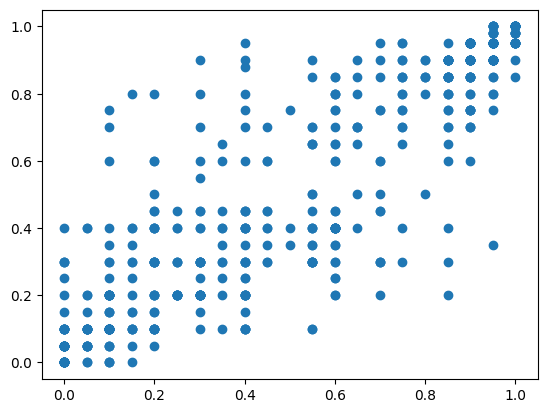

In [6]:
import matplotlib.pyplot as plt
plt.scatter(df["pro-score"].iloc[:500], df["flash-score"].iloc[:500])

# LDA

In [7]:
import re
from sklearn.feature_extraction.text import CountVectorizer

# Clean text
texts = df_train["symptom"].astype(str).tolist()
def simple_clean(t):
    t = t.lower()
    t = re.sub(r"[^a-z0-9\s'-]", " ", t)
    t = re.sub(r"\s+", " ", t).strip()
    return t
texts = [simple_clean(t) for t in texts]

# Bag-of-words (no TF-IDF for LDA)
vect = CountVectorizer(stop_words="english", min_df=5, max_df=0.9)
X = vect.fit_transform(texts)
vocab = vect.get_feature_names_out()

from sklearn.decomposition import LatentDirichletAllocation



results = []
for K in np.arange(2, 40):
    lda = LatentDirichletAllocation(n_components=K, random_state=42, max_iter=40, n_jobs=-1)
    lda.fit(X)
    ll = lda.score(X)          # higher is better
    perp = lda.perplexity(X)   # lower is better
    results.append((K, ll, perp))

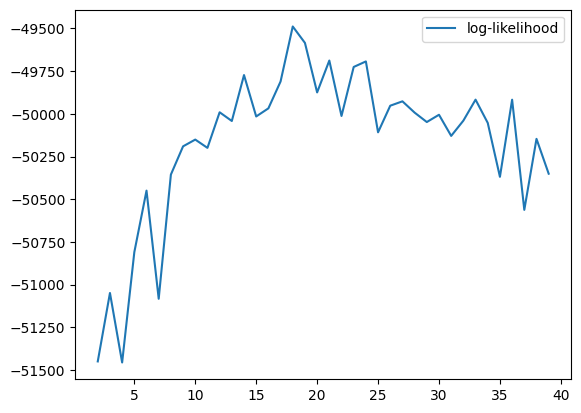

In [8]:
import matplotlib.pyplot as plt
plt.plot(np.arange(2, 40), [i[1] for i in results], label = "log-likelihood")
plt.legend()
plt.show()

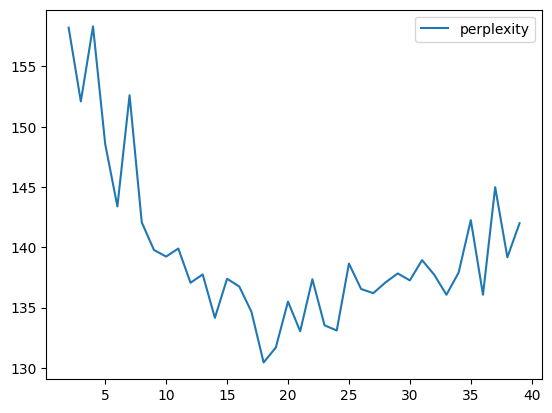

In [9]:
plt.plot(np.arange(2, 40), [i[2] for i in results], label = "perplexity")
plt.legend()
plt.show()

In [10]:
lda = LatentDirichletAllocation(n_components=18, random_state=42, max_iter=40, n_jobs=-1)
lda.fit(X)


LatentDirichletAllocation(max_iter=40, n_components=18, n_jobs=-1,
                          random_state=42)

In [11]:
texts = df_train["symptom"].astype(str).tolist()
def simple_clean(t):
    t = t.lower()
    t = re.sub(r"[^a-z0-9\s'-]", " ", t)
    t = re.sub(r"\s+", " ", t).strip()
    return t
texts = [simple_clean(t) for t in texts]

# Bag-of-words (no TF-IDF for LDA)
X = vect.transform(texts)
all_embedding = lda.transform(X)

# LAKCP

In [12]:
!pip install ternary
from LatentKernCP.lakcp import LAKCP


  Preparing metadata (setup.py) ... done
  Created wheel for ternary: filename=ternary-0.1-py3-none-any.whl size=1751 sha256=b1950426cf899785baff979dba7143ae57a087a9338e286f404fa40624a82d46
  Stored in directory: /root/.cache/pip/wheels/d7/6e/54/60848f233a06e5db63831ed34cf4210628ba15030f8b6b4fa3
Successfully built ternary


In [13]:
def compute_lambda(df, exception):
  lambdas = []
  for i in range(100):
    sub_df = df.iloc[(5 * i):(5 * (i + 1)),: ]

    sorted_df = sub_df.sort_values("flash-score")

    lambda_val = None

    for i, candidate in enumerate(sorted_df["flash-score"]):
        # Subset where flash-score >= candidate
        subset = sub_df.loc[sub_df["flash-score"] >= candidate]

        # Count exceptions (pro-score != 1)
        exceptions = (subset["pro-score"] < .5).sum()

        if exceptions <= exception:   # allow at most three exception
            lambda_val = candidate
            break
    if lambda_val is None:
      lambda_val = 1
    lambdas.append(lambda_val)

  return np.array(lambdas)


In [14]:
names = ["lambda1"]
exceptions = [1]
lambdas_ls = []
cutoffs = []
for i, name in enumerate(names):
  alpha = .1
  lambdas = compute_lambda(df, exceptions[i])
  Zcal = all_embedding[:100, :]
  Ztest =  all_embedding[100:, :]
  res_cal = lambdas


  print("Starting LAKCP...")
  lakcp = LAKCP(
      alpha=alpha,
      max_steps=200,
      eps=1e-03,
      tol=1e-06,
      thres=10.0,
      ridge=1e-08,
      start_side='left',
      gamma=None,
      gamma_grid=np.logspace(-1, 1, 30),
      randomize=False,
      verbose=False
  )

  # If you later add KMeans on Ztrain_pca (fit ONCE & save centroids), create one-hot Φ_cal/Φ_test.
  Phi_cal  = np.ones((Zcal.shape[0], 1))
  Phi_test = np.ones((Ztest.shape[0], 1))

  cutoffs_lakcp = lakcp.fit(Zcal, Phi_cal, res_cal.ravel(),
                            Ztest, Phi_test)

  # === LAKCP (CV) ====
  print("Starting LAKCP with CV...")
  lakcp_cv = LAKCP(
      alpha=alpha,
      max_steps=200,
      eps=1e-03,
      tol=1e-06,
      thres=10.0,
      ridge=1e-08,
      start_side='left',
      gamma=None,
      gamma_grid=np.logspace(-1, 1, 30),
      use_cv=True,
      randomize=True,
      verbose=False
  )
  cutoffs_lakcp_cv = lakcp_cv.fit(Zcal, Phi_cal, res_cal.ravel(),
                            Ztest, Phi_test)
  cutoffs.append(cutoffs_lakcp_cv[0])
  lambdas_ls.append(lambdas)


Starting LAKCP...
Starting LAKCP with CV...


In [15]:
df["lambda1"] = 0

for i in range(100):
  df.iloc[ (i * 5): ((i + 1) * 5) , 5] = lambdas_ls[0][i]

for i in range(100, 853):
  df.iloc[ (i * 5): ((i + 1) * 5) , 5] = cutoffs[0][i- 100]


/tmp/ipython-input-968324884.py:4: FutureWarning: Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value '0.1' has dtype incompatible with int64, please explicitly cast to a compatible dtype first.
  df.iloc[ (i * 5): ((i + 1) * 5) , 5] = lambdas_ls[0][i]


In [16]:
df.head(6)

,symptom,disease,pro-score,flash-score,label,lambda1
0,"The discomfort has been recurring daily, often...",cervical spondylosis,0.60,0.65,3,0.1
1,I've noticed some sensitivity to light and occ...,cervical spondylosis,0.55,0.30,3,0.1
2,"Occasionally, I experience tingling sensations...",cervical spondylosis,0.95,0.95,3,0.1
3,"My overall stamina has diminished, making even...",cervical spondylosis,0.10,0.10,3,0.1
4,These symptoms seem to improve temporarily whe...,cervical spondylosis,0.85,0.20,3,0.1
5,The rash seems to be spreading rapidly across ...,impetigo,0.40,0.70,12,0.7


In [17]:
ind = 819
df_train.iloc[ind, 1]

"I have a really bad cold. My nose is running and my eyes are all red and swollen. I've been coughing a lot and my chest feels really heavy. I can't smell anything and my muscles are really sore."

In [18]:
df.iloc[ind * 5: (ind + 1)*5, :]

,symptom,disease,pro-score,flash-score,label,lambda1
4095,My throat also feels raw andsf highly irritate...,common cold,-1.0,0.90,5,0.59909
4096,"I have developed a slight fever, and my body f...",common cold,-1.0,0.60,5,0.59909
4097,There’s a persistent dull headache seated arou...,common cold,-1.0,0.85,5,0.59909
4098,Sometimes I feel a mild dizziness when standin...,common cold,-1.0,0.50,5,0.59909
4099,"My skin overall appears pale and feels clammy,...",common cold,-1.0,0.20,5,0.59909


# Performance

In [ ]:
# Small LM fine-tune with LoRA (PEFT) — drop-in for your DatasetDict
# pip install transformers peft accelerate datasets bitsandbytes (if GPU + 4bit)

import numpy as np
from datasets import DatasetDict
from sklearn.metrics import accuracy_score, precision_recall_fscore_support

import torch
from transformers import (
    AutoTokenizer, AutoModelForSequenceClassification,
    DataCollatorWithPadding, Trainer, TrainingArguments, EarlyStoppingCallback
)
from peft import LoraConfig, get_peft_model, TaskType

def compute_metrics(eval_pred):
    logits, labels = eval_pred
    preds = logits.argmax(-1)
    acc = accuracy_score(labels, preds)
    p, r, f1, _ = precision_recall_fscore_support(labels, preds, average="weighted", zero_division=0)
    return {"accuracy": acc, "precision": p, "recall": r, "f1": f1}

def train_and_eval_small_lm_lora(
    dataset: DatasetDict,
    model_name: str = "distilbert-base-uncased",
    run_name: str = "small_lm_lora",
    max_length: int = 192,
    lora_r: int = 8,
    lora_alpha: int = 16,
    lora_dropout: float = 0.1,
    lr: float = 2e-4,
    batch_size: int = 32,
    num_epochs: int = 20,
):
    # infer num labels
    labels = list(set(dataset["train"]["label"]))
    label2id = {y:i for i,y in enumerate(sorted(labels))}
    id2label = {i:y for y,i in label2id.items()}

    tokenizer = AutoTokenizer.from_pretrained(model_name, use_fast=True)

    def preprocess(batch):
        y = [label2id[v] for v in batch["label"]]
        x = tokenizer(batch["symptom"], truncation=True, max_length=max_length)
        x["labels"] = y
        return x

    ds_proc = DatasetDict({
        split: ds.map(preprocess, batched=True, remove_columns=ds.column_names)
        for split, ds in dataset.items()
    })

    data_collator = DataCollatorWithPadding(tokenizer=tokenizer)

    base_model = AutoModelForSequenceClassification.from_pretrained(
        model_name,
        num_labels=len(label2id),
        id2label=id2label,
        label2id=label2id
    )

    # Set up LoRA on attention projections (common, lightweight)
    peft_cfg = LoraConfig(
        task_type=TaskType.SEQ_CLS,
        r=lora_r,
        lora_alpha=lora_alpha,
        lora_dropout=lora_dropout,
        target_modules=["q_lin","k_lin","v_lin","out_lin","query","key","value","dense"]  # robust across archs
    )
    model = get_peft_model(base_model, peft_cfg)

    # Training args with early stopping on your validation split
    args = TrainingArguments(
        output_dir=f"./runs/{run_name}",
        learning_rate=lr,
        per_device_train_batch_size=batch_size,
        per_device_eval_batch_size=batch_size,
        num_train_epochs=num_epochs,
        eval_strategy="epoch",
        save_strategy="epoch",
        load_best_model_at_end=True,
        metric_for_best_model="f1",
        greater_is_better=True,
        logging_steps=50,
        report_to="none",
        fp16=torch.cuda.is_available(),  # use fp16 if possible
        seed=42,
        disable_tqdm=True, # Add this line
    )

    trainer = Trainer(
        model=model,
        args=args,
        train_dataset=ds_proc["train"],
        eval_dataset=ds_proc["validation"],
        tokenizer=tokenizer,
        data_collator=data_collator,
        compute_metrics=compute_metrics
    )

    trainer.train()

    # Evaluate
    test_metrics = trainer.evaluate(ds_proc["test"])

    outdir = f"./runs/{run_name}"
    if os.path.exists(outdir):
        shutil.rmtree(outdir)  # removes the whole folder with checkpoints
        print(f"Deleted {outdir}")

    return {
        "test": {k: float(v) for k, v in test_metrics.items() if k.startswith("eval_")},
        "run_name": run_name,
        "model_name": model_name,
        "trainable_params": sum(p.numel() for p in model.parameters() if p.requires_grad)
    }

In [ ]:
import numpy as np
import pandas as pd
import shutil


final_res = []
for iii in range(20):
  np.random.seed( iii)

  first_100 = np.arange(100)

  random_400 = np.random.choice(
      np.arange(100, df_train.shape[0]),
      size=400,
      replace=False
  )

  selected_index = np.concatenate([first_100, random_400])
  print(sum(selected_index))
  df1 = df_train.iloc[selected_index, :][["symptom", "label"]]

  selected_index2 = np.concatenate([np.arange(5 * j, 5 * (j + 1)) for j in selected_index])
  print(sum(selected_index2))

  df_sub = df.iloc[selected_index2, :]


  df2 = df_sub[["symptom", "label"]]


  df3 = df_sub.loc[df_sub["flash-score"] >= 0.5, ["symptom", "label"]]

  df4 = df_sub.loc[ (df_sub["pro-score"] >= 0.5) | ((df_sub["pro-score"] == -1) & (df_sub["flash-score"] >= 0.5)), ["symptom", "label"]
  ]

  df5 = df_sub.loc[
      (df_sub["pro-score"] >= .5) |
      ((df_sub["pro-score"] == -1) & (df_sub["flash-score"] >= df_sub["lambda1"])),
      ["symptom", "label"]
  ]


  dfs = [df1, df2, df3, df4, df5]
  print(df1.shape)
  print(df2.shape)
  print(df3.shape)
  print(df4.shape)
  print(df5.shape)
  datasets = []

  for i, dff in enumerate(dfs):

    if i == 0:
      cur_df = dff
    else:
      cur_df = pd.concat((df1, dff), axis = 0, ignore_index = True)
    datasets.append(DatasetDict({
        "train": Dataset.from_pandas(cur_df[["symptom", "label"]]),
        "validation": Dataset.from_pandas(df_train.iloc[400:500, :][["symptom", "label"]]),
        "test": Dataset.from_pandas(df_test[["symptom", "label"]]),
    }))


  all_results = []
  for i, ds in enumerate(datasets):
      res = train_and_eval_small_lm_lora(ds, run_name=f"tfidf_logreg_run_{i}")
      all_results.append(res["test"])
      print(i)
  final_res.append(all_results)

195853
4901325
(500, 2)
(2500, 2)
(1122, 2)
(1145, 2)
(873, 2)


/usr/local/lib/python3.12/dist-packages/huggingface_hub/utils/_auth.py:94: UserWarning: 
The secret `HF_TOKEN` does not exist in your Colab secrets.
To authenticate with the Hugging Face Hub, create a token in your settings tab (https://huggingface.co/settings/tokens), set it as secret in your Google Colab and restart your session.
You will be able to reuse this secret in all of your notebooks.
Please note that authentication is recommended but still optional to access public models or datasets.
  warnings.warn(


tokenizer_config.json:   0%|          | 0.00/48.0 [00:00<?, ?B/s]

config.json:   0%|          | 0.00/483 [00:00<?, ?B/s]

vocab.txt:   0%|          | 0.00/232k [00:00<?, ?B/s]

tokenizer.json:   0%|          | 0.00/466k [00:00<?, ?B/s]

Map:   0%|          | 0/500 [00:00<?, ? examples/s]

Map:   0%|          | 0/100 [00:00<?, ? examples/s]

Map:   0%|          | 0/212 [00:00<?, ? examples/s]

model.safetensors:   0%|          | 0.00/268M [00:00<?, ?B/s]

Some weights of DistilBertForSequenceClassification were not initialized from the model checkpoint at distilbert-base-uncased and are newly initialized: ['classifier.bias', 'classifier.weight', 'pre_classifier.bias', 'pre_classifier.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.
/tmp/ipython-input-2730908022.py:90: FutureWarning: `tokenizer` is deprecated and will be removed in version 5.0.0 for `Trainer.__init__`. Use `processing_class` instead.
  trainer = Trainer(


{'eval_loss': 3.0341014862060547, 'eval_accuracy': 0.2, 'eval_precision': 0.196604786262331, 'eval_recall': 0.2, 'eval_f1': 0.12993783993783992, 'eval_runtime': 0.1129, 'eval_samples_per_second': 885.552, 'eval_steps_per_second': 35.422, 'epoch': 1.0}
{'eval_loss': 2.8804492950439453, 'eval_accuracy': 0.38, 'eval_precision': 0.28205509987088934, 'eval_recall': 0.38, 'eval_f1': 0.2779864357864358, 'eval_runtime': 0.0718, 'eval_samples_per_second': 1393.082, 'eval_steps_per_second': 55.723, 'epoch': 2.0}
{'eval_loss': 2.3876659870147705, 'eval_accuracy': 0.55, 'eval_precision': 0.5551862745098038, 'eval_recall': 0.55, 'eval_f1': 0.4857351303667093, 'eval_runtime': 0.0757, 'eval_samples_per_second': 1320.924, 'eval_steps_per_second': 52.837, 'epoch': 3.0}
{'loss': 2.9274, 'grad_norm': 2.1617588996887207, 'learning_rate': 0.000169375, 'epoch': 3.125}
{'eval_loss': 1.8158886432647705, 'eval_accuracy': 0.7, 'eval_precision': 0.7159635364635365, 'eval_recall': 0.7, 'eval_f1': 0.66356045270518

Map:   0%|          | 0/3000 [00:00<?, ? examples/s]

Map:   0%|          | 0/100 [00:00<?, ? examples/s]

Map:   0%|          | 0/212 [00:00<?, ? examples/s]

Some weights of DistilBertForSequenceClassification were not initialized from the model checkpoint at distilbert-base-uncased and are newly initialized: ['classifier.bias', 'classifier.weight', 'pre_classifier.bias', 'pre_classifier.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.
/tmp/ipython-input-2730908022.py:90: FutureWarning: `tokenizer` is deprecated and will be removed in version 5.0.0 for `Trainer.__init__`. Use `processing_class` instead.
  trainer = Trainer(


{'loss': 3.0416, 'grad_norm': 1.516571044921875, 'learning_rate': 0.0001947872340425532, 'epoch': 0.5319148936170213}
{'eval_loss': 2.0843067169189453, 'eval_accuracy': 0.41, 'eval_precision': 0.4671702741702741, 'eval_recall': 0.41, 'eval_f1': 0.3703738232273701, 'eval_runtime': 0.0704, 'eval_samples_per_second': 1420.652, 'eval_steps_per_second': 56.826, 'epoch': 1.0}
{'loss': 2.6217, 'grad_norm': 3.050509214401245, 'learning_rate': 0.000189468085106383, 'epoch': 1.0638297872340425}
{'loss': 2.2456, 'grad_norm': 3.407904863357544, 'learning_rate': 0.00018414893617021277, 'epoch': 1.5957446808510638}
{'eval_loss': 1.353173851966858, 'eval_accuracy': 0.58, 'eval_precision': 0.671147435897436, 'eval_recall': 0.58, 'eval_f1': 0.556251012145749, 'eval_runtime': 0.0684, 'eval_samples_per_second': 1462.108, 'eval_steps_per_second': 58.484, 'epoch': 2.0}
{'loss': 2.0147, 'grad_norm': 3.309947967529297, 'learning_rate': 0.00017882978723404255, 'epoch': 2.127659574468085}
{'loss': 1.8829, 'gra

Map:   0%|          | 0/1622 [00:00<?, ? examples/s]

Map:   0%|          | 0/100 [00:00<?, ? examples/s]

Map:   0%|          | 0/212 [00:00<?, ? examples/s]

Some weights of DistilBertForSequenceClassification were not initialized from the model checkpoint at distilbert-base-uncased and are newly initialized: ['classifier.bias', 'classifier.weight', 'pre_classifier.bias', 'pre_classifier.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.
/tmp/ipython-input-2730908022.py:90: FutureWarning: `tokenizer` is deprecated and will be removed in version 5.0.0 for `Trainer.__init__`. Use `processing_class` instead.
  trainer = Trainer(


{'loss': 2.9672, 'grad_norm': 2.5675132274627686, 'learning_rate': 0.0001903921568627451, 'epoch': 0.9803921568627451}
{'eval_loss': 2.5879688262939453, 'eval_accuracy': 0.33, 'eval_precision': 0.20408521303258145, 'eval_recall': 0.33, 'eval_f1': 0.22004522726261858, 'eval_runtime': 0.0706, 'eval_samples_per_second': 1416.636, 'eval_steps_per_second': 56.665, 'epoch': 1.0}
{'loss': 2.2044, 'grad_norm': 3.3759584426879883, 'learning_rate': 0.00018058823529411766, 'epoch': 1.9607843137254903}
{'eval_loss': 1.5735303163528442, 'eval_accuracy': 0.57, 'eval_precision': 0.6097380952380953, 'eval_recall': 0.57, 'eval_f1': 0.5332760115701292, 'eval_runtime': 0.0698, 'eval_samples_per_second': 1432.505, 'eval_steps_per_second': 57.3, 'epoch': 2.0}
{'loss': 1.5883, 'grad_norm': 3.9362974166870117, 'learning_rate': 0.0001707843137254902, 'epoch': 2.9411764705882355}
{'eval_loss': 1.037290096282959, 'eval_accuracy': 0.7, 'eval_precision': 0.7776428571428571, 'eval_recall': 0.7, 'eval_f1': 0.681960

Map:   0%|          | 0/1645 [00:00<?, ? examples/s]

Map:   0%|          | 0/100 [00:00<?, ? examples/s]

Map:   0%|          | 0/212 [00:00<?, ? examples/s]

Some weights of DistilBertForSequenceClassification were not initialized from the model checkpoint at distilbert-base-uncased and are newly initialized: ['classifier.bias', 'classifier.weight', 'pre_classifier.bias', 'pre_classifier.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.
/tmp/ipython-input-2730908022.py:90: FutureWarning: `tokenizer` is deprecated and will be removed in version 5.0.0 for `Trainer.__init__`. Use `processing_class` instead.
  trainer = Trainer(


{'loss': 2.9617, 'grad_norm': 2.307628631591797, 'learning_rate': 0.00019057692307692308, 'epoch': 0.9615384615384616}
{'eval_loss': 2.563417911529541, 'eval_accuracy': 0.36, 'eval_precision': 0.24272852001799372, 'eval_recall': 0.36, 'eval_f1': 0.27055622865506584, 'eval_runtime': 0.069, 'eval_samples_per_second': 1450.152, 'eval_steps_per_second': 58.006, 'epoch': 1.0}
{'loss': 2.2213, 'grad_norm': 3.4529929161071777, 'learning_rate': 0.00018096153846153848, 'epoch': 1.9230769230769231}
{'eval_loss': 1.519406795501709, 'eval_accuracy': 0.6, 'eval_precision': 0.5992272727272727, 'eval_recall': 0.6, 'eval_f1': 0.5538667166167166, 'eval_runtime': 0.0708, 'eval_samples_per_second': 1413.375, 'eval_steps_per_second': 56.535, 'epoch': 2.0}
{'loss': 1.6267, 'grad_norm': 2.7800421714782715, 'learning_rate': 0.00017134615384615384, 'epoch': 2.8846153846153846}
{'eval_loss': 0.9803167581558228, 'eval_accuracy': 0.79, 'eval_precision': 0.8306904761904761, 'eval_recall': 0.79, 'eval_f1': 0.77061

Map:   0%|          | 0/1373 [00:00<?, ? examples/s]

Map:   0%|          | 0/100 [00:00<?, ? examples/s]

Map:   0%|          | 0/212 [00:00<?, ? examples/s]

Some weights of DistilBertForSequenceClassification were not initialized from the model checkpoint at distilbert-base-uncased and are newly initialized: ['classifier.bias', 'classifier.weight', 'pre_classifier.bias', 'pre_classifier.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.
/tmp/ipython-input-2730908022.py:90: FutureWarning: `tokenizer` is deprecated and will be removed in version 5.0.0 for `Trainer.__init__`. Use `processing_class` instead.
  trainer = Trainer(


{'eval_loss': 2.829335927963257, 'eval_accuracy': 0.26, 'eval_precision': 0.1783315295815296, 'eval_recall': 0.26, 'eval_f1': 0.18706418219461696, 'eval_runtime': 0.0711, 'eval_samples_per_second': 1407.045, 'eval_steps_per_second': 56.282, 'epoch': 1.0}
{'loss': 2.9457, 'grad_norm': 2.4201862812042236, 'learning_rate': 0.00018860465116279072, 'epoch': 1.1627906976744187}
{'eval_loss': 1.7283618450164795, 'eval_accuracy': 0.51, 'eval_precision': 0.5330924630924632, 'eval_recall': 0.51, 'eval_f1': 0.4651875901875902, 'eval_runtime': 0.0727, 'eval_samples_per_second': 1375.98, 'eval_steps_per_second': 55.039, 'epoch': 2.0}
{'loss': 2.0673, 'grad_norm': 3.081448793411255, 'learning_rate': 0.00017697674418604652, 'epoch': 2.3255813953488373}
{'eval_loss': 1.098250150680542, 'eval_accuracy': 0.72, 'eval_precision': 0.7540833333333333, 'eval_recall': 0.72, 'eval_f1': 0.7037447274947275, 'eval_runtime': 0.0745, 'eval_samples_per_second': 1341.928, 'eval_steps_per_second': 53.677, 'epoch': 3.0

Map:   0%|          | 0/500 [00:00<?, ? examples/s]

Map:   0%|          | 0/100 [00:00<?, ? examples/s]

Map:   0%|          | 0/212 [00:00<?, ? examples/s]

Some weights of DistilBertForSequenceClassification were not initialized from the model checkpoint at distilbert-base-uncased and are newly initialized: ['classifier.bias', 'classifier.weight', 'pre_classifier.bias', 'pre_classifier.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.
/tmp/ipython-input-2730908022.py:90: FutureWarning: `tokenizer` is deprecated and will be removed in version 5.0.0 for `Trainer.__init__`. Use `processing_class` instead.
  trainer = Trainer(


{'eval_loss': 3.0353124141693115, 'eval_accuracy': 0.12, 'eval_precision': 0.07165217391304347, 'eval_recall': 0.12, 'eval_f1': 0.07438356164383561, 'eval_runtime': 0.0708, 'eval_samples_per_second': 1412.675, 'eval_steps_per_second': 56.507, 'epoch': 1.0}
{'eval_loss': 2.847910165786743, 'eval_accuracy': 0.28, 'eval_precision': 0.16303046040147806, 'eval_recall': 0.28, 'eval_f1': 0.15455221107395017, 'eval_runtime': 0.0753, 'eval_samples_per_second': 1327.711, 'eval_steps_per_second': 53.108, 'epoch': 2.0}
{'eval_loss': 2.341923713684082, 'eval_accuracy': 0.48, 'eval_precision': 0.5171601104209799, 'eval_recall': 0.48, 'eval_f1': 0.4042028994901045, 'eval_runtime': 0.0751, 'eval_samples_per_second': 1331.55, 'eval_steps_per_second': 53.262, 'epoch': 3.0}
{'loss': 2.8904, 'grad_norm': 2.5102522373199463, 'learning_rate': 0.000169375, 'epoch': 3.125}
{'eval_loss': 1.807165503501892, 'eval_accuracy': 0.65, 'eval_precision': 0.6137460317460317, 'eval_recall': 0.65, 'eval_f1': 0.5966704450

Map:   0%|          | 0/3000 [00:00<?, ? examples/s]

Map:   0%|          | 0/100 [00:00<?, ? examples/s]

Map:   0%|          | 0/212 [00:00<?, ? examples/s]

Some weights of DistilBertForSequenceClassification were not initialized from the model checkpoint at distilbert-base-uncased and are newly initialized: ['classifier.bias', 'classifier.weight', 'pre_classifier.bias', 'pre_classifier.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.
/tmp/ipython-input-2730908022.py:90: FutureWarning: `tokenizer` is deprecated and will be removed in version 5.0.0 for `Trainer.__init__`. Use `processing_class` instead.
  trainer = Trainer(


{'loss': 3.0246, 'grad_norm': 1.7946207523345947, 'learning_rate': 0.0001947872340425532, 'epoch': 0.5319148936170213}
{'eval_loss': 2.1415088176727295, 'eval_accuracy': 0.47, 'eval_precision': 0.41877387189693693, 'eval_recall': 0.47, 'eval_f1': 0.387534475328593, 'eval_runtime': 0.0713, 'eval_samples_per_second': 1403.317, 'eval_steps_per_second': 56.133, 'epoch': 1.0}
{'loss': 2.6328, 'grad_norm': 2.9947590827941895, 'learning_rate': 0.000189468085106383, 'epoch': 1.0638297872340425}
{'loss': 2.2398, 'grad_norm': 3.400148391723633, 'learning_rate': 0.00018414893617021277, 'epoch': 1.5957446808510638}
{'eval_loss': 1.2107983827590942, 'eval_accuracy': 0.75, 'eval_precision': 0.8062316017316017, 'eval_recall': 0.75, 'eval_f1': 0.7332118159618158, 'eval_runtime': 0.0754, 'eval_samples_per_second': 1325.499, 'eval_steps_per_second': 53.02, 'epoch': 2.0}
{'loss': 2.0871, 'grad_norm': 3.192046642303467, 'learning_rate': 0.00017882978723404255, 'epoch': 2.127659574468085}
{'loss': 1.9293, 

Map:   0%|          | 0/1643 [00:00<?, ? examples/s]

Map:   0%|          | 0/100 [00:00<?, ? examples/s]

Map:   0%|          | 0/212 [00:00<?, ? examples/s]

Some weights of DistilBertForSequenceClassification were not initialized from the model checkpoint at distilbert-base-uncased and are newly initialized: ['classifier.bias', 'classifier.weight', 'pre_classifier.bias', 'pre_classifier.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.
/tmp/ipython-input-2730908022.py:90: FutureWarning: `tokenizer` is deprecated and will be removed in version 5.0.0 for `Trainer.__init__`. Use `processing_class` instead.
  trainer = Trainer(


{'loss': 2.9594, 'grad_norm': 1.9459844827651978, 'learning_rate': 0.00019057692307692308, 'epoch': 0.9615384615384616}
{'eval_loss': 2.654531240463257, 'eval_accuracy': 0.29, 'eval_precision': 0.2016945228684359, 'eval_recall': 0.29, 'eval_f1': 0.188349376114082, 'eval_runtime': 0.0715, 'eval_samples_per_second': 1398.306, 'eval_steps_per_second': 55.932, 'epoch': 1.0}
{'loss': 2.2467, 'grad_norm': 2.8389992713928223, 'learning_rate': 0.00018096153846153848, 'epoch': 1.9230769230769231}
{'eval_loss': 1.543542504310608, 'eval_accuracy': 0.63, 'eval_precision': 0.6295595238095238, 'eval_recall': 0.63, 'eval_f1': 0.598476800976801, 'eval_runtime': 0.0721, 'eval_samples_per_second': 1387.827, 'eval_steps_per_second': 55.513, 'epoch': 2.0}
{'loss': 1.6186, 'grad_norm': 3.641049861907959, 'learning_rate': 0.00017134615384615384, 'epoch': 2.8846153846153846}
{'eval_loss': 0.9760125875473022, 'eval_accuracy': 0.78, 'eval_precision': 0.8051547619047618, 'eval_recall': 0.78, 'eval_f1': 0.755792

Map:   0%|          | 0/1666 [00:00<?, ? examples/s]

Map:   0%|          | 0/100 [00:00<?, ? examples/s]

Map:   0%|          | 0/212 [00:00<?, ? examples/s]

Some weights of DistilBertForSequenceClassification were not initialized from the model checkpoint at distilbert-base-uncased and are newly initialized: ['classifier.bias', 'classifier.weight', 'pre_classifier.bias', 'pre_classifier.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.
/tmp/ipython-input-2730908022.py:90: FutureWarning: `tokenizer` is deprecated and will be removed in version 5.0.0 for `Trainer.__init__`. Use `processing_class` instead.
  trainer = Trainer(


{'loss': 2.9545, 'grad_norm': 1.9443278312683105, 'learning_rate': 0.00019075471698113208, 'epoch': 0.9433962264150944}
{'eval_loss': 2.5987110137939453, 'eval_accuracy': 0.29, 'eval_precision': 0.22182352941176472, 'eval_recall': 0.29, 'eval_f1': 0.19381313131313133, 'eval_runtime': 0.0798, 'eval_samples_per_second': 1252.543, 'eval_steps_per_second': 50.102, 'epoch': 1.0}
{'loss': 2.2291, 'grad_norm': 3.4899919033050537, 'learning_rate': 0.00018132075471698114, 'epoch': 1.8867924528301887}
{'eval_loss': 1.5783472061157227, 'eval_accuracy': 0.53, 'eval_precision': 0.5837756410256411, 'eval_recall': 0.53, 'eval_f1': 0.4668263958263958, 'eval_runtime': 0.0694, 'eval_samples_per_second': 1440.891, 'eval_steps_per_second': 57.636, 'epoch': 2.0}
{'loss': 1.6402, 'grad_norm': 4.892234802246094, 'learning_rate': 0.0001718867924528302, 'epoch': 2.830188679245283}
{'eval_loss': 1.0126941204071045, 'eval_accuracy': 0.78, 'eval_precision': 0.8158809523809524, 'eval_recall': 0.78, 'eval_f1': 0.75

Map:   0%|          | 0/1375 [00:00<?, ? examples/s]

Map:   0%|          | 0/100 [00:00<?, ? examples/s]

Map:   0%|          | 0/212 [00:00<?, ? examples/s]

Some weights of DistilBertForSequenceClassification were not initialized from the model checkpoint at distilbert-base-uncased and are newly initialized: ['classifier.bias', 'classifier.weight', 'pre_classifier.bias', 'pre_classifier.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.
/tmp/ipython-input-2730908022.py:90: FutureWarning: `tokenizer` is deprecated and will be removed in version 5.0.0 for `Trainer.__init__`. Use `processing_class` instead.
  trainer = Trainer(


{'eval_loss': 2.833681583404541, 'eval_accuracy': 0.29, 'eval_precision': 0.18371814811793602, 'eval_recall': 0.29, 'eval_f1': 0.18390919225701835, 'eval_runtime': 0.0724, 'eval_samples_per_second': 1382.019, 'eval_steps_per_second': 55.281, 'epoch': 1.0}
{'loss': 2.9173, 'grad_norm': 2.780548334121704, 'learning_rate': 0.00018860465116279072, 'epoch': 1.1627906976744187}
{'eval_loss': 1.7797192335128784, 'eval_accuracy': 0.53, 'eval_precision': 0.519968253968254, 'eval_recall': 0.53, 'eval_f1': 0.46588026505658076, 'eval_runtime': 0.0715, 'eval_samples_per_second': 1397.836, 'eval_steps_per_second': 55.913, 'epoch': 2.0}
{'loss': 2.0783, 'grad_norm': 3.7289860248565674, 'learning_rate': 0.00017697674418604652, 'epoch': 2.3255813953488373}
{'eval_loss': 1.0574829578399658, 'eval_accuracy': 0.78, 'eval_precision': 0.8054404761904762, 'eval_recall': 0.78, 'eval_f1': 0.7521693574743111, 'eval_runtime': 0.0727, 'eval_samples_per_second': 1376.427, 'eval_steps_per_second': 55.057, 'epoch': 

Map:   0%|          | 0/500 [00:00<?, ? examples/s]

Map:   0%|          | 0/100 [00:00<?, ? examples/s]

Map:   0%|          | 0/212 [00:00<?, ? examples/s]

Some weights of DistilBertForSequenceClassification were not initialized from the model checkpoint at distilbert-base-uncased and are newly initialized: ['classifier.bias', 'classifier.weight', 'pre_classifier.bias', 'pre_classifier.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.
/tmp/ipython-input-2730908022.py:90: FutureWarning: `tokenizer` is deprecated and will be removed in version 5.0.0 for `Trainer.__init__`. Use `processing_class` instead.
  trainer = Trainer(


{'eval_loss': 3.0359766483306885, 'eval_accuracy': 0.04, 'eval_precision': 0.001649484536082474, 'eval_recall': 0.04, 'eval_f1': 0.0031683168316831685, 'eval_runtime': 0.0739, 'eval_samples_per_second': 1353.726, 'eval_steps_per_second': 54.149, 'epoch': 1.0}
{'eval_loss': 2.8701953887939453, 'eval_accuracy': 0.25, 'eval_precision': 0.18624542124542123, 'eval_recall': 0.25, 'eval_f1': 0.17328571428571427, 'eval_runtime': 0.0701, 'eval_samples_per_second': 1427.513, 'eval_steps_per_second': 57.101, 'epoch': 2.0}
{'eval_loss': 2.3529393672943115, 'eval_accuracy': 0.52, 'eval_precision': 0.46892736185383244, 'eval_recall': 0.52, 'eval_f1': 0.4297643467643467, 'eval_runtime': 0.073, 'eval_samples_per_second': 1370.8, 'eval_steps_per_second': 54.832, 'epoch': 3.0}
{'loss': 2.9004, 'grad_norm': 2.2663300037384033, 'learning_rate': 0.000169375, 'epoch': 3.125}
{'eval_loss': 1.8033642768859863, 'eval_accuracy': 0.61, 'eval_precision': 0.6576617647058823, 'eval_recall': 0.61, 'eval_f1': 0.58060

Map:   0%|          | 0/3000 [00:00<?, ? examples/s]

Map:   0%|          | 0/100 [00:00<?, ? examples/s]

Map:   0%|          | 0/212 [00:00<?, ? examples/s]

Some weights of DistilBertForSequenceClassification were not initialized from the model checkpoint at distilbert-base-uncased and are newly initialized: ['classifier.bias', 'classifier.weight', 'pre_classifier.bias', 'pre_classifier.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.
/tmp/ipython-input-2730908022.py:90: FutureWarning: `tokenizer` is deprecated and will be removed in version 5.0.0 for `Trainer.__init__`. Use `processing_class` instead.
  trainer = Trainer(


{'loss': 3.0367, 'grad_norm': 1.600106120109558, 'learning_rate': 0.0001947872340425532, 'epoch': 0.5319148936170213}
{'eval_loss': 2.1043457984924316, 'eval_accuracy': 0.58, 'eval_precision': 0.553680402930403, 'eval_recall': 0.58, 'eval_f1': 0.5457325321737087, 'eval_runtime': 0.0715, 'eval_samples_per_second': 1399.146, 'eval_steps_per_second': 55.966, 'epoch': 1.0}
{'loss': 2.6747, 'grad_norm': 2.8442373275756836, 'learning_rate': 0.000189468085106383, 'epoch': 1.0638297872340425}
{'loss': 2.2457, 'grad_norm': 2.9799771308898926, 'learning_rate': 0.00018414893617021277, 'epoch': 1.5957446808510638}
{'eval_loss': 1.2369701862335205, 'eval_accuracy': 0.73, 'eval_precision': 0.7903333333333333, 'eval_recall': 0.73, 'eval_f1': 0.7201927283243071, 'eval_runtime': 0.0704, 'eval_samples_per_second': 1419.724, 'eval_steps_per_second': 56.789, 'epoch': 2.0}
{'loss': 2.0509, 'grad_norm': 3.7760162353515625, 'learning_rate': 0.00017882978723404255, 'epoch': 2.127659574468085}
{'loss': 1.8687,

Map:   0%|          | 0/1611 [00:00<?, ? examples/s]

Map:   0%|          | 0/100 [00:00<?, ? examples/s]

Map:   0%|          | 0/212 [00:00<?, ? examples/s]

Some weights of DistilBertForSequenceClassification were not initialized from the model checkpoint at distilbert-base-uncased and are newly initialized: ['classifier.bias', 'classifier.weight', 'pre_classifier.bias', 'pre_classifier.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.
/tmp/ipython-input-2730908022.py:90: FutureWarning: `tokenizer` is deprecated and will be removed in version 5.0.0 for `Trainer.__init__`. Use `processing_class` instead.
  trainer = Trainer(


{'loss': 2.9494, 'grad_norm': 2.6880946159362793, 'learning_rate': 0.0001903921568627451, 'epoch': 0.9803921568627451}
{'eval_loss': 2.6149022579193115, 'eval_accuracy': 0.31, 'eval_precision': 0.26027513227513227, 'eval_recall': 0.31, 'eval_f1': 0.22523147440794497, 'eval_runtime': 0.0721, 'eval_samples_per_second': 1386.199, 'eval_steps_per_second': 55.448, 'epoch': 1.0}
{'loss': 2.1799, 'grad_norm': 3.161670684814453, 'learning_rate': 0.00018058823529411766, 'epoch': 1.9607843137254903}
{'eval_loss': 1.5303515195846558, 'eval_accuracy': 0.56, 'eval_precision': 0.5222777777777778, 'eval_recall': 0.56, 'eval_f1': 0.5155202575202575, 'eval_runtime': 0.0767, 'eval_samples_per_second': 1303.384, 'eval_steps_per_second': 52.135, 'epoch': 2.0}
{'loss': 1.5665, 'grad_norm': 3.378864049911499, 'learning_rate': 0.0001707843137254902, 'epoch': 2.9411764705882355}
{'eval_loss': 1.044816255569458, 'eval_accuracy': 0.78, 'eval_precision': 0.8551666666666666, 'eval_recall': 0.78, 'eval_f1': 0.7705

Map:   0%|          | 0/1634 [00:00<?, ? examples/s]

Map:   0%|          | 0/100 [00:00<?, ? examples/s]

Map:   0%|          | 0/212 [00:00<?, ? examples/s]

Some weights of DistilBertForSequenceClassification were not initialized from the model checkpoint at distilbert-base-uncased and are newly initialized: ['classifier.bias', 'classifier.weight', 'pre_classifier.bias', 'pre_classifier.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.
/tmp/ipython-input-2730908022.py:90: FutureWarning: `tokenizer` is deprecated and will be removed in version 5.0.0 for `Trainer.__init__`. Use `processing_class` instead.
  trainer = Trainer(


{'loss': 2.9724, 'grad_norm': 2.184051752090454, 'learning_rate': 0.00019057692307692308, 'epoch': 0.9615384615384616}
{'eval_loss': 2.5605762004852295, 'eval_accuracy': 0.24, 'eval_precision': 0.111396632996633, 'eval_recall': 0.24, 'eval_f1': 0.12328506787330318, 'eval_runtime': 0.0718, 'eval_samples_per_second': 1392.18, 'eval_steps_per_second': 55.687, 'epoch': 1.0}
{'loss': 2.2359, 'grad_norm': 3.445552349090576, 'learning_rate': 0.00018096153846153848, 'epoch': 1.9230769230769231}
{'eval_loss': 1.5728881359100342, 'eval_accuracy': 0.53, 'eval_precision': 0.618393328893329, 'eval_recall': 0.53, 'eval_f1': 0.508326245649775, 'eval_runtime': 0.0706, 'eval_samples_per_second': 1416.454, 'eval_steps_per_second': 56.658, 'epoch': 2.0}
{'loss': 1.6151, 'grad_norm': 3.747185468673706, 'learning_rate': 0.00017134615384615384, 'epoch': 2.8846153846153846}
{'eval_loss': 0.9891253709793091, 'eval_accuracy': 0.76, 'eval_precision': 0.7405476190476189, 'eval_recall': 0.76, 'eval_f1': 0.7265171

Map:   0%|          | 0/1369 [00:00<?, ? examples/s]

Map:   0%|          | 0/100 [00:00<?, ? examples/s]

Map:   0%|          | 0/212 [00:00<?, ? examples/s]

Some weights of DistilBertForSequenceClassification were not initialized from the model checkpoint at distilbert-base-uncased and are newly initialized: ['classifier.bias', 'classifier.weight', 'pre_classifier.bias', 'pre_classifier.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.
/tmp/ipython-input-2730908022.py:90: FutureWarning: `tokenizer` is deprecated and will be removed in version 5.0.0 for `Trainer.__init__`. Use `processing_class` instead.
  trainer = Trainer(


{'eval_loss': 2.886474609375, 'eval_accuracy': 0.18, 'eval_precision': 0.10043706293706295, 'eval_recall': 0.18, 'eval_f1': 0.10389802789802788, 'eval_runtime': 0.0733, 'eval_samples_per_second': 1363.859, 'eval_steps_per_second': 54.554, 'epoch': 1.0}
{'loss': 2.9447, 'grad_norm': 2.0999643802642822, 'learning_rate': 0.00018860465116279072, 'epoch': 1.1627906976744187}
{'eval_loss': 1.7855480909347534, 'eval_accuracy': 0.51, 'eval_precision': 0.398021645021645, 'eval_recall': 0.51, 'eval_f1': 0.42586367880485526, 'eval_runtime': 0.0728, 'eval_samples_per_second': 1373.052, 'eval_steps_per_second': 54.922, 'epoch': 2.0}
{'loss': 2.1128, 'grad_norm': 3.146347999572754, 'learning_rate': 0.00017697674418604652, 'epoch': 2.3255813953488373}
{'eval_loss': 1.0887212753295898, 'eval_accuracy': 0.77, 'eval_precision': 0.771512987012987, 'eval_recall': 0.77, 'eval_f1': 0.7391324508824509, 'eval_runtime': 0.0703, 'eval_samples_per_second': 1422.415, 'eval_steps_per_second': 56.897, 'epoch': 3.0}

Map:   0%|          | 0/500 [00:00<?, ? examples/s]

Map:   0%|          | 0/100 [00:00<?, ? examples/s]

Map:   0%|          | 0/212 [00:00<?, ? examples/s]

Some weights of DistilBertForSequenceClassification were not initialized from the model checkpoint at distilbert-base-uncased and are newly initialized: ['classifier.bias', 'classifier.weight', 'pre_classifier.bias', 'pre_classifier.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.
/tmp/ipython-input-2730908022.py:90: FutureWarning: `tokenizer` is deprecated and will be removed in version 5.0.0 for `Trainer.__init__`. Use `processing_class` instead.
  trainer = Trainer(


{'eval_loss': 3.0558788776397705, 'eval_accuracy': 0.08, 'eval_precision': 0.033771929824561404, 'eval_recall': 0.08, 'eval_f1': 0.036222222222222225, 'eval_runtime': 0.0698, 'eval_samples_per_second': 1433.45, 'eval_steps_per_second': 57.338, 'epoch': 1.0}
{'eval_loss': 2.931406259536743, 'eval_accuracy': 0.17, 'eval_precision': 0.2839855072463768, 'eval_recall': 0.17, 'eval_f1': 0.14752425428452826, 'eval_runtime': 0.0724, 'eval_samples_per_second': 1380.509, 'eval_steps_per_second': 55.22, 'epoch': 2.0}
{'eval_loss': 2.497675895690918, 'eval_accuracy': 0.38, 'eval_precision': 0.41232142857142856, 'eval_recall': 0.38, 'eval_f1': 0.30794724690514164, 'eval_runtime': 0.0771, 'eval_samples_per_second': 1296.287, 'eval_steps_per_second': 51.851, 'epoch': 3.0}
{'loss': 2.9363, 'grad_norm': 2.297840118408203, 'learning_rate': 0.000169375, 'epoch': 3.125}
{'eval_loss': 1.9622339010238647, 'eval_accuracy': 0.62, 'eval_precision': 0.7377142857142859, 'eval_recall': 0.62, 'eval_f1': 0.59650476

Map:   0%|          | 0/3000 [00:00<?, ? examples/s]

Map:   0%|          | 0/100 [00:00<?, ? examples/s]

Map:   0%|          | 0/212 [00:00<?, ? examples/s]

Some weights of DistilBertForSequenceClassification were not initialized from the model checkpoint at distilbert-base-uncased and are newly initialized: ['classifier.bias', 'classifier.weight', 'pre_classifier.bias', 'pre_classifier.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.
/tmp/ipython-input-2730908022.py:90: FutureWarning: `tokenizer` is deprecated and will be removed in version 5.0.0 for `Trainer.__init__`. Use `processing_class` instead.
  trainer = Trainer(


{'loss': 3.0378, 'grad_norm': 1.5609557628631592, 'learning_rate': 0.0001947872340425532, 'epoch': 0.5319148936170213}
{'eval_loss': 2.096122980117798, 'eval_accuracy': 0.39, 'eval_precision': 0.34463636363636363, 'eval_recall': 0.39, 'eval_f1': 0.31656945505474915, 'eval_runtime': 0.0713, 'eval_samples_per_second': 1402.613, 'eval_steps_per_second': 56.105, 'epoch': 1.0}
{'loss': 2.6577, 'grad_norm': 2.9062716960906982, 'learning_rate': 0.000189468085106383, 'epoch': 1.0638297872340425}
{'loss': 2.2289, 'grad_norm': 3.163550615310669, 'learning_rate': 0.00018414893617021277, 'epoch': 1.5957446808510638}
{'eval_loss': 1.2806799411773682, 'eval_accuracy': 0.6, 'eval_precision': 0.6146948051948052, 'eval_recall': 0.6, 'eval_f1': 0.5495794483294483, 'eval_runtime': 0.0735, 'eval_samples_per_second': 1361.319, 'eval_steps_per_second': 54.453, 'epoch': 2.0}
{'loss': 2.0603, 'grad_norm': 4.052945137023926, 'learning_rate': 0.00017882978723404255, 'epoch': 2.127659574468085}
{'loss': 1.8781, 

Map:   0%|          | 0/1615 [00:00<?, ? examples/s]

Map:   0%|          | 0/100 [00:00<?, ? examples/s]

Map:   0%|          | 0/212 [00:00<?, ? examples/s]

Some weights of DistilBertForSequenceClassification were not initialized from the model checkpoint at distilbert-base-uncased and are newly initialized: ['classifier.bias', 'classifier.weight', 'pre_classifier.bias', 'pre_classifier.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.
/tmp/ipython-input-2730908022.py:90: FutureWarning: `tokenizer` is deprecated and will be removed in version 5.0.0 for `Trainer.__init__`. Use `processing_class` instead.
  trainer = Trainer(


{'loss': 2.9586, 'grad_norm': 2.5710558891296387, 'learning_rate': 0.0001903921568627451, 'epoch': 0.9803921568627451}
{'eval_loss': 2.6099512577056885, 'eval_accuracy': 0.34, 'eval_precision': 0.2233517504167659, 'eval_recall': 0.34, 'eval_f1': 0.23394227994227992, 'eval_runtime': 0.0705, 'eval_samples_per_second': 1418.044, 'eval_steps_per_second': 56.722, 'epoch': 1.0}
{'loss': 2.1743, 'grad_norm': 3.41943621635437, 'learning_rate': 0.00018058823529411766, 'epoch': 1.9607843137254903}
{'eval_loss': 1.5234204530715942, 'eval_accuracy': 0.51, 'eval_precision': 0.39393503718503725, 'eval_recall': 0.51, 'eval_f1': 0.4197260043877691, 'eval_runtime': 0.0701, 'eval_samples_per_second': 1426.542, 'eval_steps_per_second': 57.062, 'epoch': 2.0}
{'loss': 1.558, 'grad_norm': 2.9156103134155273, 'learning_rate': 0.0001707843137254902, 'epoch': 2.9411764705882355}
{'eval_loss': 1.0245177745819092, 'eval_accuracy': 0.7, 'eval_precision': 0.7744534632034632, 'eval_recall': 0.7, 'eval_f1': 0.675502

Map:   0%|          | 0/1638 [00:00<?, ? examples/s]

Map:   0%|          | 0/100 [00:00<?, ? examples/s]

Map:   0%|          | 0/212 [00:00<?, ? examples/s]

Some weights of DistilBertForSequenceClassification were not initialized from the model checkpoint at distilbert-base-uncased and are newly initialized: ['classifier.bias', 'classifier.weight', 'pre_classifier.bias', 'pre_classifier.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.
/tmp/ipython-input-2730908022.py:90: FutureWarning: `tokenizer` is deprecated and will be removed in version 5.0.0 for `Trainer.__init__`. Use `processing_class` instead.
  trainer = Trainer(


{'loss': 2.9602, 'grad_norm': 2.5739293098449707, 'learning_rate': 0.00019057692307692308, 'epoch': 0.9615384615384616}
{'eval_loss': 2.580937385559082, 'eval_accuracy': 0.3, 'eval_precision': 0.19424155474155472, 'eval_recall': 0.3, 'eval_f1': 0.19034254754533392, 'eval_runtime': 0.0699, 'eval_samples_per_second': 1430.049, 'eval_steps_per_second': 57.202, 'epoch': 1.0}
{'loss': 2.2183, 'grad_norm': 3.629002094268799, 'learning_rate': 0.00018096153846153848, 'epoch': 1.9230769230769231}
{'eval_loss': 1.454003930091858, 'eval_accuracy': 0.53, 'eval_precision': 0.5476699134199134, 'eval_recall': 0.53, 'eval_f1': 0.48987662337662335, 'eval_runtime': 0.0726, 'eval_samples_per_second': 1376.59, 'eval_steps_per_second': 55.064, 'epoch': 2.0}
{'loss': 1.5768, 'grad_norm': 3.8111724853515625, 'learning_rate': 0.00017134615384615384, 'epoch': 2.8846153846153846}
{'eval_loss': 1.0104968547821045, 'eval_accuracy': 0.73, 'eval_precision': 0.7789505494505494, 'eval_recall': 0.73, 'eval_f1': 0.7155

Map:   0%|          | 0/1367 [00:00<?, ? examples/s]

Map:   0%|          | 0/100 [00:00<?, ? examples/s]

Map:   0%|          | 0/212 [00:00<?, ? examples/s]

Some weights of DistilBertForSequenceClassification were not initialized from the model checkpoint at distilbert-base-uncased and are newly initialized: ['classifier.bias', 'classifier.weight', 'pre_classifier.bias', 'pre_classifier.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.
/tmp/ipython-input-2730908022.py:90: FutureWarning: `tokenizer` is deprecated and will be removed in version 5.0.0 for `Trainer.__init__`. Use `processing_class` instead.
  trainer = Trainer(


{'eval_loss': 2.800156354904175, 'eval_accuracy': 0.26, 'eval_precision': 0.14180096793708408, 'eval_recall': 0.26, 'eval_f1': 0.15895010736390044, 'eval_runtime': 0.0715, 'eval_samples_per_second': 1397.906, 'eval_steps_per_second': 55.916, 'epoch': 1.0}
{'loss': 2.9361, 'grad_norm': 2.2555899620056152, 'learning_rate': 0.00018860465116279072, 'epoch': 1.1627906976744187}
{'eval_loss': 1.7225341796875, 'eval_accuracy': 0.45, 'eval_precision': 0.32689801375095484, 'eval_recall': 0.45, 'eval_f1': 0.3452447216526163, 'eval_runtime': 0.0741, 'eval_samples_per_second': 1349.727, 'eval_steps_per_second': 53.989, 'epoch': 2.0}
{'loss': 2.0434, 'grad_norm': 3.627225637435913, 'learning_rate': 0.00017697674418604652, 'epoch': 2.3255813953488373}
{'eval_loss': 1.0713305473327637, 'eval_accuracy': 0.75, 'eval_precision': 0.7570119047619047, 'eval_recall': 0.75, 'eval_f1': 0.7265652432362958, 'eval_runtime': 0.071, 'eval_samples_per_second': 1409.173, 'eval_steps_per_second': 56.367, 'epoch': 3.0

Map:   0%|          | 0/500 [00:00<?, ? examples/s]

Map:   0%|          | 0/100 [00:00<?, ? examples/s]

Map:   0%|          | 0/212 [00:00<?, ? examples/s]

Some weights of DistilBertForSequenceClassification were not initialized from the model checkpoint at distilbert-base-uncased and are newly initialized: ['classifier.bias', 'classifier.weight', 'pre_classifier.bias', 'pre_classifier.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.
/tmp/ipython-input-2730908022.py:90: FutureWarning: `tokenizer` is deprecated and will be removed in version 5.0.0 for `Trainer.__init__`. Use `processing_class` instead.
  trainer = Trainer(


{'eval_loss': 3.045234441757202, 'eval_accuracy': 0.06, 'eval_precision': 0.00723846653671215, 'eval_recall': 0.06, 'eval_f1': 0.012098039215686274, 'eval_runtime': 0.0717, 'eval_samples_per_second': 1395.631, 'eval_steps_per_second': 55.825, 'epoch': 1.0}
{'eval_loss': 2.870800733566284, 'eval_accuracy': 0.34, 'eval_precision': 0.23328851540616247, 'eval_recall': 0.34, 'eval_f1': 0.24953382173382174, 'eval_runtime': 0.071, 'eval_samples_per_second': 1408.174, 'eval_steps_per_second': 56.327, 'epoch': 2.0}
{'eval_loss': 2.3723926544189453, 'eval_accuracy': 0.56, 'eval_precision': 0.46446969696969687, 'eval_recall': 0.56, 'eval_f1': 0.47194856124267887, 'eval_runtime': 0.075, 'eval_samples_per_second': 1333.79, 'eval_steps_per_second': 53.352, 'epoch': 3.0}
{'loss': 2.9037, 'grad_norm': 2.32845139503479, 'learning_rate': 0.000169375, 'epoch': 3.125}
{'eval_loss': 1.8271973133087158, 'eval_accuracy': 0.65, 'eval_precision': 0.6154166666666666, 'eval_recall': 0.65, 'eval_f1': 0.5991440781

Map:   0%|          | 0/3000 [00:00<?, ? examples/s]

Map:   0%|          | 0/100 [00:00<?, ? examples/s]

Map:   0%|          | 0/212 [00:00<?, ? examples/s]

Some weights of DistilBertForSequenceClassification were not initialized from the model checkpoint at distilbert-base-uncased and are newly initialized: ['classifier.bias', 'classifier.weight', 'pre_classifier.bias', 'pre_classifier.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.
/tmp/ipython-input-2730908022.py:90: FutureWarning: `tokenizer` is deprecated and will be removed in version 5.0.0 for `Trainer.__init__`. Use `processing_class` instead.
  trainer = Trainer(


{'loss': 3.0347, 'grad_norm': 1.3508918285369873, 'learning_rate': 0.0001947872340425532, 'epoch': 0.5319148936170213}
{'eval_loss': 2.1047070026397705, 'eval_accuracy': 0.49, 'eval_precision': 0.3583397158397158, 'eval_recall': 0.49, 'eval_f1': 0.39728410151939564, 'eval_runtime': 0.0712, 'eval_samples_per_second': 1404.821, 'eval_steps_per_second': 56.193, 'epoch': 1.0}
{'loss': 2.6581, 'grad_norm': 2.793976068496704, 'learning_rate': 0.000189468085106383, 'epoch': 1.0638297872340425}
{'loss': 2.2359, 'grad_norm': 2.6525325775146484, 'learning_rate': 0.00018414893617021277, 'epoch': 1.5957446808510638}
{'eval_loss': 1.261905550956726, 'eval_accuracy': 0.64, 'eval_precision': 0.6896681096681099, 'eval_recall': 0.64, 'eval_f1': 0.622564935064935, 'eval_runtime': 0.073, 'eval_samples_per_second': 1369.613, 'eval_steps_per_second': 54.785, 'epoch': 2.0}
{'loss': 2.0854, 'grad_norm': 3.5968501567840576, 'learning_rate': 0.00017882978723404255, 'epoch': 2.127659574468085}
{'loss': 1.8905, 

Map:   0%|          | 0/1634 [00:00<?, ? examples/s]

Map:   0%|          | 0/100 [00:00<?, ? examples/s]

Map:   0%|          | 0/212 [00:00<?, ? examples/s]

Some weights of DistilBertForSequenceClassification were not initialized from the model checkpoint at distilbert-base-uncased and are newly initialized: ['classifier.bias', 'classifier.weight', 'pre_classifier.bias', 'pre_classifier.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.
/tmp/ipython-input-2730908022.py:90: FutureWarning: `tokenizer` is deprecated and will be removed in version 5.0.0 for `Trainer.__init__`. Use `processing_class` instead.
  trainer = Trainer(


{'loss': 2.9381, 'grad_norm': 2.4845988750457764, 'learning_rate': 0.00019057692307692308, 'epoch': 0.9615384615384616}
{'eval_loss': 2.5383007526397705, 'eval_accuracy': 0.32, 'eval_precision': 0.24224542124542126, 'eval_recall': 0.32, 'eval_f1': 0.23225438596491227, 'eval_runtime': 0.0726, 'eval_samples_per_second': 1376.924, 'eval_steps_per_second': 55.077, 'epoch': 1.0}
{'loss': 2.2039, 'grad_norm': 3.552184820175171, 'learning_rate': 0.00018096153846153848, 'epoch': 1.9230769230769231}
{'eval_loss': 1.5291308164596558, 'eval_accuracy': 0.6, 'eval_precision': 0.6173913308913309, 'eval_recall': 0.6, 'eval_f1': 0.5568719336219337, 'eval_runtime': 0.0732, 'eval_samples_per_second': 1366.583, 'eval_steps_per_second': 54.663, 'epoch': 2.0}
{'loss': 1.5878, 'grad_norm': 3.436353921890259, 'learning_rate': 0.00017134615384615384, 'epoch': 2.8846153846153846}
{'eval_loss': 0.9904327392578125, 'eval_accuracy': 0.74, 'eval_precision': 0.7799880952380953, 'eval_recall': 0.74, 'eval_f1': 0.728

Map:   0%|          | 0/1657 [00:00<?, ? examples/s]

Map:   0%|          | 0/100 [00:00<?, ? examples/s]

Map:   0%|          | 0/212 [00:00<?, ? examples/s]

Some weights of DistilBertForSequenceClassification were not initialized from the model checkpoint at distilbert-base-uncased and are newly initialized: ['classifier.bias', 'classifier.weight', 'pre_classifier.bias', 'pre_classifier.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.
/tmp/ipython-input-2730908022.py:90: FutureWarning: `tokenizer` is deprecated and will be removed in version 5.0.0 for `Trainer.__init__`. Use `processing_class` instead.
  trainer = Trainer(


{'loss': 2.9594, 'grad_norm': 2.099114418029785, 'learning_rate': 0.00019057692307692308, 'epoch': 0.9615384615384616}
{'eval_loss': 2.5536816120147705, 'eval_accuracy': 0.39, 'eval_precision': 0.30443915174765557, 'eval_recall': 0.39, 'eval_f1': 0.28299604501778414, 'eval_runtime': 0.071, 'eval_samples_per_second': 1408.07, 'eval_steps_per_second': 56.323, 'epoch': 1.0}
{'loss': 2.208, 'grad_norm': 3.64439058303833, 'learning_rate': 0.00018096153846153848, 'epoch': 1.9230769230769231}
{'eval_loss': 1.5395678281784058, 'eval_accuracy': 0.59, 'eval_precision': 0.5403293650793651, 'eval_recall': 0.59, 'eval_f1': 0.5284684759684759, 'eval_runtime': 0.0709, 'eval_samples_per_second': 1410.718, 'eval_steps_per_second': 56.429, 'epoch': 2.0}
{'loss': 1.5964, 'grad_norm': 2.923081159591675, 'learning_rate': 0.00017134615384615384, 'epoch': 2.8846153846153846}
{'eval_loss': 0.9957934617996216, 'eval_accuracy': 0.76, 'eval_precision': 0.766892857142857, 'eval_recall': 0.76, 'eval_f1': 0.7418785

Map:   0%|          | 0/1371 [00:00<?, ? examples/s]

Map:   0%|          | 0/100 [00:00<?, ? examples/s]

Map:   0%|          | 0/212 [00:00<?, ? examples/s]

Some weights of DistilBertForSequenceClassification were not initialized from the model checkpoint at distilbert-base-uncased and are newly initialized: ['classifier.bias', 'classifier.weight', 'pre_classifier.bias', 'pre_classifier.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.
/tmp/ipython-input-2730908022.py:90: FutureWarning: `tokenizer` is deprecated and will be removed in version 5.0.0 for `Trainer.__init__`. Use `processing_class` instead.
  trainer = Trainer(


{'eval_loss': 2.863837957382202, 'eval_accuracy': 0.17, 'eval_precision': 0.10289950419527079, 'eval_recall': 0.17, 'eval_f1': 0.0966698832827865, 'eval_runtime': 0.0736, 'eval_samples_per_second': 1358.571, 'eval_steps_per_second': 54.343, 'epoch': 1.0}
{'loss': 2.9162, 'grad_norm': 2.083282947540283, 'learning_rate': 0.00018860465116279072, 'epoch': 1.1627906976744187}
{'eval_loss': 1.8353101015090942, 'eval_accuracy': 0.53, 'eval_precision': 0.43560317460317455, 'eval_recall': 0.53, 'eval_f1': 0.4585710368063309, 'eval_runtime': 0.0808, 'eval_samples_per_second': 1236.951, 'eval_steps_per_second': 49.478, 'epoch': 2.0}
{'loss': 2.095, 'grad_norm': 3.6666035652160645, 'learning_rate': 0.00017697674418604652, 'epoch': 2.3255813953488373}
{'eval_loss': 1.1569262742996216, 'eval_accuracy': 0.73, 'eval_precision': 0.7586785714285713, 'eval_recall': 0.73, 'eval_f1': 0.7230454969866735, 'eval_runtime': 0.0715, 'eval_samples_per_second': 1398.689, 'eval_steps_per_second': 55.948, 'epoch': 3

Map:   0%|          | 0/500 [00:00<?, ? examples/s]

Map:   0%|          | 0/100 [00:00<?, ? examples/s]

Map:   0%|          | 0/212 [00:00<?, ? examples/s]

Some weights of DistilBertForSequenceClassification were not initialized from the model checkpoint at distilbert-base-uncased and are newly initialized: ['classifier.bias', 'classifier.weight', 'pre_classifier.bias', 'pre_classifier.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.
/tmp/ipython-input-2730908022.py:90: FutureWarning: `tokenizer` is deprecated and will be removed in version 5.0.0 for `Trainer.__init__`. Use `processing_class` instead.
  trainer = Trainer(


{'eval_loss': 3.046093702316284, 'eval_accuracy': 0.12, 'eval_precision': 0.09115864527629235, 'eval_recall': 0.12, 'eval_f1': 0.08734848484848486, 'eval_runtime': 0.0706, 'eval_samples_per_second': 1417.019, 'eval_steps_per_second': 56.681, 'epoch': 1.0}
{'eval_loss': 2.900585889816284, 'eval_accuracy': 0.19, 'eval_precision': 0.26616666666666666, 'eval_recall': 0.19, 'eval_f1': 0.14860795582600855, 'eval_runtime': 0.0699, 'eval_samples_per_second': 1430.0, 'eval_steps_per_second': 57.2, 'epoch': 2.0}
{'eval_loss': 2.3986425399780273, 'eval_accuracy': 0.53, 'eval_precision': 0.45730393217893217, 'eval_recall': 0.53, 'eval_f1': 0.44927763347763344, 'eval_runtime': 0.0749, 'eval_samples_per_second': 1334.856, 'eval_steps_per_second': 53.394, 'epoch': 3.0}
{'loss': 2.904, 'grad_norm': 2.5223071575164795, 'learning_rate': 0.000169375, 'epoch': 3.125}
{'eval_loss': 1.8733325004577637, 'eval_accuracy': 0.58, 'eval_precision': 0.5517927730164572, 'eval_recall': 0.58, 'eval_f1': 0.51932684407

Map:   0%|          | 0/3000 [00:00<?, ? examples/s]

Map:   0%|          | 0/100 [00:00<?, ? examples/s]

Map:   0%|          | 0/212 [00:00<?, ? examples/s]

Some weights of DistilBertForSequenceClassification were not initialized from the model checkpoint at distilbert-base-uncased and are newly initialized: ['classifier.bias', 'classifier.weight', 'pre_classifier.bias', 'pre_classifier.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.
/tmp/ipython-input-2730908022.py:90: FutureWarning: `tokenizer` is deprecated and will be removed in version 5.0.0 for `Trainer.__init__`. Use `processing_class` instead.
  trainer = Trainer(


{'loss': 3.037, 'grad_norm': 1.5471583604812622, 'learning_rate': 0.0001947872340425532, 'epoch': 0.5319148936170213}
{'eval_loss': 2.2024266719818115, 'eval_accuracy': 0.4, 'eval_precision': 0.38625, 'eval_recall': 0.4, 'eval_f1': 0.3548947163947163, 'eval_runtime': 0.0706, 'eval_samples_per_second': 1416.478, 'eval_steps_per_second': 56.659, 'epoch': 1.0}
{'loss': 2.6441, 'grad_norm': 2.4993462562561035, 'learning_rate': 0.000189468085106383, 'epoch': 1.0638297872340425}
{'loss': 2.2667, 'grad_norm': 3.250558614730835, 'learning_rate': 0.00018414893617021277, 'epoch': 1.5957446808510638}
{'eval_loss': 1.2920092344284058, 'eval_accuracy': 0.74, 'eval_precision': 0.7403333333333333, 'eval_recall': 0.74, 'eval_f1': 0.7135122655122657, 'eval_runtime': 0.0699, 'eval_samples_per_second': 1430.941, 'eval_steps_per_second': 57.238, 'epoch': 2.0}
{'loss': 2.0416, 'grad_norm': 3.3055691719055176, 'learning_rate': 0.00017882978723404255, 'epoch': 2.127659574468085}
{'loss': 1.9379, 'grad_norm':

Map:   0%|          | 0/1632 [00:00<?, ? examples/s]

Map:   0%|          | 0/100 [00:00<?, ? examples/s]

Map:   0%|          | 0/212 [00:00<?, ? examples/s]

Some weights of DistilBertForSequenceClassification were not initialized from the model checkpoint at distilbert-base-uncased and are newly initialized: ['classifier.bias', 'classifier.weight', 'pre_classifier.bias', 'pre_classifier.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.
/tmp/ipython-input-2730908022.py:90: FutureWarning: `tokenizer` is deprecated and will be removed in version 5.0.0 for `Trainer.__init__`. Use `processing_class` instead.
  trainer = Trainer(


{'loss': 2.9698, 'grad_norm': 2.1855673789978027, 'learning_rate': 0.0001903921568627451, 'epoch': 0.9803921568627451}
{'eval_loss': 2.678779363632202, 'eval_accuracy': 0.32, 'eval_precision': 0.2469563492063492, 'eval_recall': 0.32, 'eval_f1': 0.22815687931205172, 'eval_runtime': 0.0712, 'eval_samples_per_second': 1404.845, 'eval_steps_per_second': 56.194, 'epoch': 1.0}
{'loss': 2.2186, 'grad_norm': 2.953721523284912, 'learning_rate': 0.00018058823529411766, 'epoch': 1.9607843137254903}
{'eval_loss': 1.5134533643722534, 'eval_accuracy': 0.56, 'eval_precision': 0.6058989898989899, 'eval_recall': 0.56, 'eval_f1': 0.5054561712797007, 'eval_runtime': 0.0722, 'eval_samples_per_second': 1385.695, 'eval_steps_per_second': 55.428, 'epoch': 2.0}
{'loss': 1.5704, 'grad_norm': 3.0518057346343994, 'learning_rate': 0.0001707843137254902, 'epoch': 2.9411764705882355}
{'eval_loss': 0.9644543528556824, 'eval_accuracy': 0.76, 'eval_precision': 0.7449087301587302, 'eval_recall': 0.76, 'eval_f1': 0.7303

Map:   0%|          | 0/1655 [00:00<?, ? examples/s]

Map:   0%|          | 0/100 [00:00<?, ? examples/s]

Map:   0%|          | 0/212 [00:00<?, ? examples/s]

Some weights of DistilBertForSequenceClassification were not initialized from the model checkpoint at distilbert-base-uncased and are newly initialized: ['classifier.bias', 'classifier.weight', 'pre_classifier.bias', 'pre_classifier.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.
/tmp/ipython-input-2730908022.py:90: FutureWarning: `tokenizer` is deprecated and will be removed in version 5.0.0 for `Trainer.__init__`. Use `processing_class` instead.
  trainer = Trainer(


{'loss': 2.9666, 'grad_norm': 2.348396062850952, 'learning_rate': 0.00019057692307692308, 'epoch': 0.9615384615384616}
{'eval_loss': 2.6086719036102295, 'eval_accuracy': 0.28, 'eval_precision': 0.24259848484848484, 'eval_recall': 0.28, 'eval_f1': 0.2180142857142857, 'eval_runtime': 0.0699, 'eval_samples_per_second': 1430.122, 'eval_steps_per_second': 57.205, 'epoch': 1.0}
{'loss': 2.2415, 'grad_norm': 3.0135295391082764, 'learning_rate': 0.00018096153846153848, 'epoch': 1.9230769230769231}
{'eval_loss': 1.475283145904541, 'eval_accuracy': 0.65, 'eval_precision': 0.6991082251082251, 'eval_recall': 0.65, 'eval_f1': 0.626203823953824, 'eval_runtime': 0.0704, 'eval_samples_per_second': 1421.364, 'eval_steps_per_second': 56.855, 'epoch': 2.0}
{'loss': 1.5947, 'grad_norm': 3.3907036781311035, 'learning_rate': 0.00017134615384615384, 'epoch': 2.8846153846153846}
{'eval_loss': 0.9781482219696045, 'eval_accuracy': 0.75, 'eval_precision': 0.7246666666666666, 'eval_recall': 0.75, 'eval_f1': 0.710

Map:   0%|          | 0/1379 [00:00<?, ? examples/s]

Map:   0%|          | 0/100 [00:00<?, ? examples/s]

Map:   0%|          | 0/212 [00:00<?, ? examples/s]

Some weights of DistilBertForSequenceClassification were not initialized from the model checkpoint at distilbert-base-uncased and are newly initialized: ['classifier.bias', 'classifier.weight', 'pre_classifier.bias', 'pre_classifier.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.
/tmp/ipython-input-2730908022.py:90: FutureWarning: `tokenizer` is deprecated and will be removed in version 5.0.0 for `Trainer.__init__`. Use `processing_class` instead.
  trainer = Trainer(


{'eval_loss': 2.9001758098602295, 'eval_accuracy': 0.18, 'eval_precision': 0.06318640679660169, 'eval_recall': 0.18, 'eval_f1': 0.07017797017797017, 'eval_runtime': 0.0698, 'eval_samples_per_second': 1432.403, 'eval_steps_per_second': 57.296, 'epoch': 1.0}
{'loss': 2.935, 'grad_norm': 2.3160195350646973, 'learning_rate': 0.00018886363636363637, 'epoch': 1.1363636363636362}
{'eval_loss': 1.797060489654541, 'eval_accuracy': 0.52, 'eval_precision': 0.4449555999555999, 'eval_recall': 0.52, 'eval_f1': 0.4505039600921954, 'eval_runtime': 0.0694, 'eval_samples_per_second': 1440.569, 'eval_steps_per_second': 57.623, 'epoch': 2.0}
{'loss': 2.1274, 'grad_norm': 3.133042097091675, 'learning_rate': 0.0001775, 'epoch': 2.2727272727272725}
{'eval_loss': 1.159440279006958, 'eval_accuracy': 0.78, 'eval_precision': 0.8228730158730159, 'eval_recall': 0.78, 'eval_f1': 0.7686248751248751, 'eval_runtime': 0.0694, 'eval_samples_per_second': 1441.337, 'eval_steps_per_second': 57.653, 'epoch': 3.0}
{'loss': 1

Map:   0%|          | 0/500 [00:00<?, ? examples/s]

Map:   0%|          | 0/100 [00:00<?, ? examples/s]

Map:   0%|          | 0/212 [00:00<?, ? examples/s]

Some weights of DistilBertForSequenceClassification were not initialized from the model checkpoint at distilbert-base-uncased and are newly initialized: ['classifier.bias', 'classifier.weight', 'pre_classifier.bias', 'pre_classifier.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.
/tmp/ipython-input-2730908022.py:90: FutureWarning: `tokenizer` is deprecated and will be removed in version 5.0.0 for `Trainer.__init__`. Use `processing_class` instead.
  trainer = Trainer(


{'eval_loss': 3.048964738845825, 'eval_accuracy': 0.21, 'eval_precision': 0.14626874003189794, 'eval_recall': 0.21, 'eval_f1': 0.15068253968253967, 'eval_runtime': 0.0705, 'eval_samples_per_second': 1418.466, 'eval_steps_per_second': 56.739, 'epoch': 1.0}
{'eval_loss': 2.8546483516693115, 'eval_accuracy': 0.23, 'eval_precision': 0.19791178929765885, 'eval_recall': 0.23, 'eval_f1': 0.14412662783612687, 'eval_runtime': 0.0751, 'eval_samples_per_second': 1331.808, 'eval_steps_per_second': 53.272, 'epoch': 2.0}
{'eval_loss': 2.3581347465515137, 'eval_accuracy': 0.42, 'eval_precision': 0.4603607883344726, 'eval_recall': 0.42, 'eval_f1': 0.3489907527429349, 'eval_runtime': 0.0735, 'eval_samples_per_second': 1361.124, 'eval_steps_per_second': 54.445, 'epoch': 3.0}
{'loss': 2.8699, 'grad_norm': 2.3809242248535156, 'learning_rate': 0.000169375, 'epoch': 3.125}
{'eval_loss': 1.8559619188308716, 'eval_accuracy': 0.54, 'eval_precision': 0.5972867965367965, 'eval_recall': 0.54, 'eval_f1': 0.4840051

Map:   0%|          | 0/3000 [00:00<?, ? examples/s]

Map:   0%|          | 0/100 [00:00<?, ? examples/s]

Map:   0%|          | 0/212 [00:00<?, ? examples/s]

Some weights of DistilBertForSequenceClassification were not initialized from the model checkpoint at distilbert-base-uncased and are newly initialized: ['classifier.bias', 'classifier.weight', 'pre_classifier.bias', 'pre_classifier.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.
/tmp/ipython-input-2730908022.py:90: FutureWarning: `tokenizer` is deprecated and will be removed in version 5.0.0 for `Trainer.__init__`. Use `processing_class` instead.
  trainer = Trainer(


{'loss': 3.0269, 'grad_norm': 1.6556282043457031, 'learning_rate': 0.0001947872340425532, 'epoch': 0.5319148936170213}
{'eval_loss': 2.133232355117798, 'eval_accuracy': 0.39, 'eval_precision': 0.43684253246753246, 'eval_recall': 0.39, 'eval_f1': 0.3559975939093586, 'eval_runtime': 0.0716, 'eval_samples_per_second': 1396.84, 'eval_steps_per_second': 55.874, 'epoch': 1.0}
{'loss': 2.6177, 'grad_norm': 3.2251718044281006, 'learning_rate': 0.000189468085106383, 'epoch': 1.0638297872340425}
{'loss': 2.2514, 'grad_norm': 3.0866026878356934, 'learning_rate': 0.00018414893617021277, 'epoch': 1.5957446808510638}
{'eval_loss': 1.3532495498657227, 'eval_accuracy': 0.63, 'eval_precision': 0.6683109668109668, 'eval_recall': 0.63, 'eval_f1': 0.5869444999444999, 'eval_runtime': 0.0701, 'eval_samples_per_second': 1427.323, 'eval_steps_per_second': 57.093, 'epoch': 2.0}
{'loss': 2.0461, 'grad_norm': 2.9474751949310303, 'learning_rate': 0.00017882978723404255, 'epoch': 2.127659574468085}
{'loss': 1.8688

Map:   0%|          | 0/1620 [00:00<?, ? examples/s]

Map:   0%|          | 0/100 [00:00<?, ? examples/s]

Map:   0%|          | 0/212 [00:00<?, ? examples/s]

Some weights of DistilBertForSequenceClassification were not initialized from the model checkpoint at distilbert-base-uncased and are newly initialized: ['classifier.bias', 'classifier.weight', 'pre_classifier.bias', 'pre_classifier.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.
/tmp/ipython-input-2730908022.py:90: FutureWarning: `tokenizer` is deprecated and will be removed in version 5.0.0 for `Trainer.__init__`. Use `processing_class` instead.
  trainer = Trainer(


{'loss': 2.9355, 'grad_norm': 2.2498788833618164, 'learning_rate': 0.0001903921568627451, 'epoch': 0.9803921568627451}
{'eval_loss': 2.4903125762939453, 'eval_accuracy': 0.38, 'eval_precision': 0.33486349612308686, 'eval_recall': 0.38, 'eval_f1': 0.3042930696305982, 'eval_runtime': 0.0703, 'eval_samples_per_second': 1422.425, 'eval_steps_per_second': 56.897, 'epoch': 1.0}
{'loss': 2.1547, 'grad_norm': 3.943049192428589, 'learning_rate': 0.00018058823529411766, 'epoch': 1.9607843137254903}
{'eval_loss': 1.5900781154632568, 'eval_accuracy': 0.53, 'eval_precision': 0.5835404595404596, 'eval_recall': 0.53, 'eval_f1': 0.4990984848484848, 'eval_runtime': 0.0715, 'eval_samples_per_second': 1397.635, 'eval_steps_per_second': 55.905, 'epoch': 2.0}
{'loss': 1.5666, 'grad_norm': 3.6633729934692383, 'learning_rate': 0.0001707843137254902, 'epoch': 2.9411764705882355}
{'eval_loss': 1.0068938732147217, 'eval_accuracy': 0.75, 'eval_precision': 0.70125, 'eval_recall': 0.75, 'eval_f1': 0.70899643493761

Map:   0%|          | 0/1643 [00:00<?, ? examples/s]

Map:   0%|          | 0/100 [00:00<?, ? examples/s]

Map:   0%|          | 0/212 [00:00<?, ? examples/s]

Some weights of DistilBertForSequenceClassification were not initialized from the model checkpoint at distilbert-base-uncased and are newly initialized: ['classifier.bias', 'classifier.weight', 'pre_classifier.bias', 'pre_classifier.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.
/tmp/ipython-input-2730908022.py:90: FutureWarning: `tokenizer` is deprecated and will be removed in version 5.0.0 for `Trainer.__init__`. Use `processing_class` instead.
  trainer = Trainer(


{'loss': 2.9421, 'grad_norm': 2.6627469062805176, 'learning_rate': 0.00019057692307692308, 'epoch': 0.9615384615384616}
{'eval_loss': 2.5386133193969727, 'eval_accuracy': 0.31, 'eval_precision': 0.23889890501655206, 'eval_recall': 0.31, 'eval_f1': 0.23943952126305068, 'eval_runtime': 0.0732, 'eval_samples_per_second': 1366.855, 'eval_steps_per_second': 54.674, 'epoch': 1.0}
{'loss': 2.1769, 'grad_norm': 3.189821481704712, 'learning_rate': 0.00018096153846153848, 'epoch': 1.9230769230769231}
{'eval_loss': 1.5049853324890137, 'eval_accuracy': 0.58, 'eval_precision': 0.5345519480519481, 'eval_recall': 0.58, 'eval_f1': 0.5212711161387632, 'eval_runtime': 0.0704, 'eval_samples_per_second': 1420.796, 'eval_steps_per_second': 56.832, 'epoch': 2.0}
{'loss': 1.5624, 'grad_norm': 3.6157045364379883, 'learning_rate': 0.00017134615384615384, 'epoch': 2.8846153846153846}
{'eval_loss': 1.0333960056304932, 'eval_accuracy': 0.72, 'eval_precision': 0.7604444444444445, 'eval_recall': 0.72, 'eval_f1': 0.

Map:   0%|          | 0/1366 [00:00<?, ? examples/s]

Map:   0%|          | 0/100 [00:00<?, ? examples/s]

Map:   0%|          | 0/212 [00:00<?, ? examples/s]

Some weights of DistilBertForSequenceClassification were not initialized from the model checkpoint at distilbert-base-uncased and are newly initialized: ['classifier.bias', 'classifier.weight', 'pre_classifier.bias', 'pre_classifier.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.
/tmp/ipython-input-2730908022.py:90: FutureWarning: `tokenizer` is deprecated and will be removed in version 5.0.0 for `Trainer.__init__`. Use `processing_class` instead.
  trainer = Trainer(


{'eval_loss': 2.866328239440918, 'eval_accuracy': 0.25, 'eval_precision': 0.17751068376068374, 'eval_recall': 0.25, 'eval_f1': 0.16959421817663148, 'eval_runtime': 0.0698, 'eval_samples_per_second': 1431.669, 'eval_steps_per_second': 57.267, 'epoch': 1.0}
{'loss': 2.9118, 'grad_norm': 2.0988385677337646, 'learning_rate': 0.00018860465116279072, 'epoch': 1.1627906976744187}
{'eval_loss': 1.7492505311965942, 'eval_accuracy': 0.47, 'eval_precision': 0.3528543956043956, 'eval_recall': 0.47, 'eval_f1': 0.37961024355761197, 'eval_runtime': 0.0723, 'eval_samples_per_second': 1382.598, 'eval_steps_per_second': 55.304, 'epoch': 2.0}
{'loss': 2.0543, 'grad_norm': 3.172231435775757, 'learning_rate': 0.00017697674418604652, 'epoch': 2.3255813953488373}
{'eval_loss': 1.1247020959854126, 'eval_accuracy': 0.7, 'eval_precision': 0.7085000000000001, 'eval_recall': 0.7, 'eval_f1': 0.6772979797979798, 'eval_runtime': 0.0707, 'eval_samples_per_second': 1414.467, 'eval_steps_per_second': 56.579, 'epoch': 3

Map:   0%|          | 0/500 [00:00<?, ? examples/s]

Map:   0%|          | 0/100 [00:00<?, ? examples/s]

Map:   0%|          | 0/212 [00:00<?, ? examples/s]

Some weights of DistilBertForSequenceClassification were not initialized from the model checkpoint at distilbert-base-uncased and are newly initialized: ['classifier.bias', 'classifier.weight', 'pre_classifier.bias', 'pre_classifier.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.
/tmp/ipython-input-2730908022.py:90: FutureWarning: `tokenizer` is deprecated and will be removed in version 5.0.0 for `Trainer.__init__`. Use `processing_class` instead.
  trainer = Trainer(


{'eval_loss': 3.0603907108306885, 'eval_accuracy': 0.04, 'eval_precision': 0.004278776104905293, 'eval_recall': 0.04, 'eval_f1': 0.0075505050505050506, 'eval_runtime': 0.0725, 'eval_samples_per_second': 1378.739, 'eval_steps_per_second': 55.15, 'epoch': 1.0}
{'eval_loss': 2.8721094131469727, 'eval_accuracy': 0.33, 'eval_precision': 0.261828320802005, 'eval_recall': 0.33, 'eval_f1': 0.25958667214012043, 'eval_runtime': 0.0707, 'eval_samples_per_second': 1415.063, 'eval_steps_per_second': 56.603, 'epoch': 2.0}
{'eval_loss': 2.3919384479522705, 'eval_accuracy': 0.4, 'eval_precision': 0.24932142857142858, 'eval_recall': 0.4, 'eval_f1': 0.2874928209045856, 'eval_runtime': 0.0706, 'eval_samples_per_second': 1417.014, 'eval_steps_per_second': 56.681, 'epoch': 3.0}
{'loss': 2.8808, 'grad_norm': 2.2669525146484375, 'learning_rate': 0.000169375, 'epoch': 3.125}
{'eval_loss': 1.891049861907959, 'eval_accuracy': 0.55, 'eval_precision': 0.55, 'eval_recall': 0.55, 'eval_f1': 0.49128215745607046, 'ev

Map:   0%|          | 0/3000 [00:00<?, ? examples/s]

Map:   0%|          | 0/100 [00:00<?, ? examples/s]

Map:   0%|          | 0/212 [00:00<?, ? examples/s]

Some weights of DistilBertForSequenceClassification were not initialized from the model checkpoint at distilbert-base-uncased and are newly initialized: ['classifier.bias', 'classifier.weight', 'pre_classifier.bias', 'pre_classifier.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.
/tmp/ipython-input-2730908022.py:90: FutureWarning: `tokenizer` is deprecated and will be removed in version 5.0.0 for `Trainer.__init__`. Use `processing_class` instead.
  trainer = Trainer(


{'loss': 3.0255, 'grad_norm': 1.6732937097549438, 'learning_rate': 0.0001947872340425532, 'epoch': 0.5319148936170213}
{'eval_loss': 2.2211523056030273, 'eval_accuracy': 0.37, 'eval_precision': 0.3055545112781955, 'eval_recall': 0.37, 'eval_f1': 0.30450552818828674, 'eval_runtime': 0.071, 'eval_samples_per_second': 1408.146, 'eval_steps_per_second': 56.326, 'epoch': 1.0}
{'loss': 2.6443, 'grad_norm': 2.5956597328186035, 'learning_rate': 0.000189468085106383, 'epoch': 1.0638297872340425}
{'loss': 2.2762, 'grad_norm': 2.9611449241638184, 'learning_rate': 0.00018414893617021277, 'epoch': 1.5957446808510638}
{'eval_loss': 1.391237735748291, 'eval_accuracy': 0.62, 'eval_precision': 0.7153571428571428, 'eval_recall': 0.62, 'eval_f1': 0.6102890394629525, 'eval_runtime': 0.0731, 'eval_samples_per_second': 1367.769, 'eval_steps_per_second': 54.711, 'epoch': 2.0}
{'loss': 2.0614, 'grad_norm': 3.5465917587280273, 'learning_rate': 0.00017882978723404255, 'epoch': 2.127659574468085}
{'loss': 1.876,

Map:   0%|          | 0/1621 [00:00<?, ? examples/s]

Map:   0%|          | 0/100 [00:00<?, ? examples/s]

Map:   0%|          | 0/212 [00:00<?, ? examples/s]

Some weights of DistilBertForSequenceClassification were not initialized from the model checkpoint at distilbert-base-uncased and are newly initialized: ['classifier.bias', 'classifier.weight', 'pre_classifier.bias', 'pre_classifier.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.
/tmp/ipython-input-2730908022.py:90: FutureWarning: `tokenizer` is deprecated and will be removed in version 5.0.0 for `Trainer.__init__`. Use `processing_class` instead.
  trainer = Trainer(


{'loss': 2.9576, 'grad_norm': 2.5302021503448486, 'learning_rate': 0.0001903921568627451, 'epoch': 0.9803921568627451}
{'eval_loss': 2.7073144912719727, 'eval_accuracy': 0.26, 'eval_precision': 0.16798982223450307, 'eval_recall': 0.26, 'eval_f1': 0.18779099821746884, 'eval_runtime': 0.0702, 'eval_samples_per_second': 1423.941, 'eval_steps_per_second': 56.958, 'epoch': 1.0}
{'loss': 2.2105, 'grad_norm': 3.6321604251861572, 'learning_rate': 0.00018058823529411766, 'epoch': 1.9607843137254903}
{'eval_loss': 1.5322192907333374, 'eval_accuracy': 0.51, 'eval_precision': 0.5311043678543679, 'eval_recall': 0.51, 'eval_f1': 0.4530533910533911, 'eval_runtime': 0.0704, 'eval_samples_per_second': 1420.209, 'eval_steps_per_second': 56.808, 'epoch': 2.0}
{'loss': 1.5861, 'grad_norm': 3.1900699138641357, 'learning_rate': 0.0001707843137254902, 'epoch': 2.9411764705882355}
{'eval_loss': 1.0100024938583374, 'eval_accuracy': 0.77, 'eval_precision': 0.8307619047619048, 'eval_recall': 0.77, 'eval_f1': 0.7

Map:   0%|          | 0/1644 [00:00<?, ? examples/s]

Map:   0%|          | 0/100 [00:00<?, ? examples/s]

Map:   0%|          | 0/212 [00:00<?, ? examples/s]

Some weights of DistilBertForSequenceClassification were not initialized from the model checkpoint at distilbert-base-uncased and are newly initialized: ['classifier.bias', 'classifier.weight', 'pre_classifier.bias', 'pre_classifier.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.
/tmp/ipython-input-2730908022.py:90: FutureWarning: `tokenizer` is deprecated and will be removed in version 5.0.0 for `Trainer.__init__`. Use `processing_class` instead.
  trainer = Trainer(


{'loss': 2.9371, 'grad_norm': 2.692085027694702, 'learning_rate': 0.00019057692307692308, 'epoch': 0.9615384615384616}
{'eval_loss': 2.583925724029541, 'eval_accuracy': 0.23, 'eval_precision': 0.11372575757575756, 'eval_recall': 0.23, 'eval_f1': 0.13482204757746552, 'eval_runtime': 0.0706, 'eval_samples_per_second': 1416.655, 'eval_steps_per_second': 56.666, 'epoch': 1.0}
{'loss': 2.1943, 'grad_norm': 3.0441744327545166, 'learning_rate': 0.00018096153846153848, 'epoch': 1.9230769230769231}
{'eval_loss': 1.6394872665405273, 'eval_accuracy': 0.52, 'eval_precision': 0.5654191729323308, 'eval_recall': 0.52, 'eval_f1': 0.49162950937950933, 'eval_runtime': 0.0728, 'eval_samples_per_second': 1373.434, 'eval_steps_per_second': 54.937, 'epoch': 2.0}
{'loss': 1.6156, 'grad_norm': 3.686185359954834, 'learning_rate': 0.00017134615384615384, 'epoch': 2.8846153846153846}
{'eval_loss': 1.0486114025115967, 'eval_accuracy': 0.73, 'eval_precision': 0.7595490620490619, 'eval_recall': 0.73, 'eval_f1': 0.6

Map:   0%|          | 0/1370 [00:00<?, ? examples/s]

Map:   0%|          | 0/100 [00:00<?, ? examples/s]

Map:   0%|          | 0/212 [00:00<?, ? examples/s]

Some weights of DistilBertForSequenceClassification were not initialized from the model checkpoint at distilbert-base-uncased and are newly initialized: ['classifier.bias', 'classifier.weight', 'pre_classifier.bias', 'pre_classifier.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.
/tmp/ipython-input-2730908022.py:90: FutureWarning: `tokenizer` is deprecated and will be removed in version 5.0.0 for `Trainer.__init__`. Use `processing_class` instead.
  trainer = Trainer(


{'eval_loss': 2.9939258098602295, 'eval_accuracy': 0.08, 'eval_precision': 0.07011494252873562, 'eval_recall': 0.08, 'eval_f1': 0.07022727272727272, 'eval_runtime': 0.0704, 'eval_samples_per_second': 1419.902, 'eval_steps_per_second': 56.796, 'epoch': 1.0}
{'loss': 2.9405, 'grad_norm': 2.262977361679077, 'learning_rate': 0.00018860465116279072, 'epoch': 1.1627906976744187}
{'eval_loss': 1.8560351133346558, 'eval_accuracy': 0.4, 'eval_precision': 0.4468153717627401, 'eval_recall': 0.4, 'eval_f1': 0.3652915417915418, 'eval_runtime': 0.0721, 'eval_samples_per_second': 1386.011, 'eval_steps_per_second': 55.44, 'epoch': 2.0}
{'loss': 2.1197, 'grad_norm': 3.1522741317749023, 'learning_rate': 0.00017697674418604652, 'epoch': 2.3255813953488373}
{'eval_loss': 1.1631518602371216, 'eval_accuracy': 0.74, 'eval_precision': 0.7867301587301587, 'eval_recall': 0.74, 'eval_f1': 0.7182222777222776, 'eval_runtime': 0.0719, 'eval_samples_per_second': 1389.956, 'eval_steps_per_second': 55.598, 'epoch': 3.

Map:   0%|          | 0/500 [00:00<?, ? examples/s]

Map:   0%|          | 0/100 [00:00<?, ? examples/s]

Map:   0%|          | 0/212 [00:00<?, ? examples/s]

Some weights of DistilBertForSequenceClassification were not initialized from the model checkpoint at distilbert-base-uncased and are newly initialized: ['classifier.bias', 'classifier.weight', 'pre_classifier.bias', 'pre_classifier.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.
/tmp/ipython-input-2730908022.py:90: FutureWarning: `tokenizer` is deprecated and will be removed in version 5.0.0 for `Trainer.__init__`. Use `processing_class` instead.
  trainer = Trainer(


{'eval_loss': 3.04541015625, 'eval_accuracy': 0.18, 'eval_precision': 0.11057112068965518, 'eval_recall': 0.18, 'eval_f1': 0.11311924828053861, 'eval_runtime': 0.0707, 'eval_samples_per_second': 1414.629, 'eval_steps_per_second': 56.585, 'epoch': 1.0}
{'eval_loss': 2.901679754257202, 'eval_accuracy': 0.31, 'eval_precision': 0.22676522736754273, 'eval_recall': 0.31, 'eval_f1': 0.23352014652014652, 'eval_runtime': 0.0714, 'eval_samples_per_second': 1399.627, 'eval_steps_per_second': 55.985, 'epoch': 2.0}
{'eval_loss': 2.4151952266693115, 'eval_accuracy': 0.53, 'eval_precision': 0.42888859180035643, 'eval_recall': 0.53, 'eval_f1': 0.4374114906832297, 'eval_runtime': 0.0711, 'eval_samples_per_second': 1406.673, 'eval_steps_per_second': 56.267, 'epoch': 3.0}
{'loss': 2.895, 'grad_norm': 2.287897825241089, 'learning_rate': 0.000169375, 'epoch': 3.125}
{'eval_loss': 1.884311556816101, 'eval_accuracy': 0.56, 'eval_precision': 0.5618222137339784, 'eval_recall': 0.56, 'eval_f1': 0.49005506932680

Map:   0%|          | 0/3000 [00:00<?, ? examples/s]

Map:   0%|          | 0/100 [00:00<?, ? examples/s]

Map:   0%|          | 0/212 [00:00<?, ? examples/s]

Some weights of DistilBertForSequenceClassification were not initialized from the model checkpoint at distilbert-base-uncased and are newly initialized: ['classifier.bias', 'classifier.weight', 'pre_classifier.bias', 'pre_classifier.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.
/tmp/ipython-input-2730908022.py:90: FutureWarning: `tokenizer` is deprecated and will be removed in version 5.0.0 for `Trainer.__init__`. Use `processing_class` instead.
  trainer = Trainer(


{'loss': 3.0362, 'grad_norm': 1.569146752357483, 'learning_rate': 0.0001947872340425532, 'epoch': 0.5319148936170213}
{'eval_loss': 2.214907169342041, 'eval_accuracy': 0.37, 'eval_precision': 0.21620421245421245, 'eval_recall': 0.37, 'eval_f1': 0.26048331200962777, 'eval_runtime': 0.0739, 'eval_samples_per_second': 1353.067, 'eval_steps_per_second': 54.123, 'epoch': 1.0}
{'loss': 2.6423, 'grad_norm': 2.9879188537597656, 'learning_rate': 0.000189468085106383, 'epoch': 1.0638297872340425}
{'loss': 2.2162, 'grad_norm': 3.598396062850952, 'learning_rate': 0.00018414893617021277, 'epoch': 1.5957446808510638}
{'eval_loss': 1.3821520805358887, 'eval_accuracy': 0.66, 'eval_precision': 0.7438492063492064, 'eval_recall': 0.66, 'eval_f1': 0.6449669089080854, 'eval_runtime': 0.0705, 'eval_samples_per_second': 1417.727, 'eval_steps_per_second': 56.709, 'epoch': 2.0}
{'loss': 2.044, 'grad_norm': 3.3808374404907227, 'learning_rate': 0.00017882978723404255, 'epoch': 2.127659574468085}
{'loss': 1.8596,

Map:   0%|          | 0/1634 [00:00<?, ? examples/s]

Map:   0%|          | 0/100 [00:00<?, ? examples/s]

Map:   0%|          | 0/212 [00:00<?, ? examples/s]

Some weights of DistilBertForSequenceClassification were not initialized from the model checkpoint at distilbert-base-uncased and are newly initialized: ['classifier.bias', 'classifier.weight', 'pre_classifier.bias', 'pre_classifier.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.
/tmp/ipython-input-2730908022.py:90: FutureWarning: `tokenizer` is deprecated and will be removed in version 5.0.0 for `Trainer.__init__`. Use `processing_class` instead.
  trainer = Trainer(


{'loss': 2.9421, 'grad_norm': 2.0538063049316406, 'learning_rate': 0.00019057692307692308, 'epoch': 0.9615384615384616}
{'eval_loss': 2.5974316596984863, 'eval_accuracy': 0.3, 'eval_precision': 0.2106107504317223, 'eval_recall': 0.3, 'eval_f1': 0.21286646686646685, 'eval_runtime': 0.0708, 'eval_samples_per_second': 1412.071, 'eval_steps_per_second': 56.483, 'epoch': 1.0}
{'loss': 2.1763, 'grad_norm': 3.2064003944396973, 'learning_rate': 0.00018096153846153848, 'epoch': 1.9230769230769231}
{'eval_loss': 1.6358081102371216, 'eval_accuracy': 0.53, 'eval_precision': 0.47996078921078916, 'eval_recall': 0.53, 'eval_f1': 0.4579440836940837, 'eval_runtime': 0.0732, 'eval_samples_per_second': 1365.302, 'eval_steps_per_second': 54.612, 'epoch': 2.0}
{'loss': 1.5949, 'grad_norm': 3.356353759765625, 'learning_rate': 0.00017134615384615384, 'epoch': 2.8846153846153846}
{'eval_loss': 1.0415118932724, 'eval_accuracy': 0.79, 'eval_precision': 0.8012380952380953, 'eval_recall': 0.79, 'eval_f1': 0.75797

Map:   0%|          | 0/1657 [00:00<?, ? examples/s]

Map:   0%|          | 0/100 [00:00<?, ? examples/s]

Map:   0%|          | 0/212 [00:00<?, ? examples/s]

Some weights of DistilBertForSequenceClassification were not initialized from the model checkpoint at distilbert-base-uncased and are newly initialized: ['classifier.bias', 'classifier.weight', 'pre_classifier.bias', 'pre_classifier.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.
/tmp/ipython-input-2730908022.py:90: FutureWarning: `tokenizer` is deprecated and will be removed in version 5.0.0 for `Trainer.__init__`. Use `processing_class` instead.
  trainer = Trainer(


{'loss': 2.9296, 'grad_norm': 2.416358470916748, 'learning_rate': 0.00019057692307692308, 'epoch': 0.9615384615384616}
{'eval_loss': 2.6195311546325684, 'eval_accuracy': 0.25, 'eval_precision': 0.17191666666666663, 'eval_recall': 0.25, 'eval_f1': 0.17938102277126666, 'eval_runtime': 0.0707, 'eval_samples_per_second': 1414.891, 'eval_steps_per_second': 56.596, 'epoch': 1.0}
{'loss': 2.1752, 'grad_norm': 3.0924205780029297, 'learning_rate': 0.00018096153846153848, 'epoch': 1.9230769230769231}
{'eval_loss': 1.5121240615844727, 'eval_accuracy': 0.55, 'eval_precision': 0.45851071151071154, 'eval_recall': 0.55, 'eval_f1': 0.4704467362702657, 'eval_runtime': 0.0722, 'eval_samples_per_second': 1384.871, 'eval_steps_per_second': 55.395, 'epoch': 2.0}
{'loss': 1.5758, 'grad_norm': 4.074268817901611, 'learning_rate': 0.00017134615384615384, 'epoch': 2.8846153846153846}
{'eval_loss': 1.084653377532959, 'eval_accuracy': 0.78, 'eval_precision': 0.8372857142857143, 'eval_recall': 0.78, 'eval_f1': 0.7

Map:   0%|          | 0/1372 [00:00<?, ? examples/s]

Map:   0%|          | 0/100 [00:00<?, ? examples/s]

Map:   0%|          | 0/212 [00:00<?, ? examples/s]

Some weights of DistilBertForSequenceClassification were not initialized from the model checkpoint at distilbert-base-uncased and are newly initialized: ['classifier.bias', 'classifier.weight', 'pre_classifier.bias', 'pre_classifier.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.
/tmp/ipython-input-2730908022.py:90: FutureWarning: `tokenizer` is deprecated and will be removed in version 5.0.0 for `Trainer.__init__`. Use `processing_class` instead.
  trainer = Trainer(


{'eval_loss': 2.810107469558716, 'eval_accuracy': 0.31, 'eval_precision': 0.11631144891213539, 'eval_recall': 0.31, 'eval_f1': 0.16542684766214177, 'eval_runtime': 0.0728, 'eval_samples_per_second': 1374.069, 'eval_steps_per_second': 54.963, 'epoch': 1.0}
{'loss': 2.9096, 'grad_norm': 2.782745599746704, 'learning_rate': 0.00018860465116279072, 'epoch': 1.1627906976744187}
{'eval_loss': 1.8407543897628784, 'eval_accuracy': 0.52, 'eval_precision': 0.5018871912401324, 'eval_recall': 0.52, 'eval_f1': 0.4541270951270951, 'eval_runtime': 0.0723, 'eval_samples_per_second': 1384.008, 'eval_steps_per_second': 55.36, 'epoch': 2.0}
{'loss': 2.0249, 'grad_norm': 3.7597172260284424, 'learning_rate': 0.00017697674418604652, 'epoch': 2.3255813953488373}
{'eval_loss': 1.134854793548584, 'eval_accuracy': 0.74, 'eval_precision': 0.7099404761904762, 'eval_recall': 0.74, 'eval_f1': 0.7031572871572872, 'eval_runtime': 0.072, 'eval_samples_per_second': 1387.928, 'eval_steps_per_second': 55.517, 'epoch': 3.0

Map:   0%|          | 0/500 [00:00<?, ? examples/s]

Map:   0%|          | 0/100 [00:00<?, ? examples/s]

Map:   0%|          | 0/212 [00:00<?, ? examples/s]

Some weights of DistilBertForSequenceClassification were not initialized from the model checkpoint at distilbert-base-uncased and are newly initialized: ['classifier.bias', 'classifier.weight', 'pre_classifier.bias', 'pre_classifier.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.
/tmp/ipython-input-2730908022.py:90: FutureWarning: `tokenizer` is deprecated and will be removed in version 5.0.0 for `Trainer.__init__`. Use `processing_class` instead.
  trainer = Trainer(


{'eval_loss': 3.0303516387939453, 'eval_accuracy': 0.1, 'eval_precision': 0.06999999999999999, 'eval_recall': 0.1, 'eval_f1': 0.06681818181818182, 'eval_runtime': 0.0742, 'eval_samples_per_second': 1348.031, 'eval_steps_per_second': 53.921, 'epoch': 1.0}
{'eval_loss': 2.857558488845825, 'eval_accuracy': 0.46, 'eval_precision': 0.5095031328320803, 'eval_recall': 0.46, 'eval_f1': 0.4147847707847708, 'eval_runtime': 0.0733, 'eval_samples_per_second': 1365.022, 'eval_steps_per_second': 54.601, 'epoch': 2.0}
{'eval_loss': 2.323232412338257, 'eval_accuracy': 0.58, 'eval_precision': 0.5672888888888888, 'eval_recall': 0.58, 'eval_f1': 0.5082830783595488, 'eval_runtime': 0.0703, 'eval_samples_per_second': 1423.062, 'eval_steps_per_second': 56.922, 'epoch': 3.0}
{'loss': 2.9054, 'grad_norm': 2.472221612930298, 'learning_rate': 0.000169375, 'epoch': 3.125}
{'eval_loss': 1.7554810047149658, 'eval_accuracy': 0.72, 'eval_precision': 0.7578373015873016, 'eval_recall': 0.72, 'eval_f1': 0.6852406629318

Map:   0%|          | 0/3000 [00:00<?, ? examples/s]

Map:   0%|          | 0/100 [00:00<?, ? examples/s]

Map:   0%|          | 0/212 [00:00<?, ? examples/s]

Some weights of DistilBertForSequenceClassification were not initialized from the model checkpoint at distilbert-base-uncased and are newly initialized: ['classifier.bias', 'classifier.weight', 'pre_classifier.bias', 'pre_classifier.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.
/tmp/ipython-input-2730908022.py:90: FutureWarning: `tokenizer` is deprecated and will be removed in version 5.0.0 for `Trainer.__init__`. Use `processing_class` instead.
  trainer = Trainer(


{'loss': 3.0372, 'grad_norm': 1.3941035270690918, 'learning_rate': 0.0001947872340425532, 'epoch': 0.5319148936170213}
{'eval_loss': 2.0757031440734863, 'eval_accuracy': 0.41, 'eval_precision': 0.31592907582613466, 'eval_recall': 0.41, 'eval_f1': 0.31159193438140803, 'eval_runtime': 0.0714, 'eval_samples_per_second': 1400.225, 'eval_steps_per_second': 56.009, 'epoch': 1.0}
{'loss': 2.6536, 'grad_norm': 3.5947067737579346, 'learning_rate': 0.000189468085106383, 'epoch': 1.0638297872340425}
{'loss': 2.2629, 'grad_norm': 3.7951183319091797, 'learning_rate': 0.00018414893617021277, 'epoch': 1.5957446808510638}
{'eval_loss': 1.2091516256332397, 'eval_accuracy': 0.74, 'eval_precision': 0.7226536796536795, 'eval_recall': 0.74, 'eval_f1': 0.7052470514521599, 'eval_runtime': 0.0702, 'eval_samples_per_second': 1424.251, 'eval_steps_per_second': 56.97, 'epoch': 2.0}
{'loss': 2.0569, 'grad_norm': 3.3199656009674072, 'learning_rate': 0.00017882978723404255, 'epoch': 2.127659574468085}
{'loss': 1.86

Map:   0%|          | 0/1628 [00:00<?, ? examples/s]

Map:   0%|          | 0/100 [00:00<?, ? examples/s]

Map:   0%|          | 0/212 [00:00<?, ? examples/s]

Some weights of DistilBertForSequenceClassification were not initialized from the model checkpoint at distilbert-base-uncased and are newly initialized: ['classifier.bias', 'classifier.weight', 'pre_classifier.bias', 'pre_classifier.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.
/tmp/ipython-input-2730908022.py:90: FutureWarning: `tokenizer` is deprecated and will be removed in version 5.0.0 for `Trainer.__init__`. Use `processing_class` instead.
  trainer = Trainer(


{'loss': 2.9426, 'grad_norm': 2.6052801609039307, 'learning_rate': 0.0001903921568627451, 'epoch': 0.9803921568627451}
{'eval_loss': 2.563163995742798, 'eval_accuracy': 0.31, 'eval_precision': 0.2981023917259211, 'eval_recall': 0.31, 'eval_f1': 0.2696036120742003, 'eval_runtime': 0.0722, 'eval_samples_per_second': 1384.583, 'eval_steps_per_second': 55.383, 'epoch': 1.0}
{'loss': 2.2042, 'grad_norm': 3.334362268447876, 'learning_rate': 0.00018058823529411766, 'epoch': 1.9607843137254903}
{'eval_loss': 1.5184789896011353, 'eval_accuracy': 0.58, 'eval_precision': 0.5568293650793651, 'eval_recall': 0.58, 'eval_f1': 0.5102310826428473, 'eval_runtime': 0.0709, 'eval_samples_per_second': 1409.698, 'eval_steps_per_second': 56.388, 'epoch': 2.0}
{'loss': 1.5832, 'grad_norm': 3.525050401687622, 'learning_rate': 0.0001707843137254902, 'epoch': 2.9411764705882355}
{'eval_loss': 0.9800817966461182, 'eval_accuracy': 0.76, 'eval_precision': 0.736361111111111, 'eval_recall': 0.76, 'eval_f1': 0.7219346

Map:   0%|          | 0/1651 [00:00<?, ? examples/s]

Map:   0%|          | 0/100 [00:00<?, ? examples/s]

Map:   0%|          | 0/212 [00:00<?, ? examples/s]

Some weights of DistilBertForSequenceClassification were not initialized from the model checkpoint at distilbert-base-uncased and are newly initialized: ['classifier.bias', 'classifier.weight', 'pre_classifier.bias', 'pre_classifier.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.
/tmp/ipython-input-2730908022.py:90: FutureWarning: `tokenizer` is deprecated and will be removed in version 5.0.0 for `Trainer.__init__`. Use `processing_class` instead.
  trainer = Trainer(


{'loss': 2.9654, 'grad_norm': 2.187889575958252, 'learning_rate': 0.00019057692307692308, 'epoch': 0.9615384615384616}
{'eval_loss': 2.566591739654541, 'eval_accuracy': 0.31, 'eval_precision': 0.21102678571428574, 'eval_recall': 0.31, 'eval_f1': 0.18327174579806157, 'eval_runtime': 0.0719, 'eval_samples_per_second': 1390.952, 'eval_steps_per_second': 55.638, 'epoch': 1.0}
{'loss': 2.2315, 'grad_norm': 3.3213045597076416, 'learning_rate': 0.00018096153846153848, 'epoch': 1.9230769230769231}
{'eval_loss': 1.4926685094833374, 'eval_accuracy': 0.64, 'eval_precision': 0.6591645021645022, 'eval_recall': 0.64, 'eval_f1': 0.6063287764866712, 'eval_runtime': 0.073, 'eval_samples_per_second': 1369.041, 'eval_steps_per_second': 54.762, 'epoch': 2.0}
{'loss': 1.5933, 'grad_norm': 3.1560051441192627, 'learning_rate': 0.00017134615384615384, 'epoch': 2.8846153846153846}
{'eval_loss': 1.0077917575836182, 'eval_accuracy': 0.75, 'eval_precision': 0.7701666666666667, 'eval_recall': 0.75, 'eval_f1': 0.71

Map:   0%|          | 0/1371 [00:00<?, ? examples/s]

Map:   0%|          | 0/100 [00:00<?, ? examples/s]

Map:   0%|          | 0/212 [00:00<?, ? examples/s]

Some weights of DistilBertForSequenceClassification were not initialized from the model checkpoint at distilbert-base-uncased and are newly initialized: ['classifier.bias', 'classifier.weight', 'pre_classifier.bias', 'pre_classifier.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.
/tmp/ipython-input-2730908022.py:90: FutureWarning: `tokenizer` is deprecated and will be removed in version 5.0.0 for `Trainer.__init__`. Use `processing_class` instead.
  trainer = Trainer(


{'eval_loss': 2.831406354904175, 'eval_accuracy': 0.3, 'eval_precision': 0.17740773809523808, 'eval_recall': 0.3, 'eval_f1': 0.2016683761274554, 'eval_runtime': 0.0716, 'eval_samples_per_second': 1397.407, 'eval_steps_per_second': 55.896, 'epoch': 1.0}
{'loss': 2.9142, 'grad_norm': 2.2101614475250244, 'learning_rate': 0.00018860465116279072, 'epoch': 1.1627906976744187}
{'eval_loss': 1.7188793420791626, 'eval_accuracy': 0.55, 'eval_precision': 0.5445714285714286, 'eval_recall': 0.55, 'eval_f1': 0.4725036226930964, 'eval_runtime': 0.0716, 'eval_samples_per_second': 1396.454, 'eval_steps_per_second': 55.858, 'epoch': 2.0}
{'loss': 2.0892, 'grad_norm': 3.4257988929748535, 'learning_rate': 0.00017697674418604652, 'epoch': 2.3255813953488373}
{'eval_loss': 1.0818939208984375, 'eval_accuracy': 0.74, 'eval_precision': 0.7248383838383837, 'eval_recall': 0.74, 'eval_f1': 0.704372421695951, 'eval_runtime': 0.0722, 'eval_samples_per_second': 1384.309, 'eval_steps_per_second': 55.372, 'epoch': 3.0

Map:   0%|          | 0/500 [00:00<?, ? examples/s]

Map:   0%|          | 0/100 [00:00<?, ? examples/s]

Map:   0%|          | 0/212 [00:00<?, ? examples/s]

Some weights of DistilBertForSequenceClassification were not initialized from the model checkpoint at distilbert-base-uncased and are newly initialized: ['classifier.bias', 'classifier.weight', 'pre_classifier.bias', 'pre_classifier.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.
/tmp/ipython-input-2730908022.py:90: FutureWarning: `tokenizer` is deprecated and will be removed in version 5.0.0 for `Trainer.__init__`. Use `processing_class` instead.
  trainer = Trainer(


{'eval_loss': 3.052500009536743, 'eval_accuracy': 0.04, 'eval_precision': 0.0025612745098039214, 'eval_recall': 0.04, 'eval_f1': 0.004771799628942486, 'eval_runtime': 0.0711, 'eval_samples_per_second': 1405.961, 'eval_steps_per_second': 56.238, 'epoch': 1.0}
{'eval_loss': 2.890312433242798, 'eval_accuracy': 0.23, 'eval_precision': 0.13199214022830766, 'eval_recall': 0.23, 'eval_f1': 0.13722763347763348, 'eval_runtime': 0.071, 'eval_samples_per_second': 1409.149, 'eval_steps_per_second': 56.366, 'epoch': 2.0}
{'eval_loss': 2.4029200077056885, 'eval_accuracy': 0.57, 'eval_precision': 0.5625735930735931, 'eval_recall': 0.57, 'eval_f1': 0.5222633477633477, 'eval_runtime': 0.0726, 'eval_samples_per_second': 1378.042, 'eval_steps_per_second': 55.122, 'epoch': 3.0}
{'loss': 2.9231, 'grad_norm': 2.5267887115478516, 'learning_rate': 0.000169375, 'epoch': 3.125}
{'eval_loss': 1.862094759941101, 'eval_accuracy': 0.64, 'eval_precision': 0.6454920634920635, 'eval_recall': 0.64, 'eval_f1': 0.5947798

Map:   0%|          | 0/3000 [00:00<?, ? examples/s]

Map:   0%|          | 0/100 [00:00<?, ? examples/s]

Map:   0%|          | 0/212 [00:00<?, ? examples/s]

Some weights of DistilBertForSequenceClassification were not initialized from the model checkpoint at distilbert-base-uncased and are newly initialized: ['classifier.bias', 'classifier.weight', 'pre_classifier.bias', 'pre_classifier.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.
/tmp/ipython-input-2730908022.py:90: FutureWarning: `tokenizer` is deprecated and will be removed in version 5.0.0 for `Trainer.__init__`. Use `processing_class` instead.
  trainer = Trainer(


{'loss': 3.0353, 'grad_norm': 1.6718426942825317, 'learning_rate': 0.0001947872340425532, 'epoch': 0.5319148936170213}
{'eval_loss': 2.144706964492798, 'eval_accuracy': 0.52, 'eval_precision': 0.47784673659673665, 'eval_recall': 0.52, 'eval_f1': 0.4730592185592186, 'eval_runtime': 0.0734, 'eval_samples_per_second': 1362.924, 'eval_steps_per_second': 54.517, 'epoch': 1.0}
{'loss': 2.6863, 'grad_norm': 2.807117223739624, 'learning_rate': 0.000189468085106383, 'epoch': 1.0638297872340425}
{'loss': 2.3053, 'grad_norm': 3.52890682220459, 'learning_rate': 0.00018414893617021277, 'epoch': 1.5957446808510638}
{'eval_loss': 1.352626919746399, 'eval_accuracy': 0.71, 'eval_precision': 0.7710000000000001, 'eval_recall': 0.71, 'eval_f1': 0.6936947263263054, 'eval_runtime': 0.0789, 'eval_samples_per_second': 1267.242, 'eval_steps_per_second': 50.69, 'epoch': 2.0}
{'loss': 2.0674, 'grad_norm': 3.195441484451294, 'learning_rate': 0.00017882978723404255, 'epoch': 2.127659574468085}
{'loss': 1.91, 'grad

Map:   0%|          | 0/1590 [00:00<?, ? examples/s]

Map:   0%|          | 0/100 [00:00<?, ? examples/s]

Map:   0%|          | 0/212 [00:00<?, ? examples/s]

Some weights of DistilBertForSequenceClassification were not initialized from the model checkpoint at distilbert-base-uncased and are newly initialized: ['classifier.bias', 'classifier.weight', 'pre_classifier.bias', 'pre_classifier.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.
/tmp/ipython-input-2730908022.py:90: FutureWarning: `tokenizer` is deprecated and will be removed in version 5.0.0 for `Trainer.__init__`. Use `processing_class` instead.
  trainer = Trainer(


{'loss': 2.9532, 'grad_norm': 2.6350483894348145, 'learning_rate': 0.0001902, 'epoch': 1.0}
{'eval_loss': 2.7010693550109863, 'eval_accuracy': 0.19, 'eval_precision': 0.1080327868852459, 'eval_recall': 0.19, 'eval_f1': 0.10623105652517417, 'eval_runtime': 0.0716, 'eval_samples_per_second': 1397.505, 'eval_steps_per_second': 55.9, 'epoch': 1.0}
{'loss': 2.2304, 'grad_norm': 3.676771640777588, 'learning_rate': 0.00018020000000000002, 'epoch': 2.0}
{'eval_loss': 1.6492810249328613, 'eval_accuracy': 0.57, 'eval_precision': 0.5995158730158731, 'eval_recall': 0.57, 'eval_f1': 0.5127692699457406, 'eval_runtime': 0.0709, 'eval_samples_per_second': 1411.33, 'eval_steps_per_second': 56.453, 'epoch': 2.0}
{'loss': 1.6125, 'grad_norm': 4.071634769439697, 'learning_rate': 0.00017020000000000002, 'epoch': 3.0}
{'eval_loss': 1.0658007860183716, 'eval_accuracy': 0.79, 'eval_precision': 0.8259761904761905, 'eval_recall': 0.79, 'eval_f1': 0.776216144966145, 'eval_runtime': 0.0708, 'eval_samples_per_seco

Map:   0%|          | 0/1613 [00:00<?, ? examples/s]

Map:   0%|          | 0/100 [00:00<?, ? examples/s]

Map:   0%|          | 0/212 [00:00<?, ? examples/s]

Some weights of DistilBertForSequenceClassification were not initialized from the model checkpoint at distilbert-base-uncased and are newly initialized: ['classifier.bias', 'classifier.weight', 'pre_classifier.bias', 'pre_classifier.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.
/tmp/ipython-input-2730908022.py:90: FutureWarning: `tokenizer` is deprecated and will be removed in version 5.0.0 for `Trainer.__init__`. Use `processing_class` instead.
  trainer = Trainer(


{'loss': 2.9611, 'grad_norm': 1.8892136812210083, 'learning_rate': 0.0001903921568627451, 'epoch': 0.9803921568627451}
{'eval_loss': 2.672797918319702, 'eval_accuracy': 0.34, 'eval_precision': 0.3194444444444444, 'eval_recall': 0.34, 'eval_f1': 0.2516170226170226, 'eval_runtime': 0.073, 'eval_samples_per_second': 1370.217, 'eval_steps_per_second': 54.809, 'epoch': 1.0}
{'loss': 2.2183, 'grad_norm': 3.1120283603668213, 'learning_rate': 0.00018058823529411766, 'epoch': 1.9607843137254903}
{'eval_loss': 1.623630404472351, 'eval_accuracy': 0.59, 'eval_precision': 0.5433253968253969, 'eval_recall': 0.59, 'eval_f1': 0.5342067099567099, 'eval_runtime': 0.0737, 'eval_samples_per_second': 1356.449, 'eval_steps_per_second': 54.258, 'epoch': 2.0}
{'loss': 1.5863, 'grad_norm': 3.539489507675171, 'learning_rate': 0.0001707843137254902, 'epoch': 2.9411764705882355}
{'eval_loss': 1.0253090858459473, 'eval_accuracy': 0.77, 'eval_precision': 0.8245833333333333, 'eval_recall': 0.77, 'eval_f1': 0.7545250

Map:   0%|          | 0/1347 [00:00<?, ? examples/s]

Map:   0%|          | 0/100 [00:00<?, ? examples/s]

Map:   0%|          | 0/212 [00:00<?, ? examples/s]

Some weights of DistilBertForSequenceClassification were not initialized from the model checkpoint at distilbert-base-uncased and are newly initialized: ['classifier.bias', 'classifier.weight', 'pre_classifier.bias', 'pre_classifier.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.
/tmp/ipython-input-2730908022.py:90: FutureWarning: `tokenizer` is deprecated and will be removed in version 5.0.0 for `Trainer.__init__`. Use `processing_class` instead.
  trainer = Trainer(


{'eval_loss': 2.8991405963897705, 'eval_accuracy': 0.23, 'eval_precision': 0.13440210287013357, 'eval_recall': 0.23, 'eval_f1': 0.13759291521486644, 'eval_runtime': 0.076, 'eval_samples_per_second': 1316.537, 'eval_steps_per_second': 52.661, 'epoch': 1.0}
{'loss': 2.9293, 'grad_norm': 2.2036571502685547, 'learning_rate': 0.00018860465116279072, 'epoch': 1.1627906976744187}
{'eval_loss': 1.8613110780715942, 'eval_accuracy': 0.41, 'eval_precision': 0.4732282301032301, 'eval_recall': 0.41, 'eval_f1': 0.35416328116328116, 'eval_runtime': 0.07, 'eval_samples_per_second': 1427.761, 'eval_steps_per_second': 57.11, 'epoch': 2.0}
{'loss': 2.1407, 'grad_norm': 2.768756628036499, 'learning_rate': 0.00017697674418604652, 'epoch': 2.3255813953488373}
{'eval_loss': 1.2077417373657227, 'eval_accuracy': 0.7, 'eval_precision': 0.7080714285714287, 'eval_recall': 0.7, 'eval_f1': 0.67390559732665, 'eval_runtime': 0.0749, 'eval_samples_per_second': 1335.051, 'eval_steps_per_second': 53.402, 'epoch': 3.0}
{

Map:   0%|          | 0/500 [00:00<?, ? examples/s]

Map:   0%|          | 0/100 [00:00<?, ? examples/s]

Map:   0%|          | 0/212 [00:00<?, ? examples/s]

Some weights of DistilBertForSequenceClassification were not initialized from the model checkpoint at distilbert-base-uncased and are newly initialized: ['classifier.bias', 'classifier.weight', 'pre_classifier.bias', 'pre_classifier.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.
/tmp/ipython-input-2730908022.py:90: FutureWarning: `tokenizer` is deprecated and will be removed in version 5.0.0 for `Trainer.__init__`. Use `processing_class` instead.
  trainer = Trainer(


{'eval_loss': 3.0445117950439453, 'eval_accuracy': 0.09, 'eval_precision': 0.029444444444444443, 'eval_recall': 0.09, 'eval_f1': 0.037263157894736845, 'eval_runtime': 0.0715, 'eval_samples_per_second': 1398.973, 'eval_steps_per_second': 55.959, 'epoch': 1.0}
{'eval_loss': 2.8896093368530273, 'eval_accuracy': 0.34, 'eval_precision': 0.31123249299719885, 'eval_recall': 0.34, 'eval_f1': 0.2949040959040959, 'eval_runtime': 0.0716, 'eval_samples_per_second': 1396.663, 'eval_steps_per_second': 55.867, 'epoch': 2.0}
{'eval_loss': 2.355722665786743, 'eval_accuracy': 0.57, 'eval_precision': 0.5672675706646295, 'eval_recall': 0.57, 'eval_f1': 0.5112331002331002, 'eval_runtime': 0.0732, 'eval_samples_per_second': 1365.404, 'eval_steps_per_second': 54.616, 'epoch': 3.0}
{'loss': 2.9107, 'grad_norm': 2.2443456649780273, 'learning_rate': 0.000169375, 'epoch': 3.125}
{'eval_loss': 1.8151317834854126, 'eval_accuracy': 0.67, 'eval_precision': 0.6511651404151404, 'eval_recall': 0.67, 'eval_f1': 0.609028

Map:   0%|          | 0/3000 [00:00<?, ? examples/s]

Map:   0%|          | 0/100 [00:00<?, ? examples/s]

Map:   0%|          | 0/212 [00:00<?, ? examples/s]

Some weights of DistilBertForSequenceClassification were not initialized from the model checkpoint at distilbert-base-uncased and are newly initialized: ['classifier.bias', 'classifier.weight', 'pre_classifier.bias', 'pre_classifier.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.
/tmp/ipython-input-2730908022.py:90: FutureWarning: `tokenizer` is deprecated and will be removed in version 5.0.0 for `Trainer.__init__`. Use `processing_class` instead.
  trainer = Trainer(


{'loss': 3.0337, 'grad_norm': 1.8063167333602905, 'learning_rate': 0.0001947872340425532, 'epoch': 0.5319148936170213}
{'eval_loss': 2.098203182220459, 'eval_accuracy': 0.49, 'eval_precision': 0.45789598997493736, 'eval_recall': 0.49, 'eval_f1': 0.4430634920634921, 'eval_runtime': 0.0739, 'eval_samples_per_second': 1353.582, 'eval_steps_per_second': 54.143, 'epoch': 1.0}
{'loss': 2.6738, 'grad_norm': 2.606180191040039, 'learning_rate': 0.000189468085106383, 'epoch': 1.0638297872340425}
{'loss': 2.2696, 'grad_norm': 3.2326035499572754, 'learning_rate': 0.00018414893617021277, 'epoch': 1.5957446808510638}
{'eval_loss': 1.2915868759155273, 'eval_accuracy': 0.71, 'eval_precision': 0.7202283272283273, 'eval_recall': 0.71, 'eval_f1': 0.6772600373482726, 'eval_runtime': 0.0698, 'eval_samples_per_second': 1431.982, 'eval_steps_per_second': 57.279, 'epoch': 2.0}
{'loss': 2.0472, 'grad_norm': 3.553805112838745, 'learning_rate': 0.00017882978723404255, 'epoch': 2.127659574468085}
{'loss': 1.8998,

Map:   0%|          | 0/1628 [00:00<?, ? examples/s]

Map:   0%|          | 0/100 [00:00<?, ? examples/s]

Map:   0%|          | 0/212 [00:00<?, ? examples/s]

Some weights of DistilBertForSequenceClassification were not initialized from the model checkpoint at distilbert-base-uncased and are newly initialized: ['classifier.bias', 'classifier.weight', 'pre_classifier.bias', 'pre_classifier.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.
/tmp/ipython-input-2730908022.py:90: FutureWarning: `tokenizer` is deprecated and will be removed in version 5.0.0 for `Trainer.__init__`. Use `processing_class` instead.
  trainer = Trainer(


{'loss': 2.9516, 'grad_norm': 2.6373963356018066, 'learning_rate': 0.0001903921568627451, 'epoch': 0.9803921568627451}
{'eval_loss': 2.540332078933716, 'eval_accuracy': 0.34, 'eval_precision': 0.34087272727272727, 'eval_recall': 0.34, 'eval_f1': 0.2774907616892911, 'eval_runtime': 0.0715, 'eval_samples_per_second': 1399.468, 'eval_steps_per_second': 55.979, 'epoch': 1.0}
{'loss': 2.1856, 'grad_norm': 3.4409255981445312, 'learning_rate': 0.00018058823529411766, 'epoch': 1.9607843137254903}
{'eval_loss': 1.5164599418640137, 'eval_accuracy': 0.57, 'eval_precision': 0.5362066267066267, 'eval_recall': 0.57, 'eval_f1': 0.49817002734107985, 'eval_runtime': 0.073, 'eval_samples_per_second': 1369.743, 'eval_steps_per_second': 54.79, 'epoch': 2.0}
{'loss': 1.598, 'grad_norm': 3.816312074661255, 'learning_rate': 0.0001707843137254902, 'epoch': 2.9411764705882355}
{'eval_loss': 0.9639764428138733, 'eval_accuracy': 0.75, 'eval_precision': 0.7608333333333335, 'eval_recall': 0.75, 'eval_f1': 0.725563

Map:   0%|          | 0/1651 [00:00<?, ? examples/s]

Map:   0%|          | 0/100 [00:00<?, ? examples/s]

Map:   0%|          | 0/212 [00:00<?, ? examples/s]

Some weights of DistilBertForSequenceClassification were not initialized from the model checkpoint at distilbert-base-uncased and are newly initialized: ['classifier.bias', 'classifier.weight', 'pre_classifier.bias', 'pre_classifier.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.
/tmp/ipython-input-2730908022.py:90: FutureWarning: `tokenizer` is deprecated and will be removed in version 5.0.0 for `Trainer.__init__`. Use `processing_class` instead.
  trainer = Trainer(


{'loss': 2.9551, 'grad_norm': 2.1604602336883545, 'learning_rate': 0.00019057692307692308, 'epoch': 0.9615384615384616}
{'eval_loss': 2.4738526344299316, 'eval_accuracy': 0.38, 'eval_precision': 0.31477540106951873, 'eval_recall': 0.38, 'eval_f1': 0.297800247335242, 'eval_runtime': 0.0742, 'eval_samples_per_second': 1348.191, 'eval_steps_per_second': 53.928, 'epoch': 1.0}
{'loss': 2.1829, 'grad_norm': 3.514043092727661, 'learning_rate': 0.00018096153846153848, 'epoch': 1.9230769230769231}
{'eval_loss': 1.4728271961212158, 'eval_accuracy': 0.54, 'eval_precision': 0.5638946608946609, 'eval_recall': 0.54, 'eval_f1': 0.488994560994561, 'eval_runtime': 0.0716, 'eval_samples_per_second': 1396.058, 'eval_steps_per_second': 55.842, 'epoch': 2.0}
{'loss': 1.6205, 'grad_norm': 3.525214672088623, 'learning_rate': 0.00017134615384615384, 'epoch': 2.8846153846153846}
{'eval_loss': 0.9155774116516113, 'eval_accuracy': 0.76, 'eval_precision': 0.7408571428571429, 'eval_recall': 0.76, 'eval_f1': 0.7298

Map:   0%|          | 0/1359 [00:00<?, ? examples/s]

Map:   0%|          | 0/100 [00:00<?, ? examples/s]

Map:   0%|          | 0/212 [00:00<?, ? examples/s]

Some weights of DistilBertForSequenceClassification were not initialized from the model checkpoint at distilbert-base-uncased and are newly initialized: ['classifier.bias', 'classifier.weight', 'pre_classifier.bias', 'pre_classifier.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.
/tmp/ipython-input-2730908022.py:90: FutureWarning: `tokenizer` is deprecated and will be removed in version 5.0.0 for `Trainer.__init__`. Use `processing_class` instead.
  trainer = Trainer(


{'eval_loss': 2.901474714279175, 'eval_accuracy': 0.18, 'eval_precision': 0.10543478260869567, 'eval_recall': 0.18, 'eval_f1': 0.10438166494668043, 'eval_runtime': 0.0755, 'eval_samples_per_second': 1324.252, 'eval_steps_per_second': 52.97, 'epoch': 1.0}
{'loss': 2.9448, 'grad_norm': 2.3122825622558594, 'learning_rate': 0.00018860465116279072, 'epoch': 1.1627906976744187}
{'eval_loss': 1.8030468225479126, 'eval_accuracy': 0.48, 'eval_precision': 0.5778513708513708, 'eval_recall': 0.48, 'eval_f1': 0.45744872255815855, 'eval_runtime': 0.0711, 'eval_samples_per_second': 1406.399, 'eval_steps_per_second': 56.256, 'epoch': 2.0}
{'loss': 2.1459, 'grad_norm': 2.975950241088867, 'learning_rate': 0.00017697674418604652, 'epoch': 2.3255813953488373}
{'eval_loss': 1.1718096733093262, 'eval_accuracy': 0.7, 'eval_precision': 0.7470075757575758, 'eval_recall': 0.7, 'eval_f1': 0.682697274947275, 'eval_runtime': 0.07, 'eval_samples_per_second': 1428.393, 'eval_steps_per_second': 57.136, 'epoch': 3.0}


Map:   0%|          | 0/500 [00:00<?, ? examples/s]

Map:   0%|          | 0/100 [00:00<?, ? examples/s]

Map:   0%|          | 0/212 [00:00<?, ? examples/s]

Some weights of DistilBertForSequenceClassification were not initialized from the model checkpoint at distilbert-base-uncased and are newly initialized: ['classifier.bias', 'classifier.weight', 'pre_classifier.bias', 'pre_classifier.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.
/tmp/ipython-input-2730908022.py:90: FutureWarning: `tokenizer` is deprecated and will be removed in version 5.0.0 for `Trainer.__init__`. Use `processing_class` instead.
  trainer = Trainer(


{'eval_loss': 3.0394530296325684, 'eval_accuracy': 0.08, 'eval_precision': 0.04010416666666667, 'eval_recall': 0.08, 'eval_f1': 0.03828382838283828, 'eval_runtime': 0.072, 'eval_samples_per_second': 1389.781, 'eval_steps_per_second': 55.591, 'epoch': 1.0}
{'eval_loss': 2.8901562690734863, 'eval_accuracy': 0.22, 'eval_precision': 0.2082372881355932, 'eval_recall': 0.22, 'eval_f1': 0.17054008642323862, 'eval_runtime': 0.0739, 'eval_samples_per_second': 1352.308, 'eval_steps_per_second': 54.092, 'epoch': 2.0}
{'eval_loss': 2.4228711128234863, 'eval_accuracy': 0.48, 'eval_precision': 0.5220194805194804, 'eval_recall': 0.48, 'eval_f1': 0.4396989198165668, 'eval_runtime': 0.0726, 'eval_samples_per_second': 1376.739, 'eval_steps_per_second': 55.07, 'epoch': 3.0}
{'loss': 2.9294, 'grad_norm': 2.2899374961853027, 'learning_rate': 0.000169375, 'epoch': 3.125}
{'eval_loss': 1.868920922279358, 'eval_accuracy': 0.63, 'eval_precision': 0.6745135975135974, 'eval_recall': 0.63, 'eval_f1': 0.5905642347

Map:   0%|          | 0/3000 [00:00<?, ? examples/s]

Map:   0%|          | 0/100 [00:00<?, ? examples/s]

Map:   0%|          | 0/212 [00:00<?, ? examples/s]

Some weights of DistilBertForSequenceClassification were not initialized from the model checkpoint at distilbert-base-uncased and are newly initialized: ['classifier.bias', 'classifier.weight', 'pre_classifier.bias', 'pre_classifier.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.
/tmp/ipython-input-2730908022.py:90: FutureWarning: `tokenizer` is deprecated and will be removed in version 5.0.0 for `Trainer.__init__`. Use `processing_class` instead.
  trainer = Trainer(


{'loss': 3.0233, 'grad_norm': 1.8090503215789795, 'learning_rate': 0.0001947872340425532, 'epoch': 0.5319148936170213}
{'eval_loss': 2.0016064643859863, 'eval_accuracy': 0.51, 'eval_precision': 0.4249347319347319, 'eval_recall': 0.51, 'eval_f1': 0.4430364145658263, 'eval_runtime': 0.0783, 'eval_samples_per_second': 1277.411, 'eval_steps_per_second': 51.096, 'epoch': 1.0}
{'loss': 2.6303, 'grad_norm': 2.574263095855713, 'learning_rate': 0.000189468085106383, 'epoch': 1.0638297872340425}
{'loss': 2.2594, 'grad_norm': 3.282142162322998, 'learning_rate': 0.00018414893617021277, 'epoch': 1.5957446808510638}
{'eval_loss': 1.328942894935608, 'eval_accuracy': 0.65, 'eval_precision': 0.6499004329004328, 'eval_recall': 0.65, 'eval_f1': 0.6139427680162973, 'eval_runtime': 0.0692, 'eval_samples_per_second': 1446.023, 'eval_steps_per_second': 57.841, 'epoch': 2.0}
{'loss': 2.0385, 'grad_norm': 4.494174957275391, 'learning_rate': 0.00017882978723404255, 'epoch': 2.127659574468085}
{'loss': 1.9092, '

Map:   0%|          | 0/1631 [00:00<?, ? examples/s]

Map:   0%|          | 0/100 [00:00<?, ? examples/s]

Map:   0%|          | 0/212 [00:00<?, ? examples/s]

Some weights of DistilBertForSequenceClassification were not initialized from the model checkpoint at distilbert-base-uncased and are newly initialized: ['classifier.bias', 'classifier.weight', 'pre_classifier.bias', 'pre_classifier.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.
/tmp/ipython-input-2730908022.py:90: FutureWarning: `tokenizer` is deprecated and will be removed in version 5.0.0 for `Trainer.__init__`. Use `processing_class` instead.
  trainer = Trainer(


{'loss': 2.9609, 'grad_norm': 2.492429256439209, 'learning_rate': 0.0001903921568627451, 'epoch': 0.9803921568627451}
{'eval_loss': 2.6411328315734863, 'eval_accuracy': 0.33, 'eval_precision': 0.2629047619047619, 'eval_recall': 0.33, 'eval_f1': 0.23370075645937713, 'eval_runtime': 0.0713, 'eval_samples_per_second': 1402.313, 'eval_steps_per_second': 56.093, 'epoch': 1.0}
{'loss': 2.2388, 'grad_norm': 2.9984676837921143, 'learning_rate': 0.00018058823529411766, 'epoch': 1.9607843137254903}
{'eval_loss': 1.5854003429412842, 'eval_accuracy': 0.51, 'eval_precision': 0.4497651515151515, 'eval_recall': 0.51, 'eval_f1': 0.4566952720482133, 'eval_runtime': 0.0727, 'eval_samples_per_second': 1374.808, 'eval_steps_per_second': 54.992, 'epoch': 2.0}
{'loss': 1.6216, 'grad_norm': 3.752211570739746, 'learning_rate': 0.0001707843137254902, 'epoch': 2.9411764705882355}
{'eval_loss': 0.989835798740387, 'eval_accuracy': 0.72, 'eval_precision': 0.6959444444444444, 'eval_recall': 0.72, 'eval_f1': 0.68520

Map:   0%|          | 0/1654 [00:00<?, ? examples/s]

Map:   0%|          | 0/100 [00:00<?, ? examples/s]

Map:   0%|          | 0/212 [00:00<?, ? examples/s]

Some weights of DistilBertForSequenceClassification were not initialized from the model checkpoint at distilbert-base-uncased and are newly initialized: ['classifier.bias', 'classifier.weight', 'pre_classifier.bias', 'pre_classifier.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.
/tmp/ipython-input-2730908022.py:90: FutureWarning: `tokenizer` is deprecated and will be removed in version 5.0.0 for `Trainer.__init__`. Use `processing_class` instead.
  trainer = Trainer(


{'loss': 2.9665, 'grad_norm': 2.210054636001587, 'learning_rate': 0.00019057692307692308, 'epoch': 0.9615384615384616}
{'eval_loss': 2.596503973007202, 'eval_accuracy': 0.26, 'eval_precision': 0.2812973354674701, 'eval_recall': 0.26, 'eval_f1': 0.2250063661828368, 'eval_runtime': 0.0708, 'eval_samples_per_second': 1411.781, 'eval_steps_per_second': 56.471, 'epoch': 1.0}
{'loss': 2.2312, 'grad_norm': 2.8954617977142334, 'learning_rate': 0.00018096153846153848, 'epoch': 1.9230769230769231}
{'eval_loss': 1.527429223060608, 'eval_accuracy': 0.6, 'eval_precision': 0.6814166666666667, 'eval_recall': 0.6, 'eval_f1': 0.585059385059385, 'eval_runtime': 0.071, 'eval_samples_per_second': 1408.17, 'eval_steps_per_second': 56.327, 'epoch': 2.0}
{'loss': 1.6072, 'grad_norm': 3.459693193435669, 'learning_rate': 0.00017134615384615384, 'epoch': 2.8846153846153846}
{'eval_loss': 0.9797314405441284, 'eval_accuracy': 0.8, 'eval_precision': 0.8284761904761905, 'eval_recall': 0.8, 'eval_f1': 0.778049783549

Map:   0%|          | 0/1379 [00:00<?, ? examples/s]

Map:   0%|          | 0/100 [00:00<?, ? examples/s]

Map:   0%|          | 0/212 [00:00<?, ? examples/s]

Some weights of DistilBertForSequenceClassification were not initialized from the model checkpoint at distilbert-base-uncased and are newly initialized: ['classifier.bias', 'classifier.weight', 'pre_classifier.bias', 'pre_classifier.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.
/tmp/ipython-input-2730908022.py:90: FutureWarning: `tokenizer` is deprecated and will be removed in version 5.0.0 for `Trainer.__init__`. Use `processing_class` instead.
  trainer = Trainer(


{'eval_loss': 2.815986394882202, 'eval_accuracy': 0.3, 'eval_precision': 0.23370238095238097, 'eval_recall': 0.3, 'eval_f1': 0.22855734767025088, 'eval_runtime': 0.0702, 'eval_samples_per_second': 1423.782, 'eval_steps_per_second': 56.951, 'epoch': 1.0}
{'loss': 2.9004, 'grad_norm': 2.3142590522766113, 'learning_rate': 0.00018886363636363637, 'epoch': 1.1363636363636362}
{'eval_loss': 1.7555322647094727, 'eval_accuracy': 0.41, 'eval_precision': 0.3136823593073593, 'eval_recall': 0.41, 'eval_f1': 0.3166403739592594, 'eval_runtime': 0.0699, 'eval_samples_per_second': 1430.761, 'eval_steps_per_second': 57.23, 'epoch': 2.0}
{'loss': 2.076, 'grad_norm': 2.955836057662964, 'learning_rate': 0.0001775, 'epoch': 2.2727272727272725}
{'eval_loss': 1.1011205911636353, 'eval_accuracy': 0.71, 'eval_precision': 0.6710924908424909, 'eval_recall': 0.71, 'eval_f1': 0.6587328227328229, 'eval_runtime': 0.071, 'eval_samples_per_second': 1407.626, 'eval_steps_per_second': 56.305, 'epoch': 3.0}
{'loss': 1.39

Map:   0%|          | 0/500 [00:00<?, ? examples/s]

Map:   0%|          | 0/100 [00:00<?, ? examples/s]

Map:   0%|          | 0/212 [00:00<?, ? examples/s]

Some weights of DistilBertForSequenceClassification were not initialized from the model checkpoint at distilbert-base-uncased and are newly initialized: ['classifier.bias', 'classifier.weight', 'pre_classifier.bias', 'pre_classifier.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.
/tmp/ipython-input-2730908022.py:90: FutureWarning: `tokenizer` is deprecated and will be removed in version 5.0.0 for `Trainer.__init__`. Use `processing_class` instead.
  trainer = Trainer(


{'eval_loss': 3.0263280868530273, 'eval_accuracy': 0.19, 'eval_precision': 0.274530612244898, 'eval_recall': 0.19, 'eval_f1': 0.17887037037037035, 'eval_runtime': 0.0723, 'eval_samples_per_second': 1382.174, 'eval_steps_per_second': 55.287, 'epoch': 1.0}
{'eval_loss': 2.8476171493530273, 'eval_accuracy': 0.29, 'eval_precision': 0.24473891625615762, 'eval_recall': 0.29, 'eval_f1': 0.21920261437908498, 'eval_runtime': 0.0723, 'eval_samples_per_second': 1383.679, 'eval_steps_per_second': 55.347, 'epoch': 2.0}
{'eval_loss': 2.3440234661102295, 'eval_accuracy': 0.48, 'eval_precision': 0.5520460358056266, 'eval_recall': 0.48, 'eval_f1': 0.4418403673621064, 'eval_runtime': 0.0706, 'eval_samples_per_second': 1417.133, 'eval_steps_per_second': 56.685, 'epoch': 3.0}
{'loss': 2.9025, 'grad_norm': 2.430534601211548, 'learning_rate': 0.000169375, 'epoch': 3.125}
{'eval_loss': 1.7836182117462158, 'eval_accuracy': 0.72, 'eval_precision': 0.7403968253968253, 'eval_recall': 0.72, 'eval_f1': 0.679781566

Map:   0%|          | 0/3000 [00:00<?, ? examples/s]

Map:   0%|          | 0/100 [00:00<?, ? examples/s]

Map:   0%|          | 0/212 [00:00<?, ? examples/s]

Some weights of DistilBertForSequenceClassification were not initialized from the model checkpoint at distilbert-base-uncased and are newly initialized: ['classifier.bias', 'classifier.weight', 'pre_classifier.bias', 'pre_classifier.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.
/tmp/ipython-input-2730908022.py:90: FutureWarning: `tokenizer` is deprecated and will be removed in version 5.0.0 for `Trainer.__init__`. Use `processing_class` instead.
  trainer = Trainer(


{'loss': 3.0253, 'grad_norm': 1.6941232681274414, 'learning_rate': 0.0001947872340425532, 'epoch': 0.5319148936170213}
{'eval_loss': 2.1064159870147705, 'eval_accuracy': 0.42, 'eval_precision': 0.36784704184704187, 'eval_recall': 0.42, 'eval_f1': 0.343524374318492, 'eval_runtime': 0.0719, 'eval_samples_per_second': 1390.256, 'eval_steps_per_second': 55.61, 'epoch': 1.0}
{'loss': 2.6089, 'grad_norm': 2.825594663619995, 'learning_rate': 0.000189468085106383, 'epoch': 1.0638297872340425}
{'loss': 2.2329, 'grad_norm': 2.666306257247925, 'learning_rate': 0.00018414893617021277, 'epoch': 1.5957446808510638}
{'eval_loss': 1.389174222946167, 'eval_accuracy': 0.65, 'eval_precision': 0.7189733044733044, 'eval_recall': 0.65, 'eval_f1': 0.6159442942678237, 'eval_runtime': 0.0716, 'eval_samples_per_second': 1395.738, 'eval_steps_per_second': 55.83, 'epoch': 2.0}
{'loss': 2.0532, 'grad_norm': 3.775550603866577, 'learning_rate': 0.00017882978723404255, 'epoch': 2.127659574468085}
{'loss': 1.865, 'gra

Map:   0%|          | 0/1654 [00:00<?, ? examples/s]

Map:   0%|          | 0/100 [00:00<?, ? examples/s]

Map:   0%|          | 0/212 [00:00<?, ? examples/s]

Some weights of DistilBertForSequenceClassification were not initialized from the model checkpoint at distilbert-base-uncased and are newly initialized: ['classifier.bias', 'classifier.weight', 'pre_classifier.bias', 'pre_classifier.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.
/tmp/ipython-input-2730908022.py:90: FutureWarning: `tokenizer` is deprecated and will be removed in version 5.0.0 for `Trainer.__init__`. Use `processing_class` instead.
  trainer = Trainer(


{'loss': 2.9411, 'grad_norm': 2.156712770462036, 'learning_rate': 0.00019057692307692308, 'epoch': 0.9615384615384616}
{'eval_loss': 2.588388681411743, 'eval_accuracy': 0.31, 'eval_precision': 0.2543202614379085, 'eval_recall': 0.31, 'eval_f1': 0.20712603619334657, 'eval_runtime': 0.0721, 'eval_samples_per_second': 1386.574, 'eval_steps_per_second': 55.463, 'epoch': 1.0}
{'loss': 2.2127, 'grad_norm': 3.453908681869507, 'learning_rate': 0.00018096153846153848, 'epoch': 1.9230769230769231}
{'eval_loss': 1.5441381931304932, 'eval_accuracy': 0.5, 'eval_precision': 0.4634957264957265, 'eval_recall': 0.5, 'eval_f1': 0.4505483405483406, 'eval_runtime': 0.0711, 'eval_samples_per_second': 1407.404, 'eval_steps_per_second': 56.296, 'epoch': 2.0}
{'loss': 1.5836, 'grad_norm': 3.228151798248291, 'learning_rate': 0.00017134615384615384, 'epoch': 2.8846153846153846}
{'eval_loss': 1.0219494104385376, 'eval_accuracy': 0.77, 'eval_precision': 0.8294999999999999, 'eval_recall': 0.77, 'eval_f1': 0.756486

Map:   0%|          | 0/1677 [00:00<?, ? examples/s]

Map:   0%|          | 0/100 [00:00<?, ? examples/s]

Map:   0%|          | 0/212 [00:00<?, ? examples/s]

Some weights of DistilBertForSequenceClassification were not initialized from the model checkpoint at distilbert-base-uncased and are newly initialized: ['classifier.bias', 'classifier.weight', 'pre_classifier.bias', 'pre_classifier.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.
/tmp/ipython-input-2730908022.py:90: FutureWarning: `tokenizer` is deprecated and will be removed in version 5.0.0 for `Trainer.__init__`. Use `processing_class` instead.
  trainer = Trainer(


{'loss': 2.9374, 'grad_norm': 1.9966720342636108, 'learning_rate': 0.00019075471698113208, 'epoch': 0.9433962264150944}
{'eval_loss': 2.5838427543640137, 'eval_accuracy': 0.28, 'eval_precision': 0.15754705439488048, 'eval_recall': 0.28, 'eval_f1': 0.17238895204412444, 'eval_runtime': 0.0701, 'eval_samples_per_second': 1427.071, 'eval_steps_per_second': 57.083, 'epoch': 1.0}
{'loss': 2.2008, 'grad_norm': 3.369642972946167, 'learning_rate': 0.00018132075471698114, 'epoch': 1.8867924528301887}
{'eval_loss': 1.5453174114227295, 'eval_accuracy': 0.54, 'eval_precision': 0.5523650793650794, 'eval_recall': 0.54, 'eval_f1': 0.4858694083694084, 'eval_runtime': 0.0704, 'eval_samples_per_second': 1420.358, 'eval_steps_per_second': 56.814, 'epoch': 2.0}
{'loss': 1.5776, 'grad_norm': 3.3893747329711914, 'learning_rate': 0.0001718867924528302, 'epoch': 2.830188679245283}
{'eval_loss': 1.0479767322540283, 'eval_accuracy': 0.69, 'eval_precision': 0.7437222222222222, 'eval_recall': 0.69, 'eval_f1': 0.65

Map:   0%|          | 0/1399 [00:00<?, ? examples/s]

Map:   0%|          | 0/100 [00:00<?, ? examples/s]

Map:   0%|          | 0/212 [00:00<?, ? examples/s]

Some weights of DistilBertForSequenceClassification were not initialized from the model checkpoint at distilbert-base-uncased and are newly initialized: ['classifier.bias', 'classifier.weight', 'pre_classifier.bias', 'pre_classifier.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.
/tmp/ipython-input-2730908022.py:90: FutureWarning: `tokenizer` is deprecated and will be removed in version 5.0.0 for `Trainer.__init__`. Use `processing_class` instead.
  trainer = Trainer(


{'eval_loss': 2.8042187690734863, 'eval_accuracy': 0.25, 'eval_precision': 0.18796525404420136, 'eval_recall': 0.25, 'eval_f1': 0.14499514449514447, 'eval_runtime': 0.071, 'eval_samples_per_second': 1409.32, 'eval_steps_per_second': 56.373, 'epoch': 1.0}
{'loss': 2.9146, 'grad_norm': 2.443565845489502, 'learning_rate': 0.00018886363636363637, 'epoch': 1.1363636363636362}
{'eval_loss': 1.7574365139007568, 'eval_accuracy': 0.51, 'eval_precision': 0.5635554533186112, 'eval_recall': 0.51, 'eval_f1': 0.4987968975468975, 'eval_runtime': 0.0725, 'eval_samples_per_second': 1379.379, 'eval_steps_per_second': 55.175, 'epoch': 2.0}
{'loss': 2.0596, 'grad_norm': 3.284104108810425, 'learning_rate': 0.0001775, 'epoch': 2.2727272727272725}
{'eval_loss': 1.0904568433761597, 'eval_accuracy': 0.71, 'eval_precision': 0.6388266178266178, 'eval_recall': 0.71, 'eval_f1': 0.6503635123046888, 'eval_runtime': 0.0766, 'eval_samples_per_second': 1306.177, 'eval_steps_per_second': 52.247, 'epoch': 3.0}
{'loss': 1

Map:   0%|          | 0/500 [00:00<?, ? examples/s]

Map:   0%|          | 0/100 [00:00<?, ? examples/s]

Map:   0%|          | 0/212 [00:00<?, ? examples/s]

Some weights of DistilBertForSequenceClassification were not initialized from the model checkpoint at distilbert-base-uncased and are newly initialized: ['classifier.bias', 'classifier.weight', 'pre_classifier.bias', 'pre_classifier.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.
/tmp/ipython-input-2730908022.py:90: FutureWarning: `tokenizer` is deprecated and will be removed in version 5.0.0 for `Trainer.__init__`. Use `processing_class` instead.
  trainer = Trainer(


{'eval_loss': 3.040722608566284, 'eval_accuracy': 0.04, 'eval_precision': 0.0016161616161616164, 'eval_recall': 0.04, 'eval_f1': 0.003106796116504854, 'eval_runtime': 0.0715, 'eval_samples_per_second': 1397.719, 'eval_steps_per_second': 55.909, 'epoch': 1.0}
{'eval_loss': 2.894296884536743, 'eval_accuracy': 0.43, 'eval_precision': 0.2553846153846154, 'eval_recall': 0.43, 'eval_f1': 0.29726825396825396, 'eval_runtime': 0.0716, 'eval_samples_per_second': 1395.849, 'eval_steps_per_second': 55.834, 'epoch': 2.0}
{'eval_loss': 2.4125683307647705, 'eval_accuracy': 0.49, 'eval_precision': 0.4179966259230965, 'eval_recall': 0.49, 'eval_f1': 0.4018351093351093, 'eval_runtime': 0.0707, 'eval_samples_per_second': 1414.038, 'eval_steps_per_second': 56.562, 'epoch': 3.0}
{'loss': 2.9075, 'grad_norm': 2.047581911087036, 'learning_rate': 0.000169375, 'epoch': 3.125}
{'eval_loss': 1.8297582864761353, 'eval_accuracy': 0.68, 'eval_precision': 0.6836955266955266, 'eval_recall': 0.68, 'eval_f1': 0.6307934

Map:   0%|          | 0/3000 [00:00<?, ? examples/s]

Map:   0%|          | 0/100 [00:00<?, ? examples/s]

Map:   0%|          | 0/212 [00:00<?, ? examples/s]

Some weights of DistilBertForSequenceClassification were not initialized from the model checkpoint at distilbert-base-uncased and are newly initialized: ['classifier.bias', 'classifier.weight', 'pre_classifier.bias', 'pre_classifier.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.
/tmp/ipython-input-2730908022.py:90: FutureWarning: `tokenizer` is deprecated and will be removed in version 5.0.0 for `Trainer.__init__`. Use `processing_class` instead.
  trainer = Trainer(


{'loss': 3.0374, 'grad_norm': 1.7742230892181396, 'learning_rate': 0.0001947872340425532, 'epoch': 0.5319148936170213}
{'eval_loss': 2.0684571266174316, 'eval_accuracy': 0.35, 'eval_precision': 0.3483943833943834, 'eval_recall': 0.35, 'eval_f1': 0.29442293906810035, 'eval_runtime': 0.0711, 'eval_samples_per_second': 1407.433, 'eval_steps_per_second': 56.297, 'epoch': 1.0}
{'loss': 2.6467, 'grad_norm': 3.191197395324707, 'learning_rate': 0.000189468085106383, 'epoch': 1.0638297872340425}
{'loss': 2.2402, 'grad_norm': 3.0425620079040527, 'learning_rate': 0.00018414893617021277, 'epoch': 1.5957446808510638}
{'eval_loss': 1.2007262706756592, 'eval_accuracy': 0.75, 'eval_precision': 0.7278214285714286, 'eval_recall': 0.75, 'eval_f1': 0.7205681410093174, 'eval_runtime': 0.074, 'eval_samples_per_second': 1351.471, 'eval_steps_per_second': 54.059, 'epoch': 2.0}
{'loss': 2.0277, 'grad_norm': 3.997396945953369, 'learning_rate': 0.00017882978723404255, 'epoch': 2.127659574468085}
{'loss': 1.8831,

Map:   0%|          | 0/1639 [00:00<?, ? examples/s]

Map:   0%|          | 0/100 [00:00<?, ? examples/s]

Map:   0%|          | 0/212 [00:00<?, ? examples/s]

Some weights of DistilBertForSequenceClassification were not initialized from the model checkpoint at distilbert-base-uncased and are newly initialized: ['classifier.bias', 'classifier.weight', 'pre_classifier.bias', 'pre_classifier.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.
/tmp/ipython-input-2730908022.py:90: FutureWarning: `tokenizer` is deprecated and will be removed in version 5.0.0 for `Trainer.__init__`. Use `processing_class` instead.
  trainer = Trainer(


{'loss': 2.9531, 'grad_norm': 2.46822190284729, 'learning_rate': 0.00019057692307692308, 'epoch': 0.9615384615384616}
{'eval_loss': 2.572812557220459, 'eval_accuracy': 0.27, 'eval_precision': 0.21998421392848638, 'eval_recall': 0.27, 'eval_f1': 0.19180793650793648, 'eval_runtime': 0.0713, 'eval_samples_per_second': 1402.13, 'eval_steps_per_second': 56.085, 'epoch': 1.0}
{'loss': 2.2199, 'grad_norm': 3.195585012435913, 'learning_rate': 0.00018096153846153848, 'epoch': 1.9230769230769231}
{'eval_loss': 1.4788696765899658, 'eval_accuracy': 0.62, 'eval_precision': 0.6576666666666668, 'eval_recall': 0.62, 'eval_f1': 0.5994595813543182, 'eval_runtime': 0.071, 'eval_samples_per_second': 1407.565, 'eval_steps_per_second': 56.303, 'epoch': 2.0}
{'loss': 1.5757, 'grad_norm': 4.011396408081055, 'learning_rate': 0.00017134615384615384, 'epoch': 2.8846153846153846}
{'eval_loss': 0.9534313678741455, 'eval_accuracy': 0.76, 'eval_precision': 0.7552619047619048, 'eval_recall': 0.76, 'eval_f1': 0.731385

Map:   0%|          | 0/1662 [00:00<?, ? examples/s]

Map:   0%|          | 0/100 [00:00<?, ? examples/s]

Map:   0%|          | 0/212 [00:00<?, ? examples/s]

Some weights of DistilBertForSequenceClassification were not initialized from the model checkpoint at distilbert-base-uncased and are newly initialized: ['classifier.bias', 'classifier.weight', 'pre_classifier.bias', 'pre_classifier.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.
/tmp/ipython-input-2730908022.py:90: FutureWarning: `tokenizer` is deprecated and will be removed in version 5.0.0 for `Trainer.__init__`. Use `processing_class` instead.
  trainer = Trainer(


{'loss': 2.9506, 'grad_norm': 2.5657711029052734, 'learning_rate': 0.00019057692307692308, 'epoch': 0.9615384615384616}
{'eval_loss': 2.5868213176727295, 'eval_accuracy': 0.35, 'eval_precision': 0.27826400560224085, 'eval_recall': 0.35, 'eval_f1': 0.2828447660334056, 'eval_runtime': 0.072, 'eval_samples_per_second': 1388.76, 'eval_steps_per_second': 55.55, 'epoch': 1.0}
{'loss': 2.1956, 'grad_norm': 3.008599042892456, 'learning_rate': 0.00018096153846153848, 'epoch': 1.9230769230769231}
{'eval_loss': 1.503725528717041, 'eval_accuracy': 0.66, 'eval_precision': 0.69025, 'eval_recall': 0.66, 'eval_f1': 0.6420887445887444, 'eval_runtime': 0.0732, 'eval_samples_per_second': 1365.458, 'eval_steps_per_second': 54.618, 'epoch': 2.0}
{'loss': 1.5933, 'grad_norm': 3.4469242095947266, 'learning_rate': 0.00017134615384615384, 'epoch': 2.8846153846153846}
{'eval_loss': 0.9660437107086182, 'eval_accuracy': 0.76, 'eval_precision': 0.7447838827838826, 'eval_recall': 0.76, 'eval_f1': 0.7306428571428573

Map:   0%|          | 0/1395 [00:00<?, ? examples/s]

Map:   0%|          | 0/100 [00:00<?, ? examples/s]

Map:   0%|          | 0/212 [00:00<?, ? examples/s]

Some weights of DistilBertForSequenceClassification were not initialized from the model checkpoint at distilbert-base-uncased and are newly initialized: ['classifier.bias', 'classifier.weight', 'pre_classifier.bias', 'pre_classifier.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.
/tmp/ipython-input-2730908022.py:90: FutureWarning: `tokenizer` is deprecated and will be removed in version 5.0.0 for `Trainer.__init__`. Use `processing_class` instead.
  trainer = Trainer(


{'eval_loss': 2.9046192169189453, 'eval_accuracy': 0.18, 'eval_precision': 0.1452651515151515, 'eval_recall': 0.18, 'eval_f1': 0.11463865546218488, 'eval_runtime': 0.0702, 'eval_samples_per_second': 1424.212, 'eval_steps_per_second': 56.968, 'epoch': 1.0}
{'loss': 2.929, 'grad_norm': 2.396259307861328, 'learning_rate': 0.00018886363636363637, 'epoch': 1.1363636363636362}
{'eval_loss': 1.7744739055633545, 'eval_accuracy': 0.54, 'eval_precision': 0.5747637362637362, 'eval_recall': 0.54, 'eval_f1': 0.4846573981573981, 'eval_runtime': 0.0728, 'eval_samples_per_second': 1373.039, 'eval_steps_per_second': 54.922, 'epoch': 2.0}
{'loss': 2.1111, 'grad_norm': 3.5547688007354736, 'learning_rate': 0.0001775, 'epoch': 2.2727272727272725}
{'eval_loss': 1.1285924911499023, 'eval_accuracy': 0.72, 'eval_precision': 0.702404761904762, 'eval_recall': 0.72, 'eval_f1': 0.6935922177237966, 'eval_runtime': 0.0719, 'eval_samples_per_second': 1391.266, 'eval_steps_per_second': 55.651, 'epoch': 3.0}
{'loss': 1

Map:   0%|          | 0/500 [00:00<?, ? examples/s]

Map:   0%|          | 0/100 [00:00<?, ? examples/s]

Map:   0%|          | 0/212 [00:00<?, ? examples/s]

Some weights of DistilBertForSequenceClassification were not initialized from the model checkpoint at distilbert-base-uncased and are newly initialized: ['classifier.bias', 'classifier.weight', 'pre_classifier.bias', 'pre_classifier.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.
/tmp/ipython-input-2730908022.py:90: FutureWarning: `tokenizer` is deprecated and will be removed in version 5.0.0 for `Trainer.__init__`. Use `processing_class` instead.
  trainer = Trainer(


{'eval_loss': 3.0410938262939453, 'eval_accuracy': 0.12, 'eval_precision': 0.07753968253968253, 'eval_recall': 0.12, 'eval_f1': 0.06242296918767507, 'eval_runtime': 0.0718, 'eval_samples_per_second': 1393.716, 'eval_steps_per_second': 55.749, 'epoch': 1.0}
{'eval_loss': 2.873730421066284, 'eval_accuracy': 0.16, 'eval_precision': 0.09245609548167093, 'eval_recall': 0.16, 'eval_f1': 0.09298703786634821, 'eval_runtime': 0.0738, 'eval_samples_per_second': 1355.288, 'eval_steps_per_second': 54.212, 'epoch': 2.0}
{'eval_loss': 2.3952245712280273, 'eval_accuracy': 0.47, 'eval_precision': 0.4141866904337493, 'eval_recall': 0.47, 'eval_f1': 0.393346241572048, 'eval_runtime': 0.0711, 'eval_samples_per_second': 1405.716, 'eval_steps_per_second': 56.229, 'epoch': 3.0}
{'loss': 2.9176, 'grad_norm': 2.62483549118042, 'learning_rate': 0.000169375, 'epoch': 3.125}
{'eval_loss': 1.8708398342132568, 'eval_accuracy': 0.67, 'eval_precision': 0.7100101010101011, 'eval_recall': 0.67, 'eval_f1': 0.6382869647

Map:   0%|          | 0/3000 [00:00<?, ? examples/s]

Map:   0%|          | 0/100 [00:00<?, ? examples/s]

Map:   0%|          | 0/212 [00:00<?, ? examples/s]

Some weights of DistilBertForSequenceClassification were not initialized from the model checkpoint at distilbert-base-uncased and are newly initialized: ['classifier.bias', 'classifier.weight', 'pre_classifier.bias', 'pre_classifier.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.
/tmp/ipython-input-2730908022.py:90: FutureWarning: `tokenizer` is deprecated and will be removed in version 5.0.0 for `Trainer.__init__`. Use `processing_class` instead.
  trainer = Trainer(


{'loss': 3.0211, 'grad_norm': 1.6919186115264893, 'learning_rate': 0.0001947872340425532, 'epoch': 0.5319148936170213}
{'eval_loss': 2.153310537338257, 'eval_accuracy': 0.51, 'eval_precision': 0.5543702408702409, 'eval_recall': 0.51, 'eval_f1': 0.47556333724754785, 'eval_runtime': 0.0704, 'eval_samples_per_second': 1420.171, 'eval_steps_per_second': 56.807, 'epoch': 1.0}
{'loss': 2.664, 'grad_norm': 3.134660482406616, 'learning_rate': 0.000189468085106383, 'epoch': 1.0638297872340425}
{'loss': 2.2941, 'grad_norm': 2.8975653648376465, 'learning_rate': 0.00018414893617021277, 'epoch': 1.5957446808510638}
{'eval_loss': 1.2587769031524658, 'eval_accuracy': 0.7, 'eval_precision': 0.7235238095238095, 'eval_recall': 0.7, 'eval_f1': 0.6796931956931958, 'eval_runtime': 0.0721, 'eval_samples_per_second': 1386.753, 'eval_steps_per_second': 55.47, 'epoch': 2.0}
{'loss': 2.0828, 'grad_norm': 3.307729721069336, 'learning_rate': 0.00017882978723404255, 'epoch': 2.127659574468085}
{'loss': 1.9084, 'gr

Map:   0%|          | 0/1642 [00:00<?, ? examples/s]

Map:   0%|          | 0/100 [00:00<?, ? examples/s]

Map:   0%|          | 0/212 [00:00<?, ? examples/s]

Some weights of DistilBertForSequenceClassification were not initialized from the model checkpoint at distilbert-base-uncased and are newly initialized: ['classifier.bias', 'classifier.weight', 'pre_classifier.bias', 'pre_classifier.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.
/tmp/ipython-input-2730908022.py:90: FutureWarning: `tokenizer` is deprecated and will be removed in version 5.0.0 for `Trainer.__init__`. Use `processing_class` instead.
  trainer = Trainer(


{'loss': 2.9774, 'grad_norm': 2.129725694656372, 'learning_rate': 0.00019057692307692308, 'epoch': 0.9615384615384616}
{'eval_loss': 2.5652637481689453, 'eval_accuracy': 0.26, 'eval_precision': 0.1938345864661654, 'eval_recall': 0.26, 'eval_f1': 0.18177160094807154, 'eval_runtime': 0.0712, 'eval_samples_per_second': 1403.618, 'eval_steps_per_second': 56.145, 'epoch': 1.0}
{'loss': 2.2821, 'grad_norm': 3.113136053085327, 'learning_rate': 0.00018096153846153848, 'epoch': 1.9230769230769231}
{'eval_loss': 1.4875097274780273, 'eval_accuracy': 0.62, 'eval_precision': 0.5555934065934066, 'eval_recall': 0.62, 'eval_f1': 0.5505689506571859, 'eval_runtime': 0.0729, 'eval_samples_per_second': 1371.763, 'eval_steps_per_second': 54.871, 'epoch': 2.0}
{'loss': 1.6119, 'grad_norm': 4.146004676818848, 'learning_rate': 0.00017134615384615384, 'epoch': 2.8846153846153846}
{'eval_loss': 0.9277404546737671, 'eval_accuracy': 0.81, 'eval_precision': 0.8205595238095238, 'eval_recall': 0.81, 'eval_f1': 0.789

Map:   0%|          | 0/1665 [00:00<?, ? examples/s]

Map:   0%|          | 0/100 [00:00<?, ? examples/s]

Map:   0%|          | 0/212 [00:00<?, ? examples/s]

Some weights of DistilBertForSequenceClassification were not initialized from the model checkpoint at distilbert-base-uncased and are newly initialized: ['classifier.bias', 'classifier.weight', 'pre_classifier.bias', 'pre_classifier.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.
/tmp/ipython-input-2730908022.py:90: FutureWarning: `tokenizer` is deprecated and will be removed in version 5.0.0 for `Trainer.__init__`. Use `processing_class` instead.
  trainer = Trainer(


{'loss': 2.9591, 'grad_norm': 2.3403728008270264, 'learning_rate': 0.00019075471698113208, 'epoch': 0.9433962264150944}
{'eval_loss': 2.556591749191284, 'eval_accuracy': 0.3, 'eval_precision': 0.297399209486166, 'eval_recall': 0.3, 'eval_f1': 0.24907259073842306, 'eval_runtime': 0.0708, 'eval_samples_per_second': 1412.966, 'eval_steps_per_second': 56.519, 'epoch': 1.0}
{'loss': 2.2737, 'grad_norm': 3.7376182079315186, 'learning_rate': 0.00018132075471698114, 'epoch': 1.8867924528301887}
{'eval_loss': 1.4863451719284058, 'eval_accuracy': 0.59, 'eval_precision': 0.5475, 'eval_recall': 0.59, 'eval_f1': 0.5462269364622305, 'eval_runtime': 0.0718, 'eval_samples_per_second': 1393.244, 'eval_steps_per_second': 55.73, 'epoch': 2.0}
{'loss': 1.6595, 'grad_norm': 3.6439757347106934, 'learning_rate': 0.0001718867924528302, 'epoch': 2.830188679245283}
{'eval_loss': 0.9573913812637329, 'eval_accuracy': 0.76, 'eval_precision': 0.7450595238095238, 'eval_recall': 0.76, 'eval_f1': 0.7324517018928783, '

Map:   0%|          | 0/1365 [00:00<?, ? examples/s]

Map:   0%|          | 0/100 [00:00<?, ? examples/s]

Map:   0%|          | 0/212 [00:00<?, ? examples/s]

Some weights of DistilBertForSequenceClassification were not initialized from the model checkpoint at distilbert-base-uncased and are newly initialized: ['classifier.bias', 'classifier.weight', 'pre_classifier.bias', 'pre_classifier.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.
/tmp/ipython-input-2730908022.py:90: FutureWarning: `tokenizer` is deprecated and will be removed in version 5.0.0 for `Trainer.__init__`. Use `processing_class` instead.
  trainer = Trainer(


{'eval_loss': 2.818310499191284, 'eval_accuracy': 0.26, 'eval_precision': 0.27749726775956285, 'eval_recall': 0.26, 'eval_f1': 0.2421363061353574, 'eval_runtime': 0.0714, 'eval_samples_per_second': 1400.955, 'eval_steps_per_second': 56.038, 'epoch': 1.0}
{'loss': 2.9363, 'grad_norm': 2.458608865737915, 'learning_rate': 0.00018860465116279072, 'epoch': 1.1627906976744187}
{'eval_loss': 1.7645825147628784, 'eval_accuracy': 0.51, 'eval_precision': 0.4959612470862471, 'eval_recall': 0.51, 'eval_f1': 0.4590021834890256, 'eval_runtime': 0.0714, 'eval_samples_per_second': 1399.641, 'eval_steps_per_second': 55.986, 'epoch': 2.0}
{'loss': 2.1094, 'grad_norm': 3.2572219371795654, 'learning_rate': 0.00017697674418604652, 'epoch': 2.3255813953488373}
{'eval_loss': 1.0513147115707397, 'eval_accuracy': 0.74, 'eval_precision': 0.7069047619047619, 'eval_recall': 0.74, 'eval_f1': 0.7061666666666666, 'eval_runtime': 0.0711, 'eval_samples_per_second': 1406.857, 'eval_steps_per_second': 56.274, 'epoch': 3

Map:   0%|          | 0/500 [00:00<?, ? examples/s]

Map:   0%|          | 0/100 [00:00<?, ? examples/s]

Map:   0%|          | 0/212 [00:00<?, ? examples/s]

Some weights of DistilBertForSequenceClassification were not initialized from the model checkpoint at distilbert-base-uncased and are newly initialized: ['classifier.bias', 'classifier.weight', 'pre_classifier.bias', 'pre_classifier.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.
/tmp/ipython-input-2730908022.py:90: FutureWarning: `tokenizer` is deprecated and will be removed in version 5.0.0 for `Trainer.__init__`. Use `processing_class` instead.
  trainer = Trainer(


{'eval_loss': 3.031484365463257, 'eval_accuracy': 0.04, 'eval_precision': 0.0016161616161616164, 'eval_recall': 0.04, 'eval_f1': 0.003106796116504854, 'eval_runtime': 0.0705, 'eval_samples_per_second': 1417.612, 'eval_steps_per_second': 56.704, 'epoch': 1.0}
{'eval_loss': 2.893984317779541, 'eval_accuracy': 0.28, 'eval_precision': 0.25054642166344293, 'eval_recall': 0.28, 'eval_f1': 0.21811551193904133, 'eval_runtime': 0.0717, 'eval_samples_per_second': 1394.425, 'eval_steps_per_second': 55.777, 'epoch': 2.0}
{'eval_loss': 2.4342968463897705, 'eval_accuracy': 0.48, 'eval_precision': 0.45331370441153046, 'eval_recall': 0.48, 'eval_f1': 0.4107554112554114, 'eval_runtime': 0.072, 'eval_samples_per_second': 1389.694, 'eval_steps_per_second': 55.588, 'epoch': 3.0}
{'loss': 2.9254, 'grad_norm': 2.420104503631592, 'learning_rate': 0.000169375, 'epoch': 3.125}
{'eval_loss': 1.8340283632278442, 'eval_accuracy': 0.62, 'eval_precision': 0.6219426129426129, 'eval_recall': 0.62, 'eval_f1': 0.550709

Map:   0%|          | 0/3000 [00:00<?, ? examples/s]

Map:   0%|          | 0/100 [00:00<?, ? examples/s]

Map:   0%|          | 0/212 [00:00<?, ? examples/s]

Some weights of DistilBertForSequenceClassification were not initialized from the model checkpoint at distilbert-base-uncased and are newly initialized: ['classifier.bias', 'classifier.weight', 'pre_classifier.bias', 'pre_classifier.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.
/tmp/ipython-input-2730908022.py:90: FutureWarning: `tokenizer` is deprecated and will be removed in version 5.0.0 for `Trainer.__init__`. Use `processing_class` instead.
  trainer = Trainer(


{'loss': 3.0444, 'grad_norm': 1.728101134300232, 'learning_rate': 0.0001947872340425532, 'epoch': 0.5319148936170213}
{'eval_loss': 2.1473047733306885, 'eval_accuracy': 0.38, 'eval_precision': 0.3289368686868687, 'eval_recall': 0.38, 'eval_f1': 0.3008636918636919, 'eval_runtime': 0.0707, 'eval_samples_per_second': 1414.009, 'eval_steps_per_second': 56.56, 'epoch': 1.0}
{'loss': 2.6581, 'grad_norm': 2.8105998039245605, 'learning_rate': 0.000189468085106383, 'epoch': 1.0638297872340425}
{'loss': 2.246, 'grad_norm': 3.132211446762085, 'learning_rate': 0.00018414893617021277, 'epoch': 1.5957446808510638}
{'eval_loss': 1.248803734779358, 'eval_accuracy': 0.73, 'eval_precision': 0.79975, 'eval_recall': 0.73, 'eval_f1': 0.7138484147431516, 'eval_runtime': 0.0721, 'eval_samples_per_second': 1386.29, 'eval_steps_per_second': 55.452, 'epoch': 2.0}
{'loss': 2.0552, 'grad_norm': 4.096547603607178, 'learning_rate': 0.00017882978723404255, 'epoch': 2.127659574468085}
{'loss': 1.9383, 'grad_norm': 3.

Map:   0%|          | 0/1631 [00:00<?, ? examples/s]

Map:   0%|          | 0/100 [00:00<?, ? examples/s]

Map:   0%|          | 0/212 [00:00<?, ? examples/s]

Some weights of DistilBertForSequenceClassification were not initialized from the model checkpoint at distilbert-base-uncased and are newly initialized: ['classifier.bias', 'classifier.weight', 'pre_classifier.bias', 'pre_classifier.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.
/tmp/ipython-input-2730908022.py:90: FutureWarning: `tokenizer` is deprecated and will be removed in version 5.0.0 for `Trainer.__init__`. Use `processing_class` instead.
  trainer = Trainer(


{'loss': 2.9671, 'grad_norm': 2.4527745246887207, 'learning_rate': 0.0001903921568627451, 'epoch': 0.9803921568627451}
{'eval_loss': 2.6427831649780273, 'eval_accuracy': 0.29, 'eval_precision': 0.1928266178266178, 'eval_recall': 0.29, 'eval_f1': 0.19270108604845448, 'eval_runtime': 0.0727, 'eval_samples_per_second': 1375.055, 'eval_steps_per_second': 55.002, 'epoch': 1.0}
{'loss': 2.2516, 'grad_norm': 2.8617260456085205, 'learning_rate': 0.00018058823529411766, 'epoch': 1.9607843137254903}
{'eval_loss': 1.6064062118530273, 'eval_accuracy': 0.49, 'eval_precision': 0.4984661172161172, 'eval_recall': 0.49, 'eval_f1': 0.421143366437484, 'eval_runtime': 0.0729, 'eval_samples_per_second': 1372.491, 'eval_steps_per_second': 54.9, 'epoch': 2.0}
{'loss': 1.6359, 'grad_norm': 3.3630404472351074, 'learning_rate': 0.0001707843137254902, 'epoch': 2.9411764705882355}
{'eval_loss': 1.030181884765625, 'eval_accuracy': 0.77, 'eval_precision': 0.7832539682539683, 'eval_recall': 0.77, 'eval_f1': 0.751526

Map:   0%|          | 0/1654 [00:00<?, ? examples/s]

Map:   0%|          | 0/100 [00:00<?, ? examples/s]

Map:   0%|          | 0/212 [00:00<?, ? examples/s]

Some weights of DistilBertForSequenceClassification were not initialized from the model checkpoint at distilbert-base-uncased and are newly initialized: ['classifier.bias', 'classifier.weight', 'pre_classifier.bias', 'pre_classifier.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.
/tmp/ipython-input-2730908022.py:90: FutureWarning: `tokenizer` is deprecated and will be removed in version 5.0.0 for `Trainer.__init__`. Use `processing_class` instead.
  trainer = Trainer(


{'loss': 2.9656, 'grad_norm': 2.0583388805389404, 'learning_rate': 0.00019057692307692308, 'epoch': 0.9615384615384616}
{'eval_loss': 2.6251463890075684, 'eval_accuracy': 0.24, 'eval_precision': 0.2253697822141561, 'eval_recall': 0.24, 'eval_f1': 0.1963056497175141, 'eval_runtime': 0.0724, 'eval_samples_per_second': 1381.742, 'eval_steps_per_second': 55.27, 'epoch': 1.0}
{'loss': 2.2313, 'grad_norm': 3.269514799118042, 'learning_rate': 0.00018096153846153848, 'epoch': 1.9230769230769231}
{'eval_loss': 1.5742504596710205, 'eval_accuracy': 0.55, 'eval_precision': 0.5332424242424243, 'eval_recall': 0.55, 'eval_f1': 0.5142519947372889, 'eval_runtime': 0.075, 'eval_samples_per_second': 1332.837, 'eval_steps_per_second': 53.313, 'epoch': 2.0}
{'loss': 1.6021, 'grad_norm': 2.655996084213257, 'learning_rate': 0.00017134615384615384, 'epoch': 2.8846153846153846}
{'eval_loss': 0.9574383497238159, 'eval_accuracy': 0.77, 'eval_precision': 0.7755595238095238, 'eval_recall': 0.77, 'eval_f1': 0.73860

Map:   0%|          | 0/1372 [00:00<?, ? examples/s]

Map:   0%|          | 0/100 [00:00<?, ? examples/s]

Map:   0%|          | 0/212 [00:00<?, ? examples/s]

Some weights of DistilBertForSequenceClassification were not initialized from the model checkpoint at distilbert-base-uncased and are newly initialized: ['classifier.bias', 'classifier.weight', 'pre_classifier.bias', 'pre_classifier.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.
/tmp/ipython-input-2730908022.py:90: FutureWarning: `tokenizer` is deprecated and will be removed in version 5.0.0 for `Trainer.__init__`. Use `processing_class` instead.
  trainer = Trainer(


{'eval_loss': 2.8888280391693115, 'eval_accuracy': 0.15, 'eval_precision': 0.06503496503496503, 'eval_recall': 0.15, 'eval_f1': 0.07350174008997538, 'eval_runtime': 0.0731, 'eval_samples_per_second': 1368.8, 'eval_steps_per_second': 54.752, 'epoch': 1.0}
{'loss': 2.9442, 'grad_norm': 2.9466798305511475, 'learning_rate': 0.00018860465116279072, 'epoch': 1.1627906976744187}
{'eval_loss': 1.761450171470642, 'eval_accuracy': 0.51, 'eval_precision': 0.5811160130718954, 'eval_recall': 0.51, 'eval_f1': 0.4803117438117439, 'eval_runtime': 0.0738, 'eval_samples_per_second': 1355.279, 'eval_steps_per_second': 54.211, 'epoch': 2.0}
{'loss': 2.1018, 'grad_norm': 4.143690586090088, 'learning_rate': 0.00017697674418604652, 'epoch': 2.3255813953488373}
{'eval_loss': 1.1152392625808716, 'eval_accuracy': 0.74, 'eval_precision': 0.7901190476190476, 'eval_recall': 0.74, 'eval_f1': 0.7206201298701299, 'eval_runtime': 0.0706, 'eval_samples_per_second': 1417.062, 'eval_steps_per_second': 56.682, 'epoch': 3.

Map:   0%|          | 0/500 [00:00<?, ? examples/s]

Map:   0%|          | 0/100 [00:00<?, ? examples/s]

Map:   0%|          | 0/212 [00:00<?, ? examples/s]

Some weights of DistilBertForSequenceClassification were not initialized from the model checkpoint at distilbert-base-uncased and are newly initialized: ['classifier.bias', 'classifier.weight', 'pre_classifier.bias', 'pre_classifier.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.
/tmp/ipython-input-2730908022.py:90: FutureWarning: `tokenizer` is deprecated and will be removed in version 5.0.0 for `Trainer.__init__`. Use `processing_class` instead.
  trainer = Trainer(


{'eval_loss': 3.0365428924560547, 'eval_accuracy': 0.18, 'eval_precision': 0.09883532600031884, 'eval_recall': 0.18, 'eval_f1': 0.11388345956067802, 'eval_runtime': 0.0707, 'eval_samples_per_second': 1414.968, 'eval_steps_per_second': 56.599, 'epoch': 1.0}
{'eval_loss': 2.853691339492798, 'eval_accuracy': 0.29, 'eval_precision': 0.17787593984962405, 'eval_recall': 0.29, 'eval_f1': 0.1713786555786556, 'eval_runtime': 0.0738, 'eval_samples_per_second': 1355.831, 'eval_steps_per_second': 54.233, 'epoch': 2.0}
{'eval_loss': 2.3881640434265137, 'eval_accuracy': 0.35, 'eval_precision': 0.2845090579710145, 'eval_recall': 0.35, 'eval_f1': 0.25853048340548335, 'eval_runtime': 0.0712, 'eval_samples_per_second': 1403.754, 'eval_steps_per_second': 56.15, 'epoch': 3.0}
{'loss': 2.8862, 'grad_norm': 2.5104572772979736, 'learning_rate': 0.000169375, 'epoch': 3.125}
{'eval_loss': 1.8276562690734863, 'eval_accuracy': 0.58, 'eval_precision': 0.6691969696969696, 'eval_recall': 0.58, 'eval_f1': 0.54786435

Map:   0%|          | 0/3000 [00:00<?, ? examples/s]

Map:   0%|          | 0/100 [00:00<?, ? examples/s]

Map:   0%|          | 0/212 [00:00<?, ? examples/s]

Some weights of DistilBertForSequenceClassification were not initialized from the model checkpoint at distilbert-base-uncased and are newly initialized: ['classifier.bias', 'classifier.weight', 'pre_classifier.bias', 'pre_classifier.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.
/tmp/ipython-input-2730908022.py:90: FutureWarning: `tokenizer` is deprecated and will be removed in version 5.0.0 for `Trainer.__init__`. Use `processing_class` instead.
  trainer = Trainer(


{'loss': 3.0181, 'grad_norm': 1.9536397457122803, 'learning_rate': 0.0001947872340425532, 'epoch': 0.5319148936170213}
{'eval_loss': 2.0308496952056885, 'eval_accuracy': 0.49, 'eval_precision': 0.48715034965034965, 'eval_recall': 0.49, 'eval_f1': 0.4173875678401295, 'eval_runtime': 0.0703, 'eval_samples_per_second': 1423.347, 'eval_steps_per_second': 56.934, 'epoch': 1.0}
{'loss': 2.653, 'grad_norm': 2.881380796432495, 'learning_rate': 0.000189468085106383, 'epoch': 1.0638297872340425}
{'loss': 2.2692, 'grad_norm': 3.9290354251861572, 'learning_rate': 0.00018414893617021277, 'epoch': 1.5957446808510638}
{'eval_loss': 1.292360782623291, 'eval_accuracy': 0.68, 'eval_precision': 0.700474025974026, 'eval_recall': 0.68, 'eval_f1': 0.6571609501609501, 'eval_runtime': 0.0742, 'eval_samples_per_second': 1347.832, 'eval_steps_per_second': 53.913, 'epoch': 2.0}
{'loss': 2.0646, 'grad_norm': 3.386493682861328, 'learning_rate': 0.00017882978723404255, 'epoch': 2.127659574468085}
{'loss': 1.8727, '

Map:   0%|          | 0/1566 [00:00<?, ? examples/s]

Map:   0%|          | 0/100 [00:00<?, ? examples/s]

Map:   0%|          | 0/212 [00:00<?, ? examples/s]

Some weights of DistilBertForSequenceClassification were not initialized from the model checkpoint at distilbert-base-uncased and are newly initialized: ['classifier.bias', 'classifier.weight', 'pre_classifier.bias', 'pre_classifier.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.
/tmp/ipython-input-2730908022.py:90: FutureWarning: `tokenizer` is deprecated and will be removed in version 5.0.0 for `Trainer.__init__`. Use `processing_class` instead.
  trainer = Trainer(


{'eval_loss': 2.6904003620147705, 'eval_accuracy': 0.26, 'eval_precision': 0.2182798925212718, 'eval_recall': 0.26, 'eval_f1': 0.17960553410553412, 'eval_runtime': 0.0771, 'eval_samples_per_second': 1297.193, 'eval_steps_per_second': 51.888, 'epoch': 1.0}
{'loss': 2.984, 'grad_norm': 2.1506824493408203, 'learning_rate': 0.00019, 'epoch': 1.0204081632653061}
{'eval_loss': 1.5968115329742432, 'eval_accuracy': 0.56, 'eval_precision': 0.5988452380952382, 'eval_recall': 0.56, 'eval_f1': 0.5176139416139416, 'eval_runtime': 0.0739, 'eval_samples_per_second': 1353.547, 'eval_steps_per_second': 54.142, 'epoch': 2.0}
{'loss': 2.2759, 'grad_norm': 3.435004949569702, 'learning_rate': 0.00017979591836734694, 'epoch': 2.0408163265306123}
{'eval_loss': 1.031984806060791, 'eval_accuracy': 0.78, 'eval_precision': 0.7571190476190476, 'eval_recall': 0.78, 'eval_f1': 0.7462386823702613, 'eval_runtime': 0.0741, 'eval_samples_per_second': 1350.127, 'eval_steps_per_second': 54.005, 'epoch': 3.0}
{'loss': 1.6

Map:   0%|          | 0/1589 [00:00<?, ? examples/s]

Map:   0%|          | 0/100 [00:00<?, ? examples/s]

Map:   0%|          | 0/212 [00:00<?, ? examples/s]

Some weights of DistilBertForSequenceClassification were not initialized from the model checkpoint at distilbert-base-uncased and are newly initialized: ['classifier.bias', 'classifier.weight', 'pre_classifier.bias', 'pre_classifier.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.
/tmp/ipython-input-2730908022.py:90: FutureWarning: `tokenizer` is deprecated and will be removed in version 5.0.0 for `Trainer.__init__`. Use `processing_class` instead.
  trainer = Trainer(


{'loss': 2.9991, 'grad_norm': 2.27510142326355, 'learning_rate': 0.0001902, 'epoch': 1.0}
{'eval_loss': 2.6720213890075684, 'eval_accuracy': 0.27, 'eval_precision': 0.1688883399209486, 'eval_recall': 0.27, 'eval_f1': 0.15782758620689655, 'eval_runtime': 0.0741, 'eval_samples_per_second': 1349.97, 'eval_steps_per_second': 53.999, 'epoch': 1.0}
{'loss': 2.3373, 'grad_norm': 3.5930163860321045, 'learning_rate': 0.00018020000000000002, 'epoch': 2.0}
{'eval_loss': 1.59844970703125, 'eval_accuracy': 0.54, 'eval_precision': 0.6453961038961039, 'eval_recall': 0.54, 'eval_f1': 0.5170020371785077, 'eval_runtime': 0.0708, 'eval_samples_per_second': 1411.648, 'eval_steps_per_second': 56.466, 'epoch': 2.0}
{'loss': 1.6719, 'grad_norm': 3.9941065311431885, 'learning_rate': 0.00017020000000000002, 'epoch': 3.0}
{'eval_loss': 1.0421923398971558, 'eval_accuracy': 0.77, 'eval_precision': 0.8232619047619046, 'eval_recall': 0.77, 'eval_f1': 0.7436520467836256, 'eval_runtime': 0.0723, 'eval_samples_per_sec

Map:   0%|          | 0/1323 [00:00<?, ? examples/s]

Map:   0%|          | 0/100 [00:00<?, ? examples/s]

Map:   0%|          | 0/212 [00:00<?, ? examples/s]

Some weights of DistilBertForSequenceClassification were not initialized from the model checkpoint at distilbert-base-uncased and are newly initialized: ['classifier.bias', 'classifier.weight', 'pre_classifier.bias', 'pre_classifier.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.
/tmp/ipython-input-2730908022.py:90: FutureWarning: `tokenizer` is deprecated and will be removed in version 5.0.0 for `Trainer.__init__`. Use `processing_class` instead.
  trainer = Trainer(


{'eval_loss': 2.8738770484924316, 'eval_accuracy': 0.17, 'eval_precision': 0.09072230601642366, 'eval_recall': 0.17, 'eval_f1': 0.09246576041029227, 'eval_runtime': 0.0717, 'eval_samples_per_second': 1394.935, 'eval_steps_per_second': 55.797, 'epoch': 1.0}
{'loss': 2.9678, 'grad_norm': 2.09140944480896, 'learning_rate': 0.00018833333333333335, 'epoch': 1.1904761904761905}
{'eval_loss': 1.798828125, 'eval_accuracy': 0.56, 'eval_precision': 0.5995555555555555, 'eval_recall': 0.56, 'eval_f1': 0.5109645191409897, 'eval_runtime': 0.0707, 'eval_samples_per_second': 1415.307, 'eval_steps_per_second': 56.612, 'epoch': 2.0}
{'loss': 2.1338, 'grad_norm': 2.8298792839050293, 'learning_rate': 0.00017642857142857144, 'epoch': 2.380952380952381}
{'eval_loss': 1.1218042373657227, 'eval_accuracy': 0.76, 'eval_precision': 0.7268571428571429, 'eval_recall': 0.76, 'eval_f1': 0.7184502719502719, 'eval_runtime': 0.0699, 'eval_samples_per_second': 1431.166, 'eval_steps_per_second': 57.247, 'epoch': 3.0}
{'l

Map:   0%|          | 0/500 [00:00<?, ? examples/s]

Map:   0%|          | 0/100 [00:00<?, ? examples/s]

Map:   0%|          | 0/212 [00:00<?, ? examples/s]

Some weights of DistilBertForSequenceClassification were not initialized from the model checkpoint at distilbert-base-uncased and are newly initialized: ['classifier.bias', 'classifier.weight', 'pre_classifier.bias', 'pre_classifier.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.
/tmp/ipython-input-2730908022.py:90: FutureWarning: `tokenizer` is deprecated and will be removed in version 5.0.0 for `Trainer.__init__`. Use `processing_class` instead.
  trainer = Trainer(


{'eval_loss': 3.028945207595825, 'eval_accuracy': 0.04, 'eval_precision': 0.0017582417582417585, 'eval_recall': 0.04, 'eval_f1': 0.0033684210526315787, 'eval_runtime': 0.0707, 'eval_samples_per_second': 1415.144, 'eval_steps_per_second': 56.606, 'epoch': 1.0}
{'eval_loss': 2.872304677963257, 'eval_accuracy': 0.31, 'eval_precision': 0.40889261196469434, 'eval_recall': 0.31, 'eval_f1': 0.26703104087987817, 'eval_runtime': 0.072, 'eval_samples_per_second': 1389.836, 'eval_steps_per_second': 55.593, 'epoch': 2.0}
{'eval_loss': 2.3979198932647705, 'eval_accuracy': 0.52, 'eval_precision': 0.4165963203463203, 'eval_recall': 0.52, 'eval_f1': 0.43205519480519483, 'eval_runtime': 0.071, 'eval_samples_per_second': 1408.856, 'eval_steps_per_second': 56.354, 'epoch': 3.0}
{'loss': 2.9178, 'grad_norm': 2.4131083488464355, 'learning_rate': 0.000169375, 'epoch': 3.125}
{'eval_loss': 1.8366845846176147, 'eval_accuracy': 0.66, 'eval_precision': 0.597031746031746, 'eval_recall': 0.66, 'eval_f1': 0.605547

Map:   0%|          | 0/3000 [00:00<?, ? examples/s]

Map:   0%|          | 0/100 [00:00<?, ? examples/s]

Map:   0%|          | 0/212 [00:00<?, ? examples/s]

Some weights of DistilBertForSequenceClassification were not initialized from the model checkpoint at distilbert-base-uncased and are newly initialized: ['classifier.bias', 'classifier.weight', 'pre_classifier.bias', 'pre_classifier.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.
/tmp/ipython-input-2730908022.py:90: FutureWarning: `tokenizer` is deprecated and will be removed in version 5.0.0 for `Trainer.__init__`. Use `processing_class` instead.
  trainer = Trainer(


{'loss': 3.0372, 'grad_norm': 1.4766323566436768, 'learning_rate': 0.0001947872340425532, 'epoch': 0.5319148936170213}
{'eval_loss': 2.1492040157318115, 'eval_accuracy': 0.34, 'eval_precision': 0.24239763708513706, 'eval_recall': 0.34, 'eval_f1': 0.2705803375368593, 'eval_runtime': 0.0717, 'eval_samples_per_second': 1394.026, 'eval_steps_per_second': 55.761, 'epoch': 1.0}
{'loss': 2.6418, 'grad_norm': 3.2885212898254395, 'learning_rate': 0.000189468085106383, 'epoch': 1.0638297872340425}
{'loss': 2.2766, 'grad_norm': 3.2264604568481445, 'learning_rate': 0.00018414893617021277, 'epoch': 1.5957446808510638}
{'eval_loss': 1.271966576576233, 'eval_accuracy': 0.69, 'eval_precision': 0.7297272727272726, 'eval_recall': 0.69, 'eval_f1': 0.6575041740016164, 'eval_runtime': 0.076, 'eval_samples_per_second': 1316.36, 'eval_steps_per_second': 52.654, 'epoch': 2.0}
{'loss': 2.1013, 'grad_norm': 3.2930715084075928, 'learning_rate': 0.00017882978723404255, 'epoch': 2.127659574468085}
{'loss': 1.8869,

Map:   0%|          | 0/1639 [00:00<?, ? examples/s]

Map:   0%|          | 0/100 [00:00<?, ? examples/s]

Map:   0%|          | 0/212 [00:00<?, ? examples/s]

Some weights of DistilBertForSequenceClassification were not initialized from the model checkpoint at distilbert-base-uncased and are newly initialized: ['classifier.bias', 'classifier.weight', 'pre_classifier.bias', 'pre_classifier.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.
/tmp/ipython-input-2730908022.py:90: FutureWarning: `tokenizer` is deprecated and will be removed in version 5.0.0 for `Trainer.__init__`. Use `processing_class` instead.
  trainer = Trainer(


{'loss': 2.9459, 'grad_norm': 2.2586967945098877, 'learning_rate': 0.00019057692307692308, 'epoch': 0.9615384615384616}
{'eval_loss': 2.603745222091675, 'eval_accuracy': 0.26, 'eval_precision': 0.16042331002331003, 'eval_recall': 0.26, 'eval_f1': 0.1658350614902339, 'eval_runtime': 0.0702, 'eval_samples_per_second': 1424.821, 'eval_steps_per_second': 56.993, 'epoch': 1.0}
{'loss': 2.2701, 'grad_norm': 3.3091092109680176, 'learning_rate': 0.00018096153846153848, 'epoch': 1.9230769230769231}
{'eval_loss': 1.5514966249465942, 'eval_accuracy': 0.6, 'eval_precision': 0.5712121212121212, 'eval_recall': 0.6, 'eval_f1': 0.5257916038210156, 'eval_runtime': 0.0723, 'eval_samples_per_second': 1382.416, 'eval_steps_per_second': 55.297, 'epoch': 2.0}
{'loss': 1.6151, 'grad_norm': 3.335007429122925, 'learning_rate': 0.00017134615384615384, 'epoch': 2.8846153846153846}
{'eval_loss': 1.0457851886749268, 'eval_accuracy': 0.74, 'eval_precision': 0.7240515873015874, 'eval_recall': 0.74, 'eval_f1': 0.6924

Map:   0%|          | 0/1662 [00:00<?, ? examples/s]

Map:   0%|          | 0/100 [00:00<?, ? examples/s]

Map:   0%|          | 0/212 [00:00<?, ? examples/s]

Some weights of DistilBertForSequenceClassification were not initialized from the model checkpoint at distilbert-base-uncased and are newly initialized: ['classifier.bias', 'classifier.weight', 'pre_classifier.bias', 'pre_classifier.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.
/tmp/ipython-input-2730908022.py:90: FutureWarning: `tokenizer` is deprecated and will be removed in version 5.0.0 for `Trainer.__init__`. Use `processing_class` instead.
  trainer = Trainer(


{'loss': 2.9655, 'grad_norm': 2.235577344894409, 'learning_rate': 0.00019057692307692308, 'epoch': 0.9615384615384616}
{'eval_loss': 2.637392520904541, 'eval_accuracy': 0.26, 'eval_precision': 0.17953463203463202, 'eval_recall': 0.26, 'eval_f1': 0.18611111111111112, 'eval_runtime': 0.0721, 'eval_samples_per_second': 1387.01, 'eval_steps_per_second': 55.48, 'epoch': 1.0}
{'loss': 2.2316, 'grad_norm': 2.9892396926879883, 'learning_rate': 0.00018096153846153848, 'epoch': 1.9230769230769231}
{'eval_loss': 1.53125, 'eval_accuracy': 0.57, 'eval_precision': 0.5987670940170939, 'eval_recall': 0.57, 'eval_f1': 0.5277861305361305, 'eval_runtime': 0.0772, 'eval_samples_per_second': 1295.394, 'eval_steps_per_second': 51.816, 'epoch': 2.0}
{'loss': 1.6449, 'grad_norm': 3.4671363830566406, 'learning_rate': 0.00017134615384615384, 'epoch': 2.8846153846153846}
{'eval_loss': 1.0419104099273682, 'eval_accuracy': 0.75, 'eval_precision': 0.7555569985569985, 'eval_recall': 0.75, 'eval_f1': 0.71697619047619

Map:   0%|          | 0/1371 [00:00<?, ? examples/s]

Map:   0%|          | 0/100 [00:00<?, ? examples/s]

Map:   0%|          | 0/212 [00:00<?, ? examples/s]

Some weights of DistilBertForSequenceClassification were not initialized from the model checkpoint at distilbert-base-uncased and are newly initialized: ['classifier.bias', 'classifier.weight', 'pre_classifier.bias', 'pre_classifier.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.
/tmp/ipython-input-2730908022.py:90: FutureWarning: `tokenizer` is deprecated and will be removed in version 5.0.0 for `Trainer.__init__`. Use `processing_class` instead.
  trainer = Trainer(


{'eval_loss': 2.838320255279541, 'eval_accuracy': 0.21, 'eval_precision': 0.0742940685045948, 'eval_recall': 0.21, 'eval_f1': 0.10415786827551533, 'eval_runtime': 0.0727, 'eval_samples_per_second': 1375.849, 'eval_steps_per_second': 55.034, 'epoch': 1.0}
{'loss': 2.9051, 'grad_norm': 2.433511257171631, 'learning_rate': 0.00018860465116279072, 'epoch': 1.1627906976744187}
{'eval_loss': 1.7540453672409058, 'eval_accuracy': 0.5, 'eval_precision': 0.5333430735930736, 'eval_recall': 0.5, 'eval_f1': 0.4556361416361415, 'eval_runtime': 0.0736, 'eval_samples_per_second': 1359.58, 'eval_steps_per_second': 54.383, 'epoch': 2.0}
{'loss': 2.1088, 'grad_norm': 3.417156219482422, 'learning_rate': 0.00017697674418604652, 'epoch': 2.3255813953488373}
{'eval_loss': 1.1912407875061035, 'eval_accuracy': 0.67, 'eval_precision': 0.6418154761904762, 'eval_recall': 0.67, 'eval_f1': 0.6305873015873016, 'eval_runtime': 0.0723, 'eval_samples_per_second': 1383.706, 'eval_steps_per_second': 55.348, 'epoch': 3.0}


Map:   0%|          | 0/500 [00:00<?, ? examples/s]

Map:   0%|          | 0/100 [00:00<?, ? examples/s]

Map:   0%|          | 0/212 [00:00<?, ? examples/s]

Some weights of DistilBertForSequenceClassification were not initialized from the model checkpoint at distilbert-base-uncased and are newly initialized: ['classifier.bias', 'classifier.weight', 'pre_classifier.bias', 'pre_classifier.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.
/tmp/ipython-input-2730908022.py:90: FutureWarning: `tokenizer` is deprecated and will be removed in version 5.0.0 for `Trainer.__init__`. Use `processing_class` instead.
  trainer = Trainer(


{'eval_loss': 3.025136709213257, 'eval_accuracy': 0.17, 'eval_precision': 0.11115722441809398, 'eval_recall': 0.17, 'eval_f1': 0.11540316948697288, 'eval_runtime': 0.0725, 'eval_samples_per_second': 1379.792, 'eval_steps_per_second': 55.192, 'epoch': 1.0}
{'eval_loss': 2.875253915786743, 'eval_accuracy': 0.44, 'eval_precision': 0.34629593119298996, 'eval_recall': 0.44, 'eval_f1': 0.34730162647809704, 'eval_runtime': 0.0715, 'eval_samples_per_second': 1398.945, 'eval_steps_per_second': 55.958, 'epoch': 2.0}
{'eval_loss': 2.374873161315918, 'eval_accuracy': 0.51, 'eval_precision': 0.4299487012987012, 'eval_recall': 0.51, 'eval_f1': 0.4176846046110751, 'eval_runtime': 0.0733, 'eval_samples_per_second': 1363.531, 'eval_steps_per_second': 54.541, 'epoch': 3.0}
{'loss': 2.918, 'grad_norm': 2.252115488052368, 'learning_rate': 0.000169375, 'epoch': 3.125}
{'eval_loss': 1.7972803115844727, 'eval_accuracy': 0.64, 'eval_precision': 0.5733473748473749, 'eval_recall': 0.64, 'eval_f1': 0.57232863541

Map:   0%|          | 0/3000 [00:00<?, ? examples/s]

Map:   0%|          | 0/100 [00:00<?, ? examples/s]

Map:   0%|          | 0/212 [00:00<?, ? examples/s]

Some weights of DistilBertForSequenceClassification were not initialized from the model checkpoint at distilbert-base-uncased and are newly initialized: ['classifier.bias', 'classifier.weight', 'pre_classifier.bias', 'pre_classifier.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.
/tmp/ipython-input-2730908022.py:90: FutureWarning: `tokenizer` is deprecated and will be removed in version 5.0.0 for `Trainer.__init__`. Use `processing_class` instead.
  trainer = Trainer(


{'loss': 3.03, 'grad_norm': 1.762209415435791, 'learning_rate': 0.0001947872340425532, 'epoch': 0.5319148936170213}
{'eval_loss': 2.0786426067352295, 'eval_accuracy': 0.48, 'eval_precision': 0.5164238539238539, 'eval_recall': 0.48, 'eval_f1': 0.42216183816183817, 'eval_runtime': 0.0729, 'eval_samples_per_second': 1372.257, 'eval_steps_per_second': 54.89, 'epoch': 1.0}
{'loss': 2.6601, 'grad_norm': 2.566218376159668, 'learning_rate': 0.000189468085106383, 'epoch': 1.0638297872340425}
{'loss': 2.2332, 'grad_norm': 3.408449411392212, 'learning_rate': 0.00018414893617021277, 'epoch': 1.5957446808510638}
{'eval_loss': 1.2766565084457397, 'eval_accuracy': 0.69, 'eval_precision': 0.7926919191919191, 'eval_recall': 0.69, 'eval_f1': 0.6707890540831717, 'eval_runtime': 0.0721, 'eval_samples_per_second': 1386.226, 'eval_steps_per_second': 55.449, 'epoch': 2.0}
{'loss': 2.0749, 'grad_norm': 3.9800515174865723, 'learning_rate': 0.00017882978723404255, 'epoch': 2.127659574468085}
{'loss': 1.9044, 'g

Map:   0%|          | 0/1653 [00:00<?, ? examples/s]

Map:   0%|          | 0/100 [00:00<?, ? examples/s]

Map:   0%|          | 0/212 [00:00<?, ? examples/s]

Some weights of DistilBertForSequenceClassification were not initialized from the model checkpoint at distilbert-base-uncased and are newly initialized: ['classifier.bias', 'classifier.weight', 'pre_classifier.bias', 'pre_classifier.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.
/tmp/ipython-input-2730908022.py:90: FutureWarning: `tokenizer` is deprecated and will be removed in version 5.0.0 for `Trainer.__init__`. Use `processing_class` instead.
  trainer = Trainer(


{'loss': 2.9707, 'grad_norm': 2.148012638092041, 'learning_rate': 0.00019057692307692308, 'epoch': 0.9615384615384616}
{'eval_loss': 2.6545116901397705, 'eval_accuracy': 0.31, 'eval_precision': 0.26198834498834495, 'eval_recall': 0.31, 'eval_f1': 0.22621972258077735, 'eval_runtime': 0.0742, 'eval_samples_per_second': 1347.027, 'eval_steps_per_second': 53.881, 'epoch': 1.0}
{'loss': 2.2735, 'grad_norm': 2.987375259399414, 'learning_rate': 0.00018096153846153848, 'epoch': 1.9230769230769231}
{'eval_loss': 1.504976749420166, 'eval_accuracy': 0.64, 'eval_precision': 0.6939166666666666, 'eval_recall': 0.64, 'eval_f1': 0.605876815994463, 'eval_runtime': 0.0714, 'eval_samples_per_second': 1400.08, 'eval_steps_per_second': 56.003, 'epoch': 2.0}
{'loss': 1.6219, 'grad_norm': 3.6860733032226562, 'learning_rate': 0.00017134615384615384, 'epoch': 2.8846153846153846}
{'eval_loss': 0.933329164981842, 'eval_accuracy': 0.78, 'eval_precision': 0.8261666666666666, 'eval_recall': 0.78, 'eval_f1': 0.76273

Map:   0%|          | 0/1676 [00:00<?, ? examples/s]

Map:   0%|          | 0/100 [00:00<?, ? examples/s]

Map:   0%|          | 0/212 [00:00<?, ? examples/s]

Some weights of DistilBertForSequenceClassification were not initialized from the model checkpoint at distilbert-base-uncased and are newly initialized: ['classifier.bias', 'classifier.weight', 'pre_classifier.bias', 'pre_classifier.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.
/tmp/ipython-input-2730908022.py:90: FutureWarning: `tokenizer` is deprecated and will be removed in version 5.0.0 for `Trainer.__init__`. Use `processing_class` instead.
  trainer = Trainer(


{'loss': 2.9746, 'grad_norm': 2.2906336784362793, 'learning_rate': 0.00019075471698113208, 'epoch': 0.9433962264150944}
{'eval_loss': 2.562861442565918, 'eval_accuracy': 0.29, 'eval_precision': 0.286547619047619, 'eval_recall': 0.29, 'eval_f1': 0.20247619047619048, 'eval_runtime': 0.0732, 'eval_samples_per_second': 1365.564, 'eval_steps_per_second': 54.623, 'epoch': 1.0}
{'loss': 2.2633, 'grad_norm': 2.9004199504852295, 'learning_rate': 0.00018132075471698114, 'epoch': 1.8867924528301887}
{'eval_loss': 1.4999914169311523, 'eval_accuracy': 0.61, 'eval_precision': 0.7141150793650791, 'eval_recall': 0.61, 'eval_f1': 0.5932547876959642, 'eval_runtime': 0.0707, 'eval_samples_per_second': 1415.097, 'eval_steps_per_second': 56.604, 'epoch': 2.0}
{'loss': 1.6244, 'grad_norm': 3.3956010341644287, 'learning_rate': 0.0001718867924528302, 'epoch': 2.830188679245283}
{'eval_loss': 1.0068273544311523, 'eval_accuracy': 0.73, 'eval_precision': 0.7854404761904762, 'eval_recall': 0.73, 'eval_f1': 0.7093

Map:   0%|          | 0/1394 [00:00<?, ? examples/s]

Map:   0%|          | 0/100 [00:00<?, ? examples/s]

Map:   0%|          | 0/212 [00:00<?, ? examples/s]

Some weights of DistilBertForSequenceClassification were not initialized from the model checkpoint at distilbert-base-uncased and are newly initialized: ['classifier.bias', 'classifier.weight', 'pre_classifier.bias', 'pre_classifier.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.
/tmp/ipython-input-2730908022.py:90: FutureWarning: `tokenizer` is deprecated and will be removed in version 5.0.0 for `Trainer.__init__`. Use `processing_class` instead.
  trainer = Trainer(


{'eval_loss': 2.811044931411743, 'eval_accuracy': 0.22, 'eval_precision': 0.1797670250896057, 'eval_recall': 0.22, 'eval_f1': 0.14429166666666662, 'eval_runtime': 0.0735, 'eval_samples_per_second': 1361.279, 'eval_steps_per_second': 54.451, 'epoch': 1.0}
{'loss': 2.91, 'grad_norm': 2.6850955486297607, 'learning_rate': 0.00018886363636363637, 'epoch': 1.1363636363636362}
{'eval_loss': 1.7240099906921387, 'eval_accuracy': 0.58, 'eval_precision': 0.6285968198468198, 'eval_recall': 0.58, 'eval_f1': 0.538784214323688, 'eval_runtime': 0.0735, 'eval_samples_per_second': 1361.106, 'eval_steps_per_second': 54.444, 'epoch': 2.0}
{'loss': 2.0523, 'grad_norm': 3.326894998550415, 'learning_rate': 0.0001775, 'epoch': 2.2727272727272725}
{'eval_loss': 1.0666333436965942, 'eval_accuracy': 0.74, 'eval_precision': 0.7482391774891773, 'eval_recall': 0.74, 'eval_f1': 0.7071268187436918, 'eval_runtime': 0.0741, 'eval_samples_per_second': 1349.163, 'eval_steps_per_second': 53.967, 'epoch': 3.0}
{'loss': 1.4

Map:   0%|          | 0/500 [00:00<?, ? examples/s]

Map:   0%|          | 0/100 [00:00<?, ? examples/s]

Map:   0%|          | 0/212 [00:00<?, ? examples/s]

Some weights of DistilBertForSequenceClassification were not initialized from the model checkpoint at distilbert-base-uncased and are newly initialized: ['classifier.bias', 'classifier.weight', 'pre_classifier.bias', 'pre_classifier.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.
/tmp/ipython-input-2730908022.py:90: FutureWarning: `tokenizer` is deprecated and will be removed in version 5.0.0 for `Trainer.__init__`. Use `processing_class` instead.
  trainer = Trainer(


{'eval_loss': 3.026484489440918, 'eval_accuracy': 0.1, 'eval_precision': 0.063875, 'eval_recall': 0.1, 'eval_f1': 0.07201161946259986, 'eval_runtime': 0.0778, 'eval_samples_per_second': 1285.725, 'eval_steps_per_second': 51.429, 'epoch': 1.0}
{'eval_loss': 2.849980354309082, 'eval_accuracy': 0.32, 'eval_precision': 0.24881139122315596, 'eval_recall': 0.32, 'eval_f1': 0.23863119975638714, 'eval_runtime': 0.0759, 'eval_samples_per_second': 1317.72, 'eval_steps_per_second': 52.709, 'epoch': 2.0}
{'eval_loss': 2.3431737422943115, 'eval_accuracy': 0.44, 'eval_precision': 0.4167479209387104, 'eval_recall': 0.44, 'eval_f1': 0.3659802223919871, 'eval_runtime': 0.076, 'eval_samples_per_second': 1315.175, 'eval_steps_per_second': 52.607, 'epoch': 3.0}
{'loss': 2.8898, 'grad_norm': 2.406464099884033, 'learning_rate': 0.000169375, 'epoch': 3.125}
{'eval_loss': 1.7967920303344727, 'eval_accuracy': 0.65, 'eval_precision': 0.7294783549783549, 'eval_recall': 0.65, 'eval_f1': 0.6132561165035589, 'eval_

Map:   0%|          | 0/3000 [00:00<?, ? examples/s]

Map:   0%|          | 0/100 [00:00<?, ? examples/s]

Map:   0%|          | 0/212 [00:00<?, ? examples/s]

Some weights of DistilBertForSequenceClassification were not initialized from the model checkpoint at distilbert-base-uncased and are newly initialized: ['classifier.bias', 'classifier.weight', 'pre_classifier.bias', 'pre_classifier.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.
/tmp/ipython-input-2730908022.py:90: FutureWarning: `tokenizer` is deprecated and will be removed in version 5.0.0 for `Trainer.__init__`. Use `processing_class` instead.
  trainer = Trainer(


{'loss': 3.0267, 'grad_norm': 1.4448071718215942, 'learning_rate': 0.0001947872340425532, 'epoch': 0.5319148936170213}
{'eval_loss': 2.098330020904541, 'eval_accuracy': 0.42, 'eval_precision': 0.3899131701631701, 'eval_recall': 0.42, 'eval_f1': 0.36715975690975694, 'eval_runtime': 0.0729, 'eval_samples_per_second': 1372.428, 'eval_steps_per_second': 54.897, 'epoch': 1.0}
{'loss': 2.586, 'grad_norm': 2.918198585510254, 'learning_rate': 0.000189468085106383, 'epoch': 1.0638297872340425}
{'loss': 2.1954, 'grad_norm': 3.3088760375976562, 'learning_rate': 0.00018414893617021277, 'epoch': 1.5957446808510638}
{'eval_loss': 1.221435546875, 'eval_accuracy': 0.72, 'eval_precision': 0.7312619047619048, 'eval_recall': 0.72, 'eval_f1': 0.695232142126879, 'eval_runtime': 0.073, 'eval_samples_per_second': 1369.332, 'eval_steps_per_second': 54.773, 'epoch': 2.0}
{'loss': 2.0301, 'grad_norm': 3.67549991607666, 'learning_rate': 0.00017882978723404255, 'epoch': 2.127659574468085}
{'loss': 1.8393, 'grad_n

Map:   0%|          | 0/1635 [00:00<?, ? examples/s]

Map:   0%|          | 0/100 [00:00<?, ? examples/s]

Map:   0%|          | 0/212 [00:00<?, ? examples/s]

Some weights of DistilBertForSequenceClassification were not initialized from the model checkpoint at distilbert-base-uncased and are newly initialized: ['classifier.bias', 'classifier.weight', 'pre_classifier.bias', 'pre_classifier.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.
/tmp/ipython-input-2730908022.py:90: FutureWarning: `tokenizer` is deprecated and will be removed in version 5.0.0 for `Trainer.__init__`. Use `processing_class` instead.
  trainer = Trainer(


{'loss': 2.9404, 'grad_norm': 1.9431378841400146, 'learning_rate': 0.00019057692307692308, 'epoch': 0.9615384615384616}
{'eval_loss': 2.572685480117798, 'eval_accuracy': 0.34, 'eval_precision': 0.1973042483660131, 'eval_recall': 0.34, 'eval_f1': 0.2075860244827636, 'eval_runtime': 0.0707, 'eval_samples_per_second': 1414.076, 'eval_steps_per_second': 56.563, 'epoch': 1.0}
{'loss': 2.1732, 'grad_norm': 3.2609386444091797, 'learning_rate': 0.00018096153846153848, 'epoch': 1.9230769230769231}
{'eval_loss': 1.539404273033142, 'eval_accuracy': 0.52, 'eval_precision': 0.5956891441891442, 'eval_recall': 0.52, 'eval_f1': 0.4941849261849262, 'eval_runtime': 0.0727, 'eval_samples_per_second': 1374.695, 'eval_steps_per_second': 54.988, 'epoch': 2.0}
{'loss': 1.5563, 'grad_norm': 2.5741825103759766, 'learning_rate': 0.00017134615384615384, 'epoch': 2.8846153846153846}
{'eval_loss': 0.9722583293914795, 'eval_accuracy': 0.76, 'eval_precision': 0.76225, 'eval_recall': 0.76, 'eval_f1': 0.73930394613985

Map:   0%|          | 0/1658 [00:00<?, ? examples/s]

Map:   0%|          | 0/100 [00:00<?, ? examples/s]

Map:   0%|          | 0/212 [00:00<?, ? examples/s]

Some weights of DistilBertForSequenceClassification were not initialized from the model checkpoint at distilbert-base-uncased and are newly initialized: ['classifier.bias', 'classifier.weight', 'pre_classifier.bias', 'pre_classifier.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.
/tmp/ipython-input-2730908022.py:90: FutureWarning: `tokenizer` is deprecated and will be removed in version 5.0.0 for `Trainer.__init__`. Use `processing_class` instead.
  trainer = Trainer(


{'loss': 2.9425, 'grad_norm': 2.4575538635253906, 'learning_rate': 0.00019057692307692308, 'epoch': 0.9615384615384616}
{'eval_loss': 2.495048761367798, 'eval_accuracy': 0.4, 'eval_precision': 0.3493333333333334, 'eval_recall': 0.4, 'eval_f1': 0.31466089466089464, 'eval_runtime': 0.074, 'eval_samples_per_second': 1350.984, 'eval_steps_per_second': 54.039, 'epoch': 1.0}
{'loss': 2.1312, 'grad_norm': 4.050841808319092, 'learning_rate': 0.00018096153846153848, 'epoch': 1.9230769230769231}
{'eval_loss': 1.4690197706222534, 'eval_accuracy': 0.64, 'eval_precision': 0.7044675324675325, 'eval_recall': 0.64, 'eval_f1': 0.6250274725274725, 'eval_runtime': 0.0775, 'eval_samples_per_second': 1290.249, 'eval_steps_per_second': 51.61, 'epoch': 2.0}
{'loss': 1.5131, 'grad_norm': 3.821575403213501, 'learning_rate': 0.00017134615384615384, 'epoch': 2.8846153846153846}
{'eval_loss': 0.9026049971580505, 'eval_accuracy': 0.76, 'eval_precision': 0.7329458874458872, 'eval_recall': 0.76, 'eval_f1': 0.7313181

Map:   0%|          | 0/1367 [00:00<?, ? examples/s]

Map:   0%|          | 0/100 [00:00<?, ? examples/s]

Map:   0%|          | 0/212 [00:00<?, ? examples/s]

Some weights of DistilBertForSequenceClassification were not initialized from the model checkpoint at distilbert-base-uncased and are newly initialized: ['classifier.bias', 'classifier.weight', 'pre_classifier.bias', 'pre_classifier.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.
/tmp/ipython-input-2730908022.py:90: FutureWarning: `tokenizer` is deprecated and will be removed in version 5.0.0 for `Trainer.__init__`. Use `processing_class` instead.
  trainer = Trainer(


{'eval_loss': 2.7397167682647705, 'eval_accuracy': 0.27, 'eval_precision': 0.15898164335664336, 'eval_recall': 0.27, 'eval_f1': 0.18130837789661322, 'eval_runtime': 0.0707, 'eval_samples_per_second': 1414.677, 'eval_steps_per_second': 56.587, 'epoch': 1.0}
{'loss': 2.8857, 'grad_norm': 2.312777280807495, 'learning_rate': 0.00018860465116279072, 'epoch': 1.1627906976744187}
{'eval_loss': 1.7035815715789795, 'eval_accuracy': 0.52, 'eval_precision': 0.5071262626262627, 'eval_recall': 0.52, 'eval_f1': 0.47457733460210233, 'eval_runtime': 0.0725, 'eval_samples_per_second': 1379.642, 'eval_steps_per_second': 55.186, 'epoch': 2.0}
{'loss': 1.9714, 'grad_norm': 3.3012967109680176, 'learning_rate': 0.00017697674418604652, 'epoch': 2.3255813953488373}
{'eval_loss': 1.034251093864441, 'eval_accuracy': 0.79, 'eval_precision': 0.8061071428571428, 'eval_recall': 0.79, 'eval_f1': 0.7732238050906781, 'eval_runtime': 0.0812, 'eval_samples_per_second': 1231.232, 'eval_steps_per_second': 49.249, 'epoch':

Map:   0%|          | 0/500 [00:00<?, ? examples/s]

Map:   0%|          | 0/100 [00:00<?, ? examples/s]

Map:   0%|          | 0/212 [00:00<?, ? examples/s]

Some weights of DistilBertForSequenceClassification were not initialized from the model checkpoint at distilbert-base-uncased and are newly initialized: ['classifier.bias', 'classifier.weight', 'pre_classifier.bias', 'pre_classifier.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.
/tmp/ipython-input-2730908022.py:90: FutureWarning: `tokenizer` is deprecated and will be removed in version 5.0.0 for `Trainer.__init__`. Use `processing_class` instead.
  trainer = Trainer(


{'eval_loss': 3.0441014766693115, 'eval_accuracy': 0.13, 'eval_precision': 0.039794871794871796, 'eval_recall': 0.13, 'eval_f1': 0.05298932951106864, 'eval_runtime': 0.0734, 'eval_samples_per_second': 1362.145, 'eval_steps_per_second': 54.486, 'epoch': 1.0}
{'eval_loss': 2.9146289825439453, 'eval_accuracy': 0.16, 'eval_precision': 0.09761025641025639, 'eval_recall': 0.16, 'eval_f1': 0.08473762838468721, 'eval_runtime': 0.0736, 'eval_samples_per_second': 1358.981, 'eval_steps_per_second': 54.359, 'epoch': 2.0}
{'eval_loss': 2.4464550018310547, 'eval_accuracy': 0.48, 'eval_precision': 0.44397868797868795, 'eval_recall': 0.48, 'eval_f1': 0.4231919191919192, 'eval_runtime': 0.0717, 'eval_samples_per_second': 1394.17, 'eval_steps_per_second': 55.767, 'epoch': 3.0}
{'loss': 2.9336, 'grad_norm': 2.5124292373657227, 'learning_rate': 0.000169375, 'epoch': 3.125}
{'eval_loss': 1.9471973180770874, 'eval_accuracy': 0.68, 'eval_precision': 0.6663015873015874, 'eval_recall': 0.68, 'eval_f1': 0.64197

Map:   0%|          | 0/3000 [00:00<?, ? examples/s]

Map:   0%|          | 0/100 [00:00<?, ? examples/s]

Map:   0%|          | 0/212 [00:00<?, ? examples/s]

Some weights of DistilBertForSequenceClassification were not initialized from the model checkpoint at distilbert-base-uncased and are newly initialized: ['classifier.bias', 'classifier.weight', 'pre_classifier.bias', 'pre_classifier.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.
/tmp/ipython-input-2730908022.py:90: FutureWarning: `tokenizer` is deprecated and will be removed in version 5.0.0 for `Trainer.__init__`. Use `processing_class` instead.
  trainer = Trainer(


{'loss': 3.0304, 'grad_norm': 1.784927487373352, 'learning_rate': 0.0001947872340425532, 'epoch': 0.5319148936170213}
{'eval_loss': 2.1269237995147705, 'eval_accuracy': 0.44, 'eval_precision': 0.4316508998248129, 'eval_recall': 0.44, 'eval_f1': 0.3950606436906747, 'eval_runtime': 0.0823, 'eval_samples_per_second': 1215.367, 'eval_steps_per_second': 48.615, 'epoch': 1.0}
{'loss': 2.6647, 'grad_norm': 2.669379711151123, 'learning_rate': 0.000189468085106383, 'epoch': 1.0638297872340425}
{'loss': 2.2975, 'grad_norm': 3.081955909729004, 'learning_rate': 0.00018414893617021277, 'epoch': 1.5957446808510638}
{'eval_loss': 1.4072216749191284, 'eval_accuracy': 0.61, 'eval_precision': 0.712436507936508, 'eval_recall': 0.61, 'eval_f1': 0.6163962703962704, 'eval_runtime': 0.0735, 'eval_samples_per_second': 1360.427, 'eval_steps_per_second': 54.417, 'epoch': 2.0}
{'loss': 2.0564, 'grad_norm': 4.142012119293213, 'learning_rate': 0.00017882978723404255, 'epoch': 2.127659574468085}
{'loss': 1.909, 'gr

Map:   0%|          | 0/1631 [00:00<?, ? examples/s]

Map:   0%|          | 0/100 [00:00<?, ? examples/s]

Map:   0%|          | 0/212 [00:00<?, ? examples/s]

Some weights of DistilBertForSequenceClassification were not initialized from the model checkpoint at distilbert-base-uncased and are newly initialized: ['classifier.bias', 'classifier.weight', 'pre_classifier.bias', 'pre_classifier.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.
/tmp/ipython-input-2730908022.py:90: FutureWarning: `tokenizer` is deprecated and will be removed in version 5.0.0 for `Trainer.__init__`. Use `processing_class` instead.
  trainer = Trainer(


{'loss': 2.9699, 'grad_norm': 2.5727055072784424, 'learning_rate': 0.0001903921568627451, 'epoch': 0.9803921568627451}
{'eval_loss': 2.5751953125, 'eval_accuracy': 0.3, 'eval_precision': 0.2862643270707787, 'eval_recall': 0.3, 'eval_f1': 0.24043577377787906, 'eval_runtime': 0.0749, 'eval_samples_per_second': 1335.698, 'eval_steps_per_second': 53.428, 'epoch': 1.0}
{'loss': 2.2329, 'grad_norm': 3.360018253326416, 'learning_rate': 0.00018058823529411766, 'epoch': 1.9607843137254903}
{'eval_loss': 1.5460388660430908, 'eval_accuracy': 0.57, 'eval_precision': 0.5223968253968255, 'eval_recall': 0.57, 'eval_f1': 0.5178811188811189, 'eval_runtime': 0.073, 'eval_samples_per_second': 1369.873, 'eval_steps_per_second': 54.795, 'epoch': 2.0}
{'loss': 1.6552, 'grad_norm': 3.199517250061035, 'learning_rate': 0.0001707843137254902, 'epoch': 2.9411764705882355}
{'eval_loss': 1.0119274854660034, 'eval_accuracy': 0.77, 'eval_precision': 0.847, 'eval_recall': 0.77, 'eval_f1': 0.7525310669722434, 'eval_ru

Map:   0%|          | 0/1654 [00:00<?, ? examples/s]

Map:   0%|          | 0/100 [00:00<?, ? examples/s]

Map:   0%|          | 0/212 [00:00<?, ? examples/s]

Some weights of DistilBertForSequenceClassification were not initialized from the model checkpoint at distilbert-base-uncased and are newly initialized: ['classifier.bias', 'classifier.weight', 'pre_classifier.bias', 'pre_classifier.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.
/tmp/ipython-input-2730908022.py:90: FutureWarning: `tokenizer` is deprecated and will be removed in version 5.0.0 for `Trainer.__init__`. Use `processing_class` instead.
  trainer = Trainer(


{'loss': 2.9959, 'grad_norm': 2.0158488750457764, 'learning_rate': 0.00019057692307692308, 'epoch': 0.9615384615384616}
{'eval_loss': 2.629101514816284, 'eval_accuracy': 0.27, 'eval_precision': 0.22122377622377623, 'eval_recall': 0.27, 'eval_f1': 0.20769276801629744, 'eval_runtime': 0.0727, 'eval_samples_per_second': 1375.98, 'eval_steps_per_second': 55.039, 'epoch': 1.0}
{'loss': 2.3035, 'grad_norm': 3.7574539184570312, 'learning_rate': 0.00018096153846153848, 'epoch': 1.9230769230769231}
{'eval_loss': 1.6453198194503784, 'eval_accuracy': 0.57, 'eval_precision': 0.5150032467532468, 'eval_recall': 0.57, 'eval_f1': 0.5215996225996226, 'eval_runtime': 0.0738, 'eval_samples_per_second': 1354.644, 'eval_steps_per_second': 54.186, 'epoch': 2.0}
{'loss': 1.6806, 'grad_norm': 3.854966640472412, 'learning_rate': 0.00017134615384615384, 'epoch': 2.8846153846153846}
{'eval_loss': 1.0623644590377808, 'eval_accuracy': 0.76, 'eval_precision': 0.7281666666666666, 'eval_recall': 0.76, 'eval_f1': 0.72

Map:   0%|          | 0/1336 [00:00<?, ? examples/s]

Map:   0%|          | 0/100 [00:00<?, ? examples/s]

Map:   0%|          | 0/212 [00:00<?, ? examples/s]

Some weights of DistilBertForSequenceClassification were not initialized from the model checkpoint at distilbert-base-uncased and are newly initialized: ['classifier.bias', 'classifier.weight', 'pre_classifier.bias', 'pre_classifier.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.
/tmp/ipython-input-2730908022.py:90: FutureWarning: `tokenizer` is deprecated and will be removed in version 5.0.0 for `Trainer.__init__`. Use `processing_class` instead.
  trainer = Trainer(


{'eval_loss': 2.8503026962280273, 'eval_accuracy': 0.25, 'eval_precision': 0.10517816091954023, 'eval_recall': 0.25, 'eval_f1': 0.1414483947425124, 'eval_runtime': 0.0731, 'eval_samples_per_second': 1368.697, 'eval_steps_per_second': 54.748, 'epoch': 1.0}
{'loss': 2.9316, 'grad_norm': 2.31659197807312, 'learning_rate': 0.00018833333333333335, 'epoch': 1.1904761904761905}
{'eval_loss': 1.830045223236084, 'eval_accuracy': 0.51, 'eval_precision': 0.4077841880341881, 'eval_recall': 0.51, 'eval_f1': 0.4273772879167616, 'eval_runtime': 0.0734, 'eval_samples_per_second': 1361.827, 'eval_steps_per_second': 54.473, 'epoch': 2.0}
{'loss': 2.1176, 'grad_norm': 3.658226490020752, 'learning_rate': 0.00017642857142857144, 'epoch': 2.380952380952381}
{'eval_loss': 1.1823266744613647, 'eval_accuracy': 0.64, 'eval_precision': 0.7929325396825397, 'eval_recall': 0.64, 'eval_f1': 0.6313434343434343, 'eval_runtime': 0.0723, 'eval_samples_per_second': 1383.264, 'eval_steps_per_second': 55.331, 'epoch': 3.0}

Map:   0%|          | 0/500 [00:00<?, ? examples/s]

Map:   0%|          | 0/100 [00:00<?, ? examples/s]

Map:   0%|          | 0/212 [00:00<?, ? examples/s]

Some weights of DistilBertForSequenceClassification were not initialized from the model checkpoint at distilbert-base-uncased and are newly initialized: ['classifier.bias', 'classifier.weight', 'pre_classifier.bias', 'pre_classifier.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.
/tmp/ipython-input-2730908022.py:90: FutureWarning: `tokenizer` is deprecated and will be removed in version 5.0.0 for `Trainer.__init__`. Use `processing_class` instead.
  trainer = Trainer(


{'eval_loss': 3.0419726371765137, 'eval_accuracy': 0.13, 'eval_precision': 0.054628851540616245, 'eval_recall': 0.13, 'eval_f1': 0.06423277371510969, 'eval_runtime': 0.073, 'eval_samples_per_second': 1369.435, 'eval_steps_per_second': 54.777, 'epoch': 1.0}
{'eval_loss': 2.859004020690918, 'eval_accuracy': 0.34, 'eval_precision': 0.30439655172413793, 'eval_recall': 0.34, 'eval_f1': 0.2851904761904762, 'eval_runtime': 0.0717, 'eval_samples_per_second': 1394.967, 'eval_steps_per_second': 55.799, 'epoch': 2.0}
{'eval_loss': 2.333447217941284, 'eval_accuracy': 0.52, 'eval_precision': 0.4631439393939394, 'eval_recall': 0.52, 'eval_f1': 0.4291807359307359, 'eval_runtime': 0.0736, 'eval_samples_per_second': 1359.17, 'eval_steps_per_second': 54.367, 'epoch': 3.0}
{'loss': 2.8923, 'grad_norm': 2.415821075439453, 'learning_rate': 0.000169375, 'epoch': 3.125}
{'eval_loss': 1.768955111503601, 'eval_accuracy': 0.67, 'eval_precision': 0.6382777777777777, 'eval_recall': 0.67, 'eval_f1': 0.619502934200

Map:   0%|          | 0/3000 [00:00<?, ? examples/s]

Map:   0%|          | 0/100 [00:00<?, ? examples/s]

Map:   0%|          | 0/212 [00:00<?, ? examples/s]

Some weights of DistilBertForSequenceClassification were not initialized from the model checkpoint at distilbert-base-uncased and are newly initialized: ['classifier.bias', 'classifier.weight', 'pre_classifier.bias', 'pre_classifier.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.
/tmp/ipython-input-2730908022.py:90: FutureWarning: `tokenizer` is deprecated and will be removed in version 5.0.0 for `Trainer.__init__`. Use `processing_class` instead.
  trainer = Trainer(


{'loss': 3.0328, 'grad_norm': 1.836520791053772, 'learning_rate': 0.0001947872340425532, 'epoch': 0.5319148936170213}
{'eval_loss': 2.142958879470825, 'eval_accuracy': 0.42, 'eval_precision': 0.40460150960150965, 'eval_recall': 0.42, 'eval_f1': 0.33913010845363784, 'eval_runtime': 0.0753, 'eval_samples_per_second': 1327.408, 'eval_steps_per_second': 53.096, 'epoch': 1.0}
{'loss': 2.6626, 'grad_norm': 2.976983070373535, 'learning_rate': 0.000189468085106383, 'epoch': 1.0638297872340425}
{'loss': 2.2613, 'grad_norm': 3.4465410709381104, 'learning_rate': 0.00018414893617021277, 'epoch': 1.5957446808510638}
{'eval_loss': 1.4132977724075317, 'eval_accuracy': 0.59, 'eval_precision': 0.6557730602730603, 'eval_recall': 0.59, 'eval_f1': 0.545388655462185, 'eval_runtime': 0.0712, 'eval_samples_per_second': 1403.89, 'eval_steps_per_second': 56.156, 'epoch': 2.0}
{'loss': 2.085, 'grad_norm': 3.771801710128784, 'learning_rate': 0.00017882978723404255, 'epoch': 2.127659574468085}
{'loss': 1.8927, 'g

Map:   0%|          | 0/1649 [00:00<?, ? examples/s]

Map:   0%|          | 0/100 [00:00<?, ? examples/s]

Map:   0%|          | 0/212 [00:00<?, ? examples/s]

Some weights of DistilBertForSequenceClassification were not initialized from the model checkpoint at distilbert-base-uncased and are newly initialized: ['classifier.bias', 'classifier.weight', 'pre_classifier.bias', 'pre_classifier.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.
/tmp/ipython-input-2730908022.py:90: FutureWarning: `tokenizer` is deprecated and will be removed in version 5.0.0 for `Trainer.__init__`. Use `processing_class` instead.
  trainer = Trainer(


{'loss': 2.9365, 'grad_norm': 2.3901724815368652, 'learning_rate': 0.00019057692307692308, 'epoch': 0.9615384615384616}
{'eval_loss': 2.552304744720459, 'eval_accuracy': 0.3, 'eval_precision': 0.2121184503901895, 'eval_recall': 0.3, 'eval_f1': 0.22148780487804878, 'eval_runtime': 0.0756, 'eval_samples_per_second': 1322.499, 'eval_steps_per_second': 52.9, 'epoch': 1.0}
{'loss': 2.2042, 'grad_norm': 2.774977207183838, 'learning_rate': 0.00018096153846153848, 'epoch': 1.9230769230769231}
{'eval_loss': 1.5916540622711182, 'eval_accuracy': 0.45, 'eval_precision': 0.45766366966366967, 'eval_recall': 0.45, 'eval_f1': 0.3810603483204102, 'eval_runtime': 0.0732, 'eval_samples_per_second': 1366.298, 'eval_steps_per_second': 54.652, 'epoch': 2.0}
{'loss': 1.621, 'grad_norm': 3.7385449409484863, 'learning_rate': 0.00017134615384615384, 'epoch': 2.8846153846153846}
{'eval_loss': 1.05476713180542, 'eval_accuracy': 0.78, 'eval_precision': 0.8194761904761905, 'eval_recall': 0.78, 'eval_f1': 0.76596103

Map:   0%|          | 0/1672 [00:00<?, ? examples/s]

Map:   0%|          | 0/100 [00:00<?, ? examples/s]

Map:   0%|          | 0/212 [00:00<?, ? examples/s]

Some weights of DistilBertForSequenceClassification were not initialized from the model checkpoint at distilbert-base-uncased and are newly initialized: ['classifier.bias', 'classifier.weight', 'pre_classifier.bias', 'pre_classifier.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.
/tmp/ipython-input-2730908022.py:90: FutureWarning: `tokenizer` is deprecated and will be removed in version 5.0.0 for `Trainer.__init__`. Use `processing_class` instead.
  trainer = Trainer(


{'loss': 2.9655, 'grad_norm': 2.0644073486328125, 'learning_rate': 0.00019075471698113208, 'epoch': 0.9433962264150944}
{'eval_loss': 2.6054883003234863, 'eval_accuracy': 0.29, 'eval_precision': 0.23098214285714286, 'eval_recall': 0.29, 'eval_f1': 0.21657288570262867, 'eval_runtime': 0.074, 'eval_samples_per_second': 1351.615, 'eval_steps_per_second': 54.065, 'epoch': 1.0}
{'loss': 2.2633, 'grad_norm': 2.9483606815338135, 'learning_rate': 0.00018132075471698114, 'epoch': 1.8867924528301887}
{'eval_loss': 1.5718616247177124, 'eval_accuracy': 0.47, 'eval_precision': 0.47600793650793655, 'eval_recall': 0.47, 'eval_f1': 0.41963586997797525, 'eval_runtime': 0.0722, 'eval_samples_per_second': 1384.09, 'eval_steps_per_second': 55.364, 'epoch': 2.0}
{'loss': 1.6614, 'grad_norm': 3.7034144401550293, 'learning_rate': 0.0001718867924528302, 'epoch': 2.830188679245283}
{'eval_loss': 1.001400113105774, 'eval_accuracy': 0.77, 'eval_precision': 0.813468253968254, 'eval_recall': 0.77, 'eval_f1': 0.743

Map:   0%|          | 0/1372 [00:00<?, ? examples/s]

Map:   0%|          | 0/100 [00:00<?, ? examples/s]

Map:   0%|          | 0/212 [00:00<?, ? examples/s]

Some weights of DistilBertForSequenceClassification were not initialized from the model checkpoint at distilbert-base-uncased and are newly initialized: ['classifier.bias', 'classifier.weight', 'pre_classifier.bias', 'pre_classifier.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.
/tmp/ipython-input-2730908022.py:90: FutureWarning: `tokenizer` is deprecated and will be removed in version 5.0.0 for `Trainer.__init__`. Use `processing_class` instead.
  trainer = Trainer(


{'eval_loss': 2.8813281059265137, 'eval_accuracy': 0.16, 'eval_precision': 0.15003735632183907, 'eval_recall': 0.16, 'eval_f1': 0.12393851311016207, 'eval_runtime': 0.0782, 'eval_samples_per_second': 1278.899, 'eval_steps_per_second': 51.156, 'epoch': 1.0}
{'loss': 2.9381, 'grad_norm': 2.893247127532959, 'learning_rate': 0.00018860465116279072, 'epoch': 1.1627906976744187}
{'eval_loss': 1.7891662120819092, 'eval_accuracy': 0.44, 'eval_precision': 0.4141043678543679, 'eval_recall': 0.44, 'eval_f1': 0.34232152934784515, 'eval_runtime': 0.074, 'eval_samples_per_second': 1350.918, 'eval_steps_per_second': 54.037, 'epoch': 2.0}
{'loss': 2.0991, 'grad_norm': 3.709888219833374, 'learning_rate': 0.00017697674418604652, 'epoch': 2.3255813953488373}
{'eval_loss': 1.1101226806640625, 'eval_accuracy': 0.79, 'eval_precision': 0.7727142857142857, 'eval_recall': 0.79, 'eval_f1': 0.7679885114885114, 'eval_runtime': 0.0731, 'eval_samples_per_second': 1368.335, 'eval_steps_per_second': 54.733, 'epoch': 

Map:   0%|          | 0/500 [00:00<?, ? examples/s]

Map:   0%|          | 0/100 [00:00<?, ? examples/s]

Map:   0%|          | 0/212 [00:00<?, ? examples/s]

Some weights of DistilBertForSequenceClassification were not initialized from the model checkpoint at distilbert-base-uncased and are newly initialized: ['classifier.bias', 'classifier.weight', 'pre_classifier.bias', 'pre_classifier.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.
/tmp/ipython-input-2730908022.py:90: FutureWarning: `tokenizer` is deprecated and will be removed in version 5.0.0 for `Trainer.__init__`. Use `processing_class` instead.
  trainer = Trainer(


{'eval_loss': 3.0530078411102295, 'eval_accuracy': 0.05, 'eval_precision': 0.028689075630252095, 'eval_recall': 0.05, 'eval_f1': 0.03356589147286822, 'eval_runtime': 0.0729, 'eval_samples_per_second': 1371.539, 'eval_steps_per_second': 54.862, 'epoch': 1.0}
{'eval_loss': 2.931445360183716, 'eval_accuracy': 0.3, 'eval_precision': 0.2119423076923077, 'eval_recall': 0.3, 'eval_f1': 0.205827509951349, 'eval_runtime': 0.0746, 'eval_samples_per_second': 1341.104, 'eval_steps_per_second': 53.644, 'epoch': 2.0}
{'eval_loss': 2.5083985328674316, 'eval_accuracy': 0.43, 'eval_precision': 0.3206818181818181, 'eval_recall': 0.43, 'eval_f1': 0.3335556835637481, 'eval_runtime': 0.0757, 'eval_samples_per_second': 1320.633, 'eval_steps_per_second': 52.825, 'epoch': 3.0}
{'loss': 2.9386, 'grad_norm': 2.328888416290283, 'learning_rate': 0.000169375, 'epoch': 3.125}
{'eval_loss': 1.91790771484375, 'eval_accuracy': 0.53, 'eval_precision': 0.5363232323232323, 'eval_recall': 0.53, 'eval_f1': 0.45889610389610

Map:   0%|          | 0/3000 [00:00<?, ? examples/s]

Map:   0%|          | 0/100 [00:00<?, ? examples/s]

Map:   0%|          | 0/212 [00:00<?, ? examples/s]

Some weights of DistilBertForSequenceClassification were not initialized from the model checkpoint at distilbert-base-uncased and are newly initialized: ['classifier.bias', 'classifier.weight', 'pre_classifier.bias', 'pre_classifier.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.
/tmp/ipython-input-2730908022.py:90: FutureWarning: `tokenizer` is deprecated and will be removed in version 5.0.0 for `Trainer.__init__`. Use `processing_class` instead.
  trainer = Trainer(


{'loss': 3.0407, 'grad_norm': 1.6714427471160889, 'learning_rate': 0.0001947872340425532, 'epoch': 0.5319148936170213}
{'eval_loss': 2.1185595989227295, 'eval_accuracy': 0.42, 'eval_precision': 0.44420929645067575, 'eval_recall': 0.42, 'eval_f1': 0.41084527237468416, 'eval_runtime': 0.0718, 'eval_samples_per_second': 1392.231, 'eval_steps_per_second': 55.689, 'epoch': 1.0}
{'loss': 2.6138, 'grad_norm': 2.9690215587615967, 'learning_rate': 0.000189468085106383, 'epoch': 1.0638297872340425}
{'loss': 2.2347, 'grad_norm': 3.6218724250793457, 'learning_rate': 0.00018414893617021277, 'epoch': 1.5957446808510638}
{'eval_loss': 1.313753604888916, 'eval_accuracy': 0.6, 'eval_precision': 0.5927936507936508, 'eval_recall': 0.6, 'eval_f1': 0.5526051122790254, 'eval_runtime': 0.0733, 'eval_samples_per_second': 1364.809, 'eval_steps_per_second': 54.592, 'epoch': 2.0}
{'loss': 2.0273, 'grad_norm': 2.9734132289886475, 'learning_rate': 0.00017882978723404255, 'epoch': 2.127659574468085}
{'loss': 1.8605

Map:   0%|          | 0/1619 [00:00<?, ? examples/s]

Map:   0%|          | 0/100 [00:00<?, ? examples/s]

Map:   0%|          | 0/212 [00:00<?, ? examples/s]

Some weights of DistilBertForSequenceClassification were not initialized from the model checkpoint at distilbert-base-uncased and are newly initialized: ['classifier.bias', 'classifier.weight', 'pre_classifier.bias', 'pre_classifier.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.
/tmp/ipython-input-2730908022.py:90: FutureWarning: `tokenizer` is deprecated and will be removed in version 5.0.0 for `Trainer.__init__`. Use `processing_class` instead.
  trainer = Trainer(


{'loss': 2.9304, 'grad_norm': 2.4032089710235596, 'learning_rate': 0.0001903921568627451, 'epoch': 0.9803921568627451}
{'eval_loss': 2.597890615463257, 'eval_accuracy': 0.26, 'eval_precision': 0.18261134601832274, 'eval_recall': 0.26, 'eval_f1': 0.18119769119769122, 'eval_runtime': 0.0717, 'eval_samples_per_second': 1395.032, 'eval_steps_per_second': 55.801, 'epoch': 1.0}
{'loss': 2.1528, 'grad_norm': 2.9626471996307373, 'learning_rate': 0.00018058823529411766, 'epoch': 1.9607843137254903}
{'eval_loss': 1.5193297863006592, 'eval_accuracy': 0.59, 'eval_precision': 0.5376829004329005, 'eval_recall': 0.59, 'eval_f1': 0.5303680471575208, 'eval_runtime': 0.073, 'eval_samples_per_second': 1370.128, 'eval_steps_per_second': 54.805, 'epoch': 2.0}
{'loss': 1.5882, 'grad_norm': 3.287402868270874, 'learning_rate': 0.0001707843137254902, 'epoch': 2.9411764705882355}
{'eval_loss': 0.9599950909614563, 'eval_accuracy': 0.75, 'eval_precision': 0.8252142857142856, 'eval_recall': 0.75, 'eval_f1': 0.7526

Map:   0%|          | 0/1642 [00:00<?, ? examples/s]

Map:   0%|          | 0/100 [00:00<?, ? examples/s]

Map:   0%|          | 0/212 [00:00<?, ? examples/s]

Some weights of DistilBertForSequenceClassification were not initialized from the model checkpoint at distilbert-base-uncased and are newly initialized: ['classifier.bias', 'classifier.weight', 'pre_classifier.bias', 'pre_classifier.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.
/tmp/ipython-input-2730908022.py:90: FutureWarning: `tokenizer` is deprecated and will be removed in version 5.0.0 for `Trainer.__init__`. Use `processing_class` instead.
  trainer = Trainer(


{'loss': 2.9558, 'grad_norm': 2.220104694366455, 'learning_rate': 0.00019057692307692308, 'epoch': 0.9615384615384616}
{'eval_loss': 2.621083974838257, 'eval_accuracy': 0.24, 'eval_precision': 0.3240981240981241, 'eval_recall': 0.24, 'eval_f1': 0.2162765522875817, 'eval_runtime': 0.0712, 'eval_samples_per_second': 1404.675, 'eval_steps_per_second': 56.187, 'epoch': 1.0}
{'loss': 2.2041, 'grad_norm': 3.4859459400177, 'learning_rate': 0.00018096153846153848, 'epoch': 1.9230769230769231}
{'eval_loss': 1.558200716972351, 'eval_accuracy': 0.62, 'eval_precision': 0.5648366633366634, 'eval_recall': 0.62, 'eval_f1': 0.5611340293693234, 'eval_runtime': 0.0709, 'eval_samples_per_second': 1409.727, 'eval_steps_per_second': 56.389, 'epoch': 2.0}
{'loss': 1.5708, 'grad_norm': 4.842673301696777, 'learning_rate': 0.00017134615384615384, 'epoch': 2.8846153846153846}
{'eval_loss': 1.0450934171676636, 'eval_accuracy': 0.77, 'eval_precision': 0.7720569985569985, 'eval_recall': 0.77, 'eval_f1': 0.75203601

Map:   0%|          | 0/1396 [00:00<?, ? examples/s]

Map:   0%|          | 0/100 [00:00<?, ? examples/s]

Map:   0%|          | 0/212 [00:00<?, ? examples/s]

Some weights of DistilBertForSequenceClassification were not initialized from the model checkpoint at distilbert-base-uncased and are newly initialized: ['classifier.bias', 'classifier.weight', 'pre_classifier.bias', 'pre_classifier.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.
/tmp/ipython-input-2730908022.py:90: FutureWarning: `tokenizer` is deprecated and will be removed in version 5.0.0 for `Trainer.__init__`. Use `processing_class` instead.
  trainer = Trainer(


{'eval_loss': 2.810595750808716, 'eval_accuracy': 0.16, 'eval_precision': 0.1219579945799458, 'eval_recall': 0.16, 'eval_f1': 0.08270342522974103, 'eval_runtime': 0.0738, 'eval_samples_per_second': 1354.417, 'eval_steps_per_second': 54.177, 'epoch': 1.0}
{'loss': 2.9101, 'grad_norm': 2.310161590576172, 'learning_rate': 0.00018886363636363637, 'epoch': 1.1363636363636362}
{'eval_loss': 1.7435314655303955, 'eval_accuracy': 0.58, 'eval_precision': 0.5269859584859585, 'eval_recall': 0.58, 'eval_f1': 0.5255829415682356, 'eval_runtime': 0.0711, 'eval_samples_per_second': 1407.145, 'eval_steps_per_second': 56.286, 'epoch': 2.0}
{'loss': 2.0347, 'grad_norm': 2.8543388843536377, 'learning_rate': 0.0001775, 'epoch': 2.2727272727272725}
{'eval_loss': 1.1037945747375488, 'eval_accuracy': 0.71, 'eval_precision': 0.7616190476190475, 'eval_recall': 0.71, 'eval_f1': 0.6998774003774002, 'eval_runtime': 0.0718, 'eval_samples_per_second': 1393.207, 'eval_steps_per_second': 55.728, 'epoch': 3.0}
{'loss': 

Map:   0%|          | 0/500 [00:00<?, ? examples/s]

Map:   0%|          | 0/100 [00:00<?, ? examples/s]

Map:   0%|          | 0/212 [00:00<?, ? examples/s]

Some weights of DistilBertForSequenceClassification were not initialized from the model checkpoint at distilbert-base-uncased and are newly initialized: ['classifier.bias', 'classifier.weight', 'pre_classifier.bias', 'pre_classifier.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.
/tmp/ipython-input-2730908022.py:90: FutureWarning: `tokenizer` is deprecated and will be removed in version 5.0.0 for `Trainer.__init__`. Use `processing_class` instead.
  trainer = Trainer(


{'eval_loss': 3.034374952316284, 'eval_accuracy': 0.16, 'eval_precision': 0.23440476190476192, 'eval_recall': 0.16, 'eval_f1': 0.12779367007821182, 'eval_runtime': 0.0736, 'eval_samples_per_second': 1357.78, 'eval_steps_per_second': 54.311, 'epoch': 1.0}
{'eval_loss': 2.833320379257202, 'eval_accuracy': 0.37, 'eval_precision': 0.3706577425572928, 'eval_recall': 0.37, 'eval_f1': 0.27927443609022556, 'eval_runtime': 0.072, 'eval_samples_per_second': 1388.203, 'eval_steps_per_second': 55.528, 'epoch': 2.0}
{'eval_loss': 2.2782909870147705, 'eval_accuracy': 0.46, 'eval_precision': 0.45245484400656816, 'eval_recall': 0.46, 'eval_f1': 0.39362730544309493, 'eval_runtime': 0.0717, 'eval_samples_per_second': 1395.408, 'eval_steps_per_second': 55.816, 'epoch': 3.0}
{'loss': 2.8639, 'grad_norm': 2.553637742996216, 'learning_rate': 0.000169375, 'epoch': 3.125}
{'eval_loss': 1.7462915182113647, 'eval_accuracy': 0.63, 'eval_precision': 0.6105595238095237, 'eval_recall': 0.63, 'eval_f1': 0.5682711177

Map:   0%|          | 0/3000 [00:00<?, ? examples/s]

Map:   0%|          | 0/100 [00:00<?, ? examples/s]

Map:   0%|          | 0/212 [00:00<?, ? examples/s]

Some weights of DistilBertForSequenceClassification were not initialized from the model checkpoint at distilbert-base-uncased and are newly initialized: ['classifier.bias', 'classifier.weight', 'pre_classifier.bias', 'pre_classifier.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.
/tmp/ipython-input-2730908022.py:90: FutureWarning: `tokenizer` is deprecated and will be removed in version 5.0.0 for `Trainer.__init__`. Use `processing_class` instead.
  trainer = Trainer(


{'loss': 3.0301, 'grad_norm': 1.779067873954773, 'learning_rate': 0.0001947872340425532, 'epoch': 0.5319148936170213}
{'eval_loss': 2.052739143371582, 'eval_accuracy': 0.41, 'eval_precision': 0.36392099567099573, 'eval_recall': 0.41, 'eval_f1': 0.3545642135642135, 'eval_runtime': 0.0727, 'eval_samples_per_second': 1376.319, 'eval_steps_per_second': 55.053, 'epoch': 1.0}
{'loss': 2.6373, 'grad_norm': 3.129791259765625, 'learning_rate': 0.000189468085106383, 'epoch': 1.0638297872340425}
{'loss': 2.2651, 'grad_norm': 2.9318106174468994, 'learning_rate': 0.00018414893617021277, 'epoch': 1.5957446808510638}
{'eval_loss': 1.3070068359375, 'eval_accuracy': 0.66, 'eval_precision': 0.779547619047619, 'eval_recall': 0.66, 'eval_f1': 0.6476379585326952, 'eval_runtime': 0.0736, 'eval_samples_per_second': 1359.223, 'eval_steps_per_second': 54.369, 'epoch': 2.0}
{'loss': 2.0409, 'grad_norm': 4.165406703948975, 'learning_rate': 0.00017882978723404255, 'epoch': 2.127659574468085}
{'loss': 1.872, 'grad

Map:   0%|          | 0/1614 [00:00<?, ? examples/s]

Map:   0%|          | 0/100 [00:00<?, ? examples/s]

Map:   0%|          | 0/212 [00:00<?, ? examples/s]

Some weights of DistilBertForSequenceClassification were not initialized from the model checkpoint at distilbert-base-uncased and are newly initialized: ['classifier.bias', 'classifier.weight', 'pre_classifier.bias', 'pre_classifier.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.
/tmp/ipython-input-2730908022.py:90: FutureWarning: `tokenizer` is deprecated and will be removed in version 5.0.0 for `Trainer.__init__`. Use `processing_class` instead.
  trainer = Trainer(


{'loss': 2.9743, 'grad_norm': 2.0618667602539062, 'learning_rate': 0.0001903921568627451, 'epoch': 0.9803921568627451}
{'eval_loss': 2.603037118911743, 'eval_accuracy': 0.27, 'eval_precision': 0.16208763093631512, 'eval_recall': 0.27, 'eval_f1': 0.17226105648737225, 'eval_runtime': 0.0716, 'eval_samples_per_second': 1396.44, 'eval_steps_per_second': 55.858, 'epoch': 1.0}
{'loss': 2.2069, 'grad_norm': 3.1716465950012207, 'learning_rate': 0.00018058823529411766, 'epoch': 1.9607843137254903}
{'eval_loss': 1.5815918445587158, 'eval_accuracy': 0.55, 'eval_precision': 0.46727489177489173, 'eval_recall': 0.55, 'eval_f1': 0.47110810268163206, 'eval_runtime': 0.0723, 'eval_samples_per_second': 1383.77, 'eval_steps_per_second': 55.351, 'epoch': 2.0}
{'loss': 1.5985, 'grad_norm': 3.918765068054199, 'learning_rate': 0.0001707843137254902, 'epoch': 2.9411764705882355}
{'eval_loss': 1.0089977979660034, 'eval_accuracy': 0.74, 'eval_precision': 0.7881666666666667, 'eval_recall': 0.74, 'eval_f1': 0.715

Map:   0%|          | 0/1637 [00:00<?, ? examples/s]

Map:   0%|          | 0/100 [00:00<?, ? examples/s]

Map:   0%|          | 0/212 [00:00<?, ? examples/s]

Some weights of DistilBertForSequenceClassification were not initialized from the model checkpoint at distilbert-base-uncased and are newly initialized: ['classifier.bias', 'classifier.weight', 'pre_classifier.bias', 'pre_classifier.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.
/tmp/ipython-input-2730908022.py:90: FutureWarning: `tokenizer` is deprecated and will be removed in version 5.0.0 for `Trainer.__init__`. Use `processing_class` instead.
  trainer = Trainer(


{'loss': 2.9558, 'grad_norm': 2.260735273361206, 'learning_rate': 0.00019057692307692308, 'epoch': 0.9615384615384616}
{'eval_loss': 2.525341749191284, 'eval_accuracy': 0.36, 'eval_precision': 0.24846070303965043, 'eval_recall': 0.36, 'eval_f1': 0.27149328030220476, 'eval_runtime': 0.0719, 'eval_samples_per_second': 1391.667, 'eval_steps_per_second': 55.667, 'epoch': 1.0}
{'loss': 2.1887, 'grad_norm': 3.7577431201934814, 'learning_rate': 0.00018096153846153848, 'epoch': 1.9230769230769231}
{'eval_loss': 1.5662450790405273, 'eval_accuracy': 0.57, 'eval_precision': 0.6429880952380952, 'eval_recall': 0.57, 'eval_f1': 0.5569095349095349, 'eval_runtime': 0.0721, 'eval_samples_per_second': 1387.501, 'eval_steps_per_second': 55.5, 'epoch': 2.0}
{'loss': 1.5798, 'grad_norm': 4.138833999633789, 'learning_rate': 0.00017134615384615384, 'epoch': 2.8846153846153846}
{'eval_loss': 0.9795135259628296, 'eval_accuracy': 0.78, 'eval_precision': 0.8366666666666666, 'eval_recall': 0.78, 'eval_f1': 0.7590

Map:   0%|          | 0/1352 [00:00<?, ? examples/s]

Map:   0%|          | 0/100 [00:00<?, ? examples/s]

Map:   0%|          | 0/212 [00:00<?, ? examples/s]

Some weights of DistilBertForSequenceClassification were not initialized from the model checkpoint at distilbert-base-uncased and are newly initialized: ['classifier.bias', 'classifier.weight', 'pre_classifier.bias', 'pre_classifier.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.
/tmp/ipython-input-2730908022.py:90: FutureWarning: `tokenizer` is deprecated and will be removed in version 5.0.0 for `Trainer.__init__`. Use `processing_class` instead.
  trainer = Trainer(


{'eval_loss': 2.8423242568969727, 'eval_accuracy': 0.29, 'eval_precision': 0.281649025094147, 'eval_recall': 0.29, 'eval_f1': 0.25467748917748917, 'eval_runtime': 0.0713, 'eval_samples_per_second': 1401.816, 'eval_steps_per_second': 56.073, 'epoch': 1.0}
{'loss': 2.941, 'grad_norm': 2.356802225112915, 'learning_rate': 0.00018860465116279072, 'epoch': 1.1627906976744187}
{'eval_loss': 1.7429980039596558, 'eval_accuracy': 0.51, 'eval_precision': 0.5552510822510822, 'eval_recall': 0.51, 'eval_f1': 0.47097839578721934, 'eval_runtime': 0.071, 'eval_samples_per_second': 1409.211, 'eval_steps_per_second': 56.368, 'epoch': 2.0}
{'loss': 2.1007, 'grad_norm': 3.3336985111236572, 'learning_rate': 0.00017697674418604652, 'epoch': 2.3255813953488373}
{'eval_loss': 1.0497583150863647, 'eval_accuracy': 0.75, 'eval_precision': 0.7301244588744589, 'eval_recall': 0.75, 'eval_f1': 0.7148109668109669, 'eval_runtime': 0.0731, 'eval_samples_per_second': 1368.295, 'eval_steps_per_second': 54.732, 'epoch': 3.

Map:   0%|          | 0/500 [00:00<?, ? examples/s]

Map:   0%|          | 0/100 [00:00<?, ? examples/s]

Map:   0%|          | 0/212 [00:00<?, ? examples/s]

Some weights of DistilBertForSequenceClassification were not initialized from the model checkpoint at distilbert-base-uncased and are newly initialized: ['classifier.bias', 'classifier.weight', 'pre_classifier.bias', 'pre_classifier.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.
/tmp/ipython-input-2730908022.py:90: FutureWarning: `tokenizer` is deprecated and will be removed in version 5.0.0 for `Trainer.__init__`. Use `processing_class` instead.
  trainer = Trainer(


{'eval_loss': 3.030898332595825, 'eval_accuracy': 0.09, 'eval_precision': 0.05097326203208556, 'eval_recall': 0.09, 'eval_f1': 0.05038121990369181, 'eval_runtime': 0.0726, 'eval_samples_per_second': 1377.078, 'eval_steps_per_second': 55.083, 'epoch': 1.0}
{'eval_loss': 2.8420703411102295, 'eval_accuracy': 0.37, 'eval_precision': 0.32996133633633634, 'eval_recall': 0.37, 'eval_f1': 0.2685814427118775, 'eval_runtime': 0.0722, 'eval_samples_per_second': 1384.149, 'eval_steps_per_second': 55.366, 'epoch': 2.0}
{'eval_loss': 2.3126659393310547, 'eval_accuracy': 0.5, 'eval_precision': 0.474562629399586, 'eval_recall': 0.5, 'eval_f1': 0.41218177655677657, 'eval_runtime': 0.0725, 'eval_samples_per_second': 1378.558, 'eval_steps_per_second': 55.142, 'epoch': 3.0}
{'loss': 2.8763, 'grad_norm': 2.373687982559204, 'learning_rate': 0.000169375, 'epoch': 3.125}
{'eval_loss': 1.731298804283142, 'eval_accuracy': 0.65, 'eval_precision': 0.5757460317460318, 'eval_recall': 0.65, 'eval_f1': 0.581220369570

Map:   0%|          | 0/3000 [00:00<?, ? examples/s]

Map:   0%|          | 0/100 [00:00<?, ? examples/s]

Map:   0%|          | 0/212 [00:00<?, ? examples/s]

Some weights of DistilBertForSequenceClassification were not initialized from the model checkpoint at distilbert-base-uncased and are newly initialized: ['classifier.bias', 'classifier.weight', 'pre_classifier.bias', 'pre_classifier.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.
/tmp/ipython-input-2730908022.py:90: FutureWarning: `tokenizer` is deprecated and will be removed in version 5.0.0 for `Trainer.__init__`. Use `processing_class` instead.
  trainer = Trainer(


{'loss': 3.0185, 'grad_norm': 1.8906049728393555, 'learning_rate': 0.0001947872340425532, 'epoch': 0.5319148936170213}
{'eval_loss': 2.038745164871216, 'eval_accuracy': 0.56, 'eval_precision': 0.5852637362637363, 'eval_recall': 0.56, 'eval_f1': 0.516439204070783, 'eval_runtime': 0.072, 'eval_samples_per_second': 1389.095, 'eval_steps_per_second': 55.564, 'epoch': 1.0}
{'loss': 2.6267, 'grad_norm': 2.9112629890441895, 'learning_rate': 0.000189468085106383, 'epoch': 1.0638297872340425}
{'loss': 2.1922, 'grad_norm': 3.5264527797698975, 'learning_rate': 0.00018414893617021277, 'epoch': 1.5957446808510638}
{'eval_loss': 1.1939611434936523, 'eval_accuracy': 0.73, 'eval_precision': 0.7392077922077922, 'eval_recall': 0.73, 'eval_f1': 0.7070522810522811, 'eval_runtime': 0.0731, 'eval_samples_per_second': 1367.537, 'eval_steps_per_second': 54.701, 'epoch': 2.0}
{'loss': 2.0293, 'grad_norm': 3.514176368713379, 'learning_rate': 0.00017882978723404255, 'epoch': 2.127659574468085}
{'loss': 1.8366, '

Map:   0%|          | 0/1636 [00:00<?, ? examples/s]

Map:   0%|          | 0/100 [00:00<?, ? examples/s]

Map:   0%|          | 0/212 [00:00<?, ? examples/s]

Some weights of DistilBertForSequenceClassification were not initialized from the model checkpoint at distilbert-base-uncased and are newly initialized: ['classifier.bias', 'classifier.weight', 'pre_classifier.bias', 'pre_classifier.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.
/tmp/ipython-input-2730908022.py:90: FutureWarning: `tokenizer` is deprecated and will be removed in version 5.0.0 for `Trainer.__init__`. Use `processing_class` instead.
  trainer = Trainer(


{'loss': 2.9307, 'grad_norm': 2.183307647705078, 'learning_rate': 0.00019057692307692308, 'epoch': 0.9615384615384616}
{'eval_loss': 2.543642520904541, 'eval_accuracy': 0.3, 'eval_precision': 0.2166278801843318, 'eval_recall': 0.3, 'eval_f1': 0.21088104877578562, 'eval_runtime': 0.0819, 'eval_samples_per_second': 1221.348, 'eval_steps_per_second': 48.854, 'epoch': 1.0}
{'loss': 2.1469, 'grad_norm': 3.0624020099639893, 'learning_rate': 0.00018096153846153848, 'epoch': 1.9230769230769231}
{'eval_loss': 1.4918957948684692, 'eval_accuracy': 0.6, 'eval_precision': 0.6316825396825397, 'eval_recall': 0.6, 'eval_f1': 0.5692134093976199, 'eval_runtime': 0.0722, 'eval_samples_per_second': 1385.018, 'eval_steps_per_second': 55.401, 'epoch': 2.0}
{'loss': 1.5623, 'grad_norm': 3.7076644897460938, 'learning_rate': 0.00017134615384615384, 'epoch': 2.8846153846153846}
{'eval_loss': 0.9297814965248108, 'eval_accuracy': 0.76, 'eval_precision': 0.6903463203463203, 'eval_recall': 0.76, 'eval_f1': 0.709766

Map:   0%|          | 0/1659 [00:00<?, ? examples/s]

Map:   0%|          | 0/100 [00:00<?, ? examples/s]

Map:   0%|          | 0/212 [00:00<?, ? examples/s]

Some weights of DistilBertForSequenceClassification were not initialized from the model checkpoint at distilbert-base-uncased and are newly initialized: ['classifier.bias', 'classifier.weight', 'pre_classifier.bias', 'pre_classifier.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.
/tmp/ipython-input-2730908022.py:90: FutureWarning: `tokenizer` is deprecated and will be removed in version 5.0.0 for `Trainer.__init__`. Use `processing_class` instead.
  trainer = Trainer(


{'loss': 2.9649, 'grad_norm': 2.4664506912231445, 'learning_rate': 0.00019057692307692308, 'epoch': 0.9615384615384616}
{'eval_loss': 2.604257822036743, 'eval_accuracy': 0.27, 'eval_precision': 0.26089181286549706, 'eval_recall': 0.27, 'eval_f1': 0.19525736582258324, 'eval_runtime': 0.0755, 'eval_samples_per_second': 1323.859, 'eval_steps_per_second': 52.954, 'epoch': 1.0}
{'loss': 2.2211, 'grad_norm': 2.950603485107422, 'learning_rate': 0.00018096153846153848, 'epoch': 1.9230769230769231}
{'eval_loss': 1.5488367080688477, 'eval_accuracy': 0.65, 'eval_precision': 0.6715097402597404, 'eval_recall': 0.65, 'eval_f1': 0.6096063702379492, 'eval_runtime': 0.0758, 'eval_samples_per_second': 1319.312, 'eval_steps_per_second': 52.772, 'epoch': 2.0}
{'loss': 1.5832, 'grad_norm': 3.3625800609588623, 'learning_rate': 0.00017134615384615384, 'epoch': 2.8846153846153846}
{'eval_loss': 0.9528228640556335, 'eval_accuracy': 0.77, 'eval_precision': 0.7147261904761905, 'eval_recall': 0.77, 'eval_f1': 0.7

Map:   0%|          | 0/1387 [00:00<?, ? examples/s]

Map:   0%|          | 0/100 [00:00<?, ? examples/s]

Map:   0%|          | 0/212 [00:00<?, ? examples/s]

Some weights of DistilBertForSequenceClassification were not initialized from the model checkpoint at distilbert-base-uncased and are newly initialized: ['classifier.bias', 'classifier.weight', 'pre_classifier.bias', 'pre_classifier.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.
/tmp/ipython-input-2730908022.py:90: FutureWarning: `tokenizer` is deprecated and will be removed in version 5.0.0 for `Trainer.__init__`. Use `processing_class` instead.
  trainer = Trainer(


{'eval_loss': 2.8312010765075684, 'eval_accuracy': 0.2, 'eval_precision': 0.13768253968253968, 'eval_recall': 0.2, 'eval_f1': 0.11974465874602673, 'eval_runtime': 0.0736, 'eval_samples_per_second': 1359.175, 'eval_steps_per_second': 54.367, 'epoch': 1.0}
{'loss': 2.9258, 'grad_norm': 2.3203182220458984, 'learning_rate': 0.00018886363636363637, 'epoch': 1.1363636363636362}
{'eval_loss': 1.774838924407959, 'eval_accuracy': 0.55, 'eval_precision': 0.560427960927961, 'eval_recall': 0.55, 'eval_f1': 0.4953066378066378, 'eval_runtime': 0.072, 'eval_samples_per_second': 1389.754, 'eval_steps_per_second': 55.59, 'epoch': 2.0}
{'loss': 2.1034, 'grad_norm': 3.2891695499420166, 'learning_rate': 0.0001775, 'epoch': 2.2727272727272725}
{'eval_loss': 1.1141631603240967, 'eval_accuracy': 0.75, 'eval_precision': 0.7934761904761904, 'eval_recall': 0.75, 'eval_f1': 0.7339562431033019, 'eval_runtime': 0.0713, 'eval_samples_per_second': 1402.458, 'eval_steps_per_second': 56.098, 'epoch': 3.0}
{'loss': 1.4

Map:   0%|          | 0/500 [00:00<?, ? examples/s]

Map:   0%|          | 0/100 [00:00<?, ? examples/s]

Map:   0%|          | 0/212 [00:00<?, ? examples/s]

Some weights of DistilBertForSequenceClassification were not initialized from the model checkpoint at distilbert-base-uncased and are newly initialized: ['classifier.bias', 'classifier.weight', 'pre_classifier.bias', 'pre_classifier.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.
/tmp/ipython-input-2730908022.py:90: FutureWarning: `tokenizer` is deprecated and will be removed in version 5.0.0 for `Trainer.__init__`. Use `processing_class` instead.
  trainer = Trainer(


{'eval_loss': 2.999277353286743, 'eval_accuracy': 0.26, 'eval_precision': 0.20041199720995118, 'eval_recall': 0.26, 'eval_f1': 0.1796984126984127, 'eval_runtime': 0.0729, 'eval_samples_per_second': 1371.441, 'eval_steps_per_second': 54.858, 'epoch': 1.0}
{'eval_loss': 2.787968635559082, 'eval_accuracy': 0.45, 'eval_precision': 0.3614967532467533, 'eval_recall': 0.45, 'eval_f1': 0.35514359384747884, 'eval_runtime': 0.0743, 'eval_samples_per_second': 1346.534, 'eval_steps_per_second': 53.861, 'epoch': 2.0}
{'eval_loss': 2.251269578933716, 'eval_accuracy': 0.54, 'eval_precision': 0.5076042483660131, 'eval_recall': 0.54, 'eval_f1': 0.4468599148081245, 'eval_runtime': 0.0719, 'eval_samples_per_second': 1390.016, 'eval_steps_per_second': 55.601, 'epoch': 3.0}
{'loss': 2.8589, 'grad_norm': 2.5324747562408447, 'learning_rate': 0.000169375, 'epoch': 3.125}
{'eval_loss': 1.712680697441101, 'eval_accuracy': 0.67, 'eval_precision': 0.6714526143790849, 'eval_recall': 0.67, 'eval_f1': 0.614529331779

Map:   0%|          | 0/3000 [00:00<?, ? examples/s]

Map:   0%|          | 0/100 [00:00<?, ? examples/s]

Map:   0%|          | 0/212 [00:00<?, ? examples/s]

Some weights of DistilBertForSequenceClassification were not initialized from the model checkpoint at distilbert-base-uncased and are newly initialized: ['classifier.bias', 'classifier.weight', 'pre_classifier.bias', 'pre_classifier.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.
/tmp/ipython-input-2730908022.py:90: FutureWarning: `tokenizer` is deprecated and will be removed in version 5.0.0 for `Trainer.__init__`. Use `processing_class` instead.
  trainer = Trainer(


{'loss': 3.0189, 'grad_norm': 2.0789289474487305, 'learning_rate': 0.0001947872340425532, 'epoch': 0.5319148936170213}
{'eval_loss': 2.0751612186431885, 'eval_accuracy': 0.52, 'eval_precision': 0.4332794705294705, 'eval_recall': 0.52, 'eval_f1': 0.4329683257918552, 'eval_runtime': 0.0842, 'eval_samples_per_second': 1187.172, 'eval_steps_per_second': 47.487, 'epoch': 1.0}
{'loss': 2.624, 'grad_norm': 2.972155809402466, 'learning_rate': 0.000189468085106383, 'epoch': 1.0638297872340425}
{'loss': 2.2526, 'grad_norm': 3.4673171043395996, 'learning_rate': 0.00018414893617021277, 'epoch': 1.5957446808510638}
{'eval_loss': 1.325925350189209, 'eval_accuracy': 0.65, 'eval_precision': 0.6644999999999999, 'eval_recall': 0.65, 'eval_f1': 0.6154126984126984, 'eval_runtime': 0.0766, 'eval_samples_per_second': 1305.059, 'eval_steps_per_second': 52.202, 'epoch': 2.0}
{'loss': 2.0077, 'grad_norm': 3.0144011974334717, 'learning_rate': 0.00017882978723404255, 'epoch': 2.127659574468085}
{'loss': 1.8581, 

Map:   0%|          | 0/1611 [00:00<?, ? examples/s]

Map:   0%|          | 0/100 [00:00<?, ? examples/s]

Map:   0%|          | 0/212 [00:00<?, ? examples/s]

Some weights of DistilBertForSequenceClassification were not initialized from the model checkpoint at distilbert-base-uncased and are newly initialized: ['classifier.bias', 'classifier.weight', 'pre_classifier.bias', 'pre_classifier.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.
/tmp/ipython-input-2730908022.py:90: FutureWarning: `tokenizer` is deprecated and will be removed in version 5.0.0 for `Trainer.__init__`. Use `processing_class` instead.
  trainer = Trainer(


{'loss': 2.9476, 'grad_norm': 2.25244140625, 'learning_rate': 0.0001903921568627451, 'epoch': 0.9803921568627451}
{'eval_loss': 2.5695605278015137, 'eval_accuracy': 0.28, 'eval_precision': 0.23694611177804453, 'eval_recall': 0.28, 'eval_f1': 0.19694410774410775, 'eval_runtime': 0.0713, 'eval_samples_per_second': 1403.026, 'eval_steps_per_second': 56.121, 'epoch': 1.0}
{'loss': 2.1827, 'grad_norm': 3.095449924468994, 'learning_rate': 0.00018058823529411766, 'epoch': 1.9607843137254903}
{'eval_loss': 1.5253784656524658, 'eval_accuracy': 0.61, 'eval_precision': 0.6353736263736264, 'eval_recall': 0.61, 'eval_f1': 0.5759921744921744, 'eval_runtime': 0.0717, 'eval_samples_per_second': 1394.559, 'eval_steps_per_second': 55.782, 'epoch': 2.0}
{'loss': 1.5578, 'grad_norm': 3.5834567546844482, 'learning_rate': 0.0001707843137254902, 'epoch': 2.9411764705882355}
{'eval_loss': 0.9719195365905762, 'eval_accuracy': 0.75, 'eval_precision': 0.7250695970695971, 'eval_recall': 0.75, 'eval_f1': 0.7081875

Map:   0%|          | 0/1634 [00:00<?, ? examples/s]

Map:   0%|          | 0/100 [00:00<?, ? examples/s]

Map:   0%|          | 0/212 [00:00<?, ? examples/s]

Some weights of DistilBertForSequenceClassification were not initialized from the model checkpoint at distilbert-base-uncased and are newly initialized: ['classifier.bias', 'classifier.weight', 'pre_classifier.bias', 'pre_classifier.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.
/tmp/ipython-input-2730908022.py:90: FutureWarning: `tokenizer` is deprecated and will be removed in version 5.0.0 for `Trainer.__init__`. Use `processing_class` instead.
  trainer = Trainer(


{'loss': 2.9625, 'grad_norm': 2.112689971923828, 'learning_rate': 0.00019057692307692308, 'epoch': 0.9615384615384616}
{'eval_loss': 2.5622167587280273, 'eval_accuracy': 0.31, 'eval_precision': 0.2079444444444444, 'eval_recall': 0.31, 'eval_f1': 0.21179376213298112, 'eval_runtime': 0.0722, 'eval_samples_per_second': 1384.739, 'eval_steps_per_second': 55.39, 'epoch': 1.0}
{'loss': 2.1973, 'grad_norm': 3.7100019454956055, 'learning_rate': 0.00018096153846153848, 'epoch': 1.9230769230769231}
{'eval_loss': 1.4760425090789795, 'eval_accuracy': 0.66, 'eval_precision': 0.6249920634920635, 'eval_recall': 0.66, 'eval_f1': 0.6218739283592225, 'eval_runtime': 0.0713, 'eval_samples_per_second': 1402.768, 'eval_steps_per_second': 56.111, 'epoch': 2.0}
{'loss': 1.608, 'grad_norm': 4.019283771514893, 'learning_rate': 0.00017134615384615384, 'epoch': 2.8846153846153846}
{'eval_loss': 0.9827490448951721, 'eval_accuracy': 0.77, 'eval_precision': 0.7453268398268398, 'eval_recall': 0.77, 'eval_f1': 0.7379

Map:   0%|          | 0/1368 [00:00<?, ? examples/s]

Map:   0%|          | 0/100 [00:00<?, ? examples/s]

Map:   0%|          | 0/212 [00:00<?, ? examples/s]

Some weights of DistilBertForSequenceClassification were not initialized from the model checkpoint at distilbert-base-uncased and are newly initialized: ['classifier.bias', 'classifier.weight', 'pre_classifier.bias', 'pre_classifier.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.
/tmp/ipython-input-2730908022.py:90: FutureWarning: `tokenizer` is deprecated and will be removed in version 5.0.0 for `Trainer.__init__`. Use `processing_class` instead.
  trainer = Trainer(


{'eval_loss': 2.7911717891693115, 'eval_accuracy': 0.21, 'eval_precision': 0.09947099197099198, 'eval_recall': 0.21, 'eval_f1': 0.09451780712284913, 'eval_runtime': 0.0748, 'eval_samples_per_second': 1337.137, 'eval_steps_per_second': 53.485, 'epoch': 1.0}
{'loss': 2.9084, 'grad_norm': 2.4092934131622314, 'learning_rate': 0.00018860465116279072, 'epoch': 1.1627906976744187}
{'eval_loss': 1.6822693347930908, 'eval_accuracy': 0.59, 'eval_precision': 0.6022857142857143, 'eval_recall': 0.59, 'eval_f1': 0.5543865462023356, 'eval_runtime': 0.0731, 'eval_samples_per_second': 1368.903, 'eval_steps_per_second': 54.756, 'epoch': 2.0}
{'loss': 2.0221, 'grad_norm': 3.325364351272583, 'learning_rate': 0.00017697674418604652, 'epoch': 2.3255813953488373}
{'eval_loss': 1.125264286994934, 'eval_accuracy': 0.78, 'eval_precision': 0.8127857142857142, 'eval_recall': 0.78, 'eval_f1': 0.7609926506242296, 'eval_runtime': 0.073, 'eval_samples_per_second': 1370.123, 'eval_steps_per_second': 54.805, 'epoch': 3

Map:   0%|          | 0/500 [00:00<?, ? examples/s]

Map:   0%|          | 0/100 [00:00<?, ? examples/s]

Map:   0%|          | 0/212 [00:00<?, ? examples/s]

Some weights of DistilBertForSequenceClassification were not initialized from the model checkpoint at distilbert-base-uncased and are newly initialized: ['classifier.bias', 'classifier.weight', 'pre_classifier.bias', 'pre_classifier.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.
/tmp/ipython-input-2730908022.py:90: FutureWarning: `tokenizer` is deprecated and will be removed in version 5.0.0 for `Trainer.__init__`. Use `processing_class` instead.
  trainer = Trainer(


{'eval_loss': 3.028144598007202, 'eval_accuracy': 0.1, 'eval_precision': 0.09410815939278937, 'eval_recall': 0.1, 'eval_f1': 0.04765513093871302, 'eval_runtime': 0.0745, 'eval_samples_per_second': 1342.25, 'eval_steps_per_second': 53.69, 'epoch': 1.0}
{'eval_loss': 2.867382764816284, 'eval_accuracy': 0.29, 'eval_precision': 0.43501145912910616, 'eval_recall': 0.29, 'eval_f1': 0.24372891072891079, 'eval_runtime': 0.073, 'eval_samples_per_second': 1369.587, 'eval_steps_per_second': 54.783, 'epoch': 2.0}
{'eval_loss': 2.3452930450439453, 'eval_accuracy': 0.52, 'eval_precision': 0.473534942182001, 'eval_recall': 0.52, 'eval_f1': 0.43857364857364856, 'eval_runtime': 0.075, 'eval_samples_per_second': 1332.727, 'eval_steps_per_second': 53.309, 'epoch': 3.0}
{'loss': 2.9007, 'grad_norm': 2.2840325832366943, 'learning_rate': 0.000169375, 'epoch': 3.125}
{'eval_loss': 1.8303954601287842, 'eval_accuracy': 0.67, 'eval_precision': 0.6469516317016317, 'eval_recall': 0.67, 'eval_f1': 0.62309393384393

Map:   0%|          | 0/3000 [00:00<?, ? examples/s]

Map:   0%|          | 0/100 [00:00<?, ? examples/s]

Map:   0%|          | 0/212 [00:00<?, ? examples/s]

Some weights of DistilBertForSequenceClassification were not initialized from the model checkpoint at distilbert-base-uncased and are newly initialized: ['classifier.bias', 'classifier.weight', 'pre_classifier.bias', 'pre_classifier.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.
/tmp/ipython-input-2730908022.py:90: FutureWarning: `tokenizer` is deprecated and will be removed in version 5.0.0 for `Trainer.__init__`. Use `processing_class` instead.
  trainer = Trainer(


{'loss': 3.0271, 'grad_norm': 1.7621914148330688, 'learning_rate': 0.0001947872340425532, 'epoch': 0.5319148936170213}
{'eval_loss': 2.076914072036743, 'eval_accuracy': 0.55, 'eval_precision': 0.4523412698412698, 'eval_recall': 0.55, 'eval_f1': 0.46508477220719785, 'eval_runtime': 0.0711, 'eval_samples_per_second': 1405.81, 'eval_steps_per_second': 56.232, 'epoch': 1.0}
{'loss': 2.667, 'grad_norm': 3.096933603286743, 'learning_rate': 0.000189468085106383, 'epoch': 1.0638297872340425}
{'loss': 2.2598, 'grad_norm': 3.003037929534912, 'learning_rate': 0.00018414893617021277, 'epoch': 1.5957446808510638}
{'eval_loss': 1.3126379251480103, 'eval_accuracy': 0.67, 'eval_precision': 0.7228250083250084, 'eval_recall': 0.67, 'eval_f1': 0.6422875098757451, 'eval_runtime': 0.0729, 'eval_samples_per_second': 1370.934, 'eval_steps_per_second': 54.837, 'epoch': 2.0}
{'loss': 2.0661, 'grad_norm': 4.052578449249268, 'learning_rate': 0.00017882978723404255, 'epoch': 2.127659574468085}
{'loss': 1.873, 'gr

Map:   0%|          | 0/1588 [00:00<?, ? examples/s]

Map:   0%|          | 0/100 [00:00<?, ? examples/s]

Map:   0%|          | 0/212 [00:00<?, ? examples/s]

Some weights of DistilBertForSequenceClassification were not initialized from the model checkpoint at distilbert-base-uncased and are newly initialized: ['classifier.bias', 'classifier.weight', 'pre_classifier.bias', 'pre_classifier.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.
/tmp/ipython-input-2730908022.py:90: FutureWarning: `tokenizer` is deprecated and will be removed in version 5.0.0 for `Trainer.__init__`. Use `processing_class` instead.
  trainer = Trainer(


{'loss': 2.9613, 'grad_norm': 2.6156623363494873, 'learning_rate': 0.0001902, 'epoch': 1.0}
{'eval_loss': 2.6398632526397705, 'eval_accuracy': 0.33, 'eval_precision': 0.21550593038397914, 'eval_recall': 0.33, 'eval_f1': 0.23955308170090778, 'eval_runtime': 0.0756, 'eval_samples_per_second': 1322.841, 'eval_steps_per_second': 52.914, 'epoch': 1.0}
{'loss': 2.2429, 'grad_norm': 4.37298583984375, 'learning_rate': 0.00018020000000000002, 'epoch': 2.0}
{'eval_loss': 1.6498242616653442, 'eval_accuracy': 0.58, 'eval_precision': 0.6141077533577534, 'eval_recall': 0.58, 'eval_f1': 0.5487315886727652, 'eval_runtime': 0.0729, 'eval_samples_per_second': 1372.32, 'eval_steps_per_second': 54.893, 'epoch': 2.0}
{'loss': 1.5935, 'grad_norm': 5.179742813110352, 'learning_rate': 0.00017020000000000002, 'epoch': 3.0}
{'eval_loss': 1.0208630561828613, 'eval_accuracy': 0.72, 'eval_precision': 0.6621428571428573, 'eval_recall': 0.72, 'eval_f1': 0.6740967532467532, 'eval_runtime': 0.0738, 'eval_samples_per_s

Map:   0%|          | 0/1611 [00:00<?, ? examples/s]

Map:   0%|          | 0/100 [00:00<?, ? examples/s]

Map:   0%|          | 0/212 [00:00<?, ? examples/s]

Some weights of DistilBertForSequenceClassification were not initialized from the model checkpoint at distilbert-base-uncased and are newly initialized: ['classifier.bias', 'classifier.weight', 'pre_classifier.bias', 'pre_classifier.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.
/tmp/ipython-input-2730908022.py:90: FutureWarning: `tokenizer` is deprecated and will be removed in version 5.0.0 for `Trainer.__init__`. Use `processing_class` instead.
  trainer = Trainer(


{'loss': 2.9513, 'grad_norm': 2.382166624069214, 'learning_rate': 0.0001903921568627451, 'epoch': 0.9803921568627451}
{'eval_loss': 2.6054491996765137, 'eval_accuracy': 0.43, 'eval_precision': 0.3557996031746032, 'eval_recall': 0.43, 'eval_f1': 0.34550010979358803, 'eval_runtime': 0.0724, 'eval_samples_per_second': 1380.586, 'eval_steps_per_second': 55.223, 'epoch': 1.0}
{'loss': 2.2121, 'grad_norm': 2.7880635261535645, 'learning_rate': 0.00018058823529411766, 'epoch': 1.9607843137254903}
{'eval_loss': 1.540647029876709, 'eval_accuracy': 0.64, 'eval_precision': 0.6371240981240981, 'eval_recall': 0.64, 'eval_f1': 0.6019777999778, 'eval_runtime': 0.0707, 'eval_samples_per_second': 1413.666, 'eval_steps_per_second': 56.547, 'epoch': 2.0}
{'loss': 1.6016, 'grad_norm': 3.5600802898406982, 'learning_rate': 0.0001707843137254902, 'epoch': 2.9411764705882355}
{'eval_loss': 0.9994592070579529, 'eval_accuracy': 0.76, 'eval_precision': 0.7971984126984126, 'eval_recall': 0.76, 'eval_f1': 0.7402945

Map:   0%|          | 0/1330 [00:00<?, ? examples/s]

Map:   0%|          | 0/100 [00:00<?, ? examples/s]

Map:   0%|          | 0/212 [00:00<?, ? examples/s]

Some weights of DistilBertForSequenceClassification were not initialized from the model checkpoint at distilbert-base-uncased and are newly initialized: ['classifier.bias', 'classifier.weight', 'pre_classifier.bias', 'pre_classifier.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.
/tmp/ipython-input-2730908022.py:90: FutureWarning: `tokenizer` is deprecated and will be removed in version 5.0.0 for `Trainer.__init__`. Use `processing_class` instead.
  trainer = Trainer(


{'eval_loss': 2.766005754470825, 'eval_accuracy': 0.31, 'eval_precision': 0.21896935922694435, 'eval_recall': 0.31, 'eval_f1': 0.21414906970693415, 'eval_runtime': 0.0714, 'eval_samples_per_second': 1401.189, 'eval_steps_per_second': 56.048, 'epoch': 1.0}
{'loss': 2.9091, 'grad_norm': 2.416757583618164, 'learning_rate': 0.00018833333333333335, 'epoch': 1.1904761904761905}
{'eval_loss': 1.7320263385772705, 'eval_accuracy': 0.5, 'eval_precision': 0.4811796536796537, 'eval_recall': 0.5, 'eval_f1': 0.42513995438685837, 'eval_runtime': 0.0727, 'eval_samples_per_second': 1374.663, 'eval_steps_per_second': 54.987, 'epoch': 2.0}
{'loss': 2.0431, 'grad_norm': 3.3836560249328613, 'learning_rate': 0.00017642857142857144, 'epoch': 2.380952380952381}
{'eval_loss': 1.1413769721984863, 'eval_accuracy': 0.66, 'eval_precision': 0.7593376623376623, 'eval_recall': 0.66, 'eval_f1': 0.6332121930357224, 'eval_runtime': 0.0708, 'eval_samples_per_second': 1412.504, 'eval_steps_per_second': 56.5, 'epoch': 3.0}

Map:   0%|          | 0/500 [00:00<?, ? examples/s]

Map:   0%|          | 0/100 [00:00<?, ? examples/s]

Map:   0%|          | 0/212 [00:00<?, ? examples/s]

Some weights of DistilBertForSequenceClassification were not initialized from the model checkpoint at distilbert-base-uncased and are newly initialized: ['classifier.bias', 'classifier.weight', 'pre_classifier.bias', 'pre_classifier.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.
/tmp/ipython-input-2730908022.py:90: FutureWarning: `tokenizer` is deprecated and will be removed in version 5.0.0 for `Trainer.__init__`. Use `processing_class` instead.
  trainer = Trainer(


{'eval_loss': 3.037421941757202, 'eval_accuracy': 0.06, 'eval_precision': 0.013216374269005848, 'eval_recall': 0.06, 'eval_f1': 0.018285714285714284, 'eval_runtime': 0.0714, 'eval_samples_per_second': 1399.968, 'eval_steps_per_second': 55.999, 'epoch': 1.0}
{'eval_loss': 2.8623828887939453, 'eval_accuracy': 0.3, 'eval_precision': 0.22156471049958446, 'eval_recall': 0.3, 'eval_f1': 0.22852938782350546, 'eval_runtime': 0.0771, 'eval_samples_per_second': 1297.747, 'eval_steps_per_second': 51.91, 'epoch': 2.0}
{'eval_loss': 2.368115186691284, 'eval_accuracy': 0.56, 'eval_precision': 0.48773340548340555, 'eval_recall': 0.56, 'eval_f1': 0.48720001077354014, 'eval_runtime': 0.0732, 'eval_samples_per_second': 1366.628, 'eval_steps_per_second': 54.665, 'epoch': 3.0}
{'loss': 2.9026, 'grad_norm': 2.5290749073028564, 'learning_rate': 0.000169375, 'epoch': 3.125}
{'eval_loss': 1.8115161657333374, 'eval_accuracy': 0.68, 'eval_precision': 0.629294733044733, 'eval_recall': 0.68, 'eval_f1': 0.62394304

Map:   0%|          | 0/3000 [00:00<?, ? examples/s]

Map:   0%|          | 0/100 [00:00<?, ? examples/s]

Map:   0%|          | 0/212 [00:00<?, ? examples/s]

Some weights of DistilBertForSequenceClassification were not initialized from the model checkpoint at distilbert-base-uncased and are newly initialized: ['classifier.bias', 'classifier.weight', 'pre_classifier.bias', 'pre_classifier.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.
/tmp/ipython-input-2730908022.py:90: FutureWarning: `tokenizer` is deprecated and will be removed in version 5.0.0 for `Trainer.__init__`. Use `processing_class` instead.
  trainer = Trainer(


{'loss': 3.0303, 'grad_norm': 2.0934360027313232, 'learning_rate': 0.0001947872340425532, 'epoch': 0.5319148936170213}
{'eval_loss': 2.0996875762939453, 'eval_accuracy': 0.43, 'eval_precision': 0.33628138528138524, 'eval_recall': 0.43, 'eval_f1': 0.3554358256122962, 'eval_runtime': 0.0749, 'eval_samples_per_second': 1335.655, 'eval_steps_per_second': 53.426, 'epoch': 1.0}
{'loss': 2.6468, 'grad_norm': 2.9564404487609863, 'learning_rate': 0.000189468085106383, 'epoch': 1.0638297872340425}
{'loss': 2.2801, 'grad_norm': 3.7456886768341064, 'learning_rate': 0.00018414893617021277, 'epoch': 1.5957446808510638}
{'eval_loss': 1.221768856048584, 'eval_accuracy': 0.68, 'eval_precision': 0.7894772727272727, 'eval_recall': 0.68, 'eval_f1': 0.6731255101108041, 'eval_runtime': 0.0723, 'eval_samples_per_second': 1383.355, 'eval_steps_per_second': 55.334, 'epoch': 2.0}
{'loss': 2.051, 'grad_norm': 3.6589457988739014, 'learning_rate': 0.00017882978723404255, 'epoch': 2.127659574468085}
{'loss': 1.8892

Map:   0%|          | 0/1621 [00:00<?, ? examples/s]

Map:   0%|          | 0/100 [00:00<?, ? examples/s]

Map:   0%|          | 0/212 [00:00<?, ? examples/s]

Some weights of DistilBertForSequenceClassification were not initialized from the model checkpoint at distilbert-base-uncased and are newly initialized: ['classifier.bias', 'classifier.weight', 'pre_classifier.bias', 'pre_classifier.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.
/tmp/ipython-input-2730908022.py:90: FutureWarning: `tokenizer` is deprecated and will be removed in version 5.0.0 for `Trainer.__init__`. Use `processing_class` instead.
  trainer = Trainer(


{'loss': 2.9459, 'grad_norm': 2.427097797393799, 'learning_rate': 0.0001903921568627451, 'epoch': 0.9803921568627451}
{'eval_loss': 2.596083879470825, 'eval_accuracy': 0.32, 'eval_precision': 0.23000466853408028, 'eval_recall': 0.32, 'eval_f1': 0.23387775473165673, 'eval_runtime': 0.073, 'eval_samples_per_second': 1370.661, 'eval_steps_per_second': 54.826, 'epoch': 1.0}
{'loss': 2.1983, 'grad_norm': 3.6398515701293945, 'learning_rate': 0.00018058823529411766, 'epoch': 1.9607843137254903}
{'eval_loss': 1.533966064453125, 'eval_accuracy': 0.56, 'eval_precision': 0.5607310606060606, 'eval_recall': 0.56, 'eval_f1': 0.5199788734657155, 'eval_runtime': 0.0724, 'eval_samples_per_second': 1381.186, 'eval_steps_per_second': 55.247, 'epoch': 2.0}
{'loss': 1.5848, 'grad_norm': 3.2562286853790283, 'learning_rate': 0.0001707843137254902, 'epoch': 2.9411764705882355}
{'eval_loss': 0.9851709008216858, 'eval_accuracy': 0.72, 'eval_precision': 0.7038809523809525, 'eval_recall': 0.72, 'eval_f1': 0.69849

Map:   0%|          | 0/1644 [00:00<?, ? examples/s]

Map:   0%|          | 0/100 [00:00<?, ? examples/s]

Map:   0%|          | 0/212 [00:00<?, ? examples/s]

Some weights of DistilBertForSequenceClassification were not initialized from the model checkpoint at distilbert-base-uncased and are newly initialized: ['classifier.bias', 'classifier.weight', 'pre_classifier.bias', 'pre_classifier.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.
/tmp/ipython-input-2730908022.py:90: FutureWarning: `tokenizer` is deprecated and will be removed in version 5.0.0 for `Trainer.__init__`. Use `processing_class` instead.
  trainer = Trainer(


{'loss': 2.9558, 'grad_norm': 2.3937361240386963, 'learning_rate': 0.00019057692307692308, 'epoch': 0.9615384615384616}
{'eval_loss': 2.6110448837280273, 'eval_accuracy': 0.31, 'eval_precision': 0.22815367965367966, 'eval_recall': 0.31, 'eval_f1': 0.2098119122257053, 'eval_runtime': 0.0716, 'eval_samples_per_second': 1397.538, 'eval_steps_per_second': 55.902, 'epoch': 1.0}
{'loss': 2.2394, 'grad_norm': 3.1466991901397705, 'learning_rate': 0.00018096153846153848, 'epoch': 1.9230769230769231}
{'eval_loss': 1.5849719047546387, 'eval_accuracy': 0.56, 'eval_precision': 0.5813502886002886, 'eval_recall': 0.56, 'eval_f1': 0.5225889829125123, 'eval_runtime': 0.0751, 'eval_samples_per_second': 1332.392, 'eval_steps_per_second': 53.296, 'epoch': 2.0}
{'loss': 1.6109, 'grad_norm': 3.6957993507385254, 'learning_rate': 0.00017134615384615384, 'epoch': 2.8846153846153846}
{'eval_loss': 0.9770379662513733, 'eval_accuracy': 0.72, 'eval_precision': 0.7083333333333335, 'eval_recall': 0.72, 'eval_f1': 0.

Map:   0%|          | 0/1375 [00:00<?, ? examples/s]

Map:   0%|          | 0/100 [00:00<?, ? examples/s]

Map:   0%|          | 0/212 [00:00<?, ? examples/s]

Some weights of DistilBertForSequenceClassification were not initialized from the model checkpoint at distilbert-base-uncased and are newly initialized: ['classifier.bias', 'classifier.weight', 'pre_classifier.bias', 'pre_classifier.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.
/tmp/ipython-input-2730908022.py:90: FutureWarning: `tokenizer` is deprecated and will be removed in version 5.0.0 for `Trainer.__init__`. Use `processing_class` instead.
  trainer = Trainer(


{'eval_loss': 2.8711133003234863, 'eval_accuracy': 0.31, 'eval_precision': 0.20764285714285713, 'eval_recall': 0.31, 'eval_f1': 0.21936025835339337, 'eval_runtime': 0.0725, 'eval_samples_per_second': 1379.851, 'eval_steps_per_second': 55.194, 'epoch': 1.0}
{'loss': 2.9267, 'grad_norm': 2.7814674377441406, 'learning_rate': 0.00018860465116279072, 'epoch': 1.1627906976744187}
{'eval_loss': 1.7686767578125, 'eval_accuracy': 0.49, 'eval_precision': 0.46941971916971914, 'eval_recall': 0.49, 'eval_f1': 0.41696808420337833, 'eval_runtime': 0.0747, 'eval_samples_per_second': 1337.858, 'eval_steps_per_second': 53.514, 'epoch': 2.0}
{'loss': 2.061, 'grad_norm': 4.035730361938477, 'learning_rate': 0.00017697674418604652, 'epoch': 2.3255813953488373}
{'eval_loss': 1.115877628326416, 'eval_accuracy': 0.67, 'eval_precision': 0.7220277777777778, 'eval_recall': 0.67, 'eval_f1': 0.6507252747252746, 'eval_runtime': 0.0728, 'eval_samples_per_second': 1372.935, 'eval_steps_per_second': 54.917, 'epoch': 3.

Map:   0%|          | 0/500 [00:00<?, ? examples/s]

Map:   0%|          | 0/100 [00:00<?, ? examples/s]

Map:   0%|          | 0/212 [00:00<?, ? examples/s]

Some weights of DistilBertForSequenceClassification were not initialized from the model checkpoint at distilbert-base-uncased and are newly initialized: ['classifier.bias', 'classifier.weight', 'pre_classifier.bias', 'pre_classifier.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.
/tmp/ipython-input-2730908022.py:90: FutureWarning: `tokenizer` is deprecated and will be removed in version 5.0.0 for `Trainer.__init__`. Use `processing_class` instead.
  trainer = Trainer(


{'eval_loss': 3.019394636154175, 'eval_accuracy': 0.18, 'eval_precision': 0.09105030721966205, 'eval_recall': 0.18, 'eval_f1': 0.08703418803418803, 'eval_runtime': 0.0728, 'eval_samples_per_second': 1373.03, 'eval_steps_per_second': 54.921, 'epoch': 1.0}
{'eval_loss': 2.8115625381469727, 'eval_accuracy': 0.32, 'eval_precision': 0.21540996168582374, 'eval_recall': 0.32, 'eval_f1': 0.22444497749348497, 'eval_runtime': 0.0747, 'eval_samples_per_second': 1338.9, 'eval_steps_per_second': 53.556, 'epoch': 2.0}
{'eval_loss': 2.263789176940918, 'eval_accuracy': 0.51, 'eval_precision': 0.4144554334554335, 'eval_recall': 0.51, 'eval_f1': 0.4125383169462117, 'eval_runtime': 0.0736, 'eval_samples_per_second': 1357.986, 'eval_steps_per_second': 54.319, 'epoch': 3.0}
{'loss': 2.8882, 'grad_norm': 2.7122933864593506, 'learning_rate': 0.000169375, 'epoch': 3.125}
{'eval_loss': 1.7473657131195068, 'eval_accuracy': 0.67, 'eval_precision': 0.6312391774891775, 'eval_recall': 0.67, 'eval_f1': 0.61293453184

Map:   0%|          | 0/3000 [00:00<?, ? examples/s]

Map:   0%|          | 0/100 [00:00<?, ? examples/s]

Map:   0%|          | 0/212 [00:00<?, ? examples/s]

Some weights of DistilBertForSequenceClassification were not initialized from the model checkpoint at distilbert-base-uncased and are newly initialized: ['classifier.bias', 'classifier.weight', 'pre_classifier.bias', 'pre_classifier.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.
/tmp/ipython-input-2730908022.py:90: FutureWarning: `tokenizer` is deprecated and will be removed in version 5.0.0 for `Trainer.__init__`. Use `processing_class` instead.
  trainer = Trainer(


{'loss': 3.0312, 'grad_norm': 1.6806083917617798, 'learning_rate': 0.0001947872340425532, 'epoch': 0.5319148936170213}
{'eval_loss': 1.9850878715515137, 'eval_accuracy': 0.51, 'eval_precision': 0.41398809523809527, 'eval_recall': 0.51, 'eval_f1': 0.4228284770784771, 'eval_runtime': 0.0738, 'eval_samples_per_second': 1355.367, 'eval_steps_per_second': 54.215, 'epoch': 1.0}
{'loss': 2.6194, 'grad_norm': 2.9984002113342285, 'learning_rate': 0.000189468085106383, 'epoch': 1.0638297872340425}
{'loss': 2.2299, 'grad_norm': 3.680758476257324, 'learning_rate': 0.00018414893617021277, 'epoch': 1.5957446808510638}
{'eval_loss': 1.221221923828125, 'eval_accuracy': 0.66, 'eval_precision': 0.683950937950938, 'eval_recall': 0.66, 'eval_f1': 0.6473177655677657, 'eval_runtime': 0.0736, 'eval_samples_per_second': 1359.197, 'eval_steps_per_second': 54.368, 'epoch': 2.0}
{'loss': 2.0682, 'grad_norm': 3.7646241188049316, 'learning_rate': 0.00017882978723404255, 'epoch': 2.127659574468085}
{'loss': 1.8955,

Map:   0%|          | 0/1612 [00:00<?, ? examples/s]

Map:   0%|          | 0/100 [00:00<?, ? examples/s]

Map:   0%|          | 0/212 [00:00<?, ? examples/s]

Some weights of DistilBertForSequenceClassification were not initialized from the model checkpoint at distilbert-base-uncased and are newly initialized: ['classifier.bias', 'classifier.weight', 'pre_classifier.bias', 'pre_classifier.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.
/tmp/ipython-input-2730908022.py:90: FutureWarning: `tokenizer` is deprecated and will be removed in version 5.0.0 for `Trainer.__init__`. Use `processing_class` instead.
  trainer = Trainer(


{'loss': 2.9562, 'grad_norm': 2.444256544113159, 'learning_rate': 0.0001903921568627451, 'epoch': 0.9803921568627451}
{'eval_loss': 2.558222770690918, 'eval_accuracy': 0.3, 'eval_precision': 0.28444993412384717, 'eval_recall': 0.3, 'eval_f1': 0.2310221445221445, 'eval_runtime': 0.0726, 'eval_samples_per_second': 1378.123, 'eval_steps_per_second': 55.125, 'epoch': 1.0}
{'loss': 2.2246, 'grad_norm': 2.842031955718994, 'learning_rate': 0.00018058823529411766, 'epoch': 1.9607843137254903}
{'eval_loss': 1.6209570169448853, 'eval_accuracy': 0.51, 'eval_precision': 0.5031666666666667, 'eval_recall': 0.51, 'eval_f1': 0.44154257833669597, 'eval_runtime': 0.0729, 'eval_samples_per_second': 1371.172, 'eval_steps_per_second': 54.847, 'epoch': 2.0}
{'loss': 1.6352, 'grad_norm': 3.9247324466705322, 'learning_rate': 0.0001707843137254902, 'epoch': 2.9411764705882355}
{'eval_loss': 1.0117132663726807, 'eval_accuracy': 0.77, 'eval_precision': 0.7650476190476191, 'eval_recall': 0.77, 'eval_f1': 0.739185

Map:   0%|          | 0/1635 [00:00<?, ? examples/s]

Map:   0%|          | 0/100 [00:00<?, ? examples/s]

Map:   0%|          | 0/212 [00:00<?, ? examples/s]

Some weights of DistilBertForSequenceClassification were not initialized from the model checkpoint at distilbert-base-uncased and are newly initialized: ['classifier.bias', 'classifier.weight', 'pre_classifier.bias', 'pre_classifier.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.
/tmp/ipython-input-2730908022.py:90: FutureWarning: `tokenizer` is deprecated and will be removed in version 5.0.0 for `Trainer.__init__`. Use `processing_class` instead.
  trainer = Trainer(


{'loss': 2.9568, 'grad_norm': 2.441303014755249, 'learning_rate': 0.00019057692307692308, 'epoch': 0.9615384615384616}
{'eval_loss': 2.5832128524780273, 'eval_accuracy': 0.25, 'eval_precision': 0.17128271728271727, 'eval_recall': 0.25, 'eval_f1': 0.16718491462770635, 'eval_runtime': 0.0713, 'eval_samples_per_second': 1402.946, 'eval_steps_per_second': 56.118, 'epoch': 1.0}
{'loss': 2.2296, 'grad_norm': 2.664381504058838, 'learning_rate': 0.00018096153846153848, 'epoch': 1.9230769230769231}
{'eval_loss': 1.561437964439392, 'eval_accuracy': 0.59, 'eval_precision': 0.6010384615384615, 'eval_recall': 0.59, 'eval_f1': 0.5496775316187081, 'eval_runtime': 0.0712, 'eval_samples_per_second': 1405.438, 'eval_steps_per_second': 56.218, 'epoch': 2.0}
{'loss': 1.6385, 'grad_norm': 3.3561158180236816, 'learning_rate': 0.00017134615384615384, 'epoch': 2.8846153846153846}
{'eval_loss': 1.027469515800476, 'eval_accuracy': 0.74, 'eval_precision': 0.7156190476190476, 'eval_recall': 0.74, 'eval_f1': 0.704

Map:   0%|          | 0/1375 [00:00<?, ? examples/s]

Map:   0%|          | 0/100 [00:00<?, ? examples/s]

Map:   0%|          | 0/212 [00:00<?, ? examples/s]

Some weights of DistilBertForSequenceClassification were not initialized from the model checkpoint at distilbert-base-uncased and are newly initialized: ['classifier.bias', 'classifier.weight', 'pre_classifier.bias', 'pre_classifier.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.
/tmp/ipython-input-2730908022.py:90: FutureWarning: `tokenizer` is deprecated and will be removed in version 5.0.0 for `Trainer.__init__`. Use `processing_class` instead.
  trainer = Trainer(


{'eval_loss': 2.8376073837280273, 'eval_accuracy': 0.22, 'eval_precision': 0.11734469696969697, 'eval_recall': 0.22, 'eval_f1': 0.12766147549166418, 'eval_runtime': 0.0773, 'eval_samples_per_second': 1294.358, 'eval_steps_per_second': 51.774, 'epoch': 1.0}
{'loss': 2.9117, 'grad_norm': 2.296665906906128, 'learning_rate': 0.00018860465116279072, 'epoch': 1.1627906976744187}
{'eval_loss': 1.7351489067077637, 'eval_accuracy': 0.53, 'eval_precision': 0.45956532356532365, 'eval_recall': 0.53, 'eval_f1': 0.45904376179376166, 'eval_runtime': 0.0748, 'eval_samples_per_second': 1337.137, 'eval_steps_per_second': 53.485, 'epoch': 2.0}
{'loss': 2.0736, 'grad_norm': 2.8406968116760254, 'learning_rate': 0.00017697674418604652, 'epoch': 2.3255813953488373}
{'eval_loss': 1.1203607320785522, 'eval_accuracy': 0.69, 'eval_precision': 0.6149807692307693, 'eval_recall': 0.69, 'eval_f1': 0.6325964912280702, 'eval_runtime': 0.0745, 'eval_samples_per_second': 1341.821, 'eval_steps_per_second': 53.673, 'epoch

Map:   0%|          | 0/500 [00:00<?, ? examples/s]

Map:   0%|          | 0/100 [00:00<?, ? examples/s]

Map:   0%|          | 0/212 [00:00<?, ? examples/s]

Some weights of DistilBertForSequenceClassification were not initialized from the model checkpoint at distilbert-base-uncased and are newly initialized: ['classifier.bias', 'classifier.weight', 'pre_classifier.bias', 'pre_classifier.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.
/tmp/ipython-input-2730908022.py:90: FutureWarning: `tokenizer` is deprecated and will be removed in version 5.0.0 for `Trainer.__init__`. Use `processing_class` instead.
  trainer = Trainer(


{'eval_loss': 3.0450000762939453, 'eval_accuracy': 0.08, 'eval_precision': 0.00940220922677063, 'eval_recall': 0.08, 'eval_f1': 0.016248736097067742, 'eval_runtime': 0.0755, 'eval_samples_per_second': 1323.851, 'eval_steps_per_second': 52.954, 'epoch': 1.0}
{'eval_loss': 2.9037108421325684, 'eval_accuracy': 0.26, 'eval_precision': 0.32740259740259736, 'eval_recall': 0.26, 'eval_f1': 0.21321739130434783, 'eval_runtime': 0.0744, 'eval_samples_per_second': 1343.816, 'eval_steps_per_second': 53.753, 'epoch': 2.0}
{'eval_loss': 2.4033985137939453, 'eval_accuracy': 0.51, 'eval_precision': 0.435610275689223, 'eval_recall': 0.51, 'eval_f1': 0.4201638896938086, 'eval_runtime': 0.0744, 'eval_samples_per_second': 1343.618, 'eval_steps_per_second': 53.745, 'epoch': 3.0}
{'loss': 2.9236, 'grad_norm': 2.392871618270874, 'learning_rate': 0.000169375, 'epoch': 3.125}
{'eval_loss': 1.8495800495147705, 'eval_accuracy': 0.69, 'eval_precision': 0.6914985569985569, 'eval_recall': 0.69, 'eval_f1': 0.6496743

Map:   0%|          | 0/3000 [00:00<?, ? examples/s]

Map:   0%|          | 0/100 [00:00<?, ? examples/s]

Map:   0%|          | 0/212 [00:00<?, ? examples/s]

Some weights of DistilBertForSequenceClassification were not initialized from the model checkpoint at distilbert-base-uncased and are newly initialized: ['classifier.bias', 'classifier.weight', 'pre_classifier.bias', 'pre_classifier.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.
/tmp/ipython-input-2730908022.py:90: FutureWarning: `tokenizer` is deprecated and will be removed in version 5.0.0 for `Trainer.__init__`. Use `processing_class` instead.
  trainer = Trainer(


{'loss': 3.048, 'grad_norm': 1.5524094104766846, 'learning_rate': 0.0001947872340425532, 'epoch': 0.5319148936170213}
{'eval_loss': 2.1745214462280273, 'eval_accuracy': 0.46, 'eval_precision': 0.3992579365079365, 'eval_recall': 0.46, 'eval_f1': 0.386734753550543, 'eval_runtime': 0.0722, 'eval_samples_per_second': 1385.951, 'eval_steps_per_second': 55.438, 'epoch': 1.0}
{'loss': 2.6699, 'grad_norm': 2.9178085327148438, 'learning_rate': 0.000189468085106383, 'epoch': 1.0638297872340425}
{'loss': 2.2816, 'grad_norm': 3.411426544189453, 'learning_rate': 0.00018414893617021277, 'epoch': 1.5957446808510638}
{'eval_loss': 1.235507845878601, 'eval_accuracy': 0.68, 'eval_precision': 0.7315526695526695, 'eval_recall': 0.68, 'eval_f1': 0.6607978818567054, 'eval_runtime': 0.0724, 'eval_samples_per_second': 1380.814, 'eval_steps_per_second': 55.233, 'epoch': 2.0}
{'loss': 2.0661, 'grad_norm': 3.4834301471710205, 'learning_rate': 0.00017882978723404255, 'epoch': 2.127659574468085}
{'loss': 1.9186, '

Map:   0%|          | 0/1608 [00:00<?, ? examples/s]

Map:   0%|          | 0/100 [00:00<?, ? examples/s]

Map:   0%|          | 0/212 [00:00<?, ? examples/s]

Some weights of DistilBertForSequenceClassification were not initialized from the model checkpoint at distilbert-base-uncased and are newly initialized: ['classifier.bias', 'classifier.weight', 'pre_classifier.bias', 'pre_classifier.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.
/tmp/ipython-input-2730908022.py:90: FutureWarning: `tokenizer` is deprecated and will be removed in version 5.0.0 for `Trainer.__init__`. Use `processing_class` instead.
  trainer = Trainer(


{'loss': 2.9457, 'grad_norm': 2.2444210052490234, 'learning_rate': 0.0001903921568627451, 'epoch': 0.9803921568627451}
{'eval_loss': 2.604257822036743, 'eval_accuracy': 0.33, 'eval_precision': 0.17219306436024703, 'eval_recall': 0.33, 'eval_f1': 0.20463578453710032, 'eval_runtime': 0.0731, 'eval_samples_per_second': 1368.795, 'eval_steps_per_second': 54.752, 'epoch': 1.0}
{'loss': 2.1969, 'grad_norm': 3.0439209938049316, 'learning_rate': 0.00018058823529411766, 'epoch': 1.9607843137254903}
{'eval_loss': 1.6007457971572876, 'eval_accuracy': 0.43, 'eval_precision': 0.3881349206349206, 'eval_recall': 0.43, 'eval_f1': 0.34694002162268417, 'eval_runtime': 0.0706, 'eval_samples_per_second': 1416.248, 'eval_steps_per_second': 56.65, 'epoch': 2.0}
{'loss': 1.6228, 'grad_norm': 3.523505926132202, 'learning_rate': 0.0001707843137254902, 'epoch': 2.9411764705882355}
{'eval_loss': 0.9884942770004272, 'eval_accuracy': 0.72, 'eval_precision': 0.7219036796536795, 'eval_recall': 0.72, 'eval_f1': 0.693

Map:   0%|          | 0/1631 [00:00<?, ? examples/s]

Map:   0%|          | 0/100 [00:00<?, ? examples/s]

Map:   0%|          | 0/212 [00:00<?, ? examples/s]

Some weights of DistilBertForSequenceClassification were not initialized from the model checkpoint at distilbert-base-uncased and are newly initialized: ['classifier.bias', 'classifier.weight', 'pre_classifier.bias', 'pre_classifier.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.
/tmp/ipython-input-2730908022.py:90: FutureWarning: `tokenizer` is deprecated and will be removed in version 5.0.0 for `Trainer.__init__`. Use `processing_class` instead.
  trainer = Trainer(


{'loss': 2.9613, 'grad_norm': 2.284681797027588, 'learning_rate': 0.0001903921568627451, 'epoch': 0.9803921568627451}
{'eval_loss': 2.617133855819702, 'eval_accuracy': 0.27, 'eval_precision': 0.1415223665223665, 'eval_recall': 0.27, 'eval_f1': 0.1602894736842105, 'eval_runtime': 0.0741, 'eval_samples_per_second': 1349.74, 'eval_steps_per_second': 53.99, 'epoch': 1.0}
{'loss': 2.2174, 'grad_norm': 3.194809675216675, 'learning_rate': 0.00018058823529411766, 'epoch': 1.9607843137254903}
{'eval_loss': 1.5591113567352295, 'eval_accuracy': 0.48, 'eval_precision': 0.44913919413919406, 'eval_recall': 0.48, 'eval_f1': 0.40898805838124724, 'eval_runtime': 0.0757, 'eval_samples_per_second': 1321.561, 'eval_steps_per_second': 52.862, 'epoch': 2.0}
{'loss': 1.6163, 'grad_norm': 3.9145946502685547, 'learning_rate': 0.0001707843137254902, 'epoch': 2.9411764705882355}
{'eval_loss': 0.9817297458648682, 'eval_accuracy': 0.76, 'eval_precision': 0.778797619047619, 'eval_recall': 0.76, 'eval_f1': 0.7309675

Map:   0%|          | 0/1360 [00:00<?, ? examples/s]

Map:   0%|          | 0/100 [00:00<?, ? examples/s]

Map:   0%|          | 0/212 [00:00<?, ? examples/s]

Some weights of DistilBertForSequenceClassification were not initialized from the model checkpoint at distilbert-base-uncased and are newly initialized: ['classifier.bias', 'classifier.weight', 'pre_classifier.bias', 'pre_classifier.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.
/tmp/ipython-input-2730908022.py:90: FutureWarning: `tokenizer` is deprecated and will be removed in version 5.0.0 for `Trainer.__init__`. Use `processing_class` instead.
  trainer = Trainer(


{'eval_loss': 2.914736270904541, 'eval_accuracy': 0.24, 'eval_precision': 0.06728673287496817, 'eval_recall': 0.24, 'eval_f1': 0.1045448517000241, 'eval_runtime': 0.0749, 'eval_samples_per_second': 1334.941, 'eval_steps_per_second': 53.398, 'epoch': 1.0}
{'loss': 2.9331, 'grad_norm': 2.119483232498169, 'learning_rate': 0.00018860465116279072, 'epoch': 1.1627906976744187}
{'eval_loss': 1.7901684045791626, 'eval_accuracy': 0.49, 'eval_precision': 0.49370818070818073, 'eval_recall': 0.49, 'eval_f1': 0.42063564213564214, 'eval_runtime': 0.0736, 'eval_samples_per_second': 1358.611, 'eval_steps_per_second': 54.344, 'epoch': 2.0}
{'loss': 2.1034, 'grad_norm': 2.7729697227478027, 'learning_rate': 0.00017697674418604652, 'epoch': 2.3255813953488373}
{'eval_loss': 1.1597241163253784, 'eval_accuracy': 0.71, 'eval_precision': 0.6838174603174604, 'eval_recall': 0.71, 'eval_f1': 0.6674409508620035, 'eval_runtime': 0.0716, 'eval_samples_per_second': 1396.091, 'eval_steps_per_second': 55.844, 'epoch':

Map:   0%|          | 0/500 [00:00<?, ? examples/s]

Map:   0%|          | 0/100 [00:00<?, ? examples/s]

Map:   0%|          | 0/212 [00:00<?, ? examples/s]

Some weights of DistilBertForSequenceClassification were not initialized from the model checkpoint at distilbert-base-uncased and are newly initialized: ['classifier.bias', 'classifier.weight', 'pre_classifier.bias', 'pre_classifier.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.
/tmp/ipython-input-2730908022.py:90: FutureWarning: `tokenizer` is deprecated and will be removed in version 5.0.0 for `Trainer.__init__`. Use `processing_class` instead.
  trainer = Trainer(


{'eval_loss': 3.05224609375, 'eval_accuracy': 0.11, 'eval_precision': 0.026941176470588236, 'eval_recall': 0.11, 'eval_f1': 0.039841269841269844, 'eval_runtime': 0.0725, 'eval_samples_per_second': 1378.798, 'eval_steps_per_second': 55.152, 'epoch': 1.0}
{'eval_loss': 2.909804582595825, 'eval_accuracy': 0.27, 'eval_precision': 0.25680217391304344, 'eval_recall': 0.27, 'eval_f1': 0.22034895372826407, 'eval_runtime': 0.0741, 'eval_samples_per_second': 1349.219, 'eval_steps_per_second': 53.969, 'epoch': 2.0}
{'eval_loss': 2.484970808029175, 'eval_accuracy': 0.5, 'eval_precision': 0.4124534559643256, 'eval_recall': 0.5, 'eval_f1': 0.41615504924952984, 'eval_runtime': 0.0764, 'eval_samples_per_second': 1308.153, 'eval_steps_per_second': 52.326, 'epoch': 3.0}
{'loss': 2.9131, 'grad_norm': 2.1870527267456055, 'learning_rate': 0.000169375, 'epoch': 3.125}
{'eval_loss': 1.9240331649780273, 'eval_accuracy': 0.59, 'eval_precision': 0.4446626984126984, 'eval_recall': 0.59, 'eval_f1': 0.483870374794

Map:   0%|          | 0/3000 [00:00<?, ? examples/s]

Map:   0%|          | 0/100 [00:00<?, ? examples/s]

Map:   0%|          | 0/212 [00:00<?, ? examples/s]

Some weights of DistilBertForSequenceClassification were not initialized from the model checkpoint at distilbert-base-uncased and are newly initialized: ['classifier.bias', 'classifier.weight', 'pre_classifier.bias', 'pre_classifier.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.
/tmp/ipython-input-2730908022.py:90: FutureWarning: `tokenizer` is deprecated and will be removed in version 5.0.0 for `Trainer.__init__`. Use `processing_class` instead.
  trainer = Trainer(


{'loss': 3.0241, 'grad_norm': 1.6244741678237915, 'learning_rate': 0.0001947872340425532, 'epoch': 0.5319148936170213}
{'eval_loss': 2.147207021713257, 'eval_accuracy': 0.45, 'eval_precision': 0.3270833333333333, 'eval_recall': 0.45, 'eval_f1': 0.3611147022911729, 'eval_runtime': 0.0746, 'eval_samples_per_second': 1339.622, 'eval_steps_per_second': 53.585, 'epoch': 1.0}
{'loss': 2.6652, 'grad_norm': 3.39436936378479, 'learning_rate': 0.000189468085106383, 'epoch': 1.0638297872340425}
{'loss': 2.2588, 'grad_norm': 3.628142833709717, 'learning_rate': 0.00018414893617021277, 'epoch': 1.5957446808510638}
{'eval_loss': 1.3120923042297363, 'eval_accuracy': 0.72, 'eval_precision': 0.7909047619047618, 'eval_recall': 0.72, 'eval_f1': 0.7017106227106228, 'eval_runtime': 0.0756, 'eval_samples_per_second': 1322.815, 'eval_steps_per_second': 52.913, 'epoch': 2.0}
{'loss': 2.1076, 'grad_norm': 3.7452030181884766, 'learning_rate': 0.00017882978723404255, 'epoch': 2.127659574468085}
{'loss': 1.9197, '

Map:   0%|          | 0/1596 [00:00<?, ? examples/s]

Map:   0%|          | 0/100 [00:00<?, ? examples/s]

Map:   0%|          | 0/212 [00:00<?, ? examples/s]

Some weights of DistilBertForSequenceClassification were not initialized from the model checkpoint at distilbert-base-uncased and are newly initialized: ['classifier.bias', 'classifier.weight', 'pre_classifier.bias', 'pre_classifier.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.
/tmp/ipython-input-2730908022.py:90: FutureWarning: `tokenizer` is deprecated and will be removed in version 5.0.0 for `Trainer.__init__`. Use `processing_class` instead.
  trainer = Trainer(


{'loss': 2.9613, 'grad_norm': 2.312504768371582, 'learning_rate': 0.0001902, 'epoch': 1.0}
{'eval_loss': 2.6050684452056885, 'eval_accuracy': 0.23, 'eval_precision': 0.1094688995215311, 'eval_recall': 0.23, 'eval_f1': 0.12538764723648443, 'eval_runtime': 0.0733, 'eval_samples_per_second': 1363.66, 'eval_steps_per_second': 54.546, 'epoch': 1.0}
{'loss': 2.2314, 'grad_norm': 3.4990978240966797, 'learning_rate': 0.00018020000000000002, 'epoch': 2.0}
{'eval_loss': 1.556066870689392, 'eval_accuracy': 0.66, 'eval_precision': 0.5917261904761905, 'eval_recall': 0.66, 'eval_f1': 0.6024322344322344, 'eval_runtime': 0.0766, 'eval_samples_per_second': 1306.128, 'eval_steps_per_second': 52.245, 'epoch': 2.0}
{'loss': 1.627, 'grad_norm': 3.603942394256592, 'learning_rate': 0.00017020000000000002, 'epoch': 3.0}
{'eval_loss': 1.0221972465515137, 'eval_accuracy': 0.71, 'eval_precision': 0.7100606060606061, 'eval_recall': 0.71, 'eval_f1': 0.6752382225617519, 'eval_runtime': 0.073, 'eval_samples_per_seco

Map:   0%|          | 0/1619 [00:00<?, ? examples/s]

Map:   0%|          | 0/100 [00:00<?, ? examples/s]

Map:   0%|          | 0/212 [00:00<?, ? examples/s]

Some weights of DistilBertForSequenceClassification were not initialized from the model checkpoint at distilbert-base-uncased and are newly initialized: ['classifier.bias', 'classifier.weight', 'pre_classifier.bias', 'pre_classifier.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.
/tmp/ipython-input-2730908022.py:90: FutureWarning: `tokenizer` is deprecated and will be removed in version 5.0.0 for `Trainer.__init__`. Use `processing_class` instead.
  trainer = Trainer(


{'loss': 2.9624, 'grad_norm': 2.279062509536743, 'learning_rate': 0.0001903921568627451, 'epoch': 0.9803921568627451}
{'eval_loss': 2.5872559547424316, 'eval_accuracy': 0.24, 'eval_precision': 0.20922598162071845, 'eval_recall': 0.24, 'eval_f1': 0.18745126612517915, 'eval_runtime': 0.0729, 'eval_samples_per_second': 1372.446, 'eval_steps_per_second': 54.898, 'epoch': 1.0}
{'loss': 2.2414, 'grad_norm': 3.149977445602417, 'learning_rate': 0.00018058823529411766, 'epoch': 1.9607843137254903}
{'eval_loss': 1.5369616746902466, 'eval_accuracy': 0.58, 'eval_precision': 0.47108333333333335, 'eval_recall': 0.58, 'eval_f1': 0.5042097347097347, 'eval_runtime': 0.0729, 'eval_samples_per_second': 1372.284, 'eval_steps_per_second': 54.891, 'epoch': 2.0}
{'loss': 1.6429, 'grad_norm': 3.7607955932617188, 'learning_rate': 0.0001707843137254902, 'epoch': 2.9411764705882355}
{'eval_loss': 0.9867199659347534, 'eval_accuracy': 0.8, 'eval_precision': 0.836, 'eval_recall': 0.8, 'eval_f1': 0.7771383382699172,

Map:   0%|          | 0/1306 [00:00<?, ? examples/s]

Map:   0%|          | 0/100 [00:00<?, ? examples/s]

Map:   0%|          | 0/212 [00:00<?, ? examples/s]

Some weights of DistilBertForSequenceClassification were not initialized from the model checkpoint at distilbert-base-uncased and are newly initialized: ['classifier.bias', 'classifier.weight', 'pre_classifier.bias', 'pre_classifier.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.
/tmp/ipython-input-2730908022.py:90: FutureWarning: `tokenizer` is deprecated and will be removed in version 5.0.0 for `Trainer.__init__`. Use `processing_class` instead.
  trainer = Trainer(


{'eval_loss': 2.9454686641693115, 'eval_accuracy': 0.15, 'eval_precision': 0.12246828225231646, 'eval_recall': 0.15, 'eval_f1': 0.10535288367546432, 'eval_runtime': 0.0756, 'eval_samples_per_second': 1323.012, 'eval_steps_per_second': 52.92, 'epoch': 1.0}
{'loss': 2.9461, 'grad_norm': 1.9897656440734863, 'learning_rate': 0.00018804878048780488, 'epoch': 1.2195121951219512}
{'eval_loss': 1.8312121629714966, 'eval_accuracy': 0.48, 'eval_precision': 0.4877460317460318, 'eval_recall': 0.48, 'eval_f1': 0.40498131400762977, 'eval_runtime': 0.0837, 'eval_samples_per_second': 1194.159, 'eval_steps_per_second': 47.766, 'epoch': 2.0}
{'loss': 2.1137, 'grad_norm': 2.9945106506347656, 'learning_rate': 0.00017585365853658538, 'epoch': 2.4390243902439024}
{'eval_loss': 1.169277310371399, 'eval_accuracy': 0.79, 'eval_precision': 0.8688333333333332, 'eval_recall': 0.79, 'eval_f1': 0.7869582084582083, 'eval_runtime': 0.0734, 'eval_samples_per_second': 1361.743, 'eval_steps_per_second': 54.47, 'epoch': 

Map:   0%|          | 0/500 [00:00<?, ? examples/s]

Map:   0%|          | 0/100 [00:00<?, ? examples/s]

Map:   0%|          | 0/212 [00:00<?, ? examples/s]

Some weights of DistilBertForSequenceClassification were not initialized from the model checkpoint at distilbert-base-uncased and are newly initialized: ['classifier.bias', 'classifier.weight', 'pre_classifier.bias', 'pre_classifier.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.
/tmp/ipython-input-2730908022.py:90: FutureWarning: `tokenizer` is deprecated and will be removed in version 5.0.0 for `Trainer.__init__`. Use `processing_class` instead.
  trainer = Trainer(


{'eval_loss': 3.029980421066284, 'eval_accuracy': 0.04, 'eval_precision': 0.06584761904761904, 'eval_recall': 0.04, 'eval_f1': 0.026294903926482868, 'eval_runtime': 0.0777, 'eval_samples_per_second': 1286.62, 'eval_steps_per_second': 51.465, 'epoch': 1.0}
{'eval_loss': 2.833359479904175, 'eval_accuracy': 0.32, 'eval_precision': 0.2707894736842105, 'eval_recall': 0.32, 'eval_f1': 0.24053185220576526, 'eval_runtime': 0.0718, 'eval_samples_per_second': 1392.554, 'eval_steps_per_second': 55.702, 'epoch': 2.0}
{'eval_loss': 2.3068456649780273, 'eval_accuracy': 0.42, 'eval_precision': 0.3607484848484849, 'eval_recall': 0.42, 'eval_f1': 0.3255699529228941, 'eval_runtime': 0.0727, 'eval_samples_per_second': 1374.898, 'eval_steps_per_second': 54.996, 'epoch': 3.0}
{'loss': 2.8845, 'grad_norm': 2.46500825881958, 'learning_rate': 0.000169375, 'epoch': 3.125}
{'eval_loss': 1.7552636861801147, 'eval_accuracy': 0.66, 'eval_precision': 0.7092857142857143, 'eval_recall': 0.66, 'eval_f1': 0.61738659706

Map:   0%|          | 0/3000 [00:00<?, ? examples/s]

Map:   0%|          | 0/100 [00:00<?, ? examples/s]

Map:   0%|          | 0/212 [00:00<?, ? examples/s]

Some weights of DistilBertForSequenceClassification were not initialized from the model checkpoint at distilbert-base-uncased and are newly initialized: ['classifier.bias', 'classifier.weight', 'pre_classifier.bias', 'pre_classifier.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.
/tmp/ipython-input-2730908022.py:90: FutureWarning: `tokenizer` is deprecated and will be removed in version 5.0.0 for `Trainer.__init__`. Use `processing_class` instead.
  trainer = Trainer(


{'loss': 3.0253, 'grad_norm': 1.6363402605056763, 'learning_rate': 0.0001947872340425532, 'epoch': 0.5319148936170213}
{'eval_loss': 2.009838819503784, 'eval_accuracy': 0.51, 'eval_precision': 0.45976223776223774, 'eval_recall': 0.51, 'eval_f1': 0.42588529614744436, 'eval_runtime': 0.0742, 'eval_samples_per_second': 1347.451, 'eval_steps_per_second': 53.898, 'epoch': 1.0}
{'loss': 2.6401, 'grad_norm': 3.1064951419830322, 'learning_rate': 0.000189468085106383, 'epoch': 1.0638297872340425}
{'loss': 2.1932, 'grad_norm': 3.8562734127044678, 'learning_rate': 0.00018414893617021277, 'epoch': 1.5957446808510638}
{'eval_loss': 1.2089569568634033, 'eval_accuracy': 0.69, 'eval_precision': 0.7142182262182262, 'eval_recall': 0.69, 'eval_f1': 0.640469696969697, 'eval_runtime': 0.0778, 'eval_samples_per_second': 1285.536, 'eval_steps_per_second': 51.421, 'epoch': 2.0}
{'loss': 2.0515, 'grad_norm': 3.3600120544433594, 'learning_rate': 0.00017882978723404255, 'epoch': 2.127659574468085}
{'loss': 1.850

Map:   0%|          | 0/1642 [00:00<?, ? examples/s]

Map:   0%|          | 0/100 [00:00<?, ? examples/s]

Map:   0%|          | 0/212 [00:00<?, ? examples/s]

Some weights of DistilBertForSequenceClassification were not initialized from the model checkpoint at distilbert-base-uncased and are newly initialized: ['classifier.bias', 'classifier.weight', 'pre_classifier.bias', 'pre_classifier.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.
/tmp/ipython-input-2730908022.py:90: FutureWarning: `tokenizer` is deprecated and will be removed in version 5.0.0 for `Trainer.__init__`. Use `processing_class` instead.
  trainer = Trainer(


{'loss': 2.9566, 'grad_norm': 2.4446117877960205, 'learning_rate': 0.00019057692307692308, 'epoch': 0.9615384615384616}
{'eval_loss': 2.638173818588257, 'eval_accuracy': 0.18, 'eval_precision': 0.2146824408468244, 'eval_recall': 0.18, 'eval_f1': 0.1502147147147147, 'eval_runtime': 0.0717, 'eval_samples_per_second': 1393.734, 'eval_steps_per_second': 55.749, 'epoch': 1.0}
{'loss': 2.2404, 'grad_norm': 3.812718391418457, 'learning_rate': 0.00018096153846153848, 'epoch': 1.9230769230769231}
{'eval_loss': 1.488828182220459, 'eval_accuracy': 0.68, 'eval_precision': 0.740531746031746, 'eval_recall': 0.68, 'eval_f1': 0.6616746031746031, 'eval_runtime': 0.0778, 'eval_samples_per_second': 1285.551, 'eval_steps_per_second': 51.422, 'epoch': 2.0}
{'loss': 1.6269, 'grad_norm': 3.8682944774627686, 'learning_rate': 0.00017134615384615384, 'epoch': 2.8846153846153846}
{'eval_loss': 0.9309994578361511, 'eval_accuracy': 0.81, 'eval_precision': 0.8394206349206348, 'eval_recall': 0.81, 'eval_f1': 0.79754

Map:   0%|          | 0/1665 [00:00<?, ? examples/s]

Map:   0%|          | 0/100 [00:00<?, ? examples/s]

Map:   0%|          | 0/212 [00:00<?, ? examples/s]

Some weights of DistilBertForSequenceClassification were not initialized from the model checkpoint at distilbert-base-uncased and are newly initialized: ['classifier.bias', 'classifier.weight', 'pre_classifier.bias', 'pre_classifier.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.
/tmp/ipython-input-2730908022.py:90: FutureWarning: `tokenizer` is deprecated and will be removed in version 5.0.0 for `Trainer.__init__`. Use `processing_class` instead.
  trainer = Trainer(


{'loss': 2.9497, 'grad_norm': 2.003268241882324, 'learning_rate': 0.00019075471698113208, 'epoch': 0.9433962264150944}
{'eval_loss': 2.571054697036743, 'eval_accuracy': 0.35, 'eval_precision': 0.29685514485514486, 'eval_recall': 0.35, 'eval_f1': 0.2887735760971055, 'eval_runtime': 0.0713, 'eval_samples_per_second': 1401.751, 'eval_steps_per_second': 56.07, 'epoch': 1.0}
{'loss': 2.2479, 'grad_norm': 3.444370985031128, 'learning_rate': 0.00018132075471698114, 'epoch': 1.8867924528301887}
{'eval_loss': 1.5070422887802124, 'eval_accuracy': 0.55, 'eval_precision': 0.49943650793650796, 'eval_recall': 0.55, 'eval_f1': 0.4889503519356461, 'eval_runtime': 0.0733, 'eval_samples_per_second': 1365.058, 'eval_steps_per_second': 54.602, 'epoch': 2.0}
{'loss': 1.6787, 'grad_norm': 3.589482307434082, 'learning_rate': 0.0001718867924528302, 'epoch': 2.830188679245283}
{'eval_loss': 0.9522942900657654, 'eval_accuracy': 0.75, 'eval_precision': 0.8225775335775336, 'eval_recall': 0.75, 'eval_f1': 0.722585

Map:   0%|          | 0/1383 [00:00<?, ? examples/s]

Map:   0%|          | 0/100 [00:00<?, ? examples/s]

Map:   0%|          | 0/212 [00:00<?, ? examples/s]

Some weights of DistilBertForSequenceClassification were not initialized from the model checkpoint at distilbert-base-uncased and are newly initialized: ['classifier.bias', 'classifier.weight', 'pre_classifier.bias', 'pre_classifier.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.
/tmp/ipython-input-2730908022.py:90: FutureWarning: `tokenizer` is deprecated and will be removed in version 5.0.0 for `Trainer.__init__`. Use `processing_class` instead.
  trainer = Trainer(


{'eval_loss': 2.846738338470459, 'eval_accuracy': 0.09, 'eval_precision': 0.08466891133557798, 'eval_recall': 0.09, 'eval_f1': 0.07068834688346884, 'eval_runtime': 0.0709, 'eval_samples_per_second': 1410.718, 'eval_steps_per_second': 56.429, 'epoch': 1.0}
{'loss': 2.9168, 'grad_norm': 2.770932674407959, 'learning_rate': 0.00018886363636363637, 'epoch': 1.1363636363636362}
{'eval_loss': 1.7650610208511353, 'eval_accuracy': 0.54, 'eval_precision': 0.5322142857142856, 'eval_recall': 0.54, 'eval_f1': 0.4782392411510058, 'eval_runtime': 0.0721, 'eval_samples_per_second': 1386.437, 'eval_steps_per_second': 55.457, 'epoch': 2.0}
{'loss': 2.0859, 'grad_norm': 3.565547466278076, 'learning_rate': 0.0001775, 'epoch': 2.2727272727272725}
{'eval_loss': 1.021691918373108, 'eval_accuracy': 0.78, 'eval_precision': 0.8138928571428571, 'eval_recall': 0.78, 'eval_f1': 0.7740964912280702, 'eval_runtime': 0.0751, 'eval_samples_per_second': 1330.862, 'eval_steps_per_second': 53.234, 'epoch': 3.0}
{'loss': 1

Map:   0%|          | 0/500 [00:00<?, ? examples/s]

Map:   0%|          | 0/100 [00:00<?, ? examples/s]

Map:   0%|          | 0/212 [00:00<?, ? examples/s]

Some weights of DistilBertForSequenceClassification were not initialized from the model checkpoint at distilbert-base-uncased and are newly initialized: ['classifier.bias', 'classifier.weight', 'pre_classifier.bias', 'pre_classifier.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.
/tmp/ipython-input-2730908022.py:90: FutureWarning: `tokenizer` is deprecated and will be removed in version 5.0.0 for `Trainer.__init__`. Use `processing_class` instead.
  trainer = Trainer(


{'eval_loss': 3.030410051345825, 'eval_accuracy': 0.15, 'eval_precision': 0.1586438923395445, 'eval_recall': 0.15, 'eval_f1': 0.11800383681779031, 'eval_runtime': 0.0736, 'eval_samples_per_second': 1358.228, 'eval_steps_per_second': 54.329, 'epoch': 1.0}
{'eval_loss': 2.809267520904541, 'eval_accuracy': 0.29, 'eval_precision': 0.2588345543345543, 'eval_recall': 0.29, 'eval_f1': 0.2079573643410853, 'eval_runtime': 0.0734, 'eval_samples_per_second': 1361.849, 'eval_steps_per_second': 54.474, 'epoch': 2.0}
{'eval_loss': 2.280039072036743, 'eval_accuracy': 0.48, 'eval_precision': 0.36091101229688183, 'eval_recall': 0.48, 'eval_f1': 0.3874569512862616, 'eval_runtime': 0.0764, 'eval_samples_per_second': 1309.68, 'eval_steps_per_second': 52.387, 'epoch': 3.0}
{'loss': 2.8731, 'grad_norm': 2.2337167263031006, 'learning_rate': 0.000169375, 'epoch': 3.125}
{'eval_loss': 1.7712109088897705, 'eval_accuracy': 0.65, 'eval_precision': 0.6612222222222222, 'eval_recall': 0.65, 'eval_f1': 0.620520757020

Map:   0%|          | 0/3000 [00:00<?, ? examples/s]

Map:   0%|          | 0/100 [00:00<?, ? examples/s]

Map:   0%|          | 0/212 [00:00<?, ? examples/s]

Some weights of DistilBertForSequenceClassification were not initialized from the model checkpoint at distilbert-base-uncased and are newly initialized: ['classifier.bias', 'classifier.weight', 'pre_classifier.bias', 'pre_classifier.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.
/tmp/ipython-input-2730908022.py:90: FutureWarning: `tokenizer` is deprecated and will be removed in version 5.0.0 for `Trainer.__init__`. Use `processing_class` instead.
  trainer = Trainer(


{'loss': 3.0155, 'grad_norm': 1.9140129089355469, 'learning_rate': 0.0001947872340425532, 'epoch': 0.5319148936170213}
{'eval_loss': 2.057246208190918, 'eval_accuracy': 0.54, 'eval_precision': 0.593625, 'eval_recall': 0.54, 'eval_f1': 0.5095646800739679, 'eval_runtime': 0.073, 'eval_samples_per_second': 1369.408, 'eval_steps_per_second': 54.776, 'epoch': 1.0}
{'loss': 2.6292, 'grad_norm': 2.5550317764282227, 'learning_rate': 0.000189468085106383, 'epoch': 1.0638297872340425}
{'loss': 2.2119, 'grad_norm': 3.3746557235717773, 'learning_rate': 0.00018414893617021277, 'epoch': 1.5957446808510638}
{'eval_loss': 1.2280981540679932, 'eval_accuracy': 0.74, 'eval_precision': 0.8276666666666667, 'eval_recall': 0.74, 'eval_f1': 0.7384181929181929, 'eval_runtime': 0.078, 'eval_samples_per_second': 1282.799, 'eval_steps_per_second': 51.312, 'epoch': 2.0}
{'loss': 2.0626, 'grad_norm': 3.878516435623169, 'learning_rate': 0.00017882978723404255, 'epoch': 2.127659574468085}
{'loss': 1.8588, 'grad_norm'

Map:   0%|          | 0/1649 [00:00<?, ? examples/s]

Map:   0%|          | 0/100 [00:00<?, ? examples/s]

Map:   0%|          | 0/212 [00:00<?, ? examples/s]

Some weights of DistilBertForSequenceClassification were not initialized from the model checkpoint at distilbert-base-uncased and are newly initialized: ['classifier.bias', 'classifier.weight', 'pre_classifier.bias', 'pre_classifier.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.
/tmp/ipython-input-2730908022.py:90: FutureWarning: `tokenizer` is deprecated and will be removed in version 5.0.0 for `Trainer.__init__`. Use `processing_class` instead.
  trainer = Trainer(


{'loss': 2.9483, 'grad_norm': 2.7838170528411865, 'learning_rate': 0.00019057692307692308, 'epoch': 0.9615384615384616}
{'eval_loss': 2.587294816970825, 'eval_accuracy': 0.24, 'eval_precision': 0.2633004385964912, 'eval_recall': 0.24, 'eval_f1': 0.19312524041009801, 'eval_runtime': 0.0741, 'eval_samples_per_second': 1350.422, 'eval_steps_per_second': 54.017, 'epoch': 1.0}
{'loss': 2.2028, 'grad_norm': 3.3287525177001953, 'learning_rate': 0.00018096153846153848, 'epoch': 1.9230769230769231}
{'eval_loss': 1.509344458580017, 'eval_accuracy': 0.56, 'eval_precision': 0.565484126984127, 'eval_recall': 0.56, 'eval_f1': 0.5186189921189921, 'eval_runtime': 0.0721, 'eval_samples_per_second': 1387.441, 'eval_steps_per_second': 55.498, 'epoch': 2.0}
{'loss': 1.5846, 'grad_norm': 3.41458797454834, 'learning_rate': 0.00017134615384615384, 'epoch': 2.8846153846153846}
{'eval_loss': 0.9958404302597046, 'eval_accuracy': 0.75, 'eval_precision': 0.7485833333333334, 'eval_recall': 0.75, 'eval_f1': 0.72729

Map:   0%|          | 0/1672 [00:00<?, ? examples/s]

Map:   0%|          | 0/100 [00:00<?, ? examples/s]

Map:   0%|          | 0/212 [00:00<?, ? examples/s]

Some weights of DistilBertForSequenceClassification were not initialized from the model checkpoint at distilbert-base-uncased and are newly initialized: ['classifier.bias', 'classifier.weight', 'pre_classifier.bias', 'pre_classifier.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.
/tmp/ipython-input-2730908022.py:90: FutureWarning: `tokenizer` is deprecated and will be removed in version 5.0.0 for `Trainer.__init__`. Use `processing_class` instead.
  trainer = Trainer(


{'loss': 2.9623, 'grad_norm': 1.9146968126296997, 'learning_rate': 0.00019075471698113208, 'epoch': 0.9433962264150944}
{'eval_loss': 2.6438965797424316, 'eval_accuracy': 0.23, 'eval_precision': 0.08957267662055747, 'eval_recall': 0.23, 'eval_f1': 0.12117847370021283, 'eval_runtime': 0.0734, 'eval_samples_per_second': 1362.495, 'eval_steps_per_second': 54.5, 'epoch': 1.0}
{'loss': 2.2684, 'grad_norm': 3.1234095096588135, 'learning_rate': 0.00018132075471698114, 'epoch': 1.8867924528301887}
{'eval_loss': 1.5757495164871216, 'eval_accuracy': 0.58, 'eval_precision': 0.6078168498168499, 'eval_recall': 0.58, 'eval_f1': 0.5600221967574909, 'eval_runtime': 0.0727, 'eval_samples_per_second': 1375.015, 'eval_steps_per_second': 55.001, 'epoch': 2.0}
{'loss': 1.6457, 'grad_norm': 3.6495842933654785, 'learning_rate': 0.0001718867924528302, 'epoch': 2.830188679245283}
{'eval_loss': 0.9465173482894897, 'eval_accuracy': 0.79, 'eval_precision': 0.7602261904761904, 'eval_recall': 0.79, 'eval_f1': 0.760

Map:   0%|          | 0/1371 [00:00<?, ? examples/s]

Map:   0%|          | 0/100 [00:00<?, ? examples/s]

Map:   0%|          | 0/212 [00:00<?, ? examples/s]

Some weights of DistilBertForSequenceClassification were not initialized from the model checkpoint at distilbert-base-uncased and are newly initialized: ['classifier.bias', 'classifier.weight', 'pre_classifier.bias', 'pre_classifier.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.
/tmp/ipython-input-2730908022.py:90: FutureWarning: `tokenizer` is deprecated and will be removed in version 5.0.0 for `Trainer.__init__`. Use `processing_class` instead.
  trainer = Trainer(


{'eval_loss': 2.886543035507202, 'eval_accuracy': 0.17, 'eval_precision': 0.18413333333333334, 'eval_recall': 0.17, 'eval_f1': 0.16352548036758563, 'eval_runtime': 0.0759, 'eval_samples_per_second': 1316.926, 'eval_steps_per_second': 52.677, 'epoch': 1.0}
{'loss': 2.9296, 'grad_norm': 2.1059341430664062, 'learning_rate': 0.00018860465116279072, 'epoch': 1.1627906976744187}
{'eval_loss': 1.825070858001709, 'eval_accuracy': 0.5, 'eval_precision': 0.5701923076923078, 'eval_recall': 0.5, 'eval_f1': 0.46664341214341215, 'eval_runtime': 0.0719, 'eval_samples_per_second': 1391.206, 'eval_steps_per_second': 55.648, 'epoch': 2.0}
{'loss': 2.1021, 'grad_norm': 3.74953031539917, 'learning_rate': 0.00017697674418604652, 'epoch': 2.3255813953488373}
{'eval_loss': 1.145719051361084, 'eval_accuracy': 0.72, 'eval_precision': 0.7432600732600732, 'eval_recall': 0.72, 'eval_f1': 0.6961972667855021, 'eval_runtime': 0.0728, 'eval_samples_per_second': 1373.965, 'eval_steps_per_second': 54.959, 'epoch': 3.0}

Map:   0%|          | 0/500 [00:00<?, ? examples/s]

Map:   0%|          | 0/100 [00:00<?, ? examples/s]

Map:   0%|          | 0/212 [00:00<?, ? examples/s]

Some weights of DistilBertForSequenceClassification were not initialized from the model checkpoint at distilbert-base-uncased and are newly initialized: ['classifier.bias', 'classifier.weight', 'pre_classifier.bias', 'pre_classifier.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.
/tmp/ipython-input-2730908022.py:90: FutureWarning: `tokenizer` is deprecated and will be removed in version 5.0.0 for `Trainer.__init__`. Use `processing_class` instead.
  trainer = Trainer(


{'eval_loss': 3.045097589492798, 'eval_accuracy': 0.12, 'eval_precision': 0.08850574712643677, 'eval_recall': 0.12, 'eval_f1': 0.08624375624375624, 'eval_runtime': 0.0724, 'eval_samples_per_second': 1382.16, 'eval_steps_per_second': 55.286, 'epoch': 1.0}
{'eval_loss': 2.875917911529541, 'eval_accuracy': 0.28, 'eval_precision': 0.25801133551133554, 'eval_recall': 0.28, 'eval_f1': 0.20454693998811646, 'eval_runtime': 0.0724, 'eval_samples_per_second': 1381.987, 'eval_steps_per_second': 55.279, 'epoch': 2.0}
{'eval_loss': 2.3563573360443115, 'eval_accuracy': 0.52, 'eval_precision': 0.4619087301587302, 'eval_recall': 0.52, 'eval_f1': 0.46437972553762025, 'eval_runtime': 0.0721, 'eval_samples_per_second': 1386.969, 'eval_steps_per_second': 55.479, 'epoch': 3.0}
{'loss': 2.8983, 'grad_norm': 2.384138584136963, 'learning_rate': 0.000169375, 'epoch': 3.125}
{'eval_loss': 1.8212450742721558, 'eval_accuracy': 0.65, 'eval_precision': 0.6046565656565657, 'eval_recall': 0.65, 'eval_f1': 0.594196535

Map:   0%|          | 0/3000 [00:00<?, ? examples/s]

Map:   0%|          | 0/100 [00:00<?, ? examples/s]

Map:   0%|          | 0/212 [00:00<?, ? examples/s]

Some weights of DistilBertForSequenceClassification were not initialized from the model checkpoint at distilbert-base-uncased and are newly initialized: ['classifier.bias', 'classifier.weight', 'pre_classifier.bias', 'pre_classifier.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.
/tmp/ipython-input-2730908022.py:90: FutureWarning: `tokenizer` is deprecated and will be removed in version 5.0.0 for `Trainer.__init__`. Use `processing_class` instead.
  trainer = Trainer(


{'loss': 3.0082, 'grad_norm': 1.9855360984802246, 'learning_rate': 0.0001947872340425532, 'epoch': 0.5319148936170213}
{'eval_loss': 2.0846776962280273, 'eval_accuracy': 0.36, 'eval_precision': 0.2954229104229104, 'eval_recall': 0.36, 'eval_f1': 0.2844472924736083, 'eval_runtime': 0.0721, 'eval_samples_per_second': 1387.579, 'eval_steps_per_second': 55.503, 'epoch': 1.0}
{'loss': 2.648, 'grad_norm': 2.919071674346924, 'learning_rate': 0.000189468085106383, 'epoch': 1.0638297872340425}
{'loss': 2.2494, 'grad_norm': 3.476219415664673, 'learning_rate': 0.00018414893617021277, 'epoch': 1.5957446808510638}
{'eval_loss': 1.2790746688842773, 'eval_accuracy': 0.68, 'eval_precision': 0.7756825396825398, 'eval_recall': 0.68, 'eval_f1': 0.6955306637806639, 'eval_runtime': 0.0724, 'eval_samples_per_second': 1381.555, 'eval_steps_per_second': 55.262, 'epoch': 2.0}
{'loss': 2.0418, 'grad_norm': 3.181659698486328, 'learning_rate': 0.00017882978723404255, 'epoch': 2.127659574468085}
{'loss': 1.8897, '

Map:   0%|          | 0/1636 [00:00<?, ? examples/s]

Map:   0%|          | 0/100 [00:00<?, ? examples/s]

Map:   0%|          | 0/212 [00:00<?, ? examples/s]

Some weights of DistilBertForSequenceClassification were not initialized from the model checkpoint at distilbert-base-uncased and are newly initialized: ['classifier.bias', 'classifier.weight', 'pre_classifier.bias', 'pre_classifier.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.
/tmp/ipython-input-2730908022.py:90: FutureWarning: `tokenizer` is deprecated and will be removed in version 5.0.0 for `Trainer.__init__`. Use `processing_class` instead.
  trainer = Trainer(


{'loss': 2.9432, 'grad_norm': 2.1274478435516357, 'learning_rate': 0.00019057692307692308, 'epoch': 0.9615384615384616}
{'eval_loss': 2.6169824600219727, 'eval_accuracy': 0.32, 'eval_precision': 0.2629243697478992, 'eval_recall': 0.32, 'eval_f1': 0.2310314948209685, 'eval_runtime': 0.0716, 'eval_samples_per_second': 1395.914, 'eval_steps_per_second': 55.837, 'epoch': 1.0}
{'loss': 2.2128, 'grad_norm': 3.504098415374756, 'learning_rate': 0.00018096153846153848, 'epoch': 1.9230769230769231}
{'eval_loss': 1.5646899938583374, 'eval_accuracy': 0.55, 'eval_precision': 0.5411922799422799, 'eval_recall': 0.55, 'eval_f1': 0.504180735930736, 'eval_runtime': 0.0731, 'eval_samples_per_second': 1368.103, 'eval_steps_per_second': 54.724, 'epoch': 2.0}
{'loss': 1.5936, 'grad_norm': 4.368650436401367, 'learning_rate': 0.00017134615384615384, 'epoch': 2.8846153846153846}
{'eval_loss': 0.9724505543708801, 'eval_accuracy': 0.79, 'eval_precision': 0.799404761904762, 'eval_recall': 0.79, 'eval_f1': 0.77386

Map:   0%|          | 0/1659 [00:00<?, ? examples/s]

Map:   0%|          | 0/100 [00:00<?, ? examples/s]

Map:   0%|          | 0/212 [00:00<?, ? examples/s]

Some weights of DistilBertForSequenceClassification were not initialized from the model checkpoint at distilbert-base-uncased and are newly initialized: ['classifier.bias', 'classifier.weight', 'pre_classifier.bias', 'pre_classifier.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.
/tmp/ipython-input-2730908022.py:90: FutureWarning: `tokenizer` is deprecated and will be removed in version 5.0.0 for `Trainer.__init__`. Use `processing_class` instead.
  trainer = Trainer(


{'loss': 2.9406, 'grad_norm': 2.224064826965332, 'learning_rate': 0.00019057692307692308, 'epoch': 0.9615384615384616}
{'eval_loss': 2.616640567779541, 'eval_accuracy': 0.26, 'eval_precision': 0.14369614512471654, 'eval_recall': 0.26, 'eval_f1': 0.17984607843137254, 'eval_runtime': 0.073, 'eval_samples_per_second': 1369.059, 'eval_steps_per_second': 54.762, 'epoch': 1.0}
{'loss': 2.1823, 'grad_norm': 3.6159002780914307, 'learning_rate': 0.00018096153846153848, 'epoch': 1.9230769230769231}
{'eval_loss': 1.5519763231277466, 'eval_accuracy': 0.6, 'eval_precision': 0.6436709956709957, 'eval_recall': 0.6, 'eval_f1': 0.5720655783844638, 'eval_runtime': 0.0723, 'eval_samples_per_second': 1383.738, 'eval_steps_per_second': 55.35, 'epoch': 2.0}
{'loss': 1.6089, 'grad_norm': 3.2412242889404297, 'learning_rate': 0.00017134615384615384, 'epoch': 2.8846153846153846}
{'eval_loss': 0.9733031988143921, 'eval_accuracy': 0.76, 'eval_precision': 0.7638968253968254, 'eval_recall': 0.76, 'eval_f1': 0.73591

Map:   0%|          | 0/1386 [00:00<?, ? examples/s]

Map:   0%|          | 0/100 [00:00<?, ? examples/s]

Map:   0%|          | 0/212 [00:00<?, ? examples/s]

Some weights of DistilBertForSequenceClassification were not initialized from the model checkpoint at distilbert-base-uncased and are newly initialized: ['classifier.bias', 'classifier.weight', 'pre_classifier.bias', 'pre_classifier.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.
/tmp/ipython-input-2730908022.py:90: FutureWarning: `tokenizer` is deprecated and will be removed in version 5.0.0 for `Trainer.__init__`. Use `processing_class` instead.
  trainer = Trainer(


{'eval_loss': 2.941025495529175, 'eval_accuracy': 0.14, 'eval_precision': 0.10347619047619046, 'eval_recall': 0.14, 'eval_f1': 0.11228169014084508, 'eval_runtime': 0.0712, 'eval_samples_per_second': 1404.976, 'eval_steps_per_second': 56.199, 'epoch': 1.0}
{'loss': 2.9322, 'grad_norm': 2.206113576889038, 'learning_rate': 0.00018886363636363637, 'epoch': 1.1363636363636362}
{'eval_loss': 1.7662353515625, 'eval_accuracy': 0.5, 'eval_precision': 0.4295202020202021, 'eval_recall': 0.5, 'eval_f1': 0.43708391608391606, 'eval_runtime': 0.0717, 'eval_samples_per_second': 1394.082, 'eval_steps_per_second': 55.763, 'epoch': 2.0}
{'loss': 2.1267, 'grad_norm': 3.4815919399261475, 'learning_rate': 0.0001775, 'epoch': 2.2727272727272725}
{'eval_loss': 1.069909691810608, 'eval_accuracy': 0.76, 'eval_precision': 0.7828571428571429, 'eval_recall': 0.76, 'eval_f1': 0.7384197045644413, 'eval_runtime': 0.0752, 'eval_samples_per_second': 1329.921, 'eval_steps_per_second': 53.197, 'epoch': 3.0}
{'loss': 1.42

Map:   0%|          | 0/500 [00:00<?, ? examples/s]

Map:   0%|          | 0/100 [00:00<?, ? examples/s]

Map:   0%|          | 0/212 [00:00<?, ? examples/s]

Some weights of DistilBertForSequenceClassification were not initialized from the model checkpoint at distilbert-base-uncased and are newly initialized: ['classifier.bias', 'classifier.weight', 'pre_classifier.bias', 'pre_classifier.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.
/tmp/ipython-input-2730908022.py:90: FutureWarning: `tokenizer` is deprecated and will be removed in version 5.0.0 for `Trainer.__init__`. Use `processing_class` instead.
  trainer = Trainer(


{'eval_loss': 3.028945207595825, 'eval_accuracy': 0.14, 'eval_precision': 0.04017732267732267, 'eval_recall': 0.14, 'eval_f1': 0.057142857142857134, 'eval_runtime': 0.0729, 'eval_samples_per_second': 1370.835, 'eval_steps_per_second': 54.833, 'epoch': 1.0}
{'eval_loss': 2.8358592987060547, 'eval_accuracy': 0.21, 'eval_precision': 0.14582010582010582, 'eval_recall': 0.21, 'eval_f1': 0.132518054532056, 'eval_runtime': 0.0735, 'eval_samples_per_second': 1361.314, 'eval_steps_per_second': 54.453, 'epoch': 2.0}
{'eval_loss': 2.3416748046875, 'eval_accuracy': 0.49, 'eval_precision': 0.5066564938684504, 'eval_recall': 0.49, 'eval_f1': 0.4161949855699855, 'eval_runtime': 0.0746, 'eval_samples_per_second': 1340.003, 'eval_steps_per_second': 53.6, 'epoch': 3.0}
{'loss': 2.8712, 'grad_norm': 2.7870125770568848, 'learning_rate': 0.000169375, 'epoch': 3.125}
{'eval_loss': 1.8322826623916626, 'eval_accuracy': 0.63, 'eval_precision': 0.6354027777777778, 'eval_recall': 0.63, 'eval_f1': 0.5769756087050

Map:   0%|          | 0/3000 [00:00<?, ? examples/s]

Map:   0%|          | 0/100 [00:00<?, ? examples/s]

Map:   0%|          | 0/212 [00:00<?, ? examples/s]

Some weights of DistilBertForSequenceClassification were not initialized from the model checkpoint at distilbert-base-uncased and are newly initialized: ['classifier.bias', 'classifier.weight', 'pre_classifier.bias', 'pre_classifier.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.
/tmp/ipython-input-2730908022.py:90: FutureWarning: `tokenizer` is deprecated and will be removed in version 5.0.0 for `Trainer.__init__`. Use `processing_class` instead.
  trainer = Trainer(


{'loss': 3.0278, 'grad_norm': 1.7779442071914673, 'learning_rate': 0.0001947872340425532, 'epoch': 0.5319148936170213}
{'eval_loss': 2.0848193168640137, 'eval_accuracy': 0.46, 'eval_precision': 0.4476190476190476, 'eval_recall': 0.46, 'eval_f1': 0.3942935339514287, 'eval_runtime': 0.0727, 'eval_samples_per_second': 1375.362, 'eval_steps_per_second': 55.014, 'epoch': 1.0}
{'loss': 2.6382, 'grad_norm': 3.0634326934814453, 'learning_rate': 0.000189468085106383, 'epoch': 1.0638297872340425}
{'loss': 2.2894, 'grad_norm': 3.119030237197876, 'learning_rate': 0.00018414893617021277, 'epoch': 1.5957446808510638}
{'eval_loss': 1.293216586112976, 'eval_accuracy': 0.65, 'eval_precision': 0.7017323232323233, 'eval_recall': 0.65, 'eval_f1': 0.6106338395007126, 'eval_runtime': 0.0744, 'eval_samples_per_second': 1344.38, 'eval_steps_per_second': 53.775, 'epoch': 2.0}
{'loss': 2.0827, 'grad_norm': 3.0927927494049072, 'learning_rate': 0.00017882978723404255, 'epoch': 2.127659574468085}
{'loss': 1.898, '

Map:   0%|          | 0/1626 [00:00<?, ? examples/s]

Map:   0%|          | 0/100 [00:00<?, ? examples/s]

Map:   0%|          | 0/212 [00:00<?, ? examples/s]

Some weights of DistilBertForSequenceClassification were not initialized from the model checkpoint at distilbert-base-uncased and are newly initialized: ['classifier.bias', 'classifier.weight', 'pre_classifier.bias', 'pre_classifier.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.
/tmp/ipython-input-2730908022.py:90: FutureWarning: `tokenizer` is deprecated and will be removed in version 5.0.0 for `Trainer.__init__`. Use `processing_class` instead.
  trainer = Trainer(


{'loss': 2.9618, 'grad_norm': 2.5069680213928223, 'learning_rate': 0.0001903921568627451, 'epoch': 0.9803921568627451}
{'eval_loss': 2.568466901779175, 'eval_accuracy': 0.31, 'eval_precision': 0.2566785714285714, 'eval_recall': 0.31, 'eval_f1': 0.2274607614607614, 'eval_runtime': 0.0733, 'eval_samples_per_second': 1364.077, 'eval_steps_per_second': 54.563, 'epoch': 1.0}
{'loss': 2.2109, 'grad_norm': 3.560298204421997, 'learning_rate': 0.00018058823529411766, 'epoch': 1.9607843137254903}
{'eval_loss': 1.5383203029632568, 'eval_accuracy': 0.59, 'eval_precision': 0.5429945054945055, 'eval_recall': 0.59, 'eval_f1': 0.5439337606837608, 'eval_runtime': 0.0727, 'eval_samples_per_second': 1375.024, 'eval_steps_per_second': 55.001, 'epoch': 2.0}
{'loss': 1.6141, 'grad_norm': 3.4987633228302, 'learning_rate': 0.0001707843137254902, 'epoch': 2.9411764705882355}
{'eval_loss': 0.9735797047615051, 'eval_accuracy': 0.76, 'eval_precision': 0.7939761904761903, 'eval_recall': 0.76, 'eval_f1': 0.74279129

Map:   0%|          | 0/1649 [00:00<?, ? examples/s]

Map:   0%|          | 0/100 [00:00<?, ? examples/s]

Map:   0%|          | 0/212 [00:00<?, ? examples/s]

Some weights of DistilBertForSequenceClassification were not initialized from the model checkpoint at distilbert-base-uncased and are newly initialized: ['classifier.bias', 'classifier.weight', 'pre_classifier.bias', 'pre_classifier.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.
/tmp/ipython-input-2730908022.py:90: FutureWarning: `tokenizer` is deprecated and will be removed in version 5.0.0 for `Trainer.__init__`. Use `processing_class` instead.
  trainer = Trainer(


{'loss': 2.9574, 'grad_norm': 2.407331705093384, 'learning_rate': 0.00019057692307692308, 'epoch': 0.9615384615384616}
{'eval_loss': 2.486884832382202, 'eval_accuracy': 0.31, 'eval_precision': 0.24950356125356127, 'eval_recall': 0.31, 'eval_f1': 0.209042618301239, 'eval_runtime': 0.0721, 'eval_samples_per_second': 1387.73, 'eval_steps_per_second': 55.509, 'epoch': 1.0}
{'loss': 2.2194, 'grad_norm': 3.5212185382843018, 'learning_rate': 0.00018096153846153848, 'epoch': 1.9230769230769231}
{'eval_loss': 1.5098071098327637, 'eval_accuracy': 0.59, 'eval_precision': 0.5865757575757575, 'eval_recall': 0.59, 'eval_f1': 0.5521810087057765, 'eval_runtime': 0.0716, 'eval_samples_per_second': 1396.598, 'eval_steps_per_second': 55.864, 'epoch': 2.0}
{'loss': 1.6176, 'grad_norm': 3.179236888885498, 'learning_rate': 0.00017134615384615384, 'epoch': 2.8846153846153846}
{'eval_loss': 0.9799133539199829, 'eval_accuracy': 0.75, 'eval_precision': 0.8123095238095237, 'eval_recall': 0.75, 'eval_f1': 0.72367

Map:   0%|          | 0/1355 [00:00<?, ? examples/s]

Map:   0%|          | 0/100 [00:00<?, ? examples/s]

Map:   0%|          | 0/212 [00:00<?, ? examples/s]

Some weights of DistilBertForSequenceClassification were not initialized from the model checkpoint at distilbert-base-uncased and are newly initialized: ['classifier.bias', 'classifier.weight', 'pre_classifier.bias', 'pre_classifier.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.
/tmp/ipython-input-2730908022.py:90: FutureWarning: `tokenizer` is deprecated and will be removed in version 5.0.0 for `Trainer.__init__`. Use `processing_class` instead.
  trainer = Trainer(


{'eval_loss': 2.799247980117798, 'eval_accuracy': 0.26, 'eval_precision': 0.16313833992094864, 'eval_recall': 0.26, 'eval_f1': 0.17735992800508932, 'eval_runtime': 0.0752, 'eval_samples_per_second': 1329.748, 'eval_steps_per_second': 53.19, 'epoch': 1.0}
{'loss': 2.9141, 'grad_norm': 2.3143856525421143, 'learning_rate': 0.00018860465116279072, 'epoch': 1.1627906976744187}
{'eval_loss': 1.698178768157959, 'eval_accuracy': 0.49, 'eval_precision': 0.45832600732600737, 'eval_recall': 0.49, 'eval_f1': 0.399925662641452, 'eval_runtime': 0.0717, 'eval_samples_per_second': 1395.506, 'eval_steps_per_second': 55.82, 'epoch': 2.0}
{'loss': 2.0569, 'grad_norm': 3.047462224960327, 'learning_rate': 0.00017697674418604652, 'epoch': 2.3255813953488373}
{'eval_loss': 1.096315860748291, 'eval_accuracy': 0.72, 'eval_precision': 0.7050277777777778, 'eval_recall': 0.72, 'eval_f1': 0.6880826717142507, 'eval_runtime': 0.0717, 'eval_samples_per_second': 1395.097, 'eval_steps_per_second': 55.804, 'epoch': 3.0}

Map:   0%|          | 0/500 [00:00<?, ? examples/s]

Map:   0%|          | 0/100 [00:00<?, ? examples/s]

Map:   0%|          | 0/212 [00:00<?, ? examples/s]

Some weights of DistilBertForSequenceClassification were not initialized from the model checkpoint at distilbert-base-uncased and are newly initialized: ['classifier.bias', 'classifier.weight', 'pre_classifier.bias', 'pre_classifier.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.
/tmp/ipython-input-2730908022.py:90: FutureWarning: `tokenizer` is deprecated and will be removed in version 5.0.0 for `Trainer.__init__`. Use `processing_class` instead.
  trainer = Trainer(


{'eval_loss': 3.066523551940918, 'eval_accuracy': 0.05, 'eval_precision': 0.06011363636363637, 'eval_recall': 0.05, 'eval_f1': 0.0482247191011236, 'eval_runtime': 0.0746, 'eval_samples_per_second': 1340.796, 'eval_steps_per_second': 53.632, 'epoch': 1.0}
{'eval_loss': 2.912734270095825, 'eval_accuracy': 0.15, 'eval_precision': 0.25124206349206346, 'eval_recall': 0.15, 'eval_f1': 0.13617769606793997, 'eval_runtime': 0.0748, 'eval_samples_per_second': 1336.391, 'eval_steps_per_second': 53.456, 'epoch': 2.0}
{'eval_loss': 2.426088809967041, 'eval_accuracy': 0.36, 'eval_precision': 0.32685454545454545, 'eval_recall': 0.36, 'eval_f1': 0.288912776486409, 'eval_runtime': 0.0727, 'eval_samples_per_second': 1375.073, 'eval_steps_per_second': 55.003, 'epoch': 3.0}
{'loss': 2.9128, 'grad_norm': 2.1799864768981934, 'learning_rate': 0.000169375, 'epoch': 3.125}
{'eval_loss': 1.9059569835662842, 'eval_accuracy': 0.54, 'eval_precision': 0.4615833333333333, 'eval_recall': 0.54, 'eval_f1': 0.4753489203

Map:   0%|          | 0/3000 [00:00<?, ? examples/s]

Map:   0%|          | 0/100 [00:00<?, ? examples/s]

Map:   0%|          | 0/212 [00:00<?, ? examples/s]

Some weights of DistilBertForSequenceClassification were not initialized from the model checkpoint at distilbert-base-uncased and are newly initialized: ['classifier.bias', 'classifier.weight', 'pre_classifier.bias', 'pre_classifier.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.
/tmp/ipython-input-2730908022.py:90: FutureWarning: `tokenizer` is deprecated and will be removed in version 5.0.0 for `Trainer.__init__`. Use `processing_class` instead.
  trainer = Trainer(


{'loss': 3.0246, 'grad_norm': 1.7074369192123413, 'learning_rate': 0.0001947872340425532, 'epoch': 0.5319148936170213}
{'eval_loss': 2.1334228515625, 'eval_accuracy': 0.43, 'eval_precision': 0.3685912698412699, 'eval_recall': 0.43, 'eval_f1': 0.3602731284733573, 'eval_runtime': 0.0735, 'eval_samples_per_second': 1359.862, 'eval_steps_per_second': 54.394, 'epoch': 1.0}
{'loss': 2.6601, 'grad_norm': 2.8216958045959473, 'learning_rate': 0.000189468085106383, 'epoch': 1.0638297872340425}
{'loss': 2.2571, 'grad_norm': 3.2279419898986816, 'learning_rate': 0.00018414893617021277, 'epoch': 1.5957446808510638}
{'eval_loss': 1.3495312929153442, 'eval_accuracy': 0.69, 'eval_precision': 0.6757875457875457, 'eval_recall': 0.69, 'eval_f1': 0.6492577072050756, 'eval_runtime': 0.0733, 'eval_samples_per_second': 1363.678, 'eval_steps_per_second': 54.547, 'epoch': 2.0}
{'loss': 2.0924, 'grad_norm': 3.743849039077759, 'learning_rate': 0.00017882978723404255, 'epoch': 2.127659574468085}
{'loss': 1.931, 'g

Map:   0%|          | 0/1627 [00:00<?, ? examples/s]

Map:   0%|          | 0/100 [00:00<?, ? examples/s]

Map:   0%|          | 0/212 [00:00<?, ? examples/s]

Some weights of DistilBertForSequenceClassification were not initialized from the model checkpoint at distilbert-base-uncased and are newly initialized: ['classifier.bias', 'classifier.weight', 'pre_classifier.bias', 'pre_classifier.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.
/tmp/ipython-input-2730908022.py:90: FutureWarning: `tokenizer` is deprecated and will be removed in version 5.0.0 for `Trainer.__init__`. Use `processing_class` instead.
  trainer = Trainer(


{'loss': 2.9809, 'grad_norm': 2.395244836807251, 'learning_rate': 0.0001903921568627451, 'epoch': 0.9803921568627451}
{'eval_loss': 2.7015624046325684, 'eval_accuracy': 0.2, 'eval_precision': 0.11878060263653484, 'eval_recall': 0.2, 'eval_f1': 0.131527665317139, 'eval_runtime': 0.0764, 'eval_samples_per_second': 1309.619, 'eval_steps_per_second': 52.385, 'epoch': 1.0}
{'loss': 2.2858, 'grad_norm': 3.3392434120178223, 'learning_rate': 0.00018058823529411766, 'epoch': 1.9607843137254903}
{'eval_loss': 1.5815967321395874, 'eval_accuracy': 0.61, 'eval_precision': 0.6402680652680652, 'eval_recall': 0.61, 'eval_f1': 0.5828166248955722, 'eval_runtime': 0.0743, 'eval_samples_per_second': 1346.348, 'eval_steps_per_second': 53.854, 'epoch': 2.0}
{'loss': 1.6311, 'grad_norm': 3.082362413406372, 'learning_rate': 0.0001707843137254902, 'epoch': 2.9411764705882355}
{'eval_loss': 0.9532861113548279, 'eval_accuracy': 0.79, 'eval_precision': 0.8079999999999999, 'eval_recall': 0.79, 'eval_f1': 0.7773300

Map:   0%|          | 0/1650 [00:00<?, ? examples/s]

Map:   0%|          | 0/100 [00:00<?, ? examples/s]

Map:   0%|          | 0/212 [00:00<?, ? examples/s]

Some weights of DistilBertForSequenceClassification were not initialized from the model checkpoint at distilbert-base-uncased and are newly initialized: ['classifier.bias', 'classifier.weight', 'pre_classifier.bias', 'pre_classifier.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.
/tmp/ipython-input-2730908022.py:90: FutureWarning: `tokenizer` is deprecated and will be removed in version 5.0.0 for `Trainer.__init__`. Use `processing_class` instead.
  trainer = Trainer(


{'loss': 2.9683, 'grad_norm': 2.2384119033813477, 'learning_rate': 0.00019057692307692308, 'epoch': 0.9615384615384616}
{'eval_loss': 2.649169921875, 'eval_accuracy': 0.25, 'eval_precision': 0.299244623655914, 'eval_recall': 0.25, 'eval_f1': 0.21943362193362195, 'eval_runtime': 0.075, 'eval_samples_per_second': 1332.943, 'eval_steps_per_second': 53.318, 'epoch': 1.0}
{'loss': 2.271, 'grad_norm': 3.42301607131958, 'learning_rate': 0.00018096153846153848, 'epoch': 1.9230769230769231}
{'eval_loss': 1.584926724433899, 'eval_accuracy': 0.62, 'eval_precision': 0.5893095238095237, 'eval_recall': 0.62, 'eval_f1': 0.5862322443638233, 'eval_runtime': 0.0807, 'eval_samples_per_second': 1239.459, 'eval_steps_per_second': 49.578, 'epoch': 2.0}
{'loss': 1.6605, 'grad_norm': 4.195258140563965, 'learning_rate': 0.00017134615384615384, 'epoch': 2.8846153846153846}
{'eval_loss': 0.9909802079200745, 'eval_accuracy': 0.78, 'eval_precision': 0.7811666666666668, 'eval_recall': 0.78, 'eval_f1': 0.76172924736

Map:   0%|          | 0/1368 [00:00<?, ? examples/s]

Map:   0%|          | 0/100 [00:00<?, ? examples/s]

Map:   0%|          | 0/212 [00:00<?, ? examples/s]

Some weights of DistilBertForSequenceClassification were not initialized from the model checkpoint at distilbert-base-uncased and are newly initialized: ['classifier.bias', 'classifier.weight', 'pre_classifier.bias', 'pre_classifier.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.
/tmp/ipython-input-2730908022.py:90: FutureWarning: `tokenizer` is deprecated and will be removed in version 5.0.0 for `Trainer.__init__`. Use `processing_class` instead.
  trainer = Trainer(


{'eval_loss': 2.951484441757202, 'eval_accuracy': 0.14, 'eval_precision': 0.15511904761904763, 'eval_recall': 0.14, 'eval_f1': 0.14052100840336135, 'eval_runtime': 0.0763, 'eval_samples_per_second': 1310.253, 'eval_steps_per_second': 52.41, 'epoch': 1.0}
{'loss': 2.9341, 'grad_norm': 2.444384813308716, 'learning_rate': 0.00018860465116279072, 'epoch': 1.1627906976744187}
{'eval_loss': 1.846044898033142, 'eval_accuracy': 0.51, 'eval_precision': 0.5461499497234792, 'eval_recall': 0.51, 'eval_f1': 0.4683037354802061, 'eval_runtime': 0.0771, 'eval_samples_per_second': 1296.968, 'eval_steps_per_second': 51.879, 'epoch': 2.0}
{'loss': 2.1822, 'grad_norm': 2.843512535095215, 'learning_rate': 0.00017697674418604652, 'epoch': 2.3255813953488373}
{'eval_loss': 1.1626111268997192, 'eval_accuracy': 0.76, 'eval_precision': 0.8045714285714286, 'eval_recall': 0.76, 'eval_f1': 0.7606883116883116, 'eval_runtime': 0.0762, 'eval_samples_per_second': 1311.712, 'eval_steps_per_second': 52.468, 'epoch': 3.0

Map:   0%|          | 0/500 [00:00<?, ? examples/s]

Map:   0%|          | 0/100 [00:00<?, ? examples/s]

Map:   0%|          | 0/212 [00:00<?, ? examples/s]

Some weights of DistilBertForSequenceClassification were not initialized from the model checkpoint at distilbert-base-uncased and are newly initialized: ['classifier.bias', 'classifier.weight', 'pre_classifier.bias', 'pre_classifier.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.
/tmp/ipython-input-2730908022.py:90: FutureWarning: `tokenizer` is deprecated and will be removed in version 5.0.0 for `Trainer.__init__`. Use `processing_class` instead.
  trainer = Trainer(


{'eval_loss': 3.0550196170806885, 'eval_accuracy': 0.04, 'eval_precision': 0.0024242424242424242, 'eval_recall': 0.04, 'eval_f1': 0.004571428571428571, 'eval_runtime': 0.0726, 'eval_samples_per_second': 1376.667, 'eval_steps_per_second': 55.067, 'epoch': 1.0}
{'eval_loss': 2.8686132431030273, 'eval_accuracy': 0.34, 'eval_precision': 0.3413804713804714, 'eval_recall': 0.34, 'eval_f1': 0.28146299578557643, 'eval_runtime': 0.0748, 'eval_samples_per_second': 1337.482, 'eval_steps_per_second': 53.499, 'epoch': 2.0}
{'eval_loss': 2.3788084983825684, 'eval_accuracy': 0.62, 'eval_precision': 0.6267550505050505, 'eval_recall': 0.62, 'eval_f1': 0.556758325008325, 'eval_runtime': 0.0753, 'eval_samples_per_second': 1328.758, 'eval_steps_per_second': 53.15, 'epoch': 3.0}
{'loss': 2.8978, 'grad_norm': 2.0152854919433594, 'learning_rate': 0.000169375, 'epoch': 3.125}
{'eval_loss': 1.807338833808899, 'eval_accuracy': 0.7, 'eval_precision': 0.6687016317016317, 'eval_recall': 0.7, 'eval_f1': 0.647143345

Map:   0%|          | 0/3000 [00:00<?, ? examples/s]

Map:   0%|          | 0/100 [00:00<?, ? examples/s]

Map:   0%|          | 0/212 [00:00<?, ? examples/s]

Some weights of DistilBertForSequenceClassification were not initialized from the model checkpoint at distilbert-base-uncased and are newly initialized: ['classifier.bias', 'classifier.weight', 'pre_classifier.bias', 'pre_classifier.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.
/tmp/ipython-input-2730908022.py:90: FutureWarning: `tokenizer` is deprecated and will be removed in version 5.0.0 for `Trainer.__init__`. Use `processing_class` instead.
  trainer = Trainer(


{'loss': 3.0456, 'grad_norm': 1.599689245223999, 'learning_rate': 0.0001947872340425532, 'epoch': 0.5319148936170213}
{'eval_loss': 2.1757471561431885, 'eval_accuracy': 0.41, 'eval_precision': 0.43561904761904763, 'eval_recall': 0.41, 'eval_f1': 0.36717216701427235, 'eval_runtime': 0.0728, 'eval_samples_per_second': 1373.686, 'eval_steps_per_second': 54.947, 'epoch': 1.0}
{'loss': 2.6731, 'grad_norm': 2.6158790588378906, 'learning_rate': 0.000189468085106383, 'epoch': 1.0638297872340425}
{'loss': 2.2734, 'grad_norm': 2.9721219539642334, 'learning_rate': 0.00018414893617021277, 'epoch': 1.5957446808510638}
{'eval_loss': 1.2574090957641602, 'eval_accuracy': 0.63, 'eval_precision': 0.7051580086580086, 'eval_recall': 0.63, 'eval_f1': 0.6015813981340298, 'eval_runtime': 0.0737, 'eval_samples_per_second': 1356.498, 'eval_steps_per_second': 54.26, 'epoch': 2.0}
{'loss': 2.065, 'grad_norm': 4.344056606292725, 'learning_rate': 0.00017882978723404255, 'epoch': 2.127659574468085}
{'loss': 1.9227,

Map:   0%|          | 0/1620 [00:00<?, ? examples/s]

Map:   0%|          | 0/100 [00:00<?, ? examples/s]

Map:   0%|          | 0/212 [00:00<?, ? examples/s]

Some weights of DistilBertForSequenceClassification were not initialized from the model checkpoint at distilbert-base-uncased and are newly initialized: ['classifier.bias', 'classifier.weight', 'pre_classifier.bias', 'pre_classifier.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.
/tmp/ipython-input-2730908022.py:90: FutureWarning: `tokenizer` is deprecated and will be removed in version 5.0.0 for `Trainer.__init__`. Use `processing_class` instead.
  trainer = Trainer(


{'loss': 2.9696, 'grad_norm': 2.532576084136963, 'learning_rate': 0.0001903921568627451, 'epoch': 0.9803921568627451}
{'eval_loss': 2.6452441215515137, 'eval_accuracy': 0.32, 'eval_precision': 0.16879844173441735, 'eval_recall': 0.32, 'eval_f1': 0.2053531746031746, 'eval_runtime': 0.0713, 'eval_samples_per_second': 1403.294, 'eval_steps_per_second': 56.132, 'epoch': 1.0}
{'loss': 2.2051, 'grad_norm': 3.276982307434082, 'learning_rate': 0.00018058823529411766, 'epoch': 1.9607843137254903}
{'eval_loss': 1.6259227991104126, 'eval_accuracy': 0.5, 'eval_precision': 0.5519484126984128, 'eval_recall': 0.5, 'eval_f1': 0.47079570429570433, 'eval_runtime': 0.0724, 'eval_samples_per_second': 1380.336, 'eval_steps_per_second': 55.213, 'epoch': 2.0}
{'loss': 1.5734, 'grad_norm': 3.7130348682403564, 'learning_rate': 0.0001707843137254902, 'epoch': 2.9411764705882355}
{'eval_loss': 1.030184268951416, 'eval_accuracy': 0.76, 'eval_precision': 0.8213333333333332, 'eval_recall': 0.76, 'eval_f1': 0.741962

Map:   0%|          | 0/1643 [00:00<?, ? examples/s]

Map:   0%|          | 0/100 [00:00<?, ? examples/s]

Map:   0%|          | 0/212 [00:00<?, ? examples/s]

Some weights of DistilBertForSequenceClassification were not initialized from the model checkpoint at distilbert-base-uncased and are newly initialized: ['classifier.bias', 'classifier.weight', 'pre_classifier.bias', 'pre_classifier.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.
/tmp/ipython-input-2730908022.py:90: FutureWarning: `tokenizer` is deprecated and will be removed in version 5.0.0 for `Trainer.__init__`. Use `processing_class` instead.
  trainer = Trainer(


{'loss': 2.9478, 'grad_norm': 2.2524635791778564, 'learning_rate': 0.00019057692307692308, 'epoch': 0.9615384615384616}
{'eval_loss': 2.584824323654175, 'eval_accuracy': 0.34, 'eval_precision': 0.28722456709956706, 'eval_recall': 0.34, 'eval_f1': 0.2621876523888908, 'eval_runtime': 0.0718, 'eval_samples_per_second': 1392.295, 'eval_steps_per_second': 55.692, 'epoch': 1.0}
{'loss': 2.1987, 'grad_norm': 2.8398303985595703, 'learning_rate': 0.00018096153846153848, 'epoch': 1.9230769230769231}
{'eval_loss': 1.4550073146820068, 'eval_accuracy': 0.57, 'eval_precision': 0.5884999999999999, 'eval_recall': 0.57, 'eval_f1': 0.5236819079613197, 'eval_runtime': 0.0752, 'eval_samples_per_second': 1329.208, 'eval_steps_per_second': 53.168, 'epoch': 2.0}
{'loss': 1.5822, 'grad_norm': 3.18977952003479, 'learning_rate': 0.00017134615384615384, 'epoch': 2.8846153846153846}
{'eval_loss': 0.9677535891532898, 'eval_accuracy': 0.76, 'eval_precision': 0.7844880952380952, 'eval_recall': 0.76, 'eval_f1': 0.740

Map:   0%|          | 0/1380 [00:00<?, ? examples/s]

Map:   0%|          | 0/100 [00:00<?, ? examples/s]

Map:   0%|          | 0/212 [00:00<?, ? examples/s]

Some weights of DistilBertForSequenceClassification were not initialized from the model checkpoint at distilbert-base-uncased and are newly initialized: ['classifier.bias', 'classifier.weight', 'pre_classifier.bias', 'pre_classifier.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.
/tmp/ipython-input-2730908022.py:90: FutureWarning: `tokenizer` is deprecated and will be removed in version 5.0.0 for `Trainer.__init__`. Use `processing_class` instead.
  trainer = Trainer(


{'eval_loss': 2.908017635345459, 'eval_accuracy': 0.25, 'eval_precision': 0.09318849206349204, 'eval_recall': 0.25, 'eval_f1': 0.13131987577639753, 'eval_runtime': 0.0739, 'eval_samples_per_second': 1354.067, 'eval_steps_per_second': 54.163, 'epoch': 1.0}
{'loss': 2.9166, 'grad_norm': 2.544273614883423, 'learning_rate': 0.00018886363636363637, 'epoch': 1.1363636363636362}
{'eval_loss': 1.7539989948272705, 'eval_accuracy': 0.49, 'eval_precision': 0.4720656565656566, 'eval_recall': 0.49, 'eval_f1': 0.42147169170698573, 'eval_runtime': 0.0715, 'eval_samples_per_second': 1398.059, 'eval_steps_per_second': 55.922, 'epoch': 2.0}
{'loss': 2.0696, 'grad_norm': 3.1313514709472656, 'learning_rate': 0.0001775, 'epoch': 2.2727272727272725}
{'eval_loss': 1.1021808385849, 'eval_accuracy': 0.77, 'eval_precision': 0.7997063492063491, 'eval_recall': 0.77, 'eval_f1': 0.7460640791956582, 'eval_runtime': 0.0776, 'eval_samples_per_second': 1289.151, 'eval_steps_per_second': 51.566, 'epoch': 3.0}
{'loss': 1

Map:   0%|          | 0/500 [00:00<?, ? examples/s]

Map:   0%|          | 0/100 [00:00<?, ? examples/s]

Map:   0%|          | 0/212 [00:00<?, ? examples/s]

Some weights of DistilBertForSequenceClassification were not initialized from the model checkpoint at distilbert-base-uncased and are newly initialized: ['classifier.bias', 'classifier.weight', 'pre_classifier.bias', 'pre_classifier.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.
/tmp/ipython-input-2730908022.py:90: FutureWarning: `tokenizer` is deprecated and will be removed in version 5.0.0 for `Trainer.__init__`. Use `processing_class` instead.
  trainer = Trainer(


{'eval_loss': 3.0553319454193115, 'eval_accuracy': 0.11, 'eval_precision': 0.06420893719806763, 'eval_recall': 0.11, 'eval_f1': 0.06539869281045751, 'eval_runtime': 0.072, 'eval_samples_per_second': 1388.309, 'eval_steps_per_second': 55.532, 'epoch': 1.0}
{'eval_loss': 2.881699323654175, 'eval_accuracy': 0.38, 'eval_precision': 0.30788879598662205, 'eval_recall': 0.38, 'eval_f1': 0.30825230325230324, 'eval_runtime': 0.0724, 'eval_samples_per_second': 1381.578, 'eval_steps_per_second': 55.263, 'epoch': 2.0}
{'eval_loss': 2.4083592891693115, 'eval_accuracy': 0.4, 'eval_precision': 0.38614458874458873, 'eval_recall': 0.4, 'eval_f1': 0.3170005941770648, 'eval_runtime': 0.0725, 'eval_samples_per_second': 1380.146, 'eval_steps_per_second': 55.206, 'epoch': 3.0}
{'loss': 2.8977, 'grad_norm': 2.641505718231201, 'learning_rate': 0.000169375, 'epoch': 3.125}
{'eval_loss': 1.881323218345642, 'eval_accuracy': 0.56, 'eval_precision': 0.6169187675070029, 'eval_recall': 0.56, 'eval_f1': 0.51384797086

Map:   0%|          | 0/3000 [00:00<?, ? examples/s]

Map:   0%|          | 0/100 [00:00<?, ? examples/s]

Map:   0%|          | 0/212 [00:00<?, ? examples/s]

Some weights of DistilBertForSequenceClassification were not initialized from the model checkpoint at distilbert-base-uncased and are newly initialized: ['classifier.bias', 'classifier.weight', 'pre_classifier.bias', 'pre_classifier.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.
/tmp/ipython-input-2730908022.py:90: FutureWarning: `tokenizer` is deprecated and will be removed in version 5.0.0 for `Trainer.__init__`. Use `processing_class` instead.
  trainer = Trainer(


{'loss': 3.039, 'grad_norm': 1.6400330066680908, 'learning_rate': 0.0001947872340425532, 'epoch': 0.5319148936170213}
{'eval_loss': 2.069277286529541, 'eval_accuracy': 0.38, 'eval_precision': 0.3434625097125097, 'eval_recall': 0.38, 'eval_f1': 0.3247266738593364, 'eval_runtime': 0.0736, 'eval_samples_per_second': 1357.986, 'eval_steps_per_second': 54.319, 'epoch': 1.0}
{'loss': 2.6084, 'grad_norm': 2.9284849166870117, 'learning_rate': 0.000189468085106383, 'epoch': 1.0638297872340425}
{'loss': 2.2369, 'grad_norm': 2.9245636463165283, 'learning_rate': 0.00018414893617021277, 'epoch': 1.5957446808510638}
{'eval_loss': 1.4675768613815308, 'eval_accuracy': 0.52, 'eval_precision': 0.6432301587301588, 'eval_recall': 0.52, 'eval_f1': 0.49307427660059233, 'eval_runtime': 0.0742, 'eval_samples_per_second': 1347.931, 'eval_steps_per_second': 53.917, 'epoch': 2.0}
{'loss': 1.9989, 'grad_norm': 3.6399810314178467, 'learning_rate': 0.00017882978723404255, 'epoch': 2.127659574468085}
{'loss': 1.8469

Map:   0%|          | 0/1650 [00:00<?, ? examples/s]

Map:   0%|          | 0/100 [00:00<?, ? examples/s]

Map:   0%|          | 0/212 [00:00<?, ? examples/s]

Some weights of DistilBertForSequenceClassification were not initialized from the model checkpoint at distilbert-base-uncased and are newly initialized: ['classifier.bias', 'classifier.weight', 'pre_classifier.bias', 'pre_classifier.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.
/tmp/ipython-input-2730908022.py:90: FutureWarning: `tokenizer` is deprecated and will be removed in version 5.0.0 for `Trainer.__init__`. Use `processing_class` instead.
  trainer = Trainer(


{'loss': 2.9615, 'grad_norm': 2.0694425106048584, 'learning_rate': 0.00019057692307692308, 'epoch': 0.9615384615384616}
{'eval_loss': 2.671513557434082, 'eval_accuracy': 0.27, 'eval_precision': 0.2696395769955092, 'eval_recall': 0.27, 'eval_f1': 0.2325417956656347, 'eval_runtime': 0.0739, 'eval_samples_per_second': 1353.495, 'eval_steps_per_second': 54.14, 'epoch': 1.0}
{'loss': 2.2418, 'grad_norm': 3.6144607067108154, 'learning_rate': 0.00018096153846153848, 'epoch': 1.9230769230769231}
{'eval_loss': 1.694790005683899, 'eval_accuracy': 0.55, 'eval_precision': 0.5755039682539683, 'eval_recall': 0.55, 'eval_f1': 0.5127922077922077, 'eval_runtime': 0.0746, 'eval_samples_per_second': 1340.324, 'eval_steps_per_second': 53.613, 'epoch': 2.0}
{'loss': 1.5878, 'grad_norm': 3.4130237102508545, 'learning_rate': 0.00017134615384615384, 'epoch': 2.8846153846153846}
{'eval_loss': 1.0751110315322876, 'eval_accuracy': 0.7, 'eval_precision': 0.710170634920635, 'eval_recall': 0.7, 'eval_f1': 0.6846500

Map:   0%|          | 0/1673 [00:00<?, ? examples/s]

Map:   0%|          | 0/100 [00:00<?, ? examples/s]

Map:   0%|          | 0/212 [00:00<?, ? examples/s]

Some weights of DistilBertForSequenceClassification were not initialized from the model checkpoint at distilbert-base-uncased and are newly initialized: ['classifier.bias', 'classifier.weight', 'pre_classifier.bias', 'pre_classifier.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.
/tmp/ipython-input-2730908022.py:90: FutureWarning: `tokenizer` is deprecated and will be removed in version 5.0.0 for `Trainer.__init__`. Use `processing_class` instead.
  trainer = Trainer(


{'loss': 2.9555, 'grad_norm': 2.510547399520874, 'learning_rate': 0.00019075471698113208, 'epoch': 0.9433962264150944}
{'eval_loss': 2.691162109375, 'eval_accuracy': 0.26, 'eval_precision': 0.14278289810547876, 'eval_recall': 0.26, 'eval_f1': 0.16311870918936136, 'eval_runtime': 0.0766, 'eval_samples_per_second': 1305.734, 'eval_steps_per_second': 52.229, 'epoch': 1.0}
{'loss': 2.1992, 'grad_norm': 3.3731212615966797, 'learning_rate': 0.00018132075471698114, 'epoch': 1.8867924528301887}
{'eval_loss': 1.573278784751892, 'eval_accuracy': 0.6, 'eval_precision': 0.5814779942279942, 'eval_recall': 0.6, 'eval_f1': 0.5626586191586191, 'eval_runtime': 0.0732, 'eval_samples_per_second': 1366.788, 'eval_steps_per_second': 54.672, 'epoch': 2.0}
{'loss': 1.5719, 'grad_norm': 2.5966997146606445, 'learning_rate': 0.0001718867924528302, 'epoch': 2.830188679245283}
{'eval_loss': 1.0408703088760376, 'eval_accuracy': 0.76, 'eval_precision': 0.7245277777777777, 'eval_recall': 0.76, 'eval_f1': 0.719903361

Map:   0%|          | 0/1384 [00:00<?, ? examples/s]

Map:   0%|          | 0/100 [00:00<?, ? examples/s]

Map:   0%|          | 0/212 [00:00<?, ? examples/s]

Some weights of DistilBertForSequenceClassification were not initialized from the model checkpoint at distilbert-base-uncased and are newly initialized: ['classifier.bias', 'classifier.weight', 'pre_classifier.bias', 'pre_classifier.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.
/tmp/ipython-input-2730908022.py:90: FutureWarning: `tokenizer` is deprecated and will be removed in version 5.0.0 for `Trainer.__init__`. Use `processing_class` instead.
  trainer = Trainer(


{'eval_loss': 2.885546922683716, 'eval_accuracy': 0.22, 'eval_precision': 0.0945248281130634, 'eval_recall': 0.22, 'eval_f1': 0.11112496762496762, 'eval_runtime': 0.0717, 'eval_samples_per_second': 1394.17, 'eval_steps_per_second': 55.767, 'epoch': 1.0}
{'loss': 2.9116, 'grad_norm': 2.341137409210205, 'learning_rate': 0.00018886363636363637, 'epoch': 1.1363636363636362}
{'eval_loss': 1.85491943359375, 'eval_accuracy': 0.49, 'eval_precision': 0.5102990065490065, 'eval_recall': 0.49, 'eval_f1': 0.4346796536796537, 'eval_runtime': 0.0723, 'eval_samples_per_second': 1382.689, 'eval_steps_per_second': 55.308, 'epoch': 2.0}
{'loss': 2.0894, 'grad_norm': 2.833879232406616, 'learning_rate': 0.0001775, 'epoch': 2.2727272727272725}
{'eval_loss': 1.2451800107955933, 'eval_accuracy': 0.63, 'eval_precision': 0.6824563492063491, 'eval_recall': 0.63, 'eval_f1': 0.6104722222222222, 'eval_runtime': 0.0735, 'eval_samples_per_second': 1361.076, 'eval_steps_per_second': 54.443, 'epoch': 3.0}
{'loss': 1.39

Map:   0%|          | 0/500 [00:00<?, ? examples/s]

Map:   0%|          | 0/100 [00:00<?, ? examples/s]

Map:   0%|          | 0/212 [00:00<?, ? examples/s]

Some weights of DistilBertForSequenceClassification were not initialized from the model checkpoint at distilbert-base-uncased and are newly initialized: ['classifier.bias', 'classifier.weight', 'pre_classifier.bias', 'pre_classifier.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.
/tmp/ipython-input-2730908022.py:90: FutureWarning: `tokenizer` is deprecated and will be removed in version 5.0.0 for `Trainer.__init__`. Use `processing_class` instead.
  trainer = Trainer(


{'eval_loss': 3.015918016433716, 'eval_accuracy': 0.17, 'eval_precision': 0.0773909090909091, 'eval_recall': 0.17, 'eval_f1': 0.09035714285714284, 'eval_runtime': 0.0756, 'eval_samples_per_second': 1323.358, 'eval_steps_per_second': 52.934, 'epoch': 1.0}
{'eval_loss': 2.847285270690918, 'eval_accuracy': 0.33, 'eval_precision': 0.2050786099865047, 'eval_recall': 0.33, 'eval_f1': 0.2242855454238433, 'eval_runtime': 0.0729, 'eval_samples_per_second': 1372.244, 'eval_steps_per_second': 54.89, 'epoch': 2.0}
{'eval_loss': 2.3472559452056885, 'eval_accuracy': 0.38, 'eval_precision': 0.22744094070181023, 'eval_recall': 0.38, 'eval_f1': 0.2574323367195418, 'eval_runtime': 0.0734, 'eval_samples_per_second': 1361.513, 'eval_steps_per_second': 54.461, 'epoch': 3.0}
{'loss': 2.8931, 'grad_norm': 2.2985963821411133, 'learning_rate': 0.000169375, 'epoch': 3.125}
{'eval_loss': 1.787011742591858, 'eval_accuracy': 0.58, 'eval_precision': 0.5605938228438228, 'eval_recall': 0.58, 'eval_f1': 0.518762897144

Map:   0%|          | 0/3000 [00:00<?, ? examples/s]

Map:   0%|          | 0/100 [00:00<?, ? examples/s]

Map:   0%|          | 0/212 [00:00<?, ? examples/s]

Some weights of DistilBertForSequenceClassification were not initialized from the model checkpoint at distilbert-base-uncased and are newly initialized: ['classifier.bias', 'classifier.weight', 'pre_classifier.bias', 'pre_classifier.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.
/tmp/ipython-input-2730908022.py:90: FutureWarning: `tokenizer` is deprecated and will be removed in version 5.0.0 for `Trainer.__init__`. Use `processing_class` instead.
  trainer = Trainer(


{'loss': 3.0131, 'grad_norm': 1.9724353551864624, 'learning_rate': 0.0001947872340425532, 'epoch': 0.5319148936170213}
{'eval_loss': 2.2719969749450684, 'eval_accuracy': 0.37, 'eval_precision': 0.44220328282828286, 'eval_recall': 0.37, 'eval_f1': 0.3617990224061653, 'eval_runtime': 0.0828, 'eval_samples_per_second': 1208.427, 'eval_steps_per_second': 48.337, 'epoch': 1.0}
{'loss': 2.6494, 'grad_norm': 2.6599984169006348, 'learning_rate': 0.000189468085106383, 'epoch': 1.0638297872340425}
{'loss': 2.2712, 'grad_norm': 3.086806058883667, 'learning_rate': 0.00018414893617021277, 'epoch': 1.5957446808510638}
{'eval_loss': 1.269412875175476, 'eval_accuracy': 0.64, 'eval_precision': 0.7173528693528693, 'eval_recall': 0.64, 'eval_f1': 0.6235764235764235, 'eval_runtime': 0.0721, 'eval_samples_per_second': 1387.07, 'eval_steps_per_second': 55.483, 'epoch': 2.0}
{'loss': 2.0354, 'grad_norm': 3.738546133041382, 'learning_rate': 0.00017882978723404255, 'epoch': 2.127659574468085}
{'loss': 1.8808, 

Map:   0%|          | 0/1618 [00:00<?, ? examples/s]

Map:   0%|          | 0/100 [00:00<?, ? examples/s]

Map:   0%|          | 0/212 [00:00<?, ? examples/s]

Some weights of DistilBertForSequenceClassification were not initialized from the model checkpoint at distilbert-base-uncased and are newly initialized: ['classifier.bias', 'classifier.weight', 'pre_classifier.bias', 'pre_classifier.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.
/tmp/ipython-input-2730908022.py:90: FutureWarning: `tokenizer` is deprecated and will be removed in version 5.0.0 for `Trainer.__init__`. Use `processing_class` instead.
  trainer = Trainer(


{'loss': 2.9385, 'grad_norm': 2.5475711822509766, 'learning_rate': 0.0001903921568627451, 'epoch': 0.9803921568627451}
{'eval_loss': 2.649169921875, 'eval_accuracy': 0.23, 'eval_precision': 0.16074945054945056, 'eval_recall': 0.23, 'eval_f1': 0.1460589702694966, 'eval_runtime': 0.0758, 'eval_samples_per_second': 1318.495, 'eval_steps_per_second': 52.74, 'epoch': 1.0}
{'loss': 2.2008, 'grad_norm': 2.9672348499298096, 'learning_rate': 0.00018058823529411766, 'epoch': 1.9607843137254903}
{'eval_loss': 1.4650280475616455, 'eval_accuracy': 0.6, 'eval_precision': 0.5480725108225107, 'eval_recall': 0.6, 'eval_f1': 0.5402832282096989, 'eval_runtime': 0.0723, 'eval_samples_per_second': 1382.283, 'eval_steps_per_second': 55.291, 'epoch': 2.0}
{'loss': 1.5873, 'grad_norm': 3.3333804607391357, 'learning_rate': 0.0001707843137254902, 'epoch': 2.9411764705882355}
{'eval_loss': 0.9461410641670227, 'eval_accuracy': 0.79, 'eval_precision': 0.843469696969697, 'eval_recall': 0.79, 'eval_f1': 0.7621053391

Map:   0%|          | 0/1641 [00:00<?, ? examples/s]

Map:   0%|          | 0/100 [00:00<?, ? examples/s]

Map:   0%|          | 0/212 [00:00<?, ? examples/s]

Some weights of DistilBertForSequenceClassification were not initialized from the model checkpoint at distilbert-base-uncased and are newly initialized: ['classifier.bias', 'classifier.weight', 'pre_classifier.bias', 'pre_classifier.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.
/tmp/ipython-input-2730908022.py:90: FutureWarning: `tokenizer` is deprecated and will be removed in version 5.0.0 for `Trainer.__init__`. Use `processing_class` instead.
  trainer = Trainer(


{'loss': 2.9505, 'grad_norm': 2.259587287902832, 'learning_rate': 0.00019057692307692308, 'epoch': 0.9615384615384616}
{'eval_loss': 2.537216901779175, 'eval_accuracy': 0.27, 'eval_precision': 0.1581201690821256, 'eval_recall': 0.27, 'eval_f1': 0.18763740217024213, 'eval_runtime': 0.0725, 'eval_samples_per_second': 1379.034, 'eval_steps_per_second': 55.161, 'epoch': 1.0}
{'loss': 2.2141, 'grad_norm': 3.5311522483825684, 'learning_rate': 0.00018096153846153848, 'epoch': 1.9230769230769231}
{'eval_loss': 1.4954065084457397, 'eval_accuracy': 0.56, 'eval_precision': 0.5896230158730159, 'eval_recall': 0.56, 'eval_f1': 0.5217787417261103, 'eval_runtime': 0.0735, 'eval_samples_per_second': 1360.665, 'eval_steps_per_second': 54.427, 'epoch': 2.0}
{'loss': 1.585, 'grad_norm': 2.933387517929077, 'learning_rate': 0.00017134615384615384, 'epoch': 2.8846153846153846}
{'eval_loss': 0.952372133731842, 'eval_accuracy': 0.8, 'eval_precision': 0.8656363636363636, 'eval_recall': 0.8, 'eval_f1': 0.7891847

Map:   0%|          | 0/1354 [00:00<?, ? examples/s]

Map:   0%|          | 0/100 [00:00<?, ? examples/s]

Map:   0%|          | 0/212 [00:00<?, ? examples/s]

Some weights of DistilBertForSequenceClassification were not initialized from the model checkpoint at distilbert-base-uncased and are newly initialized: ['classifier.bias', 'classifier.weight', 'pre_classifier.bias', 'pre_classifier.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.
/tmp/ipython-input-2730908022.py:90: FutureWarning: `tokenizer` is deprecated and will be removed in version 5.0.0 for `Trainer.__init__`. Use `processing_class` instead.
  trainer = Trainer(


{'eval_loss': 2.7538182735443115, 'eval_accuracy': 0.22, 'eval_precision': 0.11598605098605098, 'eval_recall': 0.22, 'eval_f1': 0.14483916083916085, 'eval_runtime': 0.0717, 'eval_samples_per_second': 1394.091, 'eval_steps_per_second': 55.764, 'epoch': 1.0}
{'loss': 2.8944, 'grad_norm': 2.471402406692505, 'learning_rate': 0.00018860465116279072, 'epoch': 1.1627906976744187}
{'eval_loss': 1.696262240409851, 'eval_accuracy': 0.62, 'eval_precision': 0.5332424242424243, 'eval_recall': 0.62, 'eval_f1': 0.5556825396825397, 'eval_runtime': 0.0736, 'eval_samples_per_second': 1358.224, 'eval_steps_per_second': 54.329, 'epoch': 2.0}
{'loss': 2.061, 'grad_norm': 2.961775541305542, 'learning_rate': 0.00017697674418604652, 'epoch': 2.3255813953488373}
{'eval_loss': 1.1159241199493408, 'eval_accuracy': 0.83, 'eval_precision': 0.8828333333333334, 'eval_recall': 0.83, 'eval_f1': 0.8232573858889648, 'eval_runtime': 0.072, 'eval_samples_per_second': 1388.153, 'eval_steps_per_second': 55.526, 'epoch': 3.0

Map:   0%|          | 0/500 [00:00<?, ? examples/s]

Map:   0%|          | 0/100 [00:00<?, ? examples/s]

Map:   0%|          | 0/212 [00:00<?, ? examples/s]

Some weights of DistilBertForSequenceClassification were not initialized from the model checkpoint at distilbert-base-uncased and are newly initialized: ['classifier.bias', 'classifier.weight', 'pre_classifier.bias', 'pre_classifier.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.
/tmp/ipython-input-2730908022.py:90: FutureWarning: `tokenizer` is deprecated and will be removed in version 5.0.0 for `Trainer.__init__`. Use `processing_class` instead.
  trainer = Trainer(


{'eval_loss': 3.029531240463257, 'eval_accuracy': 0.15, 'eval_precision': 0.1066025641025641, 'eval_recall': 0.15, 'eval_f1': 0.09669172932330827, 'eval_runtime': 0.0717, 'eval_samples_per_second': 1395.004, 'eval_steps_per_second': 55.8, 'epoch': 1.0}
{'eval_loss': 2.839101552963257, 'eval_accuracy': 0.31, 'eval_precision': 0.23352951699463326, 'eval_recall': 0.31, 'eval_f1': 0.22005707196029778, 'eval_runtime': 0.0735, 'eval_samples_per_second': 1359.637, 'eval_steps_per_second': 54.385, 'epoch': 2.0}
{'eval_loss': 2.295234441757202, 'eval_accuracy': 0.48, 'eval_precision': 0.4138701298701299, 'eval_recall': 0.48, 'eval_f1': 0.39625865800865795, 'eval_runtime': 0.0747, 'eval_samples_per_second': 1339.199, 'eval_steps_per_second': 53.568, 'epoch': 3.0}
{'loss': 2.8867, 'grad_norm': 2.5112380981445312, 'learning_rate': 0.000169375, 'epoch': 3.125}
{'eval_loss': 1.7892602682113647, 'eval_accuracy': 0.63, 'eval_precision': 0.5759248366013072, 'eval_recall': 0.63, 'eval_f1': 0.56639407814

Map:   0%|          | 0/3000 [00:00<?, ? examples/s]

Map:   0%|          | 0/100 [00:00<?, ? examples/s]

Map:   0%|          | 0/212 [00:00<?, ? examples/s]

Some weights of DistilBertForSequenceClassification were not initialized from the model checkpoint at distilbert-base-uncased and are newly initialized: ['classifier.bias', 'classifier.weight', 'pre_classifier.bias', 'pre_classifier.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.
/tmp/ipython-input-2730908022.py:90: FutureWarning: `tokenizer` is deprecated and will be removed in version 5.0.0 for `Trainer.__init__`. Use `processing_class` instead.
  trainer = Trainer(


{'loss': 3.0374, 'grad_norm': 1.655673623085022, 'learning_rate': 0.0001947872340425532, 'epoch': 0.5319148936170213}
{'eval_loss': 2.065073251724243, 'eval_accuracy': 0.35, 'eval_precision': 0.3659900338292392, 'eval_recall': 0.35, 'eval_f1': 0.3053962148962149, 'eval_runtime': 0.0724, 'eval_samples_per_second': 1381.473, 'eval_steps_per_second': 55.259, 'epoch': 1.0}
{'loss': 2.6154, 'grad_norm': 3.0024678707122803, 'learning_rate': 0.000189468085106383, 'epoch': 1.0638297872340425}
{'loss': 2.2192, 'grad_norm': 3.424649953842163, 'learning_rate': 0.00018414893617021277, 'epoch': 1.5957446808510638}
{'eval_loss': 1.2352404594421387, 'eval_accuracy': 0.7, 'eval_precision': 0.750607142857143, 'eval_recall': 0.7, 'eval_f1': 0.6793903873903875, 'eval_runtime': 0.0795, 'eval_samples_per_second': 1257.082, 'eval_steps_per_second': 50.283, 'epoch': 2.0}
{'loss': 2.037, 'grad_norm': 3.5243141651153564, 'learning_rate': 0.00017882978723404255, 'epoch': 2.127659574468085}
{'loss': 1.8582, 'gra

Map:   0%|          | 0/1630 [00:00<?, ? examples/s]

Map:   0%|          | 0/100 [00:00<?, ? examples/s]

Map:   0%|          | 0/212 [00:00<?, ? examples/s]

Some weights of DistilBertForSequenceClassification were not initialized from the model checkpoint at distilbert-base-uncased and are newly initialized: ['classifier.bias', 'classifier.weight', 'pre_classifier.bias', 'pre_classifier.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.
/tmp/ipython-input-2730908022.py:90: FutureWarning: `tokenizer` is deprecated and will be removed in version 5.0.0 for `Trainer.__init__`. Use `processing_class` instead.
  trainer = Trainer(


{'loss': 2.9369, 'grad_norm': 2.0293424129486084, 'learning_rate': 0.0001903921568627451, 'epoch': 0.9803921568627451}
{'eval_loss': 2.583857536315918, 'eval_accuracy': 0.34, 'eval_precision': 0.33055083805083796, 'eval_recall': 0.34, 'eval_f1': 0.30456559290382823, 'eval_runtime': 0.0734, 'eval_samples_per_second': 1362.884, 'eval_steps_per_second': 54.515, 'epoch': 1.0}
{'loss': 2.1969, 'grad_norm': 3.620481014251709, 'learning_rate': 0.00018058823529411766, 'epoch': 1.9607843137254903}
{'eval_loss': 1.528195858001709, 'eval_accuracy': 0.57, 'eval_precision': 0.6023452380952381, 'eval_recall': 0.57, 'eval_f1': 0.5146638655462185, 'eval_runtime': 0.0763, 'eval_samples_per_second': 1310.831, 'eval_steps_per_second': 52.433, 'epoch': 2.0}
{'loss': 1.5978, 'grad_norm': 3.8355712890625, 'learning_rate': 0.0001707843137254902, 'epoch': 2.9411764705882355}
{'eval_loss': 0.9441229104995728, 'eval_accuracy': 0.75, 'eval_precision': 0.7517142857142858, 'eval_recall': 0.75, 'eval_f1': 0.7202927

Map:   0%|          | 0/1653 [00:00<?, ? examples/s]

Map:   0%|          | 0/100 [00:00<?, ? examples/s]

Map:   0%|          | 0/212 [00:00<?, ? examples/s]

Some weights of DistilBertForSequenceClassification were not initialized from the model checkpoint at distilbert-base-uncased and are newly initialized: ['classifier.bias', 'classifier.weight', 'pre_classifier.bias', 'pre_classifier.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.
/tmp/ipython-input-2730908022.py:90: FutureWarning: `tokenizer` is deprecated and will be removed in version 5.0.0 for `Trainer.__init__`. Use `processing_class` instead.
  trainer = Trainer(


{'loss': 2.9471, 'grad_norm': 2.240837335586548, 'learning_rate': 0.00019057692307692308, 'epoch': 0.9615384615384616}
{'eval_loss': 2.5674121379852295, 'eval_accuracy': 0.25, 'eval_precision': 0.3369920634920635, 'eval_recall': 0.25, 'eval_f1': 0.22391120218579236, 'eval_runtime': 0.0724, 'eval_samples_per_second': 1380.323, 'eval_steps_per_second': 55.213, 'epoch': 1.0}
{'loss': 2.1941, 'grad_norm': 3.1511499881744385, 'learning_rate': 0.00018096153846153848, 'epoch': 1.9230769230769231}
{'eval_loss': 1.4840441942214966, 'eval_accuracy': 0.63, 'eval_precision': 0.5999393939393939, 'eval_recall': 0.63, 'eval_f1': 0.5851554834054834, 'eval_runtime': 0.0729, 'eval_samples_per_second': 1371.66, 'eval_steps_per_second': 54.866, 'epoch': 2.0}
{'loss': 1.5913, 'grad_norm': 2.949979305267334, 'learning_rate': 0.00017134615384615384, 'epoch': 2.8846153846153846}
{'eval_loss': 0.9609118700027466, 'eval_accuracy': 0.77, 'eval_precision': 0.8123903318903318, 'eval_recall': 0.77, 'eval_f1': 0.744

Map:   0%|          | 0/1366 [00:00<?, ? examples/s]

Map:   0%|          | 0/100 [00:00<?, ? examples/s]

Map:   0%|          | 0/212 [00:00<?, ? examples/s]

Some weights of DistilBertForSequenceClassification were not initialized from the model checkpoint at distilbert-base-uncased and are newly initialized: ['classifier.bias', 'classifier.weight', 'pre_classifier.bias', 'pre_classifier.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.
/tmp/ipython-input-2730908022.py:90: FutureWarning: `tokenizer` is deprecated and will be removed in version 5.0.0 for `Trainer.__init__`. Use `processing_class` instead.
  trainer = Trainer(


{'eval_loss': 2.8617186546325684, 'eval_accuracy': 0.17, 'eval_precision': 0.12188856304985338, 'eval_recall': 0.17, 'eval_f1': 0.12496451914098973, 'eval_runtime': 0.0737, 'eval_samples_per_second': 1356.708, 'eval_steps_per_second': 54.268, 'epoch': 1.0}
{'loss': 2.9029, 'grad_norm': 2.2129671573638916, 'learning_rate': 0.00018860465116279072, 'epoch': 1.1627906976744187}
{'eval_loss': 1.7837671041488647, 'eval_accuracy': 0.48, 'eval_precision': 0.470525974025974, 'eval_recall': 0.48, 'eval_f1': 0.4456981629481629, 'eval_runtime': 0.0752, 'eval_samples_per_second': 1329.238, 'eval_steps_per_second': 53.17, 'epoch': 2.0}
{'loss': 2.0977, 'grad_norm': 3.204897165298462, 'learning_rate': 0.00017697674418604652, 'epoch': 2.3255813953488373}
{'eval_loss': 1.136960506439209, 'eval_accuracy': 0.7, 'eval_precision': 0.7388917748917748, 'eval_recall': 0.7, 'eval_f1': 0.693319264069264, 'eval_runtime': 0.0729, 'eval_samples_per_second': 1372.158, 'eval_steps_per_second': 54.886, 'epoch': 3.0}


Map:   0%|          | 0/500 [00:00<?, ? examples/s]

Map:   0%|          | 0/100 [00:00<?, ? examples/s]

Map:   0%|          | 0/212 [00:00<?, ? examples/s]

Some weights of DistilBertForSequenceClassification were not initialized from the model checkpoint at distilbert-base-uncased and are newly initialized: ['classifier.bias', 'classifier.weight', 'pre_classifier.bias', 'pre_classifier.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.
/tmp/ipython-input-2730908022.py:90: FutureWarning: `tokenizer` is deprecated and will be removed in version 5.0.0 for `Trainer.__init__`. Use `processing_class` instead.
  trainer = Trainer(


{'eval_loss': 3.0236523151397705, 'eval_accuracy': 0.16, 'eval_precision': 0.05152706132809302, 'eval_recall': 0.16, 'eval_f1': 0.07200980392156862, 'eval_runtime': 0.0728, 'eval_samples_per_second': 1373.133, 'eval_steps_per_second': 54.925, 'epoch': 1.0}
{'eval_loss': 2.849375009536743, 'eval_accuracy': 0.44, 'eval_precision': 0.36206666666666665, 'eval_recall': 0.44, 'eval_f1': 0.3417955182072829, 'eval_runtime': 0.0727, 'eval_samples_per_second': 1375.254, 'eval_steps_per_second': 55.01, 'epoch': 2.0}
{'eval_loss': 2.335156202316284, 'eval_accuracy': 0.6, 'eval_precision': 0.5259372294372294, 'eval_recall': 0.6, 'eval_f1': 0.5063702340803109, 'eval_runtime': 0.0725, 'eval_samples_per_second': 1379.102, 'eval_steps_per_second': 55.164, 'epoch': 3.0}
{'loss': 2.9065, 'grad_norm': 2.4354257583618164, 'learning_rate': 0.000169375, 'epoch': 3.125}
{'eval_loss': 1.7674169540405273, 'eval_accuracy': 0.67, 'eval_precision': 0.6365209235209235, 'eval_recall': 0.67, 'eval_f1': 0.597844932844

Map:   0%|          | 0/3000 [00:00<?, ? examples/s]

Map:   0%|          | 0/100 [00:00<?, ? examples/s]

Map:   0%|          | 0/212 [00:00<?, ? examples/s]

Some weights of DistilBertForSequenceClassification were not initialized from the model checkpoint at distilbert-base-uncased and are newly initialized: ['classifier.bias', 'classifier.weight', 'pre_classifier.bias', 'pre_classifier.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.
/tmp/ipython-input-2730908022.py:90: FutureWarning: `tokenizer` is deprecated and will be removed in version 5.0.0 for `Trainer.__init__`. Use `processing_class` instead.
  trainer = Trainer(


{'loss': 3.0425, 'grad_norm': 1.4477471113204956, 'learning_rate': 0.0001947872340425532, 'epoch': 0.5319148936170213}
{'eval_loss': 1.9959570169448853, 'eval_accuracy': 0.43, 'eval_precision': 0.48505973193473195, 'eval_recall': 0.43, 'eval_f1': 0.38251706566567245, 'eval_runtime': 0.0767, 'eval_samples_per_second': 1303.332, 'eval_steps_per_second': 52.133, 'epoch': 1.0}
{'loss': 2.5879, 'grad_norm': 3.4331634044647217, 'learning_rate': 0.000189468085106383, 'epoch': 1.0638297872340425}
{'loss': 2.229, 'grad_norm': 3.506077527999878, 'learning_rate': 0.00018414893617021277, 'epoch': 1.5957446808510638}
{'eval_loss': 1.228204369544983, 'eval_accuracy': 0.67, 'eval_precision': 0.723, 'eval_recall': 0.67, 'eval_f1': 0.6281942355889725, 'eval_runtime': 0.0747, 'eval_samples_per_second': 1338.921, 'eval_steps_per_second': 53.557, 'epoch': 2.0}
{'loss': 2.0135, 'grad_norm': 3.412747621536255, 'learning_rate': 0.00017882978723404255, 'epoch': 2.127659574468085}
{'loss': 1.8626, 'grad_norm':

Map:   0%|          | 0/1637 [00:00<?, ? examples/s]

Map:   0%|          | 0/100 [00:00<?, ? examples/s]

Map:   0%|          | 0/212 [00:00<?, ? examples/s]

Some weights of DistilBertForSequenceClassification were not initialized from the model checkpoint at distilbert-base-uncased and are newly initialized: ['classifier.bias', 'classifier.weight', 'pre_classifier.bias', 'pre_classifier.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.
/tmp/ipython-input-2730908022.py:90: FutureWarning: `tokenizer` is deprecated and will be removed in version 5.0.0 for `Trainer.__init__`. Use `processing_class` instead.
  trainer = Trainer(


{'loss': 2.9297, 'grad_norm': 2.0551092624664307, 'learning_rate': 0.00019057692307692308, 'epoch': 0.9615384615384616}
{'eval_loss': 2.5069336891174316, 'eval_accuracy': 0.34, 'eval_precision': 0.36656349206349204, 'eval_recall': 0.34, 'eval_f1': 0.2930519446553718, 'eval_runtime': 0.0737, 'eval_samples_per_second': 1356.261, 'eval_steps_per_second': 54.25, 'epoch': 1.0}
{'loss': 2.1603, 'grad_norm': 3.4623968601226807, 'learning_rate': 0.00018096153846153848, 'epoch': 1.9230769230769231}
{'eval_loss': 1.4229857921600342, 'eval_accuracy': 0.7, 'eval_precision': 0.6470515873015873, 'eval_recall': 0.7, 'eval_f1': 0.6510361729773494, 'eval_runtime': 0.0756, 'eval_samples_per_second': 1322.928, 'eval_steps_per_second': 52.917, 'epoch': 2.0}
{'loss': 1.532, 'grad_norm': 3.083890438079834, 'learning_rate': 0.00017134615384615384, 'epoch': 2.8846153846153846}
{'eval_loss': 0.9336743354797363, 'eval_accuracy': 0.76, 'eval_precision': 0.787897435897436, 'eval_recall': 0.76, 'eval_f1': 0.735827

Map:   0%|          | 0/1660 [00:00<?, ? examples/s]

Map:   0%|          | 0/100 [00:00<?, ? examples/s]

Map:   0%|          | 0/212 [00:00<?, ? examples/s]

Some weights of DistilBertForSequenceClassification were not initialized from the model checkpoint at distilbert-base-uncased and are newly initialized: ['classifier.bias', 'classifier.weight', 'pre_classifier.bias', 'pre_classifier.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.
/tmp/ipython-input-2730908022.py:90: FutureWarning: `tokenizer` is deprecated and will be removed in version 5.0.0 for `Trainer.__init__`. Use `processing_class` instead.
  trainer = Trainer(


{'loss': 2.9407, 'grad_norm': 2.384420394897461, 'learning_rate': 0.00019057692307692308, 'epoch': 0.9615384615384616}
{'eval_loss': 2.5088770389556885, 'eval_accuracy': 0.36, 'eval_precision': 0.2951785714285714, 'eval_recall': 0.36, 'eval_f1': 0.28444270482728906, 'eval_runtime': 0.0739, 'eval_samples_per_second': 1353.246, 'eval_steps_per_second': 54.13, 'epoch': 1.0}
{'loss': 2.1335, 'grad_norm': 3.4526822566986084, 'learning_rate': 0.00018096153846153848, 'epoch': 1.9230769230769231}
{'eval_loss': 1.463619351387024, 'eval_accuracy': 0.62, 'eval_precision': 0.6892770562770562, 'eval_recall': 0.62, 'eval_f1': 0.5680047730047729, 'eval_runtime': 0.0748, 'eval_samples_per_second': 1336.506, 'eval_steps_per_second': 53.46, 'epoch': 2.0}
{'loss': 1.5514, 'grad_norm': 3.6342899799346924, 'learning_rate': 0.00017134615384615384, 'epoch': 2.8846153846153846}
{'eval_loss': 0.9619836211204529, 'eval_accuracy': 0.75, 'eval_precision': 0.7157539682539682, 'eval_recall': 0.75, 'eval_f1': 0.7085

Map:   0%|          | 0/1369 [00:00<?, ? examples/s]

Map:   0%|          | 0/100 [00:00<?, ? examples/s]

Map:   0%|          | 0/212 [00:00<?, ? examples/s]

Some weights of DistilBertForSequenceClassification were not initialized from the model checkpoint at distilbert-base-uncased and are newly initialized: ['classifier.bias', 'classifier.weight', 'pre_classifier.bias', 'pre_classifier.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.
/tmp/ipython-input-2730908022.py:90: FutureWarning: `tokenizer` is deprecated and will be removed in version 5.0.0 for `Trainer.__init__`. Use `processing_class` instead.
  trainer = Trainer(


{'eval_loss': 2.783193349838257, 'eval_accuracy': 0.27, 'eval_precision': 0.2192941086691087, 'eval_recall': 0.27, 'eval_f1': 0.1962948428383211, 'eval_runtime': 0.0731, 'eval_samples_per_second': 1368.148, 'eval_steps_per_second': 54.726, 'epoch': 1.0}
{'loss': 2.907, 'grad_norm': 2.5307538509368896, 'learning_rate': 0.00018860465116279072, 'epoch': 1.1627906976744187}
{'eval_loss': 1.668063998222351, 'eval_accuracy': 0.54, 'eval_precision': 0.5119212454212454, 'eval_recall': 0.54, 'eval_f1': 0.4707241259734866, 'eval_runtime': 0.0717, 'eval_samples_per_second': 1393.883, 'eval_steps_per_second': 55.755, 'epoch': 2.0}
{'loss': 2.0094, 'grad_norm': 3.187946319580078, 'learning_rate': 0.00017697674418604652, 'epoch': 2.3255813953488373}
{'eval_loss': 1.0929150581359863, 'eval_accuracy': 0.71, 'eval_precision': 0.6837307692307693, 'eval_recall': 0.71, 'eval_f1': 0.6628050250403191, 'eval_runtime': 0.0721, 'eval_samples_per_second': 1386.579, 'eval_steps_per_second': 55.463, 'epoch': 3.0}

Map:   0%|          | 0/500 [00:00<?, ? examples/s]

Map:   0%|          | 0/100 [00:00<?, ? examples/s]

Map:   0%|          | 0/212 [00:00<?, ? examples/s]

Some weights of DistilBertForSequenceClassification were not initialized from the model checkpoint at distilbert-base-uncased and are newly initialized: ['classifier.bias', 'classifier.weight', 'pre_classifier.bias', 'pre_classifier.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.
/tmp/ipython-input-2730908022.py:90: FutureWarning: `tokenizer` is deprecated and will be removed in version 5.0.0 for `Trainer.__init__`. Use `processing_class` instead.
  trainer = Trainer(


{'eval_loss': 3.034296989440918, 'eval_accuracy': 0.17, 'eval_precision': 0.07466666666666667, 'eval_recall': 0.17, 'eval_f1': 0.07939010989010989, 'eval_runtime': 0.0784, 'eval_samples_per_second': 1274.938, 'eval_steps_per_second': 50.998, 'epoch': 1.0}
{'eval_loss': 2.863515615463257, 'eval_accuracy': 0.31, 'eval_precision': 0.2822476190476191, 'eval_recall': 0.31, 'eval_f1': 0.24745533769063183, 'eval_runtime': 0.0763, 'eval_samples_per_second': 1310.302, 'eval_steps_per_second': 52.412, 'epoch': 2.0}
{'eval_loss': 2.330683708190918, 'eval_accuracy': 0.49, 'eval_precision': 0.5773874458874458, 'eval_recall': 0.49, 'eval_f1': 0.4413778541719718, 'eval_runtime': 0.0737, 'eval_samples_per_second': 1357.578, 'eval_steps_per_second': 54.303, 'epoch': 3.0}
{'loss': 2.8977, 'grad_norm': 2.237351655960083, 'learning_rate': 0.000169375, 'epoch': 3.125}
{'eval_loss': 1.8013184070587158, 'eval_accuracy': 0.72, 'eval_precision': 0.7520252525252524, 'eval_recall': 0.72, 'eval_f1': 0.68864196914

Map:   0%|          | 0/3000 [00:00<?, ? examples/s]

Map:   0%|          | 0/100 [00:00<?, ? examples/s]

Map:   0%|          | 0/212 [00:00<?, ? examples/s]

Some weights of DistilBertForSequenceClassification were not initialized from the model checkpoint at distilbert-base-uncased and are newly initialized: ['classifier.bias', 'classifier.weight', 'pre_classifier.bias', 'pre_classifier.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.
/tmp/ipython-input-2730908022.py:90: FutureWarning: `tokenizer` is deprecated and will be removed in version 5.0.0 for `Trainer.__init__`. Use `processing_class` instead.
  trainer = Trainer(


{'loss': 3.0504, 'grad_norm': 1.5690828561782837, 'learning_rate': 0.0001947872340425532, 'epoch': 0.5319148936170213}
{'eval_loss': 2.174755811691284, 'eval_accuracy': 0.5, 'eval_precision': 0.45167568542568537, 'eval_recall': 0.5, 'eval_f1': 0.4426573210071662, 'eval_runtime': 0.072, 'eval_samples_per_second': 1389.427, 'eval_steps_per_second': 55.577, 'epoch': 1.0}
{'loss': 2.7002, 'grad_norm': 3.0177433490753174, 'learning_rate': 0.000189468085106383, 'epoch': 1.0638297872340425}
{'loss': 2.2966, 'grad_norm': 3.3908965587615967, 'learning_rate': 0.00018414893617021277, 'epoch': 1.5957446808510638}
{'eval_loss': 1.259304165840149, 'eval_accuracy': 0.74, 'eval_precision': 0.8020515873015873, 'eval_recall': 0.74, 'eval_f1': 0.7174054703466468, 'eval_runtime': 0.0728, 'eval_samples_per_second': 1374.416, 'eval_steps_per_second': 54.977, 'epoch': 2.0}
{'loss': 2.0996, 'grad_norm': 3.980734348297119, 'learning_rate': 0.00017882978723404255, 'epoch': 2.127659574468085}
{'loss': 1.9143, 'g

Map:   0%|          | 0/1593 [00:00<?, ? examples/s]

Map:   0%|          | 0/100 [00:00<?, ? examples/s]

Map:   0%|          | 0/212 [00:00<?, ? examples/s]

Some weights of DistilBertForSequenceClassification were not initialized from the model checkpoint at distilbert-base-uncased and are newly initialized: ['classifier.bias', 'classifier.weight', 'pre_classifier.bias', 'pre_classifier.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.
/tmp/ipython-input-2730908022.py:90: FutureWarning: `tokenizer` is deprecated and will be removed in version 5.0.0 for `Trainer.__init__`. Use `processing_class` instead.
  trainer = Trainer(


{'loss': 2.9727, 'grad_norm': 2.507819175720215, 'learning_rate': 0.0001902, 'epoch': 1.0}
{'eval_loss': 2.6307811737060547, 'eval_accuracy': 0.38, 'eval_precision': 0.3457093253968255, 'eval_recall': 0.38, 'eval_f1': 0.3133084634663582, 'eval_runtime': 0.0804, 'eval_samples_per_second': 1243.955, 'eval_steps_per_second': 49.758, 'epoch': 1.0}
{'loss': 2.2446, 'grad_norm': 3.0854177474975586, 'learning_rate': 0.00018020000000000002, 'epoch': 2.0}
{'eval_loss': 1.5887572765350342, 'eval_accuracy': 0.56, 'eval_precision': 0.5754487734487735, 'eval_recall': 0.56, 'eval_f1': 0.5254639804639805, 'eval_runtime': 0.0746, 'eval_samples_per_second': 1341.139, 'eval_steps_per_second': 53.646, 'epoch': 2.0}
{'loss': 1.6243, 'grad_norm': 2.7608044147491455, 'learning_rate': 0.00017020000000000002, 'epoch': 3.0}
{'eval_loss': 1.0353869199752808, 'eval_accuracy': 0.78, 'eval_precision': 0.8222738095238094, 'eval_recall': 0.78, 'eval_f1': 0.7689729861641627, 'eval_runtime': 0.0765, 'eval_samples_per_

Map:   0%|          | 0/1616 [00:00<?, ? examples/s]

Map:   0%|          | 0/100 [00:00<?, ? examples/s]

Map:   0%|          | 0/212 [00:00<?, ? examples/s]

Some weights of DistilBertForSequenceClassification were not initialized from the model checkpoint at distilbert-base-uncased and are newly initialized: ['classifier.bias', 'classifier.weight', 'pre_classifier.bias', 'pre_classifier.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.
/tmp/ipython-input-2730908022.py:90: FutureWarning: `tokenizer` is deprecated and will be removed in version 5.0.0 for `Trainer.__init__`. Use `processing_class` instead.
  trainer = Trainer(


{'loss': 2.974, 'grad_norm': 2.1977100372314453, 'learning_rate': 0.0001903921568627451, 'epoch': 0.9803921568627451}
{'eval_loss': 2.6766114234924316, 'eval_accuracy': 0.32, 'eval_precision': 0.2537014977359805, 'eval_recall': 0.32, 'eval_f1': 0.22182544757033248, 'eval_runtime': 0.073, 'eval_samples_per_second': 1370.522, 'eval_steps_per_second': 54.821, 'epoch': 1.0}
{'loss': 2.2645, 'grad_norm': 3.345126152038574, 'learning_rate': 0.00018058823529411766, 'epoch': 1.9607843137254903}
{'eval_loss': 1.5726464986801147, 'eval_accuracy': 0.57, 'eval_precision': 0.5324880952380951, 'eval_recall': 0.57, 'eval_f1': 0.5106267621267622, 'eval_runtime': 0.0726, 'eval_samples_per_second': 1377.562, 'eval_steps_per_second': 55.102, 'epoch': 2.0}
{'loss': 1.6454, 'grad_norm': 3.065089702606201, 'learning_rate': 0.0001707843137254902, 'epoch': 2.9411764705882355}
{'eval_loss': 1.0146288871765137, 'eval_accuracy': 0.77, 'eval_precision': 0.8202857142857143, 'eval_recall': 0.77, 'eval_f1': 0.756654

Map:   0%|          | 0/1353 [00:00<?, ? examples/s]

Map:   0%|          | 0/100 [00:00<?, ? examples/s]

Map:   0%|          | 0/212 [00:00<?, ? examples/s]

Some weights of DistilBertForSequenceClassification were not initialized from the model checkpoint at distilbert-base-uncased and are newly initialized: ['classifier.bias', 'classifier.weight', 'pre_classifier.bias', 'pre_classifier.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.
/tmp/ipython-input-2730908022.py:90: FutureWarning: `tokenizer` is deprecated and will be removed in version 5.0.0 for `Trainer.__init__`. Use `processing_class` instead.
  trainer = Trainer(


{'eval_loss': 2.907949209213257, 'eval_accuracy': 0.17, 'eval_precision': 0.045815686274509805, 'eval_recall': 0.17, 'eval_f1': 0.06695984162895928, 'eval_runtime': 0.073, 'eval_samples_per_second': 1369.949, 'eval_steps_per_second': 54.798, 'epoch': 1.0}
{'loss': 2.9484, 'grad_norm': 2.0435197353363037, 'learning_rate': 0.00018860465116279072, 'epoch': 1.1627906976744187}
{'eval_loss': 1.8882958889007568, 'eval_accuracy': 0.52, 'eval_precision': 0.5700946455505279, 'eval_recall': 0.52, 'eval_f1': 0.5035183982683983, 'eval_runtime': 0.0726, 'eval_samples_per_second': 1376.694, 'eval_steps_per_second': 55.068, 'epoch': 2.0}
{'loss': 2.1408, 'grad_norm': 3.0477516651153564, 'learning_rate': 0.00017697674418604652, 'epoch': 2.3255813953488373}
{'eval_loss': 1.1311767101287842, 'eval_accuracy': 0.74, 'eval_precision': 0.7891547619047619, 'eval_recall': 0.74, 'eval_f1': 0.7235843845696788, 'eval_runtime': 0.0728, 'eval_samples_per_second': 1374.429, 'eval_steps_per_second': 54.977, 'epoch':

Map:   0%|          | 0/500 [00:00<?, ? examples/s]

Map:   0%|          | 0/100 [00:00<?, ? examples/s]

Map:   0%|          | 0/212 [00:00<?, ? examples/s]

Some weights of DistilBertForSequenceClassification were not initialized from the model checkpoint at distilbert-base-uncased and are newly initialized: ['classifier.bias', 'classifier.weight', 'pre_classifier.bias', 'pre_classifier.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.
/tmp/ipython-input-2730908022.py:90: FutureWarning: `tokenizer` is deprecated and will be removed in version 5.0.0 for `Trainer.__init__`. Use `processing_class` instead.
  trainer = Trainer(


{'eval_loss': 3.017929792404175, 'eval_accuracy': 0.07, 'eval_precision': 0.011174242424242422, 'eval_recall': 0.07, 'eval_f1': 0.017141049968374445, 'eval_runtime': 0.0722, 'eval_samples_per_second': 1385.429, 'eval_steps_per_second': 55.417, 'epoch': 1.0}
{'eval_loss': 2.849921941757202, 'eval_accuracy': 0.43, 'eval_precision': 0.3794535714285714, 'eval_recall': 0.43, 'eval_f1': 0.3431411980176686, 'eval_runtime': 0.0733, 'eval_samples_per_second': 1363.797, 'eval_steps_per_second': 54.552, 'epoch': 2.0}
{'eval_loss': 2.3047070503234863, 'eval_accuracy': 0.54, 'eval_precision': 0.5134416666666667, 'eval_recall': 0.54, 'eval_f1': 0.4657082166199813, 'eval_runtime': 0.0741, 'eval_samples_per_second': 1349.645, 'eval_steps_per_second': 53.986, 'epoch': 3.0}
{'loss': 2.8955, 'grad_norm': 2.3568618297576904, 'learning_rate': 0.000169375, 'epoch': 3.125}
{'eval_loss': 1.7345653772354126, 'eval_accuracy': 0.67, 'eval_precision': 0.5767857142857143, 'eval_recall': 0.67, 'eval_f1': 0.60222344

Map:   0%|          | 0/3000 [00:00<?, ? examples/s]

Map:   0%|          | 0/100 [00:00<?, ? examples/s]

Map:   0%|          | 0/212 [00:00<?, ? examples/s]

Some weights of DistilBertForSequenceClassification were not initialized from the model checkpoint at distilbert-base-uncased and are newly initialized: ['classifier.bias', 'classifier.weight', 'pre_classifier.bias', 'pre_classifier.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.
/tmp/ipython-input-2730908022.py:90: FutureWarning: `tokenizer` is deprecated and will be removed in version 5.0.0 for `Trainer.__init__`. Use `processing_class` instead.
  trainer = Trainer(


{'loss': 3.0194, 'grad_norm': 1.5303062200546265, 'learning_rate': 0.0001947872340425532, 'epoch': 0.5319148936170213}
{'eval_loss': 2.137768507003784, 'eval_accuracy': 0.44, 'eval_precision': 0.4090691530691531, 'eval_recall': 0.44, 'eval_f1': 0.36801960784313725, 'eval_runtime': 0.0726, 'eval_samples_per_second': 1378.341, 'eval_steps_per_second': 55.134, 'epoch': 1.0}
{'loss': 2.6517, 'grad_norm': 3.284006118774414, 'learning_rate': 0.000189468085106383, 'epoch': 1.0638297872340425}
{'loss': 2.2478, 'grad_norm': 2.809772253036499, 'learning_rate': 0.00018414893617021277, 'epoch': 1.5957446808510638}
{'eval_loss': 1.2752398252487183, 'eval_accuracy': 0.65, 'eval_precision': 0.6406388888888889, 'eval_recall': 0.65, 'eval_f1': 0.5926645459803354, 'eval_runtime': 0.0751, 'eval_samples_per_second': 1331.259, 'eval_steps_per_second': 53.25, 'epoch': 2.0}
{'loss': 2.0428, 'grad_norm': 4.00916862487793, 'learning_rate': 0.00017882978723404255, 'epoch': 2.127659574468085}
{'loss': 1.88, 'gra

Map:   0%|          | 0/1624 [00:00<?, ? examples/s]

Map:   0%|          | 0/100 [00:00<?, ? examples/s]

Map:   0%|          | 0/212 [00:00<?, ? examples/s]

Some weights of DistilBertForSequenceClassification were not initialized from the model checkpoint at distilbert-base-uncased and are newly initialized: ['classifier.bias', 'classifier.weight', 'pre_classifier.bias', 'pre_classifier.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.
/tmp/ipython-input-2730908022.py:90: FutureWarning: `tokenizer` is deprecated and will be removed in version 5.0.0 for `Trainer.__init__`. Use `processing_class` instead.
  trainer = Trainer(


{'loss': 2.9687, 'grad_norm': 2.1318295001983643, 'learning_rate': 0.0001903921568627451, 'epoch': 0.9803921568627451}
{'eval_loss': 2.6792774200439453, 'eval_accuracy': 0.31, 'eval_precision': 0.2033957219251337, 'eval_recall': 0.31, 'eval_f1': 0.22611877394636015, 'eval_runtime': 0.0742, 'eval_samples_per_second': 1348.33, 'eval_steps_per_second': 53.933, 'epoch': 1.0}
{'loss': 2.2908, 'grad_norm': 3.2516889572143555, 'learning_rate': 0.00018058823529411766, 'epoch': 1.9607843137254903}
{'eval_loss': 1.5911669731140137, 'eval_accuracy': 0.56, 'eval_precision': 0.49308653846153844, 'eval_recall': 0.56, 'eval_f1': 0.5028104351788563, 'eval_runtime': 0.0719, 'eval_samples_per_second': 1390.085, 'eval_steps_per_second': 55.603, 'epoch': 2.0}
{'loss': 1.6213, 'grad_norm': 3.7295901775360107, 'learning_rate': 0.0001707843137254902, 'epoch': 2.9411764705882355}
{'eval_loss': 1.0627734661102295, 'eval_accuracy': 0.69, 'eval_precision': 0.6666796536796536, 'eval_recall': 0.69, 'eval_f1': 0.63

Map:   0%|          | 0/1647 [00:00<?, ? examples/s]

Map:   0%|          | 0/100 [00:00<?, ? examples/s]

Map:   0%|          | 0/212 [00:00<?, ? examples/s]

Some weights of DistilBertForSequenceClassification were not initialized from the model checkpoint at distilbert-base-uncased and are newly initialized: ['classifier.bias', 'classifier.weight', 'pre_classifier.bias', 'pre_classifier.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.
/tmp/ipython-input-2730908022.py:90: FutureWarning: `tokenizer` is deprecated and will be removed in version 5.0.0 for `Trainer.__init__`. Use `processing_class` instead.
  trainer = Trainer(


{'loss': 2.9493, 'grad_norm': 2.1033546924591064, 'learning_rate': 0.00019057692307692308, 'epoch': 0.9615384615384616}
{'eval_loss': 2.557299852371216, 'eval_accuracy': 0.28, 'eval_precision': 0.1458373015873016, 'eval_recall': 0.28, 'eval_f1': 0.1759087172874407, 'eval_runtime': 0.0732, 'eval_samples_per_second': 1366.436, 'eval_steps_per_second': 54.657, 'epoch': 1.0}
{'loss': 2.2302, 'grad_norm': 3.6330361366271973, 'learning_rate': 0.00018096153846153848, 'epoch': 1.9230769230769231}
{'eval_loss': 1.5038598775863647, 'eval_accuracy': 0.63, 'eval_precision': 0.5519166666666666, 'eval_recall': 0.63, 'eval_f1': 0.5734128692944482, 'eval_runtime': 0.0754, 'eval_samples_per_second': 1327.059, 'eval_steps_per_second': 53.082, 'epoch': 2.0}
{'loss': 1.6408, 'grad_norm': 3.7123231887817383, 'learning_rate': 0.00017134615384615384, 'epoch': 2.8846153846153846}
{'eval_loss': 1.02435302734375, 'eval_accuracy': 0.74, 'eval_precision': 0.7172792207792206, 'eval_recall': 0.74, 'eval_f1': 0.7135

Map:   0%|          | 0/1383 [00:00<?, ? examples/s]

Map:   0%|          | 0/100 [00:00<?, ? examples/s]

Map:   0%|          | 0/212 [00:00<?, ? examples/s]

Some weights of DistilBertForSequenceClassification were not initialized from the model checkpoint at distilbert-base-uncased and are newly initialized: ['classifier.bias', 'classifier.weight', 'pre_classifier.bias', 'pre_classifier.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.
/tmp/ipython-input-2730908022.py:90: FutureWarning: `tokenizer` is deprecated and will be removed in version 5.0.0 for `Trainer.__init__`. Use `processing_class` instead.
  trainer = Trainer(


{'eval_loss': 2.774355411529541, 'eval_accuracy': 0.32, 'eval_precision': 0.18772527472527475, 'eval_recall': 0.32, 'eval_f1': 0.20854040404040408, 'eval_runtime': 0.0724, 'eval_samples_per_second': 1381.387, 'eval_steps_per_second': 55.255, 'epoch': 1.0}
{'loss': 2.9181, 'grad_norm': 2.556133270263672, 'learning_rate': 0.00018886363636363637, 'epoch': 1.1363636363636362}
{'eval_loss': 1.7121069431304932, 'eval_accuracy': 0.53, 'eval_precision': 0.6455277777777778, 'eval_recall': 0.53, 'eval_f1': 0.4967577130471868, 'eval_runtime': 0.0713, 'eval_samples_per_second': 1402.472, 'eval_steps_per_second': 56.099, 'epoch': 2.0}
{'loss': 2.0844, 'grad_norm': 3.1153581142425537, 'learning_rate': 0.0001775, 'epoch': 2.2727272727272725}
{'eval_loss': 1.0687390565872192, 'eval_accuracy': 0.77, 'eval_precision': 0.7831309523809523, 'eval_recall': 0.77, 'eval_f1': 0.7555362284774049, 'eval_runtime': 0.0743, 'eval_samples_per_second': 1345.091, 'eval_steps_per_second': 53.804, 'epoch': 3.0}
{'loss':

Map:   0%|          | 0/500 [00:00<?, ? examples/s]

Map:   0%|          | 0/100 [00:00<?, ? examples/s]

Map:   0%|          | 0/212 [00:00<?, ? examples/s]

Some weights of DistilBertForSequenceClassification were not initialized from the model checkpoint at distilbert-base-uncased and are newly initialized: ['classifier.bias', 'classifier.weight', 'pre_classifier.bias', 'pre_classifier.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.
/tmp/ipython-input-2730908022.py:90: FutureWarning: `tokenizer` is deprecated and will be removed in version 5.0.0 for `Trainer.__init__`. Use `processing_class` instead.
  trainer = Trainer(


{'eval_loss': 3.0268945693969727, 'eval_accuracy': 0.18, 'eval_precision': 0.04328571428571428, 'eval_recall': 0.18, 'eval_f1': 0.06650778888630551, 'eval_runtime': 0.0724, 'eval_samples_per_second': 1382.088, 'eval_steps_per_second': 55.284, 'epoch': 1.0}
{'eval_loss': 2.8202147483825684, 'eval_accuracy': 0.24, 'eval_precision': 0.08865497076023393, 'eval_recall': 0.24, 'eval_f1': 0.11761363636363635, 'eval_runtime': 0.0813, 'eval_samples_per_second': 1230.304, 'eval_steps_per_second': 49.212, 'epoch': 2.0}
{'eval_loss': 2.332456111907959, 'eval_accuracy': 0.44, 'eval_precision': 0.29082850241545893, 'eval_recall': 0.44, 'eval_f1': 0.3229620893812071, 'eval_runtime': 0.0729, 'eval_samples_per_second': 1372.131, 'eval_steps_per_second': 54.885, 'epoch': 3.0}
{'loss': 2.8774, 'grad_norm': 2.5735068321228027, 'learning_rate': 0.000169375, 'epoch': 3.125}
{'eval_loss': 1.8377490043640137, 'eval_accuracy': 0.6, 'eval_precision': 0.556313725490196, 'eval_recall': 0.6, 'eval_f1': 0.523679764

Map:   0%|          | 0/3000 [00:00<?, ? examples/s]

Map:   0%|          | 0/100 [00:00<?, ? examples/s]

Map:   0%|          | 0/212 [00:00<?, ? examples/s]

Some weights of DistilBertForSequenceClassification were not initialized from the model checkpoint at distilbert-base-uncased and are newly initialized: ['classifier.bias', 'classifier.weight', 'pre_classifier.bias', 'pre_classifier.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.
/tmp/ipython-input-2730908022.py:90: FutureWarning: `tokenizer` is deprecated and will be removed in version 5.0.0 for `Trainer.__init__`. Use `processing_class` instead.
  trainer = Trainer(


{'loss': 3.0117, 'grad_norm': 1.9236513376235962, 'learning_rate': 0.0001947872340425532, 'epoch': 0.5319148936170213}
{'eval_loss': 2.1082324981689453, 'eval_accuracy': 0.45, 'eval_precision': 0.45314775910364147, 'eval_recall': 0.45, 'eval_f1': 0.40322036150983515, 'eval_runtime': 0.0738, 'eval_samples_per_second': 1355.91, 'eval_steps_per_second': 54.236, 'epoch': 1.0}
{'loss': 2.626, 'grad_norm': 2.9535365104675293, 'learning_rate': 0.000189468085106383, 'epoch': 1.0638297872340425}
{'loss': 2.2215, 'grad_norm': 3.3575663566589355, 'learning_rate': 0.00018414893617021277, 'epoch': 1.5957446808510638}
{'eval_loss': 1.3708642721176147, 'eval_accuracy': 0.67, 'eval_precision': 0.6856904761904761, 'eval_recall': 0.67, 'eval_f1': 0.6263872745611877, 'eval_runtime': 0.0732, 'eval_samples_per_second': 1365.462, 'eval_steps_per_second': 54.618, 'epoch': 2.0}
{'loss': 2.0088, 'grad_norm': 3.291327953338623, 'learning_rate': 0.00017882978723404255, 'epoch': 2.127659574468085}
{'loss': 1.8633

Map:   0%|          | 0/1641 [00:00<?, ? examples/s]

Map:   0%|          | 0/100 [00:00<?, ? examples/s]

Map:   0%|          | 0/212 [00:00<?, ? examples/s]

Some weights of DistilBertForSequenceClassification were not initialized from the model checkpoint at distilbert-base-uncased and are newly initialized: ['classifier.bias', 'classifier.weight', 'pre_classifier.bias', 'pre_classifier.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.
/tmp/ipython-input-2730908022.py:90: FutureWarning: `tokenizer` is deprecated and will be removed in version 5.0.0 for `Trainer.__init__`. Use `processing_class` instead.
  trainer = Trainer(


{'loss': 2.9589, 'grad_norm': 2.014648199081421, 'learning_rate': 0.00019057692307692308, 'epoch': 0.9615384615384616}
{'eval_loss': 2.560009717941284, 'eval_accuracy': 0.28, 'eval_precision': 0.1746794871794872, 'eval_recall': 0.28, 'eval_f1': 0.1849991674991675, 'eval_runtime': 0.0729, 'eval_samples_per_second': 1371.885, 'eval_steps_per_second': 54.875, 'epoch': 1.0}
{'loss': 2.2425, 'grad_norm': 2.836308002471924, 'learning_rate': 0.00018096153846153848, 'epoch': 1.9230769230769231}
{'eval_loss': 1.5202099084854126, 'eval_accuracy': 0.62, 'eval_precision': 0.6340833333333333, 'eval_recall': 0.62, 'eval_f1': 0.5940503777268483, 'eval_runtime': 0.0731, 'eval_samples_per_second': 1368.161, 'eval_steps_per_second': 54.726, 'epoch': 2.0}
{'loss': 1.6132, 'grad_norm': 3.7907705307006836, 'learning_rate': 0.00017134615384615384, 'epoch': 2.8846153846153846}
{'eval_loss': 0.9927484393119812, 'eval_accuracy': 0.75, 'eval_precision': 0.7094307359307358, 'eval_recall': 0.75, 'eval_f1': 0.7184

Map:   0%|          | 0/1664 [00:00<?, ? examples/s]

Map:   0%|          | 0/100 [00:00<?, ? examples/s]

Map:   0%|          | 0/212 [00:00<?, ? examples/s]

Some weights of DistilBertForSequenceClassification were not initialized from the model checkpoint at distilbert-base-uncased and are newly initialized: ['classifier.bias', 'classifier.weight', 'pre_classifier.bias', 'pre_classifier.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.
/tmp/ipython-input-2730908022.py:90: FutureWarning: `tokenizer` is deprecated and will be removed in version 5.0.0 for `Trainer.__init__`. Use `processing_class` instead.
  trainer = Trainer(


{'loss': 2.9409, 'grad_norm': 2.4606568813323975, 'learning_rate': 0.00019057692307692308, 'epoch': 0.9615384615384616}
{'eval_loss': 2.5486621856689453, 'eval_accuracy': 0.28, 'eval_precision': 0.23319871794871794, 'eval_recall': 0.28, 'eval_f1': 0.20370151903055128, 'eval_runtime': 0.0739, 'eval_samples_per_second': 1353.495, 'eval_steps_per_second': 54.14, 'epoch': 1.0}
{'loss': 2.2199, 'grad_norm': 3.3823466300964355, 'learning_rate': 0.00018096153846153848, 'epoch': 1.9230769230769231}
{'eval_loss': 1.4901928901672363, 'eval_accuracy': 0.67, 'eval_precision': 0.7031363636363637, 'eval_recall': 0.67, 'eval_f1': 0.650195582195582, 'eval_runtime': 0.0787, 'eval_samples_per_second': 1269.981, 'eval_steps_per_second': 50.799, 'epoch': 2.0}
{'loss': 1.6149, 'grad_norm': 4.123805522918701, 'learning_rate': 0.00017134615384615384, 'epoch': 2.8846153846153846}
{'eval_loss': 0.988604724407196, 'eval_accuracy': 0.72, 'eval_precision': 0.6935219780219779, 'eval_recall': 0.72, 'eval_f1': 0.680

Map:   0%|          | 0/1368 [00:00<?, ? examples/s]

Map:   0%|          | 0/100 [00:00<?, ? examples/s]

Map:   0%|          | 0/212 [00:00<?, ? examples/s]

Some weights of DistilBertForSequenceClassification were not initialized from the model checkpoint at distilbert-base-uncased and are newly initialized: ['classifier.bias', 'classifier.weight', 'pre_classifier.bias', 'pre_classifier.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.
/tmp/ipython-input-2730908022.py:90: FutureWarning: `tokenizer` is deprecated and will be removed in version 5.0.0 for `Trainer.__init__`. Use `processing_class` instead.
  trainer = Trainer(


{'eval_loss': 2.8206543922424316, 'eval_accuracy': 0.27, 'eval_precision': 0.17305967365967362, 'eval_recall': 0.27, 'eval_f1': 0.1922312789512278, 'eval_runtime': 0.0736, 'eval_samples_per_second': 1357.841, 'eval_steps_per_second': 54.314, 'epoch': 1.0}
{'loss': 2.9169, 'grad_norm': 2.1236042976379395, 'learning_rate': 0.00018860465116279072, 'epoch': 1.1627906976744187}
{'eval_loss': 1.7585132122039795, 'eval_accuracy': 0.53, 'eval_precision': 0.47523809523809524, 'eval_recall': 0.53, 'eval_f1': 0.4625830672595378, 'eval_runtime': 0.0748, 'eval_samples_per_second': 1337.772, 'eval_steps_per_second': 53.511, 'epoch': 2.0}
{'loss': 2.023, 'grad_norm': 3.332840919494629, 'learning_rate': 0.00017697674418604652, 'epoch': 2.3255813953488373}
{'eval_loss': 1.178375244140625, 'eval_accuracy': 0.75, 'eval_precision': 0.7434999999999999, 'eval_recall': 0.75, 'eval_f1': 0.7238302574618365, 'eval_runtime': 0.0758, 'eval_samples_per_second': 1319.109, 'eval_steps_per_second': 52.764, 'epoch': 3

Map:   0%|          | 0/500 [00:00<?, ? examples/s]

Map:   0%|          | 0/100 [00:00<?, ? examples/s]

Map:   0%|          | 0/212 [00:00<?, ? examples/s]

Some weights of DistilBertForSequenceClassification were not initialized from the model checkpoint at distilbert-base-uncased and are newly initialized: ['classifier.bias', 'classifier.weight', 'pre_classifier.bias', 'pre_classifier.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.
/tmp/ipython-input-2730908022.py:90: FutureWarning: `tokenizer` is deprecated and will be removed in version 5.0.0 for `Trainer.__init__`. Use `processing_class` instead.
  trainer = Trainer(


{'eval_loss': 3.0328125953674316, 'eval_accuracy': 0.11, 'eval_precision': 0.07380952380952381, 'eval_recall': 0.11, 'eval_f1': 0.06354978354978354, 'eval_runtime': 0.0741, 'eval_samples_per_second': 1350.092, 'eval_steps_per_second': 54.004, 'epoch': 1.0}
{'eval_loss': 2.8724024295806885, 'eval_accuracy': 0.26, 'eval_precision': 0.4086598571901452, 'eval_recall': 0.26, 'eval_f1': 0.2530708032708033, 'eval_runtime': 0.0724, 'eval_samples_per_second': 1381.132, 'eval_steps_per_second': 55.245, 'epoch': 2.0}
{'eval_loss': 2.379101514816284, 'eval_accuracy': 0.53, 'eval_precision': 0.45004106280193235, 'eval_recall': 0.53, 'eval_f1': 0.4519619061353341, 'eval_runtime': 0.0752, 'eval_samples_per_second': 1329.411, 'eval_steps_per_second': 53.176, 'epoch': 3.0}
{'loss': 2.8985, 'grad_norm': 2.3258814811706543, 'learning_rate': 0.000169375, 'epoch': 3.125}
{'eval_loss': 1.8302416801452637, 'eval_accuracy': 0.66, 'eval_precision': 0.7208009294626941, 'eval_recall': 0.66, 'eval_f1': 0.61670240

Map:   0%|          | 0/3000 [00:00<?, ? examples/s]

Map:   0%|          | 0/100 [00:00<?, ? examples/s]

Map:   0%|          | 0/212 [00:00<?, ? examples/s]

Some weights of DistilBertForSequenceClassification were not initialized from the model checkpoint at distilbert-base-uncased and are newly initialized: ['classifier.bias', 'classifier.weight', 'pre_classifier.bias', 'pre_classifier.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.
/tmp/ipython-input-2730908022.py:90: FutureWarning: `tokenizer` is deprecated and will be removed in version 5.0.0 for `Trainer.__init__`. Use `processing_class` instead.
  trainer = Trainer(


{'loss': 3.0392, 'grad_norm': 1.3758819103240967, 'learning_rate': 0.0001947872340425532, 'epoch': 0.5319148936170213}
{'eval_loss': 2.1923487186431885, 'eval_accuracy': 0.39, 'eval_precision': 0.323525641025641, 'eval_recall': 0.39, 'eval_f1': 0.29789998159735, 'eval_runtime': 0.0743, 'eval_samples_per_second': 1345.109, 'eval_steps_per_second': 53.804, 'epoch': 1.0}
{'loss': 2.6887, 'grad_norm': 2.608309030532837, 'learning_rate': 0.000189468085106383, 'epoch': 1.0638297872340425}
{'loss': 2.2751, 'grad_norm': 2.9108927249908447, 'learning_rate': 0.00018414893617021277, 'epoch': 1.5957446808510638}
{'eval_loss': 1.4215784072875977, 'eval_accuracy': 0.58, 'eval_precision': 0.6679141414141415, 'eval_recall': 0.58, 'eval_f1': 0.5574689754689754, 'eval_runtime': 0.0738, 'eval_samples_per_second': 1355.262, 'eval_steps_per_second': 54.21, 'epoch': 2.0}
{'loss': 2.0679, 'grad_norm': 3.40891170501709, 'learning_rate': 0.00017882978723404255, 'epoch': 2.127659574468085}
{'loss': 1.8898, 'gra

Map:   0%|          | 0/1621 [00:00<?, ? examples/s]

Map:   0%|          | 0/100 [00:00<?, ? examples/s]

Map:   0%|          | 0/212 [00:00<?, ? examples/s]

Some weights of DistilBertForSequenceClassification were not initialized from the model checkpoint at distilbert-base-uncased and are newly initialized: ['classifier.bias', 'classifier.weight', 'pre_classifier.bias', 'pre_classifier.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.
/tmp/ipython-input-2730908022.py:90: FutureWarning: `tokenizer` is deprecated and will be removed in version 5.0.0 for `Trainer.__init__`. Use `processing_class` instead.
  trainer = Trainer(


{'loss': 2.9573, 'grad_norm': 3.043280839920044, 'learning_rate': 0.0001903921568627451, 'epoch': 0.9803921568627451}
{'eval_loss': 2.6440234184265137, 'eval_accuracy': 0.27, 'eval_precision': 0.17163558500323206, 'eval_recall': 0.27, 'eval_f1': 0.17303425964716287, 'eval_runtime': 0.0732, 'eval_samples_per_second': 1365.524, 'eval_steps_per_second': 54.621, 'epoch': 1.0}
{'loss': 2.1911, 'grad_norm': 3.141460418701172, 'learning_rate': 0.00018058823529411766, 'epoch': 1.9607843137254903}
{'eval_loss': 1.4809777736663818, 'eval_accuracy': 0.62, 'eval_precision': 0.6320436507936509, 'eval_recall': 0.62, 'eval_f1': 0.5883266178266179, 'eval_runtime': 0.0718, 'eval_samples_per_second': 1393.619, 'eval_steps_per_second': 55.745, 'epoch': 2.0}
{'loss': 1.5916, 'grad_norm': 3.1160342693328857, 'learning_rate': 0.0001707843137254902, 'epoch': 2.9411764705882355}
{'eval_loss': 0.9767938256263733, 'eval_accuracy': 0.73, 'eval_precision': 0.8222619047619049, 'eval_recall': 0.73, 'eval_f1': 0.716

Map:   0%|          | 0/1644 [00:00<?, ? examples/s]

Map:   0%|          | 0/100 [00:00<?, ? examples/s]

Map:   0%|          | 0/212 [00:00<?, ? examples/s]

Some weights of DistilBertForSequenceClassification were not initialized from the model checkpoint at distilbert-base-uncased and are newly initialized: ['classifier.bias', 'classifier.weight', 'pre_classifier.bias', 'pre_classifier.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.
/tmp/ipython-input-2730908022.py:90: FutureWarning: `tokenizer` is deprecated and will be removed in version 5.0.0 for `Trainer.__init__`. Use `processing_class` instead.
  trainer = Trainer(


{'loss': 2.9551, 'grad_norm': 2.2031755447387695, 'learning_rate': 0.00019057692307692308, 'epoch': 0.9615384615384616}
{'eval_loss': 2.622871160507202, 'eval_accuracy': 0.28, 'eval_precision': 0.19436309523809528, 'eval_recall': 0.28, 'eval_f1': 0.21212805122048817, 'eval_runtime': 0.0762, 'eval_samples_per_second': 1311.786, 'eval_steps_per_second': 52.471, 'epoch': 1.0}
{'loss': 2.2018, 'grad_norm': 3.178389072418213, 'learning_rate': 0.00018096153846153848, 'epoch': 1.9230769230769231}
{'eval_loss': 1.5899975299835205, 'eval_accuracy': 0.63, 'eval_precision': 0.682718253968254, 'eval_recall': 0.63, 'eval_f1': 0.6143185425685426, 'eval_runtime': 0.0731, 'eval_samples_per_second': 1368.657, 'eval_steps_per_second': 54.746, 'epoch': 2.0}
{'loss': 1.5938, 'grad_norm': 3.2021124362945557, 'learning_rate': 0.00017134615384615384, 'epoch': 2.8846153846153846}
{'eval_loss': 0.9975268840789795, 'eval_accuracy': 0.72, 'eval_precision': 0.7666320346320346, 'eval_recall': 0.72, 'eval_f1': 0.70

Map:   0%|          | 0/1375 [00:00<?, ? examples/s]

Map:   0%|          | 0/100 [00:00<?, ? examples/s]

Map:   0%|          | 0/212 [00:00<?, ? examples/s]

Some weights of DistilBertForSequenceClassification were not initialized from the model checkpoint at distilbert-base-uncased and are newly initialized: ['classifier.bias', 'classifier.weight', 'pre_classifier.bias', 'pre_classifier.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.
/tmp/ipython-input-2730908022.py:90: FutureWarning: `tokenizer` is deprecated and will be removed in version 5.0.0 for `Trainer.__init__`. Use `processing_class` instead.
  trainer = Trainer(


{'eval_loss': 2.826171875, 'eval_accuracy': 0.23, 'eval_precision': 0.21716239316239316, 'eval_recall': 0.23, 'eval_f1': 0.1367918633337988, 'eval_runtime': 0.074, 'eval_samples_per_second': 1351.989, 'eval_steps_per_second': 54.08, 'epoch': 1.0}
{'loss': 2.9264, 'grad_norm': 2.2504658699035645, 'learning_rate': 0.00018860465116279072, 'epoch': 1.1627906976744187}
{'eval_loss': 1.7855639457702637, 'eval_accuracy': 0.49, 'eval_precision': 0.47808549783549786, 'eval_recall': 0.49, 'eval_f1': 0.4317134532134532, 'eval_runtime': 0.074, 'eval_samples_per_second': 1350.649, 'eval_steps_per_second': 54.026, 'epoch': 2.0}
{'loss': 2.0669, 'grad_norm': 3.0597095489501953, 'learning_rate': 0.00017697674418604652, 'epoch': 2.3255813953488373}
{'eval_loss': 1.101717472076416, 'eval_accuracy': 0.76, 'eval_precision': 0.7888333333333334, 'eval_recall': 0.76, 'eval_f1': 0.7515086580086582, 'eval_runtime': 0.0743, 'eval_samples_per_second': 1345.044, 'eval_steps_per_second': 53.802, 'epoch': 3.0}
{'lo

Map:   0%|          | 0/500 [00:00<?, ? examples/s]

Map:   0%|          | 0/100 [00:00<?, ? examples/s]

Map:   0%|          | 0/212 [00:00<?, ? examples/s]

Some weights of DistilBertForSequenceClassification were not initialized from the model checkpoint at distilbert-base-uncased and are newly initialized: ['classifier.bias', 'classifier.weight', 'pre_classifier.bias', 'pre_classifier.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.
/tmp/ipython-input-2730908022.py:90: FutureWarning: `tokenizer` is deprecated and will be removed in version 5.0.0 for `Trainer.__init__`. Use `processing_class` instead.
  trainer = Trainer(


{'eval_loss': 3.0491015911102295, 'eval_accuracy': 0.15, 'eval_precision': 0.08780879092213383, 'eval_recall': 0.15, 'eval_f1': 0.08218535469107552, 'eval_runtime': 0.0732, 'eval_samples_per_second': 1366.41, 'eval_steps_per_second': 54.656, 'epoch': 1.0}
{'eval_loss': 2.8887109756469727, 'eval_accuracy': 0.26, 'eval_precision': 0.3029872495446266, 'eval_recall': 0.26, 'eval_f1': 0.21655011655011652, 'eval_runtime': 0.0732, 'eval_samples_per_second': 1366.53, 'eval_steps_per_second': 54.661, 'epoch': 2.0}
{'eval_loss': 2.4415040016174316, 'eval_accuracy': 0.4, 'eval_precision': 0.3598696741854636, 'eval_recall': 0.4, 'eval_f1': 0.322462037962038, 'eval_runtime': 0.0728, 'eval_samples_per_second': 1374.276, 'eval_steps_per_second': 54.971, 'epoch': 3.0}
{'loss': 2.917, 'grad_norm': 2.158609628677368, 'learning_rate': 0.000169375, 'epoch': 3.125}
{'eval_loss': 1.8660790920257568, 'eval_accuracy': 0.6, 'eval_precision': 0.6329523809523809, 'eval_recall': 0.6, 'eval_f1': 0.5455266449946756

Map:   0%|          | 0/3000 [00:00<?, ? examples/s]

Map:   0%|          | 0/100 [00:00<?, ? examples/s]

Map:   0%|          | 0/212 [00:00<?, ? examples/s]

Some weights of DistilBertForSequenceClassification were not initialized from the model checkpoint at distilbert-base-uncased and are newly initialized: ['classifier.bias', 'classifier.weight', 'pre_classifier.bias', 'pre_classifier.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.
/tmp/ipython-input-2730908022.py:90: FutureWarning: `tokenizer` is deprecated and will be removed in version 5.0.0 for `Trainer.__init__`. Use `processing_class` instead.
  trainer = Trainer(


{'loss': 3.047, 'grad_norm': 1.4010883569717407, 'learning_rate': 0.0001947872340425532, 'epoch': 0.5319148936170213}
{'eval_loss': 2.0257325172424316, 'eval_accuracy': 0.57, 'eval_precision': 0.5071547619047618, 'eval_recall': 0.57, 'eval_f1': 0.5096241565452091, 'eval_runtime': 0.0743, 'eval_samples_per_second': 1346.382, 'eval_steps_per_second': 53.855, 'epoch': 1.0}
{'loss': 2.6457, 'grad_norm': 2.609204053878784, 'learning_rate': 0.000189468085106383, 'epoch': 1.0638297872340425}
{'loss': 2.2169, 'grad_norm': 3.672637701034546, 'learning_rate': 0.00018414893617021277, 'epoch': 1.5957446808510638}
{'eval_loss': 1.2725732326507568, 'eval_accuracy': 0.75, 'eval_precision': 0.718780303030303, 'eval_recall': 0.75, 'eval_f1': 0.7143007711243006, 'eval_runtime': 0.0819, 'eval_samples_per_second': 1221.152, 'eval_steps_per_second': 48.846, 'epoch': 2.0}
{'loss': 2.0565, 'grad_norm': 3.8458874225616455, 'learning_rate': 0.00017882978723404255, 'epoch': 2.127659574468085}
{'loss': 1.8755, '

Map:   0%|          | 0/1598 [00:00<?, ? examples/s]

Map:   0%|          | 0/100 [00:00<?, ? examples/s]

Map:   0%|          | 0/212 [00:00<?, ? examples/s]

Some weights of DistilBertForSequenceClassification were not initialized from the model checkpoint at distilbert-base-uncased and are newly initialized: ['classifier.bias', 'classifier.weight', 'pre_classifier.bias', 'pre_classifier.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.
/tmp/ipython-input-2730908022.py:90: FutureWarning: `tokenizer` is deprecated and will be removed in version 5.0.0 for `Trainer.__init__`. Use `processing_class` instead.
  trainer = Trainer(


{'loss': 2.9695, 'grad_norm': 2.155578374862671, 'learning_rate': 0.0001902, 'epoch': 1.0}
{'eval_loss': 2.6210741996765137, 'eval_accuracy': 0.28, 'eval_precision': 0.3483867311933349, 'eval_recall': 0.28, 'eval_f1': 0.24807239057239058, 'eval_runtime': 0.0748, 'eval_samples_per_second': 1336.08, 'eval_steps_per_second': 53.443, 'epoch': 1.0}
{'loss': 2.2087, 'grad_norm': 3.5338077545166016, 'learning_rate': 0.00018020000000000002, 'epoch': 2.0}
{'eval_loss': 1.5389477014541626, 'eval_accuracy': 0.59, 'eval_precision': 0.5806388888888889, 'eval_recall': 0.59, 'eval_f1': 0.5424897716662422, 'eval_runtime': 0.0744, 'eval_samples_per_second': 1343.661, 'eval_steps_per_second': 53.746, 'epoch': 2.0}
{'loss': 1.5899, 'grad_norm': 3.47794771194458, 'learning_rate': 0.00017020000000000002, 'epoch': 3.0}
{'eval_loss': 0.9952051043510437, 'eval_accuracy': 0.74, 'eval_precision': 0.7814166666666666, 'eval_recall': 0.74, 'eval_f1': 0.7201904500728031, 'eval_runtime': 0.0761, 'eval_samples_per_se

Map:   0%|          | 0/1621 [00:00<?, ? examples/s]

Map:   0%|          | 0/100 [00:00<?, ? examples/s]

Map:   0%|          | 0/212 [00:00<?, ? examples/s]

Some weights of DistilBertForSequenceClassification were not initialized from the model checkpoint at distilbert-base-uncased and are newly initialized: ['classifier.bias', 'classifier.weight', 'pre_classifier.bias', 'pre_classifier.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.
/tmp/ipython-input-2730908022.py:90: FutureWarning: `tokenizer` is deprecated and will be removed in version 5.0.0 for `Trainer.__init__`. Use `processing_class` instead.
  trainer = Trainer(


{'loss': 2.968, 'grad_norm': 2.3550941944122314, 'learning_rate': 0.0001903921568627451, 'epoch': 0.9803921568627451}
{'eval_loss': 2.5857813358306885, 'eval_accuracy': 0.3, 'eval_precision': 0.20129649435531788, 'eval_recall': 0.3, 'eval_f1': 0.22561054631642868, 'eval_runtime': 0.0746, 'eval_samples_per_second': 1340.256, 'eval_steps_per_second': 53.61, 'epoch': 1.0}
{'loss': 2.2104, 'grad_norm': 2.9485790729522705, 'learning_rate': 0.00018058823529411766, 'epoch': 1.9607843137254903}
{'eval_loss': 1.4497510194778442, 'eval_accuracy': 0.64, 'eval_precision': 0.6108730158730159, 'eval_recall': 0.64, 'eval_f1': 0.597969930396401, 'eval_runtime': 0.0733, 'eval_samples_per_second': 1364.352, 'eval_steps_per_second': 54.574, 'epoch': 2.0}
{'loss': 1.5712, 'grad_norm': 3.017613649368286, 'learning_rate': 0.0001707843137254902, 'epoch': 2.9411764705882355}
{'eval_loss': 0.9915167093276978, 'eval_accuracy': 0.75, 'eval_precision': 0.7912965367965369, 'eval_recall': 0.75, 'eval_f1': 0.7165590

Map:   0%|          | 0/1338 [00:00<?, ? examples/s]

Map:   0%|          | 0/100 [00:00<?, ? examples/s]

Map:   0%|          | 0/212 [00:00<?, ? examples/s]

Some weights of DistilBertForSequenceClassification were not initialized from the model checkpoint at distilbert-base-uncased and are newly initialized: ['classifier.bias', 'classifier.weight', 'pre_classifier.bias', 'pre_classifier.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.
/tmp/ipython-input-2730908022.py:90: FutureWarning: `tokenizer` is deprecated and will be removed in version 5.0.0 for `Trainer.__init__`. Use `processing_class` instead.
  trainer = Trainer(


{'eval_loss': 2.868222713470459, 'eval_accuracy': 0.15, 'eval_precision': 0.05362745098039215, 'eval_recall': 0.15, 'eval_f1': 0.07160317460317461, 'eval_runtime': 0.0749, 'eval_samples_per_second': 1335.778, 'eval_steps_per_second': 53.431, 'epoch': 1.0}
{'loss': 2.9148, 'grad_norm': 2.542137622833252, 'learning_rate': 0.00018833333333333335, 'epoch': 1.1904761904761905}
{'eval_loss': 1.7831591367721558, 'eval_accuracy': 0.46, 'eval_precision': 0.4379027777777778, 'eval_recall': 0.46, 'eval_f1': 0.38539931963461377, 'eval_runtime': 0.075, 'eval_samples_per_second': 1333.32, 'eval_steps_per_second': 53.333, 'epoch': 2.0}
{'loss': 2.0784, 'grad_norm': 4.2357611656188965, 'learning_rate': 0.00017642857142857144, 'epoch': 2.380952380952381}
{'eval_loss': 1.0793377161026, 'eval_accuracy': 0.78, 'eval_precision': 0.8266428571428571, 'eval_recall': 0.78, 'eval_f1': 0.7712399544899544, 'eval_runtime': 0.0741, 'eval_samples_per_second': 1350.131, 'eval_steps_per_second': 54.005, 'epoch': 3.0}


Map:   0%|          | 0/500 [00:00<?, ? examples/s]

Map:   0%|          | 0/100 [00:00<?, ? examples/s]

Map:   0%|          | 0/212 [00:00<?, ? examples/s]

Some weights of DistilBertForSequenceClassification were not initialized from the model checkpoint at distilbert-base-uncased and are newly initialized: ['classifier.bias', 'classifier.weight', 'pre_classifier.bias', 'pre_classifier.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.
/tmp/ipython-input-2730908022.py:90: FutureWarning: `tokenizer` is deprecated and will be removed in version 5.0.0 for `Trainer.__init__`. Use `processing_class` instead.
  trainer = Trainer(


{'eval_loss': 3.048945426940918, 'eval_accuracy': 0.11, 'eval_precision': 0.04531909483854564, 'eval_recall': 0.11, 'eval_f1': 0.04079340566510916, 'eval_runtime': 0.0735, 'eval_samples_per_second': 1360.841, 'eval_steps_per_second': 54.434, 'epoch': 1.0}
{'eval_loss': 2.8783984184265137, 'eval_accuracy': 0.26, 'eval_precision': 0.24582100070472163, 'eval_recall': 0.26, 'eval_f1': 0.20676361785334962, 'eval_runtime': 0.076, 'eval_samples_per_second': 1315.402, 'eval_steps_per_second': 52.616, 'epoch': 2.0}
{'eval_loss': 2.408876895904541, 'eval_accuracy': 0.54, 'eval_precision': 0.5602884615384615, 'eval_recall': 0.54, 'eval_f1': 0.47795565545565544, 'eval_runtime': 0.0752, 'eval_samples_per_second': 1330.347, 'eval_steps_per_second': 53.214, 'epoch': 3.0}
{'loss': 2.9164, 'grad_norm': 2.4280996322631836, 'learning_rate': 0.000169375, 'epoch': 3.125}
{'eval_loss': 1.8913525342941284, 'eval_accuracy': 0.68, 'eval_precision': 0.7315277777777777, 'eval_recall': 0.68, 'eval_f1': 0.65034117

Map:   0%|          | 0/3000 [00:00<?, ? examples/s]

Map:   0%|          | 0/100 [00:00<?, ? examples/s]

Map:   0%|          | 0/212 [00:00<?, ? examples/s]

Some weights of DistilBertForSequenceClassification were not initialized from the model checkpoint at distilbert-base-uncased and are newly initialized: ['classifier.bias', 'classifier.weight', 'pre_classifier.bias', 'pre_classifier.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.
/tmp/ipython-input-2730908022.py:90: FutureWarning: `tokenizer` is deprecated and will be removed in version 5.0.0 for `Trainer.__init__`. Use `processing_class` instead.
  trainer = Trainer(


{'loss': 3.0326, 'grad_norm': 1.5669715404510498, 'learning_rate': 0.0001947872340425532, 'epoch': 0.5319148936170213}
{'eval_loss': 2.1571240425109863, 'eval_accuracy': 0.47, 'eval_precision': 0.48256277056277047, 'eval_recall': 0.47, 'eval_f1': 0.39839003480179946, 'eval_runtime': 0.0781, 'eval_samples_per_second': 1280.911, 'eval_steps_per_second': 51.236, 'epoch': 1.0}
{'loss': 2.6565, 'grad_norm': 2.9329211711883545, 'learning_rate': 0.000189468085106383, 'epoch': 1.0638297872340425}
{'loss': 2.2817, 'grad_norm': 3.206678628921509, 'learning_rate': 0.00018414893617021277, 'epoch': 1.5957446808510638}
{'eval_loss': 1.282590389251709, 'eval_accuracy': 0.71, 'eval_precision': 0.8322380952380952, 'eval_recall': 0.71, 'eval_f1': 0.7174112554112554, 'eval_runtime': 0.0751, 'eval_samples_per_second': 1330.866, 'eval_steps_per_second': 53.235, 'epoch': 2.0}
{'loss': 2.0619, 'grad_norm': 3.6655187606811523, 'learning_rate': 0.00017882978723404255, 'epoch': 2.127659574468085}
{'loss': 1.915

Map:   0%|          | 0/1644 [00:00<?, ? examples/s]

Map:   0%|          | 0/100 [00:00<?, ? examples/s]

Map:   0%|          | 0/212 [00:00<?, ? examples/s]

Some weights of DistilBertForSequenceClassification were not initialized from the model checkpoint at distilbert-base-uncased and are newly initialized: ['classifier.bias', 'classifier.weight', 'pre_classifier.bias', 'pre_classifier.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.
/tmp/ipython-input-2730908022.py:90: FutureWarning: `tokenizer` is deprecated and will be removed in version 5.0.0 for `Trainer.__init__`. Use `processing_class` instead.
  trainer = Trainer(


{'loss': 2.9852, 'grad_norm': 1.7347325086593628, 'learning_rate': 0.00019057692307692308, 'epoch': 0.9615384615384616}
{'eval_loss': 2.6564745903015137, 'eval_accuracy': 0.3, 'eval_precision': 0.2725119047619048, 'eval_recall': 0.3, 'eval_f1': 0.26871212121212124, 'eval_runtime': 0.0779, 'eval_samples_per_second': 1282.968, 'eval_steps_per_second': 51.319, 'epoch': 1.0}
{'loss': 2.2858, 'grad_norm': 3.398503065109253, 'learning_rate': 0.00018096153846153848, 'epoch': 1.9230769230769231}
{'eval_loss': 1.641567349433899, 'eval_accuracy': 0.59, 'eval_precision': 0.7230714285714285, 'eval_recall': 0.59, 'eval_f1': 0.5796674991674993, 'eval_runtime': 0.0746, 'eval_samples_per_second': 1340.393, 'eval_steps_per_second': 53.616, 'epoch': 2.0}
{'loss': 1.6616, 'grad_norm': 3.8056952953338623, 'learning_rate': 0.00017134615384615384, 'epoch': 2.8846153846153846}
{'eval_loss': 1.0332690477371216, 'eval_accuracy': 0.78, 'eval_precision': 0.8215238095238095, 'eval_recall': 0.78, 'eval_f1': 0.7658

Map:   0%|          | 0/1667 [00:00<?, ? examples/s]

Map:   0%|          | 0/100 [00:00<?, ? examples/s]

Map:   0%|          | 0/212 [00:00<?, ? examples/s]

Some weights of DistilBertForSequenceClassification were not initialized from the model checkpoint at distilbert-base-uncased and are newly initialized: ['classifier.bias', 'classifier.weight', 'pre_classifier.bias', 'pre_classifier.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.
/tmp/ipython-input-2730908022.py:90: FutureWarning: `tokenizer` is deprecated and will be removed in version 5.0.0 for `Trainer.__init__`. Use `processing_class` instead.
  trainer = Trainer(


{'loss': 2.9535, 'grad_norm': 2.294987678527832, 'learning_rate': 0.00019075471698113208, 'epoch': 0.9433962264150944}
{'eval_loss': 2.621826171875, 'eval_accuracy': 0.29, 'eval_precision': 0.2601666666666667, 'eval_recall': 0.29, 'eval_f1': 0.2570756473897112, 'eval_runtime': 0.0773, 'eval_samples_per_second': 1294.203, 'eval_steps_per_second': 51.768, 'epoch': 1.0}
{'loss': 2.2465, 'grad_norm': 3.14463472366333, 'learning_rate': 0.00018132075471698114, 'epoch': 1.8867924528301887}
{'eval_loss': 1.5079333782196045, 'eval_accuracy': 0.6, 'eval_precision': 0.6334902319902319, 'eval_recall': 0.6, 'eval_f1': 0.570419849758085, 'eval_runtime': 0.0727, 'eval_samples_per_second': 1375.006, 'eval_steps_per_second': 55.0, 'epoch': 2.0}
{'loss': 1.6323, 'grad_norm': 2.684049606323242, 'learning_rate': 0.0001718867924528302, 'epoch': 2.830188679245283}
{'eval_loss': 1.0069042444229126, 'eval_accuracy': 0.77, 'eval_precision': 0.8256006493506493, 'eval_recall': 0.77, 'eval_f1': 0.7454139194139193

Map:   0%|          | 0/1378 [00:00<?, ? examples/s]

Map:   0%|          | 0/100 [00:00<?, ? examples/s]

Map:   0%|          | 0/212 [00:00<?, ? examples/s]

Some weights of DistilBertForSequenceClassification were not initialized from the model checkpoint at distilbert-base-uncased and are newly initialized: ['classifier.bias', 'classifier.weight', 'pre_classifier.bias', 'pre_classifier.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.
/tmp/ipython-input-2730908022.py:90: FutureWarning: `tokenizer` is deprecated and will be removed in version 5.0.0 for `Trainer.__init__`. Use `processing_class` instead.
  trainer = Trainer(


{'eval_loss': 2.855771541595459, 'eval_accuracy': 0.17, 'eval_precision': 0.14015625, 'eval_recall': 0.17, 'eval_f1': 0.12964102564102564, 'eval_runtime': 0.0743, 'eval_samples_per_second': 1345.234, 'eval_steps_per_second': 53.809, 'epoch': 1.0}
{'loss': 2.9305, 'grad_norm': 2.399901866912842, 'learning_rate': 0.00018886363636363637, 'epoch': 1.1363636363636362}
{'eval_loss': 1.7241930961608887, 'eval_accuracy': 0.54, 'eval_precision': 0.5024357864357865, 'eval_recall': 0.54, 'eval_f1': 0.46157563025210074, 'eval_runtime': 0.0736, 'eval_samples_per_second': 1358.747, 'eval_steps_per_second': 54.35, 'epoch': 2.0}
{'loss': 2.0853, 'grad_norm': 3.1096763610839844, 'learning_rate': 0.0001775, 'epoch': 2.2727272727272725}
{'eval_loss': 1.169711947441101, 'eval_accuracy': 0.66, 'eval_precision': 0.6617857142857143, 'eval_recall': 0.66, 'eval_f1': 0.6192212885154063, 'eval_runtime': 0.0729, 'eval_samples_per_second': 1370.912, 'eval_steps_per_second': 54.836, 'epoch': 3.0}
{'loss': 1.4816, '

Map:   0%|          | 0/500 [00:00<?, ? examples/s]

Map:   0%|          | 0/100 [00:00<?, ? examples/s]

Map:   0%|          | 0/212 [00:00<?, ? examples/s]

Some weights of DistilBertForSequenceClassification were not initialized from the model checkpoint at distilbert-base-uncased and are newly initialized: ['classifier.bias', 'classifier.weight', 'pre_classifier.bias', 'pre_classifier.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.
/tmp/ipython-input-2730908022.py:90: FutureWarning: `tokenizer` is deprecated and will be removed in version 5.0.0 for `Trainer.__init__`. Use `processing_class` instead.
  trainer = Trainer(


{'eval_loss': 3.032460927963257, 'eval_accuracy': 0.1, 'eval_precision': 0.025915251329559102, 'eval_recall': 0.1, 'eval_f1': 0.029141414141414145, 'eval_runtime': 0.0795, 'eval_samples_per_second': 1258.527, 'eval_steps_per_second': 50.341, 'epoch': 1.0}
{'eval_loss': 2.8688671588897705, 'eval_accuracy': 0.33, 'eval_precision': 0.2908783993783994, 'eval_recall': 0.33, 'eval_f1': 0.2534020263623844, 'eval_runtime': 0.0751, 'eval_samples_per_second': 1331.398, 'eval_steps_per_second': 53.256, 'epoch': 2.0}
{'eval_loss': 2.344799757003784, 'eval_accuracy': 0.61, 'eval_precision': 0.5429880952380952, 'eval_recall': 0.61, 'eval_f1': 0.5331265544800028, 'eval_runtime': 0.0748, 'eval_samples_per_second': 1336.51, 'eval_steps_per_second': 53.46, 'epoch': 3.0}
{'loss': 2.8899, 'grad_norm': 2.5381243228912354, 'learning_rate': 0.000169375, 'epoch': 3.125}
{'eval_loss': 1.807094693183899, 'eval_accuracy': 0.71, 'eval_precision': 0.6159089635854342, 'eval_recall': 0.71, 'eval_f1': 0.6401756430703

Map:   0%|          | 0/3000 [00:00<?, ? examples/s]

Map:   0%|          | 0/100 [00:00<?, ? examples/s]

Map:   0%|          | 0/212 [00:00<?, ? examples/s]

Some weights of DistilBertForSequenceClassification were not initialized from the model checkpoint at distilbert-base-uncased and are newly initialized: ['classifier.bias', 'classifier.weight', 'pre_classifier.bias', 'pre_classifier.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.
/tmp/ipython-input-2730908022.py:90: FutureWarning: `tokenizer` is deprecated and will be removed in version 5.0.0 for `Trainer.__init__`. Use `processing_class` instead.
  trainer = Trainer(


{'loss': 3.0303, 'grad_norm': 1.638386607170105, 'learning_rate': 0.0001947872340425532, 'epoch': 0.5319148936170213}
{'eval_loss': 2.015380859375, 'eval_accuracy': 0.45, 'eval_precision': 0.3040725940725941, 'eval_recall': 0.45, 'eval_f1': 0.3504269586622527, 'eval_runtime': 0.0749, 'eval_samples_per_second': 1335.077, 'eval_steps_per_second': 53.403, 'epoch': 1.0}
{'loss': 2.6094, 'grad_norm': 3.126824140548706, 'learning_rate': 0.000189468085106383, 'epoch': 1.0638297872340425}
{'loss': 2.2197, 'grad_norm': 3.0997371673583984, 'learning_rate': 0.00018414893617021277, 'epoch': 1.5957446808510638}
{'eval_loss': 1.2967822551727295, 'eval_accuracy': 0.64, 'eval_precision': 0.6002738095238096, 'eval_recall': 0.64, 'eval_f1': 0.5975762490003976, 'eval_runtime': 0.0739, 'eval_samples_per_second': 1352.857, 'eval_steps_per_second': 54.114, 'epoch': 2.0}
{'loss': 2.0429, 'grad_norm': 3.646519899368286, 'learning_rate': 0.00017882978723404255, 'epoch': 2.127659574468085}
{'loss': 1.8537, 'gra

Map:   0%|          | 0/1620 [00:00<?, ? examples/s]

Map:   0%|          | 0/100 [00:00<?, ? examples/s]

Map:   0%|          | 0/212 [00:00<?, ? examples/s]

Some weights of DistilBertForSequenceClassification were not initialized from the model checkpoint at distilbert-base-uncased and are newly initialized: ['classifier.bias', 'classifier.weight', 'pre_classifier.bias', 'pre_classifier.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.
/tmp/ipython-input-2730908022.py:90: FutureWarning: `tokenizer` is deprecated and will be removed in version 5.0.0 for `Trainer.__init__`. Use `processing_class` instead.
  trainer = Trainer(


{'loss': 2.9501, 'grad_norm': 2.6277554035186768, 'learning_rate': 0.0001903921568627451, 'epoch': 0.9803921568627451}
{'eval_loss': 2.636347770690918, 'eval_accuracy': 0.26, 'eval_precision': 0.16220860314523589, 'eval_recall': 0.26, 'eval_f1': 0.17738562091503268, 'eval_runtime': 0.0722, 'eval_samples_per_second': 1384.757, 'eval_steps_per_second': 55.39, 'epoch': 1.0}
{'loss': 2.1558, 'grad_norm': 3.3676679134368896, 'learning_rate': 0.00018058823529411766, 'epoch': 1.9607843137254903}
{'eval_loss': 1.4942736625671387, 'eval_accuracy': 0.56, 'eval_precision': 0.52952442002442, 'eval_recall': 0.56, 'eval_f1': 0.503399414311179, 'eval_runtime': 0.0822, 'eval_samples_per_second': 1216.424, 'eval_steps_per_second': 48.657, 'epoch': 2.0}
{'loss': 1.5234, 'grad_norm': 4.173794269561768, 'learning_rate': 0.0001707843137254902, 'epoch': 2.9411764705882355}
{'eval_loss': 1.004319429397583, 'eval_accuracy': 0.74, 'eval_precision': 0.7253095238095238, 'eval_recall': 0.74, 'eval_f1': 0.71540326

Map:   0%|          | 0/1643 [00:00<?, ? examples/s]

Map:   0%|          | 0/100 [00:00<?, ? examples/s]

Map:   0%|          | 0/212 [00:00<?, ? examples/s]

Some weights of DistilBertForSequenceClassification were not initialized from the model checkpoint at distilbert-base-uncased and are newly initialized: ['classifier.bias', 'classifier.weight', 'pre_classifier.bias', 'pre_classifier.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.
/tmp/ipython-input-2730908022.py:90: FutureWarning: `tokenizer` is deprecated and will be removed in version 5.0.0 for `Trainer.__init__`. Use `processing_class` instead.
  trainer = Trainer(


{'loss': 2.9587, 'grad_norm': 2.6388449668884277, 'learning_rate': 0.00019057692307692308, 'epoch': 0.9615384615384616}
{'eval_loss': 2.6315135955810547, 'eval_accuracy': 0.29, 'eval_precision': 0.18716880341880343, 'eval_recall': 0.29, 'eval_f1': 0.1978596059554813, 'eval_runtime': 0.0748, 'eval_samples_per_second': 1336.971, 'eval_steps_per_second': 53.479, 'epoch': 1.0}
{'loss': 2.1772, 'grad_norm': 3.1030540466308594, 'learning_rate': 0.00018096153846153848, 'epoch': 1.9230769230769231}
{'eval_loss': 1.4525903463363647, 'eval_accuracy': 0.64, 'eval_precision': 0.6679761904761904, 'eval_recall': 0.64, 'eval_f1': 0.6136823601235366, 'eval_runtime': 0.0758, 'eval_samples_per_second': 1318.491, 'eval_steps_per_second': 52.74, 'epoch': 2.0}
{'loss': 1.5357, 'grad_norm': 3.3626911640167236, 'learning_rate': 0.00017134615384615384, 'epoch': 2.8846153846153846}
{'eval_loss': 0.994533360004425, 'eval_accuracy': 0.73, 'eval_precision': 0.6924880952380952, 'eval_recall': 0.73, 'eval_f1': 0.68

Map:   0%|          | 0/1371 [00:00<?, ? examples/s]

Map:   0%|          | 0/100 [00:00<?, ? examples/s]

Map:   0%|          | 0/212 [00:00<?, ? examples/s]

Some weights of DistilBertForSequenceClassification were not initialized from the model checkpoint at distilbert-base-uncased and are newly initialized: ['classifier.bias', 'classifier.weight', 'pre_classifier.bias', 'pre_classifier.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.
/tmp/ipython-input-2730908022.py:90: FutureWarning: `tokenizer` is deprecated and will be removed in version 5.0.0 for `Trainer.__init__`. Use `processing_class` instead.
  trainer = Trainer(


{'eval_loss': 2.879384756088257, 'eval_accuracy': 0.22, 'eval_precision': 0.1588613020965962, 'eval_recall': 0.22, 'eval_f1': 0.1525773763273763, 'eval_runtime': 0.073, 'eval_samples_per_second': 1370.647, 'eval_steps_per_second': 54.826, 'epoch': 1.0}
{'loss': 2.8959, 'grad_norm': 2.5566062927246094, 'learning_rate': 0.00018860465116279072, 'epoch': 1.1627906976744187}
{'eval_loss': 1.7503466606140137, 'eval_accuracy': 0.49, 'eval_precision': 0.3715917415917416, 'eval_recall': 0.49, 'eval_f1': 0.39397077922077917, 'eval_runtime': 0.0748, 'eval_samples_per_second': 1336.694, 'eval_steps_per_second': 53.468, 'epoch': 2.0}
{'loss': 2.0228, 'grad_norm': 3.2981669902801514, 'learning_rate': 0.00017697674418604652, 'epoch': 2.3255813953488373}
{'eval_loss': 1.1343215703964233, 'eval_accuracy': 0.68, 'eval_precision': 0.6004404761904762, 'eval_recall': 0.68, 'eval_f1': 0.6198087500734559, 'eval_runtime': 0.0758, 'eval_samples_per_second': 1318.827, 'eval_steps_per_second': 52.753, 'epoch': 3

Map:   0%|          | 0/500 [00:00<?, ? examples/s]

Map:   0%|          | 0/100 [00:00<?, ? examples/s]

Map:   0%|          | 0/212 [00:00<?, ? examples/s]

Some weights of DistilBertForSequenceClassification were not initialized from the model checkpoint at distilbert-base-uncased and are newly initialized: ['classifier.bias', 'classifier.weight', 'pre_classifier.bias', 'pre_classifier.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.
/tmp/ipython-input-2730908022.py:90: FutureWarning: `tokenizer` is deprecated and will be removed in version 5.0.0 for `Trainer.__init__`. Use `processing_class` instead.
  trainer = Trainer(


{'eval_loss': 3.0306639671325684, 'eval_accuracy': 0.12, 'eval_precision': 0.10835051546391754, 'eval_recall': 0.12, 'eval_f1': 0.061283018867924526, 'eval_runtime': 0.0761, 'eval_samples_per_second': 1313.388, 'eval_steps_per_second': 52.536, 'epoch': 1.0}
{'eval_loss': 2.897207021713257, 'eval_accuracy': 0.35, 'eval_precision': 0.30558133291828943, 'eval_recall': 0.35, 'eval_f1': 0.2478803862961833, 'eval_runtime': 0.0732, 'eval_samples_per_second': 1365.364, 'eval_steps_per_second': 54.615, 'epoch': 2.0}
{'eval_loss': 2.4391210079193115, 'eval_accuracy': 0.59, 'eval_precision': 0.522080808080808, 'eval_recall': 0.59, 'eval_f1': 0.5155547785547785, 'eval_runtime': 0.0742, 'eval_samples_per_second': 1348.126, 'eval_steps_per_second': 53.925, 'epoch': 3.0}
{'loss': 2.9331, 'grad_norm': 2.4535622596740723, 'learning_rate': 0.000169375, 'epoch': 3.125}
{'eval_loss': 1.863498568534851, 'eval_accuracy': 0.71, 'eval_precision': 0.6342083333333334, 'eval_recall': 0.71, 'eval_f1': 0.642983857

Map:   0%|          | 0/3000 [00:00<?, ? examples/s]

Map:   0%|          | 0/100 [00:00<?, ? examples/s]

Map:   0%|          | 0/212 [00:00<?, ? examples/s]

Some weights of DistilBertForSequenceClassification were not initialized from the model checkpoint at distilbert-base-uncased and are newly initialized: ['classifier.bias', 'classifier.weight', 'pre_classifier.bias', 'pre_classifier.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.
/tmp/ipython-input-2730908022.py:90: FutureWarning: `tokenizer` is deprecated and will be removed in version 5.0.0 for `Trainer.__init__`. Use `processing_class` instead.
  trainer = Trainer(


{'loss': 3.027, 'grad_norm': 1.9228721857070923, 'learning_rate': 0.0001947872340425532, 'epoch': 0.5319148936170213}
{'eval_loss': 2.064204216003418, 'eval_accuracy': 0.42, 'eval_precision': 0.3640528499278499, 'eval_recall': 0.42, 'eval_f1': 0.3669735036205624, 'eval_runtime': 0.073, 'eval_samples_per_second': 1370.106, 'eval_steps_per_second': 54.804, 'epoch': 1.0}
{'loss': 2.6318, 'grad_norm': 3.4213814735412598, 'learning_rate': 0.000189468085106383, 'epoch': 1.0638297872340425}
{'loss': 2.2057, 'grad_norm': 3.7789783477783203, 'learning_rate': 0.00018414893617021277, 'epoch': 1.5957446808510638}
{'eval_loss': 1.3165661096572876, 'eval_accuracy': 0.67, 'eval_precision': 0.661098901098901, 'eval_recall': 0.67, 'eval_f1': 0.6253031413031414, 'eval_runtime': 0.0756, 'eval_samples_per_second': 1323.087, 'eval_steps_per_second': 52.923, 'epoch': 2.0}
{'loss': 2.1085, 'grad_norm': 4.102022647857666, 'learning_rate': 0.00017882978723404255, 'epoch': 2.127659574468085}
{'loss': 1.9006, 'g

Map:   0%|          | 0/1592 [00:00<?, ? examples/s]

Map:   0%|          | 0/100 [00:00<?, ? examples/s]

Map:   0%|          | 0/212 [00:00<?, ? examples/s]

Some weights of DistilBertForSequenceClassification were not initialized from the model checkpoint at distilbert-base-uncased and are newly initialized: ['classifier.bias', 'classifier.weight', 'pre_classifier.bias', 'pre_classifier.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.
/tmp/ipython-input-2730908022.py:90: FutureWarning: `tokenizer` is deprecated and will be removed in version 5.0.0 for `Trainer.__init__`. Use `processing_class` instead.
  trainer = Trainer(


{'loss': 2.955, 'grad_norm': 2.916959762573242, 'learning_rate': 0.0001902, 'epoch': 1.0}
{'eval_loss': 2.690722703933716, 'eval_accuracy': 0.29, 'eval_precision': 0.2342738095238095, 'eval_recall': 0.29, 'eval_f1': 0.25275211127670144, 'eval_runtime': 0.075, 'eval_samples_per_second': 1333.566, 'eval_steps_per_second': 53.343, 'epoch': 1.0}
{'loss': 2.255, 'grad_norm': 3.661317825317383, 'learning_rate': 0.00018020000000000002, 'epoch': 2.0}
{'eval_loss': 1.6562451124191284, 'eval_accuracy': 0.5, 'eval_precision': 0.48173581973581975, 'eval_recall': 0.5, 'eval_f1': 0.45124611680029647, 'eval_runtime': 0.0722, 'eval_samples_per_second': 1385.64, 'eval_steps_per_second': 55.426, 'epoch': 2.0}
{'loss': 1.614, 'grad_norm': 4.09221887588501, 'learning_rate': 0.00017020000000000002, 'epoch': 3.0}
{'eval_loss': 1.0364141464233398, 'eval_accuracy': 0.76, 'eval_precision': 0.821060606060606, 'eval_recall': 0.76, 'eval_f1': 0.743325468648998, 'eval_runtime': 0.0741, 'eval_samples_per_second': 1

Map:   0%|          | 0/1615 [00:00<?, ? examples/s]

Map:   0%|          | 0/100 [00:00<?, ? examples/s]

Map:   0%|          | 0/212 [00:00<?, ? examples/s]

Some weights of DistilBertForSequenceClassification were not initialized from the model checkpoint at distilbert-base-uncased and are newly initialized: ['classifier.bias', 'classifier.weight', 'pre_classifier.bias', 'pre_classifier.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.
/tmp/ipython-input-2730908022.py:90: FutureWarning: `tokenizer` is deprecated and will be removed in version 5.0.0 for `Trainer.__init__`. Use `processing_class` instead.
  trainer = Trainer(


{'loss': 2.9465, 'grad_norm': 2.7615530490875244, 'learning_rate': 0.0001903921568627451, 'epoch': 0.9803921568627451}
{'eval_loss': 2.555371046066284, 'eval_accuracy': 0.37, 'eval_precision': 0.37461922799422803, 'eval_recall': 0.37, 'eval_f1': 0.320644383306148, 'eval_runtime': 0.0744, 'eval_samples_per_second': 1344.087, 'eval_steps_per_second': 53.763, 'epoch': 1.0}
{'loss': 2.2085, 'grad_norm': 3.0292587280273438, 'learning_rate': 0.00018058823529411766, 'epoch': 1.9607843137254903}
{'eval_loss': 1.5655713081359863, 'eval_accuracy': 0.58, 'eval_precision': 0.5017063492063493, 'eval_recall': 0.58, 'eval_f1': 0.5148841008492712, 'eval_runtime': 0.0726, 'eval_samples_per_second': 1377.322, 'eval_steps_per_second': 55.093, 'epoch': 2.0}
{'loss': 1.6024, 'grad_norm': 3.068484306335449, 'learning_rate': 0.0001707843137254902, 'epoch': 2.9411764705882355}
{'eval_loss': 1.0318609476089478, 'eval_accuracy': 0.74, 'eval_precision': 0.7870555555555555, 'eval_recall': 0.74, 'eval_f1': 0.71246

Map:   0%|          | 0/1329 [00:00<?, ? examples/s]

Map:   0%|          | 0/100 [00:00<?, ? examples/s]

Map:   0%|          | 0/212 [00:00<?, ? examples/s]

Some weights of DistilBertForSequenceClassification were not initialized from the model checkpoint at distilbert-base-uncased and are newly initialized: ['classifier.bias', 'classifier.weight', 'pre_classifier.bias', 'pre_classifier.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.
/tmp/ipython-input-2730908022.py:90: FutureWarning: `tokenizer` is deprecated and will be removed in version 5.0.0 for `Trainer.__init__`. Use `processing_class` instead.
  trainer = Trainer(


{'eval_loss': 2.835458993911743, 'eval_accuracy': 0.19, 'eval_precision': 0.04786509198273905, 'eval_recall': 0.19, 'eval_f1': 0.07583916083916083, 'eval_runtime': 0.0774, 'eval_samples_per_second': 1292.651, 'eval_steps_per_second': 51.706, 'epoch': 1.0}
{'loss': 2.9213, 'grad_norm': 2.269214153289795, 'learning_rate': 0.00018833333333333335, 'epoch': 1.1904761904761905}
{'eval_loss': 1.7825634479522705, 'eval_accuracy': 0.53, 'eval_precision': 0.54607659007659, 'eval_recall': 0.53, 'eval_f1': 0.4911865858599605, 'eval_runtime': 0.0731, 'eval_samples_per_second': 1367.715, 'eval_steps_per_second': 54.709, 'epoch': 2.0}
{'loss': 2.072, 'grad_norm': 3.495957851409912, 'learning_rate': 0.00017642857142857144, 'epoch': 2.380952380952381}
{'eval_loss': 1.1363916397094727, 'eval_accuracy': 0.69, 'eval_precision': 0.7229166666666665, 'eval_recall': 0.69, 'eval_f1': 0.6597318261448696, 'eval_runtime': 0.0731, 'eval_samples_per_second': 1367.961, 'eval_steps_per_second': 54.718, 'epoch': 3.0}


In [ ]:
with open("final_res_20.pkl", "wb") as f:
    pickle.dump(final_res, f)


In [ ]:
with open("final_res_20.pkl", "rb") as f:
    final_res = pickle.load(f)


In [ ]:
import pandas as pd

# Expected columns:
# df_train: ['symptom']
# df: ['symptom', 'flash-score', 'pro-score', 'lambda1']

rows = []
for i in range(df_train.shape[0]):
    base = df_train.at[i, 'symptom']

    # the 5 generated rows that correspond to this i
    sub = df.iloc[5*i:5*i+5]

    # build strings
    all_sym = '. '.join(sub['symptom'].astype(str))
    s_all = f"{base}. {all_sym}"

    s_flash = f"{base}. " + '. '.join(sub.loc[sub['flash-score'] >= 0.5, 'symptom'].astype(str))

    cond_pro_basic = (sub['pro-score'] >= 0.5) | ((sub['pro-score'] == -1) & (sub['flash-score'] >= 0.5))
    s_pro_basic = f"{base}. " + '. '.join(sub.loc[cond_pro_basic, 'symptom'].astype(str))

    cond_pro_lambda = (sub['pro-score'] >= 0.5) | ((sub['pro-score'] == -1) & (sub['flash-score'] >= sub['lambda1']))
    s_pro_lambda = f"{base}. " + '. '.join(sub.loc[cond_pro_lambda, 'symptom'].astype(str))

    rows.append({
        'Unaugmented': base,
        'Unfiltered': s_all,
        'Flash-filtered': s_flash,
        'Hybrid-filtered': s_pro_basic,
        'LACKP-filtered': s_pro_lambda
    })

dfs = pd.DataFrame(rows)


In [ ]:
import pandas as pd
import numpy as np
from collections import Counter
from math import log2
import nltk
nltk.download("punkt")
nltk.download("punkt_tab") # Add this line to download the missing resource
from nltk.tokenize import word_tokenize


def shannon_entropy(texts):
    tokens = [w.lower() for t in texts for w in word_tokenize(t)]
    freqs = Counter(tokens)
    total = sum(freqs.values())
    probs = [count / total for count in freqs.values()]
    return -sum(p * log2(p) for p in probs)

for c in dfs.columns:
  print(c, shannon_entropy(dfs[c]))

[nltk_data] Downloading package punkt to /root/nltk_data...
[nltk_data]   Package punkt is already up-to-date!
[nltk_data] Downloading package punkt_tab to /root/nltk_data...
[nltk_data]   Package punkt_tab is already up-to-date!


Unaugmented 6.918795997041181
Unfiltered 8.517921057129813
Flash-filtered 8.139909626441726
Hybrid-filtered 8.143401528350438
LACKP-filtered 8.01650433029074
